# Iraq Displacement Model — Data Ingestion & Harmonization

Follows the pipeline defined in `overall_flow.md` — Section 1 (Ingestion & Harmonization) and Section 2 (Panel Construction).

---

**Sources loaded:**
| Source | File | ADM level |
|---|---|---|
| IOM DTM displacement | `dtm_idp_adm2.csv` | ADM2 |
| ACLED/UCDP conflict  | `conflict.csv`     | ADM2 |
| WB RTFP food prices  | `rtfp_all.csv`     | Market |
| Climate (CHIRPS/ERA5)| `climate.csv`      | ADM2 |

## 0. Setup

In [1]:
import sys, warnings, difflib, json
from pathlib import Path
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import plotly.express as px

warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', 200)

PROJECT_ROOT  = Path().resolve().parent
SRC_DIR       = PROJECT_ROOT / 'src'
RAW_DIR       = PROJECT_ROOT / 'data' / 'raw'
PROCESSED_DIR = PROJECT_ROOT / 'data' / 'processed'
EXTERNAL_DIR  = PROJECT_ROOT / 'data' / 'external'

FIGURES_DIR   = PROJECT_ROOT / 'results' / 'figures'

for d in [PROCESSED_DIR, FIGURES_DIR]:
    d.mkdir(parents=True, exist_ok=True)

if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

print(f'Root: {PROJECT_ROOT}')


Root: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq


## 1. Load Geoboundaries & Plot

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\iraq_adm2_district_names.png


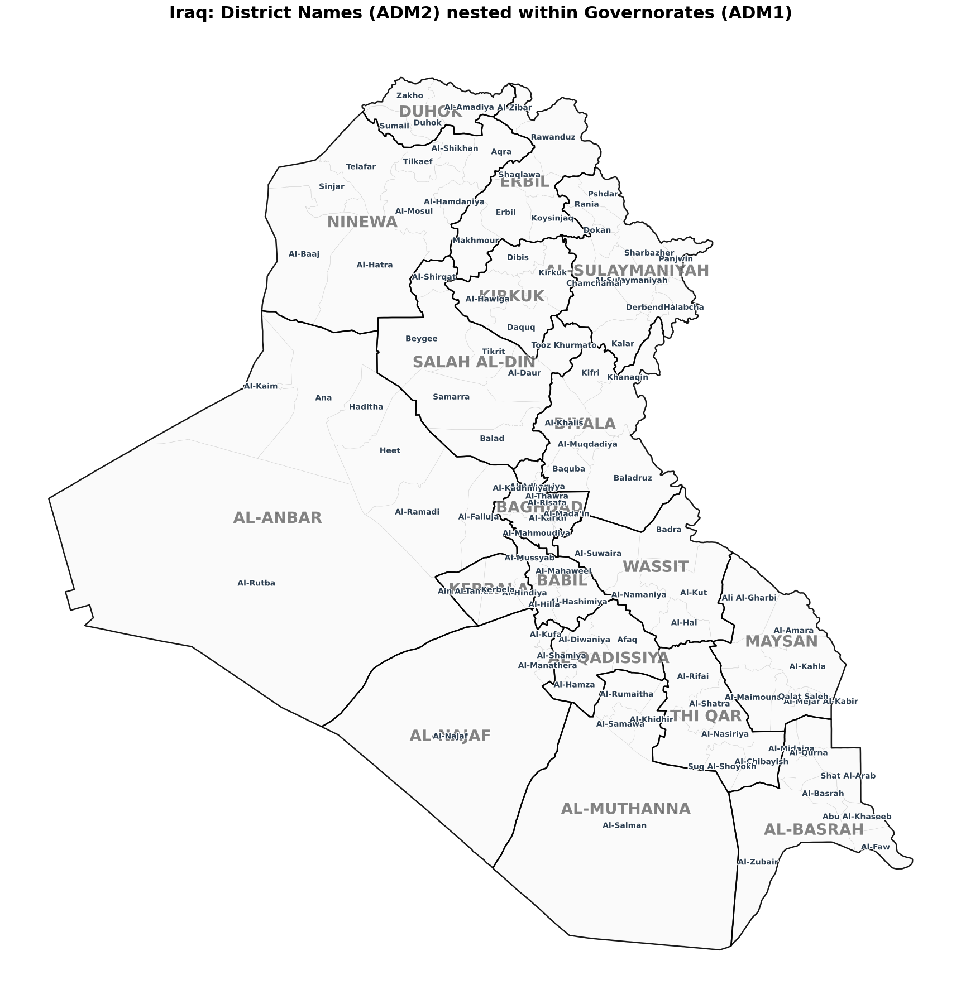

In [2]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

fig, ax = plt.subplots(figsize=(20, 18))

pcoded_gdf_adm2 = gpd.read_file(PROCESSED_DIR / "iraq_adm2.gpkg")
pcoded_gdf_adm2.plot(ax=ax, color='#f9f9f9', edgecolor='#cccccc', linewidth=0.4, alpha=0.8)

adm1_outlines = pcoded_gdf_adm2.dissolve(by='adm1_name')
adm1_outlines.plot(ax=ax, facecolor="none", edgecolor='black', linewidth=1.8, alpha=0.9)

for adm1_name, row in adm1_outlines.iterrows():
    point = row.geometry.representative_point().coords[0]
    ax.annotate(str(adm1_name).upper(), xy=point, ha='center', va='center',
                fontsize=20, color='black', weight='bold', alpha=0.3,
                path_effects=[path_effects.withStroke(linewidth=4, foreground="white", alpha=0.5)])

for _, row in pcoded_gdf_adm2.iterrows():
    point = row.geometry.representative_point().coords[0]
    ax.annotate(row['adm2_name'], xy=point, ha='center', va='center',
                fontsize=10, color='#2c3e50', weight='semibold',
                path_effects=[path_effects.withStroke(linewidth=2, foreground="white")])

ax.set_title("Iraq: District Names (ADM2) nested within Governorates (ADM1)",
             fontsize=22, fontweight='bold', pad=20)
ax.axis('off')
plt.tight_layout()

out_path = FIGURES_DIR / 'iraq_adm2_district_names.png'
plt.savefig(out_path, dpi=150, bbox_inches='tight')
print(f'Saved: {out_path}')
plt.show()


Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\iraq_classification_geo.png
Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\iraq_classification_north.png
Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\iraq_classification_pol.png
Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\iraq_classification_conf.png
Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\iraq_classification_cap.png
Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\iraq_classifications_panel.png


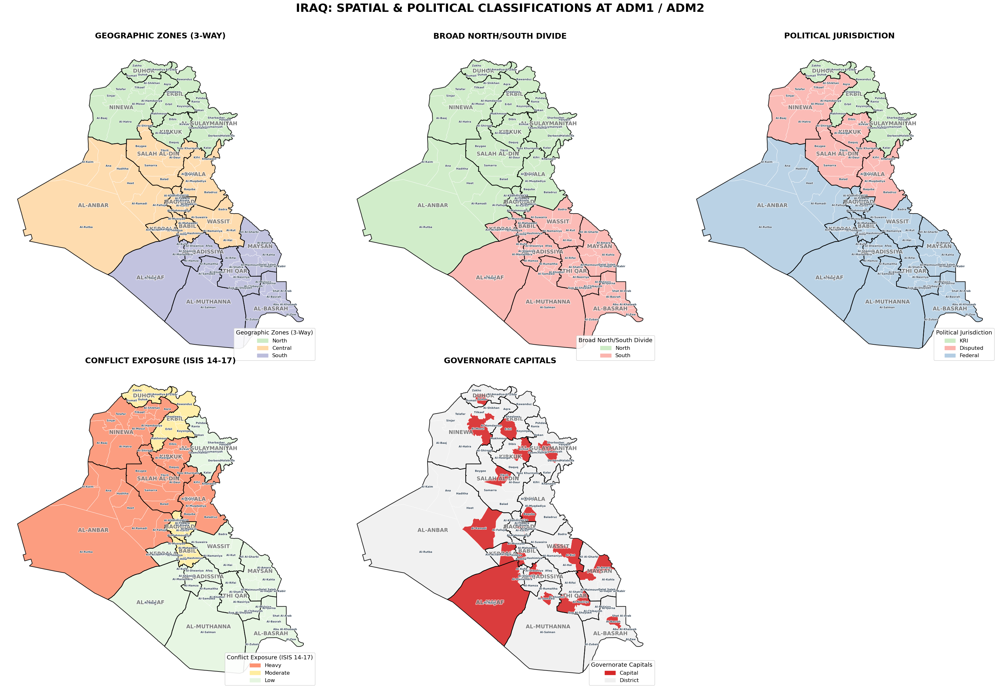

In [3]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.patheffects as path_effects

# 0. Classifications
POLITICAL  = {'KRI': ['Duhok', 'Erbil', 'Al-Sulaymaniyah'],
               'Disputed': ['Kirkuk', 'Ninewa', 'Diyala', 'Salah Al-Din'],
               'Federal': ['Baghdad', 'Al-Anbar', 'Babil', 'Kerbala', 'Al-Najaf', 'Al-Qadissiya', 'Wassit', 'Maysan', 'Al-Basrah', 'Thi Qar', 'Al-Muthanna']}
GEOGRAPHIC = {'North': ['Duhok', 'Erbil', 'Al-Sulaymaniyah', 'Ninewa', 'Kirkuk'],
               'Central': ['Salah Al-Din', 'Diyala', 'Baghdad', 'Al-Anbar', 'Babil', 'Kerbala', 'Wassit'],
               'South': ['Al-Najaf', 'Al-Qadissiya', 'Maysan', 'Thi Qar', 'Al-Muthanna', 'Al-Basrah']}
REGIONS    = {'North': ['Ninewa', 'Al-Anbar', 'Salah Al-Din', 'Kirkuk', 'Diyala', 'Baghdad', 'Duhok', 'Erbil', 'Al-Sulaymaniyah'],
               'South': ['Wassit', 'Thi Qar', 'Al-Basrah', 'Al-Muthanna', 'Al-Najaf', 'Maysan', 'Al-Qadissiya', 'Kerbala', 'Babil']}
CONFLICT   = {'Heavy': ['Ninewa', 'Salah Al-Din', 'Al-Anbar', 'Kirkuk', 'Diyala'],
               'Moderate': ['Baghdad', 'Babil', 'Erbil', 'Duhok'],
               'Low': ['Al-Sulaymaniyah', 'Kerbala', 'Al-Najaf', 'Al-Qadissiya', 'Wassit', 'Maysan', 'Thi Qar', 'Al-Muthanna', 'Al-Basrah']}
CAPITALS   = {'Al-Anbar': ['Al-Ramadi'], 'Al-Basrah': ['Al-Basrah'], 'Al-Muthanna': ['Al-Samawa'],
               'Al-Najaf': ['Al-Najaf'], 'Al-Qadissiya': ['Al-Diwaniya'], 'Al-Sulaymaniyah': ['Al-Sulaymaniyah'],
               'Babil': ['Al-Hilla'], 'Baghdad': ['Al-Karkh', 'Al-Risafa'], 'Diyala': ['Baquba'],
               'Duhok': ['Duhok'], 'Erbil': ['Erbil'], 'Kerbala': ['Kerbela'], 'Kirkuk': ['Kirkuk'],
               'Maysan': ['Al-Amara'], 'Ninewa': ['Al-Mosul'], 'Salah Al-Din': ['Tikrit'],
               'Thi Qar': ['Al-Nasiriya'], 'Wassit': ['Al-Kut']}

# 1. Reverse maps
pol_map      = {adm: cat for cat, govs in POLITICAL.items()  for adm in govs}
geo_map_dict = {adm: cat for cat, govs in GEOGRAPHIC.items() for adm in govs}
north_map    = {adm: cat for cat, govs in REGIONS.items()    for adm in govs}
conf_map     = {adm: cat for cat, govs in CONFLICT.items()   for adm in govs}
capital_districts = [cap for caps in CAPITALS.values() for cap in caps]

# 2. Build GeoDataFrame
geo_map = pcoded_gdf_adm2.loc[:, ~pcoded_gdf_adm2.columns.duplicated()].copy()
geo_map['Geo']   = geo_map['adm1_name'].map(geo_map_dict)
geo_map['Pol']   = geo_map['adm1_name'].map(pol_map)
geo_map['North'] = geo_map['adm1_name'].map(north_map)
geo_map['Conf']  = geo_map['adm1_name'].map(conf_map)
geo_map['Cap']   = geo_map['adm2_standardized'].isin(capital_districts).map({True: 'Capital', False: 'District'})
adm1_outlines = geo_map.dissolve(by='adm1_name')

# 3. Configs
configs = [
    ('Geo',   'Geographic Zones (3-Way)',       {'North': '#ccebc5', 'Central': '#fed9a6', 'South': '#bcbddc'}),
    ('North', 'Broad North/South Divide',       {'North': '#ccebc5', 'South': '#fbb4ae'}),
    ('Pol',   'Political Jurisdiction',         {'KRI': '#ccebc5', 'Disputed': '#fbb4ae', 'Federal': '#b3cde3'}),
    ('Conf',  'Conflict Exposure (ISIS 14-17)', {'Heavy': '#fc9272', 'Moderate': '#ffeda0', 'Low': '#e5f5e0'}),
    ('Cap',   'Governorate Capitals',           {'Capital': '#d62728', 'District': '#f0f0f0'}),
]

def _draw_panel(ax, col, title, colormap):
    geo_map.plot(ax=ax, color=geo_map[col].map(colormap).fillna('#f9f9f9'),
                 edgecolor='white', linewidth=0.6, alpha=0.9)
    adm1_outlines.plot(ax=ax, facecolor="none", edgecolor='black', linewidth=1.5, alpha=0.9)
    for adm1_name, row in adm1_outlines.iterrows():
        pt = row.geometry.representative_point().coords[0]
        ax.annotate(str(adm1_name).upper(), xy=pt, ha='center', va='center',
                    fontsize=12, color='black', weight='bold', alpha=0.35,
                    path_effects=[path_effects.withStroke(linewidth=3, foreground="white", alpha=0.6)])
    for _, row in geo_map.iterrows():
        pt = row.geometry.representative_point().coords[0]
        fw = 'bold' if (col == 'Cap' and row['Cap'] == 'Capital') else 'semibold'
        ax.annotate(row['adm2_name'], xy=pt, ha='center', va='center',
                    fontsize=6, color='#2c3e50', weight=fw,
                    path_effects=[path_effects.withStroke(linewidth=1.5, foreground="white")])
    legend_patches = [mpatches.Patch(color=c, label=k) for k, c in colormap.items()]
    ax.legend(handles=legend_patches, loc='lower right', fontsize=12,
              title=title, title_fontsize=13, framealpha=0.9)
    ax.set_title(title.upper(), fontsize=18, fontweight='black', pad=15)
    ax.axis('off')

# 4. Save each map individually
for col, title, colormap in configs:
    fig_single, ax_single = plt.subplots(figsize=(14, 12))
    _draw_panel(ax_single, col, title, colormap)
    plt.tight_layout()
    slug = col.lower()
    out = FIGURES_DIR / f'iraq_classification_{slug}.png'
    fig_single.savefig(out, dpi=150, bbox_inches='tight')
    print(f'Saved: {out}')
    plt.close(fig_single)

# 5. Save combined 2x3 panel
fig, axes = plt.subplots(2, 3, figsize=(32, 22))
axes = axes.flatten()
for i, (col, title, colormap) in enumerate(configs):
    _draw_panel(axes[i], col, title, colormap)
fig.delaxes(axes[5])
fig.suptitle('IRAQ: SPATIAL & POLITICAL CLASSIFICATIONS AT ADM1 / ADM2',
             fontsize=26, fontweight='black', y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96])

out_panel = FIGURES_DIR / 'iraq_classifications_panel.png'
fig.savefig(out_panel, dpi=150, bbox_inches='tight')
print(f'Saved: {out_panel}')
plt.show()


# Descriptive analysis

['yearmon_str', 'adm2_standardized', 'adm1_name', 'total_events', 'total_best_deaths', 'conflict_incidence', 'fatality_incidence', 'log_events', 'log_deaths', 'total_events_r3', 'total_events_r12', 'total_best_deaths_r3', 'total_best_deaths_r12', 'deaths_per_event', 'p_anom_1m', 'p_anom_3m', 'p_annual_change', 'spi6', 'spi6_drought_frequency_pct', 'spi6_drought_duration', 'spi6_drought_intensity', 'spi6_drought_severity', 'spi6_flood_frequency_pct', 'spi6_flood_duration', 'spi6_flood_intensity', 'spi6_flood_severity', 'p_annual_spread', 'ndvi_anom_1m', 'ndvi_annual_change', 'ndvi_calendar_month_change', 't2m_anom_1m', 't2m_min_anom_1m', 't2m_max_anom_1m', 'sm1_anom_1m', 'sm2_anom_1m', 'sm3_anom_1m', 'sm4_anom_1m', 'sm1_anom_3m', 'sm2_anom_3m', 'sm3_anom_3m', 'sm4_anom_3m', 'streamflow_anom_1m', 'c_wage_non_qualified_labour', 'c_fuel_gas', 'inflation_food_price_index', 'final_idp_count', 'final_returnee_count', 'numPresentIdpInd_filled', 'region_north', 'reconciliation_status']

  DATA 

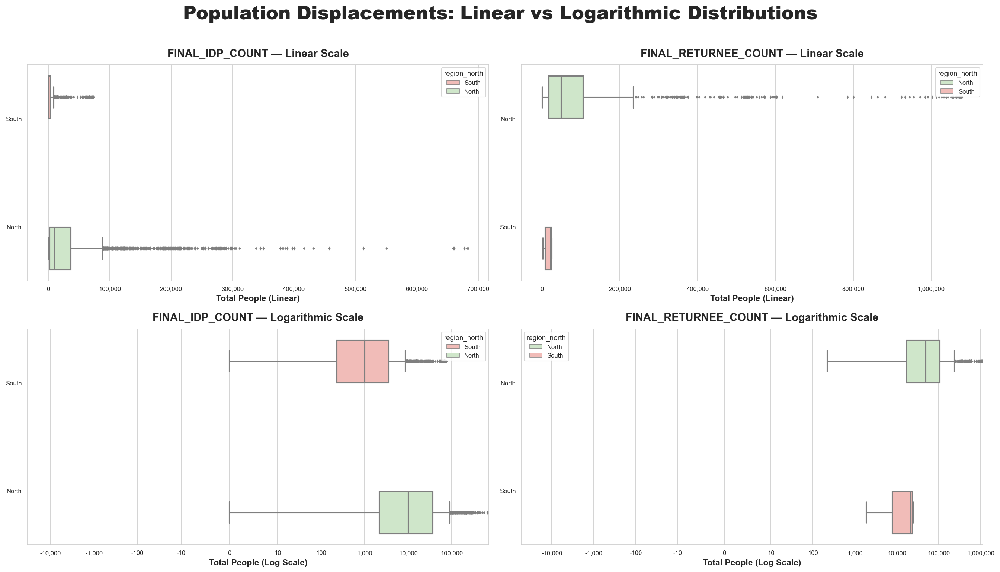

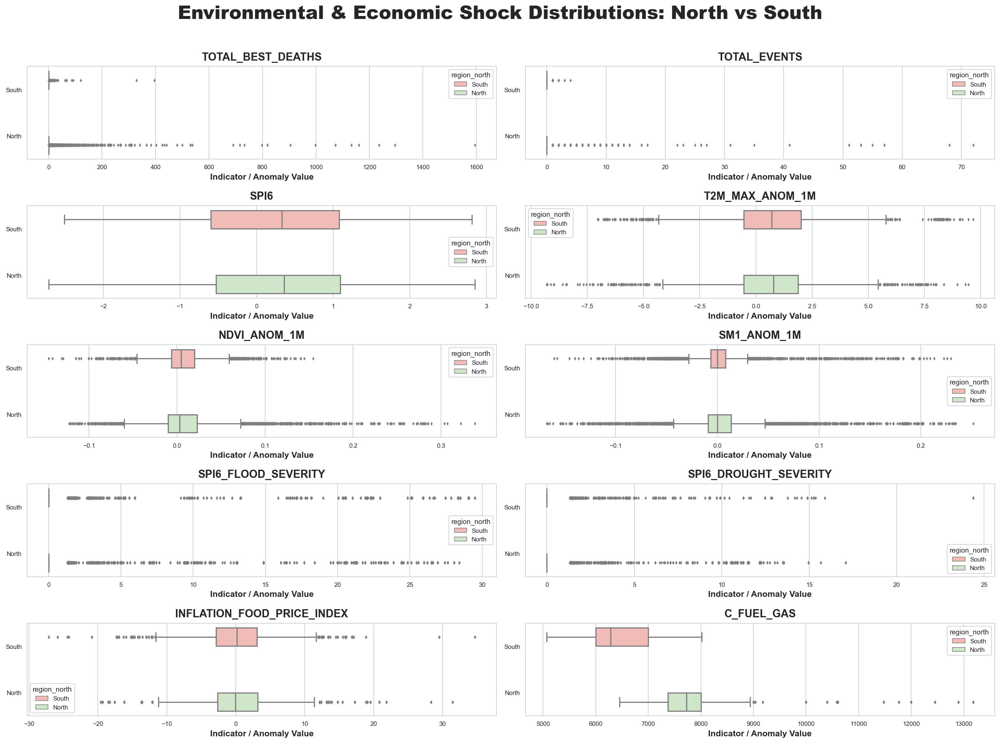

In [68]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns

# ── North/South classification ──
NORTH = {
    'North': ['Ninewa', 'Al-Anbar', 'Salah Al-Din', 'Kirkuk', 'Diyala', 'Baghdad', 'Duhok', 'Erbil', 'Al-Sulaymaniyah'],
    'South': ['Wassit', 'Thi Qar', 'Al-Basrah', 'Al-Muthanna', 'Al-Najaf', 'Maysan', 'Al-Qadissiya', 'Kerbala', 'Babil']
}
north_map = {adm: cat for cat, govs in NORTH.items() for adm in govs}

# ── Aggregate IDP/returnee data ──
idp_data = pd.read_csv(PROCESSED_DIR / 'refined_idp_returnee.csv')
idp_agg = (
    idp_data
    .groupby(['adm2_standardized', 'yearmon'], as_index=False)
    .agg({'reconciliation_status': 'first', 'final_returnee_count': 'mean', 'final_idp_count': 'mean'})
)
idp_agg['yearmon_str'] = idp_agg['yearmon'].astype(str).str[:7]

# ── Derive region_north via master_panel (carries adm1_name) ──
master_panel = pd.read_csv(PROCESSED_DIR / 'master_panel_v2.csv')
_mp = master_panel.merge(idp_agg, on=['adm2_standardized', 'yearmon_str'], how='left')
_mp['region_north'] = _mp['adm1_name'].map(north_map)

# ── Build final panel ──
panel_clean = pd.read_csv(PROCESSED_DIR / 'panel_covariate_2013_2024.csv', encoding='utf-8')
panel_clean['yearmon_str'] = panel_clean['yearmon_str'].astype(str).str[:7]

idp_cols = ['yearmon_str', 'adm2_standardized', 'final_idp_count', 'final_returnee_count', 'numPresentIdpInd_filled', 'region_north','reconciliation_status']
master_panel_df = (
    panel_clean
    .merge(_mp[idp_cols], on=['yearmon_str', 'adm2_standardized'], how='left')
    .query("adm2_standardized != 'Al-Salman'")
    .reset_index(drop=True)
)
print(master_panel_df.columns.tolist())

# ── Variable schema ──
variable_groups = {
    "identifiers":        ["yearmon_str", "yearmon", "adm2_standardized", "adm1_name"],
    "outcome":            ["numPresentIdpInd_raw", "numPresentIdpInd_filled", "final_idp_count", "final_returnee_count"],
    "data_quality":       ["is_interpolated", "reconciliation_status"],
    "conflict":           ["total_best_deaths", "total_events"],
    "economic":           ["c_wage_non_qualified_labour", "c_fuel_gas", "inflation_food_price_index"],
    "precipitation":      ["p_anom_1m", "p_anom_3m", "p_annual_change", "p_annual_spread"],
    "drought":            ["spi6", "spi6_drought_frequency_pct", "spi6_drought_severity", "spi6_drought_intensity", "spi6_drought_duration"],
    "flood":              ["spi6_flood_frequency_pct", "spi6_flood_severity", "spi6_flood_intensity", "spi6_flood_duration"],
    "temperature":        ["t2m_anom_1m", "t2m_min_anom_1m", "t2m_max_anom_1m"],
    "vegetation":         ["ndvi_anom_1m", "ndvi_calendar_month_change", "ndvi_annual_change"],
    "hydrology":          ["streamflow_anom_1m"],
    "soil_moisture":      [c for c in master_panel_df.columns if c.startswith('sm')],
    "geographic_context": ["region_north"],
}


# ══════════════════════════════════════════════════════════════════
# SUMMARY STATS — Coverage & Missingness
# ══════════════════════════════════════════════════════════════════
vars_to_summarize = [
    'final_idp_count', 'final_returnee_count', 'total_best_deaths', 'total_events',
    'spi6', 't2m_max_anom_1m', 'ndvi_anom_1m', 'sm1_anom_1m',
    'spi6_flood_severity', 'spi6_drought_severity',
    'inflation_food_price_index', 'c_fuel_gas',
]
palette   = {'North': '#ccebc5', 'South': '#fbb4ae'}
df_summary = master_panel_df[master_panel_df['yearmon_str'] >= '2014-01'].copy()

records = []
for region in ['North', 'South']:
    region_data = df_summary[df_summary['region_north'] == region]
    n_total = len(region_data)
    for var in vars_to_summarize:
        if var not in region_data.columns:
            continue
        v = region_data.dropna(subset=[var])
        records.append({
            'Variable': var, 'Region': region,
            'N_Districts': v['adm2_standardized'].nunique(),
            'N_Months':    v['yearmon_str'].nunique(),
            'Start':       v['yearmon_str'].min() if len(v) else 'N/A',
            'End':         v['yearmon_str'].max() if len(v) else 'N/A',
            'Total_Obs':   n_total,
            'Missing':     n_total - len(v),
            'Coverage_%':  round(100 * len(v) / n_total, 1),
            'Mean':        round(v[var].mean(), 3),
            'Std':         round(v[var].std(), 3),
            'Min':         round(v[var].min(), 3),
            'P25':         round(v[var].quantile(0.25), 3),
            'Median':      round(v[var].median(), 3),
            'P75':         round(v[var].quantile(0.75), 3),
            'Max':         round(v[var].max(), 3),
        })

summary_table = pd.DataFrame(records).set_index(['Variable', 'Region'])
print("\n  DATA QUALITY & DISTRIBUTION SUMMARY: NORTH VS SOUTH (2014–Present)")
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.width', 150):
    print(summary_table)

# ── Save summary table ──
TABLES_DIR = PROJECT_ROOT / 'results' / 'tables'
TABLES_DIR.mkdir(parents=True, exist_ok=True)

out_csv = TABLES_DIR / 'summary_stats_north_south_2014_present.csv'
summary_table.to_csv(out_csv)
print(f'Saved: {out_csv}')

print("\n  DATA QUALITY & DISTRIBUTION SUMMARY: NORTH VS SOUTH (2014–Present)")
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.width', 150):
    print(summary_table)


# ══════════════════════════════════════════════════════════════════
# FIGURE 1 — Population Distributions (Linear vs Log)
# ══════════════════════════════════════════════════════════════════
sns.set_style("whitegrid")
pop_vars = ['final_idp_count', 'final_returnee_count']
fig1, axes1 = plt.subplots(2, 2, figsize=(18, 10))
fmt = mticker.FuncFormatter(lambda val, _: f"{int(val):,}")

for idx, var in enumerate(pop_vars):
    plot_data = df_summary.dropna(subset=[var, 'region_north'])

    ax_lin = axes1[0, idx]
    sns.boxplot(data=plot_data, x=var, y='region_north', hue='region_north',
                ax=ax_lin, palette=palette, fliersize=2)
    ax_lin.set_title(f"{var.upper()} — Linear Scale", fontsize=14, fontweight='bold', pad=10)
    ax_lin.set_xlabel('Total People (Linear)', fontsize=11, fontweight='bold')
    ax_lin.set_ylabel('')
    ax_lin.xaxis.set_major_formatter(fmt)

    ax_log = axes1[1, idx]
    sns.boxplot(data=plot_data, x=var, y='region_north', hue='region_north',
                ax=ax_log, palette=palette, fliersize=2)
    ax_log.set_xscale('symlog', linthresh=10)
    ax_log.set_title(f"{var.upper()} — Logarithmic Scale", fontsize=14, fontweight='bold', pad=10)
    ax_log.set_xlabel('Total People (Log Scale)', fontsize=11, fontweight='bold')
    ax_log.set_ylabel('')
    ax_log.xaxis.set_major_formatter(fmt)

fig1.suptitle("Population Displacements: Linear vs Logarithmic Distributions",
              fontsize=24, fontweight='black', y=1.02)
plt.tight_layout(h_pad=1.5)
fig1.savefig(FIGURES_DIR / 'dist_population_linear_vs_log.png', dpi=150, bbox_inches='tight')
plt.show()


# ══════════════════════════════════════════════════════════════════
# FIGURE 2 — Environmental & Economic Distributions
# ══════════════════════════════════════════════════════════════════
other_vars = [v for v in vars_to_summarize if v not in pop_vars]
fig2, axes2 = plt.subplots(5, 2, figsize=(18, 13))
axes2 = axes2.flatten()

for i, var in enumerate(other_vars):
    plot_data = df_summary.dropna(subset=[var, 'region_north'])
    sns.boxplot(data=plot_data, x=var, y='region_north', hue='region_north',
                ax=axes2[i], palette=palette, fliersize=2, linewidth=1.5)
    axes2[i].set_title(var.upper(), fontsize=14, fontweight='bold', pad=8)
    axes2[i].set_ylabel('')
    axes2[i].set_xlabel('Indicator / Anomaly Value', fontsize=11, fontweight='bold')

fig2.suptitle("Environmental & Economic Shock Distributions: North vs South",
              fontsize=24, fontweight='black', y=1.02)
plt.tight_layout(h_pad=1.5)
fig2.savefig(FIGURES_DIR / 'dist_environmental_economic.png', dpi=150, bbox_inches='tight')
plt.show()

In [6]:
BASE_VARS = [
    'total_best_deaths', 'total_events', 'spi6', 'spi6_flood_severity',
    'spi6_drought_severity', 't2m_max_anom_1m', 'ndvi_anom_1m',
    'sm1_anom_1m', 'inflation_food_price_index', 'c_fuel_gas',
    'total_best_deaths',
]

WINDOWS = {
    'L1_3':   [1, 2, 3],
    'L4_6':   [4, 5, 6],
    'L7_9':   [7, 8, 9],
    'L10_12': [10, 11, 12],
}

def add_window_means(df, var):
    g = df.groupby('adm2_standardized')[var]
    for tag, lags in WINDOWS.items():
        pieces = pd.concat([g.shift(L) for L in lags], axis=1)
        df[f'{var}_{tag}'] = pieces.mean(axis=1).where(pieces.notna().all(axis=1))
    return df

master_panel_df = master_panel_df.sort_values(['adm2_standardized', 'yearmon_str']).reset_index(drop=True)

for var in BASE_VARS:
    if var in master_panel_df.columns:
        master_panel_df = add_window_means(master_panel_df, var)

lag_cols = [c for c in master_panel_df.columns if any(f'_{w}' in c for w in WINDOWS)]
print(f"Lag columns added: {len(lag_cols)}  ({len(BASE_VARS)} vars x {len(WINDOWS)} windows)")

# ── Subset panel ──
master_panel_df_sub = master_panel_df[
    master_panel_df['numPresentIdpInd_filled'].notna() &
    master_panel_df['yearmon_str'].between('2014-04', '2024-08')
].copy()


Lag columns added: 40  (11 vars x 4 windows)


Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_total_best_deaths.png


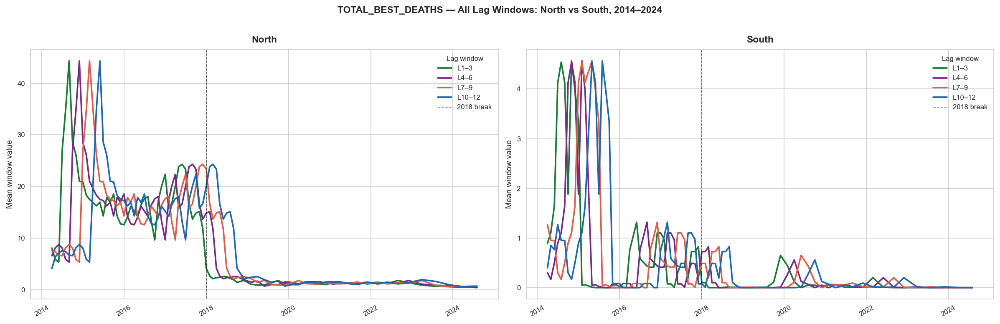

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_total_events.png


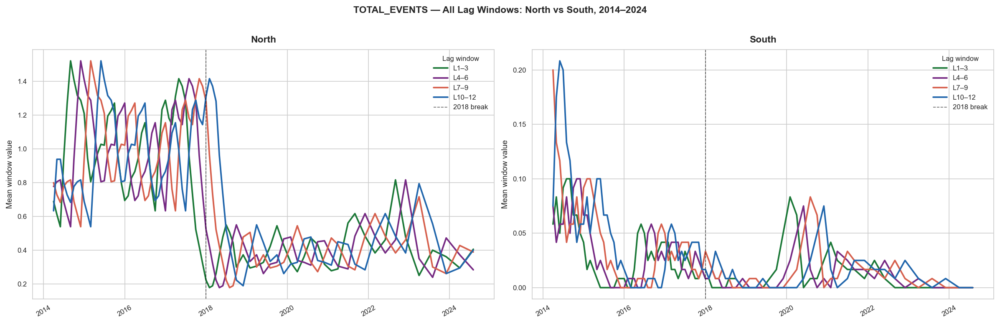

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_spi6.png


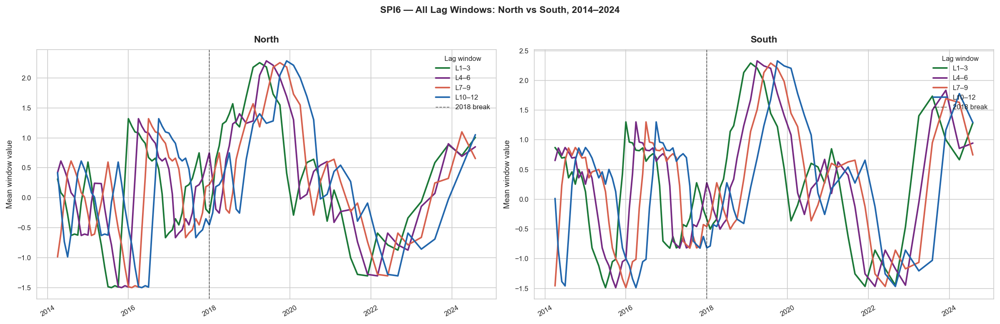

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_spi6_flood_severity.png


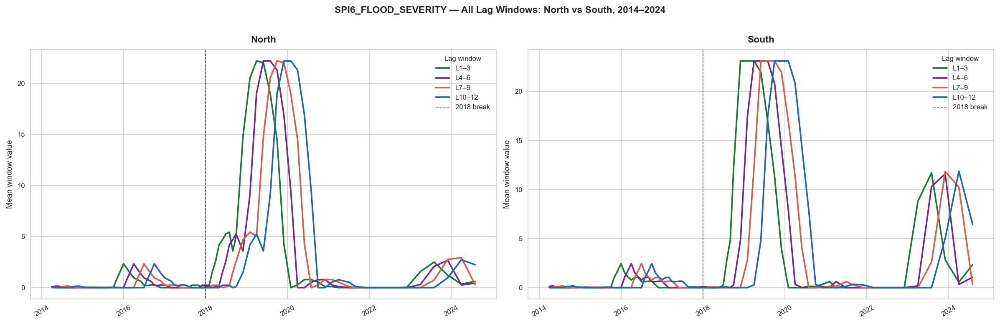

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_spi6_drought_severity.png


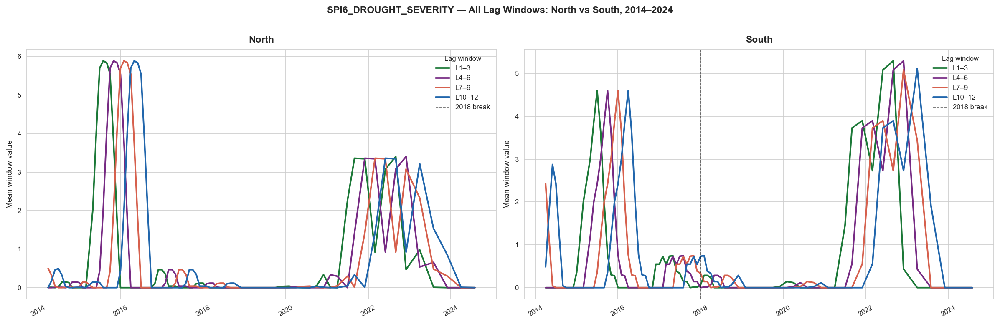

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_t2m_max_anom_1m.png


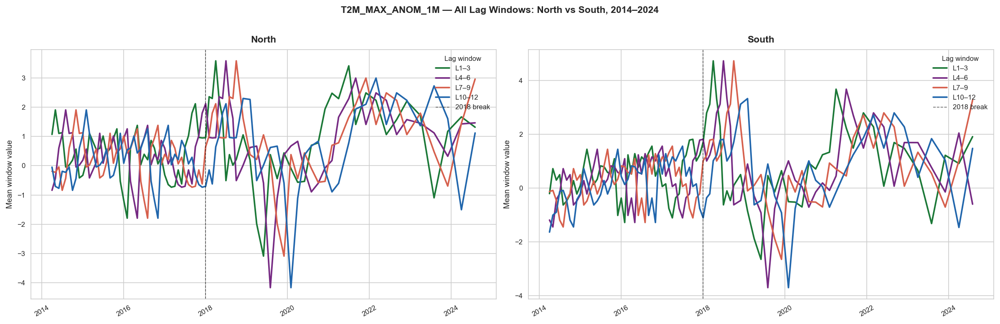

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_ndvi_anom_1m.png


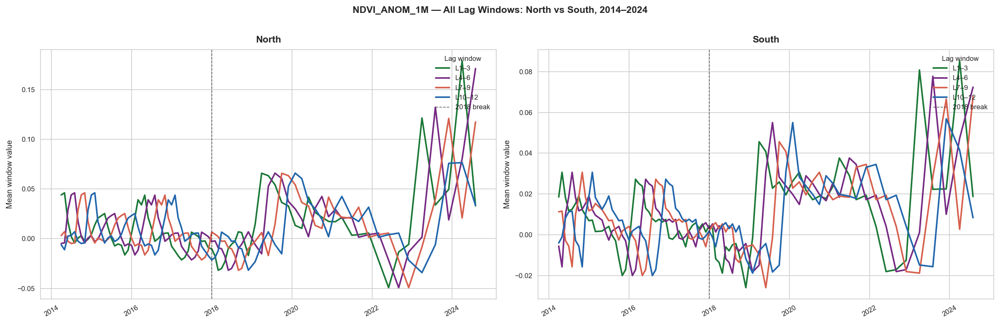

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_sm1_anom_1m.png


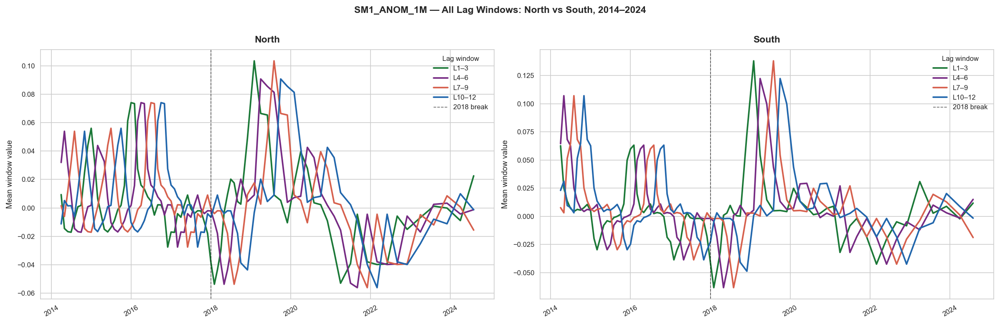

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_inflation_food_price_index.png


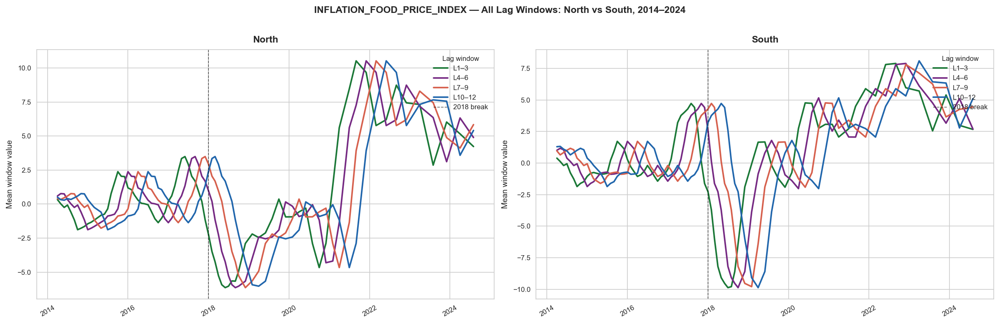

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\trend_lag_c_fuel_gas.png


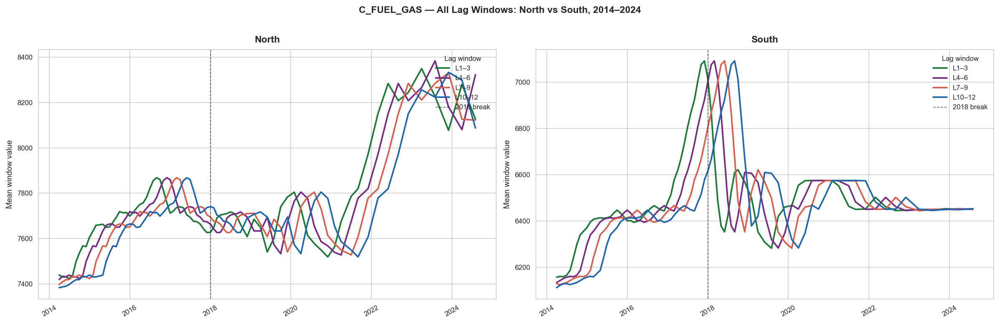

In [10]:
import matplotlib.pyplot as plt

plt.rcParams.update({
    'font.family':     'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'font.size': 8, 'axes.titlesize': 10, 'axes.labelsize': 9,
    'xtick.labelsize': 8, 'ytick.labelsize': 8, 'figure.dpi': 150,
})

BASE_VARS_UNIQUE = list(dict.fromkeys(BASE_VARS))
WINDOW_COLORS    = {'L1_3': '#1b7837', 'L4_6': '#762a83',
                    'L7_9': '#d6604d', 'L10_12': '#2166ac'}

df_lag = master_panel_df_sub.dropna(subset=['region_north']).copy()
df_lag['yearmon_dt'] = pd.to_datetime(df_lag['yearmon_str'], format='%Y-%m')

for var in BASE_VARS_UNIQUE:
    lag_cols = {tag: f'{var}_{tag}' for tag in WINDOWS
                if f'{var}_{tag}' in df_lag.columns}
    if not lag_cols:
        print(f"No lag columns for {var}, skipping.")
        continue

    fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=False)

    for ax, region in zip(axes, ['North', 'South']):
        reg_df = df_lag[df_lag['region_north'] == region]

        for tag, col in lag_cols.items():
            mean = reg_df.dropna(subset=[col]).groupby('yearmon_dt')[col].mean()
            ax.plot(mean.index, mean.values, color=WINDOW_COLORS[tag],
                    lw=1.8, label=tag.replace('_', '–'))

        ax.axvline(pd.Timestamp('2018-01-01'), color='k',
                   ls='--', lw=0.8, alpha=0.6, label='2018 break')
        ax.set_title(region, fontsize=11, fontweight='bold', pad=8)
        ax.set_ylabel('Mean window value', fontsize=9)
        ax.tick_params(axis='x', rotation=30, length=3, width=0.6)
        ax.tick_params(axis='y', length=3, width=0.6)
        ax.legend(fontsize=8, frameon=False, title='Lag window',
                  title_fontsize=8, loc='upper right')

    fig.suptitle(f'{var.upper()} — All Lag Windows: North vs South, 2014–2024',
                 fontsize=11, fontweight='bold', y=1.02)
    plt.tight_layout()

    fname = f'trend_lag_{var.lower()}.png'
    fig.savefig(FIGURES_DIR / fname, dpi=300, bbox_inches='tight')
    print(f'Saved: {FIGURES_DIR / fname}')
    plt.show()


Districts requiring imputation: ['Rawanduz', 'Sinjar']


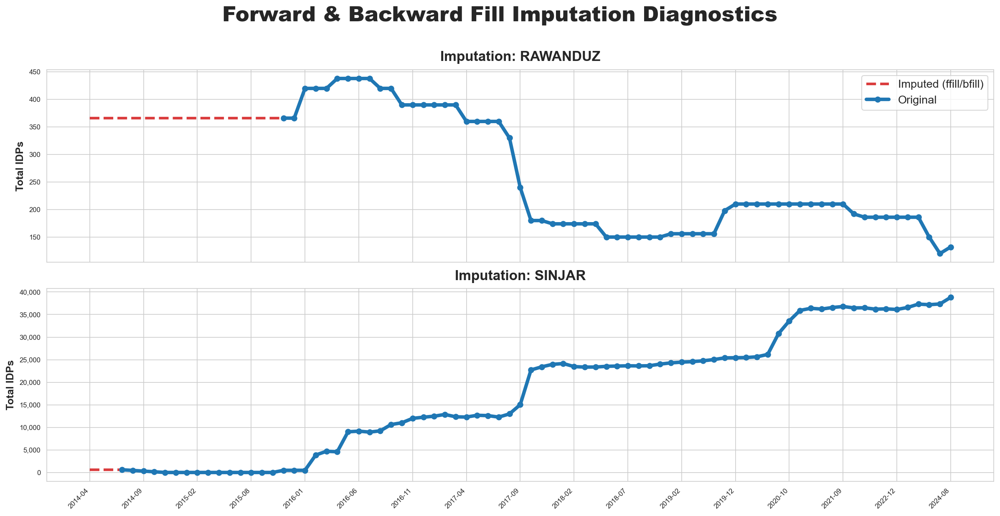

Patched: 0 missing values remain.


In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter

# ── Identify districts with missing IDP counts ──
missing_counts    = master_panel_df_sub.groupby('adm2_standardized')['final_idp_count'].apply(lambda x: x.isna().sum())
districts_to_fix  = missing_counts[missing_counts > 0].index.tolist()

if not districts_to_fix:
    print("No missing data found. Nothing to fix.")
else:
    print(f"Districts requiring imputation: {districts_to_fix}")

    fix_df = (
        master_panel_df_sub[master_panel_df_sub['adm2_standardized'].isin(districts_to_fix)]
        .copy()
        .sort_values(['adm2_standardized', 'yearmon_str'])
    )
    fix_df['idp_fixed'] = fix_df.groupby('adm2_standardized')['final_idp_count'].transform(
        lambda x: x.ffill().bfill()
    )

    sns.set_style("whitegrid")
    n = len(districts_to_fix)
    fig, axes = plt.subplots(n, 1, figsize=(16, 4 * n), sharex=True)
    if n == 1:
        axes = [axes]

    all_months = sorted(fix_df['yearmon_str'].unique())
    step = max(1, len(all_months) // 15)

    for i, district in enumerate(districts_to_fix):
        ax  = axes[i]
        d   = fix_df[fix_df['adm2_standardized'] == district]

        ax.plot(d['yearmon_str'], d['idp_fixed'],
                color='#d62728', linewidth=3, linestyle='--', alpha=0.9, label='Imputed (ffill/bfill)')
        ax.plot(d['yearmon_str'], d['final_idp_count'],
                color='#1f77b4', linewidth=4, marker='o', markersize=6, label='Original')

        ax.set_title(f"Imputation: {district.upper()}", fontsize=16, fontweight='bold', pad=10)
        ax.set_ylabel('Total IDPs', fontsize=12, fontweight='bold')
        ax.yaxis.set_major_formatter(FuncFormatter(lambda val, _: f"{int(val):,}"))
        if i == 0:
            ax.legend(fontsize=13, loc='upper right')

    axes[-1].set_xticks(range(0, len(all_months), step))
    axes[-1].set_xticklabels(all_months[::step], rotation=45, ha='right')

    fig.suptitle("Forward & Backward Fill Imputation Diagnostics", fontsize=24, fontweight='black', y=1.02)
    plt.tight_layout()
    fig.savefig(FIGURES_DIR / 'imputation_diagnostics_idp.png', dpi=150, bbox_inches='tight')
    plt.show()

# ── Commit fix to master ──
master_panel_df_sub = master_panel_df_sub.sort_values(['adm2_standardized', 'yearmon_str'])
master_panel_df_sub['final_idp_count'] = master_panel_df_sub.groupby('adm2_standardized')['final_idp_count'].transform(
    lambda x: x.ffill().bfill()
)
print(f"Patched: {master_panel_df_sub['final_idp_count'].isna().sum()} missing values remain.")


# Regression

## 1) Spatiotemporal Heatmap Generation

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\heatmap_idp_absolute_north_south.png


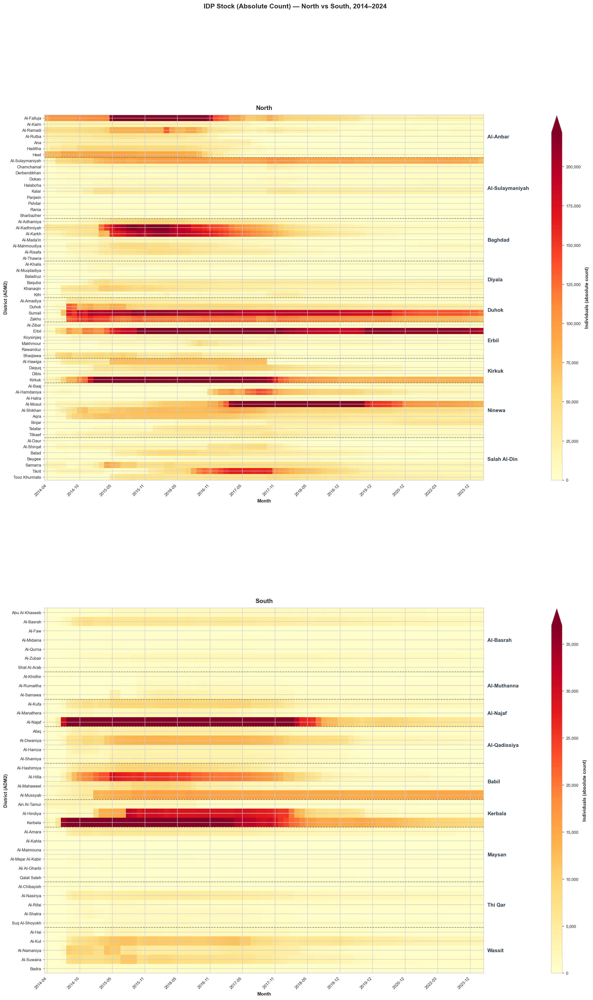

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\heatmap_returnee_absolute_north_south.png


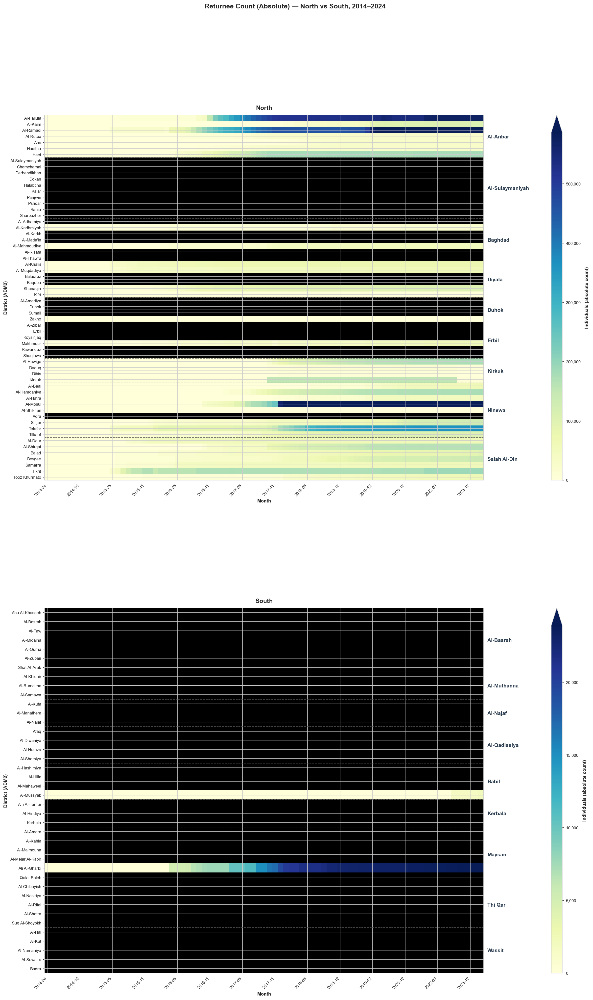

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
import copy

# ── Nature figure style ──
plt.rcParams.update({
    'font.family':       'sans-serif',
    'font.sans-serif':   ['Arial', 'Helvetica', 'DejaVu Sans'],
    'font.size':         8,
    'axes.titlesize':    10,
    'axes.labelsize':    9,
    'xtick.labelsize':   8,
    'ytick.labelsize':   8,
    'legend.fontsize':   8,
    'figure.dpi':        150,
})

plot_df = master_panel_df_sub[
    master_panel_df_sub['yearmon_str'].between('2014-04', '2024-08') &
    master_panel_df_sub['numPresentIdpInd_filled'].notna()
].copy()

def get_raw_panel(df, subset_districts, value_col):
    pivot = df.pivot_table(index='adm2_standardized', columns='yearmon_str',
                           values=value_col, aggfunc='sum').reindex(subset_districts)
    pivot.loc[(pivot == 0).all(axis=1)] = np.nan
    return pivot

def get_boundaries(labels):
    ticks, labels_out, bounds = [], [], []
    prev, start = None, 0
    for i, name in enumerate(labels):
        if name != prev:
            if prev is not None:
                ticks.append((start + i - 1) / 2)
                labels_out.append(prev)
                bounds.append(i - 0.5)
            start, prev = i, name
    ticks.append((start + len(labels) - 1) / 2)
    labels_out.append(prev)
    return ticks, labels_out, bounds

cmap_idp = copy.copy(plt.get_cmap('YlOrRd')); cmap_idp.set_bad(color='black')
cmap_ret = copy.copy(plt.get_cmap('YlGnBu')); cmap_ret.set_bad(color='black')

regions = {}
for region in ['North', 'South']:
    reg_df  = plot_df[plot_df['region_north'] == region]
    adm_map = (reg_df.groupby('adm2_standardized')['adm1_name'].first()
                     .reset_index()
                     .sort_values(['adm1_name', 'adm2_standardized']))
    sorted_adm2 = adm_map['adm2_standardized'].tolist()
    adm1_labels = adm_map.set_index('adm2_standardized')['adm1_name'].tolist()
    regions[region] = {
        'idp':   get_raw_panel(reg_df, sorted_adm2, 'final_idp_count'),
        'ret':   get_raw_panel(reg_df, sorted_adm2, 'final_returnee_count'),
        'ticks': get_boundaries(adm1_labels),
    }

def draw_heatmap_fig(value_key, cmap, suptitle, fname):
    fig = plt.figure(figsize=(18, 30))
    gs  = gridspec.GridSpec(2, 2, width_ratios=[20, 0.5], hspace=0.35, wspace=0.3)

    for row_idx, region in enumerate(['North', 'South']):
        pivot = regions[region][value_key]
        adm1_ticks, adm1_labs, adm1_bounds = regions[region]['ticks']

        ax     = fig.add_subplot(gs[row_idx, 0])
        masked = np.ma.masked_invalid(pivot.values)
        v_max  = np.nanpercentile(masked.compressed(), 98) if masked.compressed().size else 1
        im     = ax.imshow(masked, aspect='auto', cmap=cmap, vmin=0, vmax=v_max)

        # District labels (left y-axis)
        ax.set_yticks(range(len(pivot)))
        ax.set_yticklabels(pivot.index, fontsize=8)
        ax.tick_params(axis='y', length=3, width=0.6)

        # Governorate labels (right y-axis)
        ax_adm = ax.twinx()
        ax_adm.set_ylim(ax.get_ylim())
        ax_adm.set_yticks(adm1_ticks)
        ax_adm.set_yticklabels(adm1_labs, fontsize=10, fontweight='bold', color='#2c3e50')
        ax_adm.tick_params(right=False)

        # Governorate boundary lines
        for b in adm1_bounds:
            ax.axhline(y=b, color='#555555', lw=1.0, ls='--', alpha=0.8)

        # X-axis: every 6 months
        step = 6
        ax.set_xticks(range(0, len(pivot.columns), step))
        ax.set_xticklabels(pivot.columns[::step], rotation=45, ha='right', fontsize=8)
        ax.tick_params(axis='x', length=3, width=0.6)

        ax.set_title(f'{region}', fontsize=12, fontweight='bold', pad=10)
        ax.set_xlabel('Month', fontsize=9, fontweight='bold')
        ax.set_ylabel('District (ADM2)', fontsize=9, fontweight='bold')

        # Colorbar
        cb_ax = fig.add_subplot(gs[row_idx, 1])
        cb    = plt.colorbar(im, cax=cb_ax, extend='max')
        cb.set_label('Individuals (absolute count)', fontsize=9, fontweight='bold', labelpad=8)
        cb.ax.tick_params(labelsize=8)
        cb.ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):,}"))

    fig.suptitle(suptitle, fontsize=13, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.98])

    fig.savefig(FIGURES_DIR / fname, dpi=300, bbox_inches='tight')
    print(f'Saved: {FIGURES_DIR / fname}')
    plt.show()

draw_heatmap_fig('idp', cmap_idp,
                 'IDP Stock (Absolute Count) — North vs South, 2014–2024',
                 'heatmap_idp_absolute_north_south.png')

draw_heatmap_fig('ret', cmap_ret,
                 'Returnee Count (Absolute) — North vs South, 2014–2024',
                 'heatmap_returnee_absolute_north_south.png')


Expected months : 125
Present months  : 81
Missing months  : 44
  -> ['2015-04', '2018-11', '2019-01', '2019-03', '2019-05', '2019-07', '2019-09', '2019-11', '2020-01', '2020-03', '2020-05', '2020-07', '2020-09', '2020-11', '2021-01', '2021-03', '2021-05', '2021-06', '2021-08', '2021-10', '2021-11', '2022-01', '2022-02', '2022-04', '2022-05', '2022-07', '2022-08', '2022-10', '2022-11', '2023-01', '2023-02', '2023-03', '2023-05', '2023-06', '2023-07', '2023-09', '2023-10', '2023-11', '2024-01', '2024-02', '2024-03', '2024-05', '2024-06', '2024-07']
Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\diagnostic_month_coverage.png


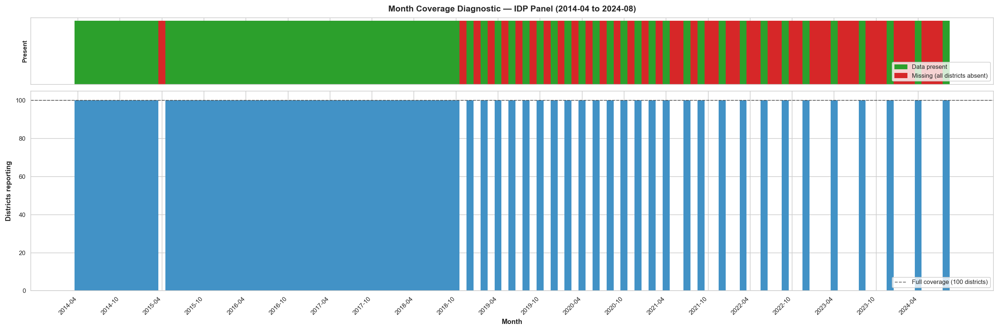

In [16]:
# ── Full expected month spine ──
full_spine = pd.date_range('2014-04', '2024-08', freq='MS').strftime('%Y-%m').tolist()

# ── Actual months present in plot_df (after numPresentIdpInd_filled filter) ──
present_months = set(plot_df['yearmon_str'].unique())
missing_months = sorted([m for m in full_spine if m not in present_months])

print(f"Expected months : {len(full_spine)}")
print(f"Present months  : {len(present_months)}")
print(f"Missing months  : {len(missing_months)}")
if missing_months:
    print(f"  -> {missing_months}")

# ── Coverage per month (how many districts report) ──
n_districts_total = plot_df['adm2_standardized'].nunique()
coverage = (
    plot_df.groupby('yearmon_str')['adm2_standardized']
    .nunique()
    .reindex(full_spine, fill_value=0)
    .reset_index()
)
coverage.columns = ['yearmon_str', 'n_districts']
coverage['pct']    = 100 * coverage['n_districts'] / n_districts_total
coverage['missing'] = coverage['n_districts'] == 0

# ── Plot ──
fig, axes = plt.subplots(2, 1, figsize=(18, 6), sharex=True,
                         gridspec_kw={'height_ratios': [1, 3]})

# Top strip: binary present / absent
ax0 = axes[0]
for i, row in coverage.iterrows():
    ax0.bar(i, 1, color='#d62728' if row['missing'] else '#2ca02c', width=1.0, linewidth=0)
ax0.set_yticks([])
ax0.set_ylabel('Present', fontsize=8, fontweight='bold')
ax0.set_title('Month Coverage Diagnostic — IDP Panel (2014-04 to 2024-08)',
              fontsize=11, fontweight='bold', pad=8)
legend_handles = [mpatches.Patch(color='#2ca02c', label='Data present'),
                  mpatches.Patch(color='#d62728', label='Missing (all districts absent)')]
ax0.legend(handles=legend_handles, fontsize=8, loc='lower right')

# Bottom: district count per month
ax1 = axes[1]
colors = ['#d62728' if m else '#4292c6' for m in coverage['missing']]
ax1.bar(range(len(coverage)), coverage['n_districts'], color=colors, width=1.0, linewidth=0)
ax1.axhline(n_districts_total, color='#333333', lw=1.0, ls='--', alpha=0.7,
            label=f'Full coverage ({n_districts_total} districts)')
ax1.set_ylabel('Districts reporting', fontsize=9, fontweight='bold')
ax1.set_xlabel('Month', fontsize=9, fontweight='bold')
ax1.legend(fontsize=8)

# X-axis: label every 6 months
step = 6
ax1.set_xticks(range(0, len(full_spine), step))
ax1.set_xticklabels(full_spine[::step], rotation=45, ha='right', fontsize=8)
ax1.tick_params(axis='both', length=3, width=0.6)

plt.tight_layout()
fig.savefig(FIGURES_DIR / 'diagnostic_month_coverage.png', dpi=300, bbox_inches='tight')
print(f"Saved: {FIGURES_DIR / 'diagnostic_month_coverage.png'}")
plt.show()


## 2) Creating Spatial Matrix

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\spillover_al_mosul_k_comparison.png


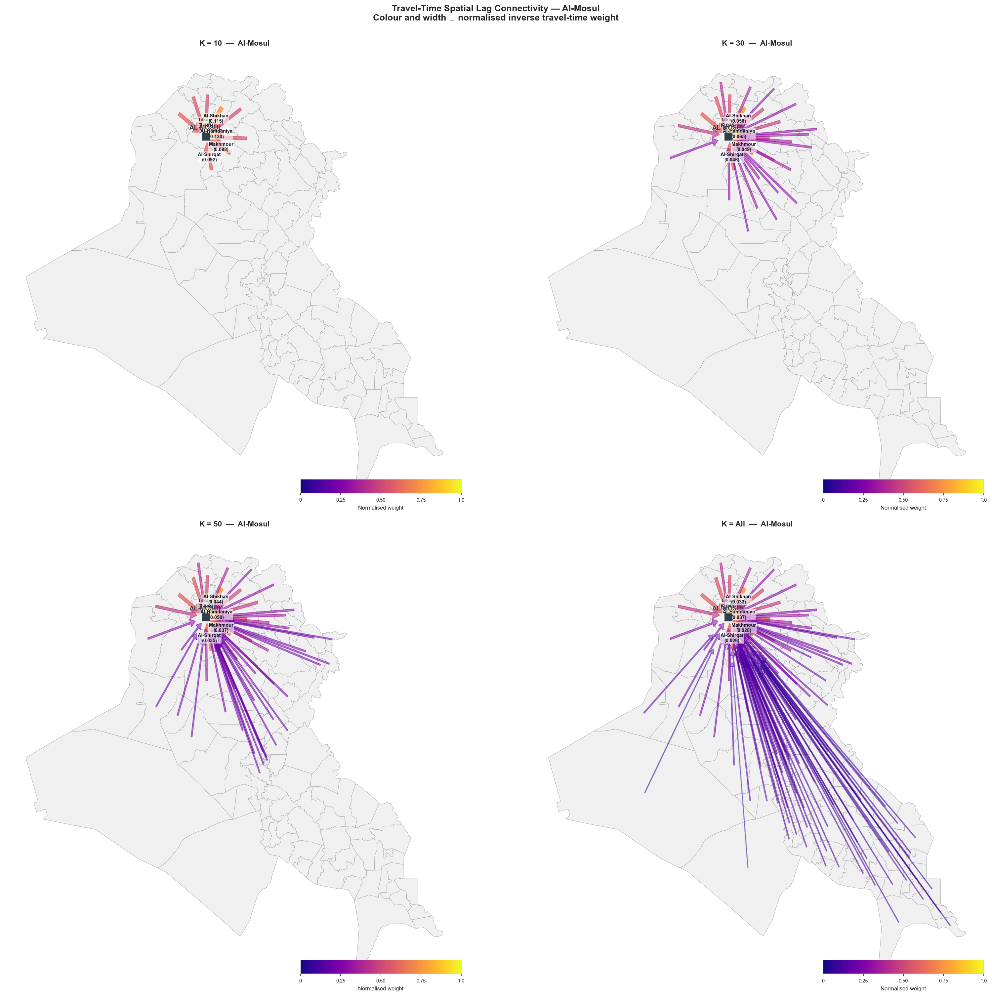

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\spillover_al_rutba_k_comparison.png


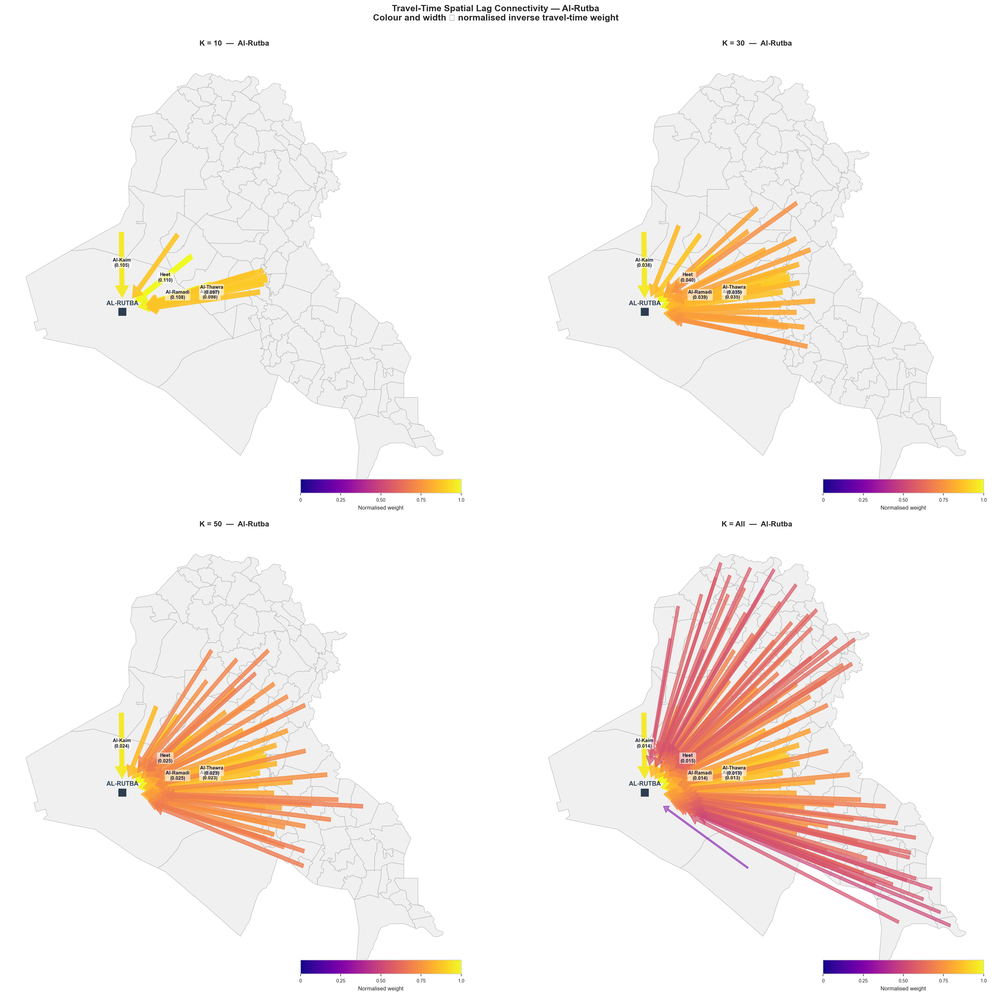

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\spillover_al_basrah_k_comparison.png


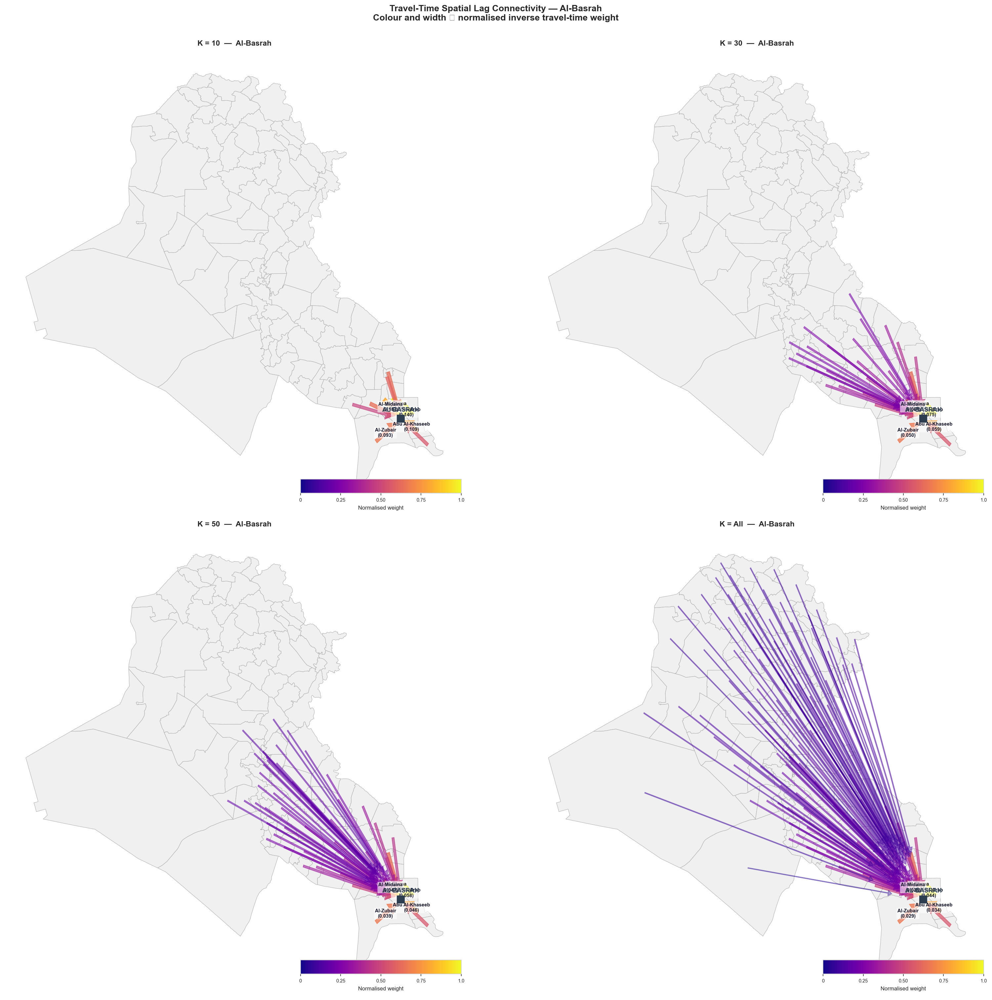

In [17]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.patches import FancyArrow
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

plt.rcParams.update({
    'font.family':     'sans-serif',
    'font.sans-serif': ['Arial', 'Helvetica', 'DejaVu Sans'],
    'font.size':        9,
    'axes.titlesize':  11,
    'figure.dpi':      150,
})

def build_spatial_matrix(tt_matrix, panel_df, k_neighbors=20):
    panel_districts = sorted(panel_df['adm2_standardized'].dropna().unique())
    shared = sorted(set(panel_districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt_aligned = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt_aligned, np.inf)
    W_raw = 1.0 / tt_aligned
    W_raw[~np.isfinite(W_raw)] = 0
    W = np.zeros_like(W_raw)
    for i in range(len(shared)):
        top_k = np.argsort(W_raw[i])[-k_neighbors:]
        W[i, top_k] = W_raw[i, top_k]
    row_sums = W.sum(axis=1, keepdims=True)
    W = np.where(row_sums > 0, W / row_sums, 0)
    return W, shared

tt = pd.read_csv(PROCESSED_DIR / 'travel_time_matrix.csv', index_col=0)

panel_districts  = sorted(master_panel_df['adm2_standardized'].dropna().unique())
shared_districts = sorted(set(panel_districts) & set(tt.index) & set(tt.columns))
max_neighbors    = max(len(shared_districts) - 1, 1)

map_gdf = pcoded_gdf_adm2[pcoded_gdf_adm2['adm2_standardized'].isin(shared_districts)].copy()
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    map_gdf['centroid'] = map_gdf.geometry.centroid

centroid_lookup = {row['adm2_standardized']: row['centroid'].coords[0]
                   for _, row in map_gdf.iterrows()}

weight_cmap = cm.plasma
norm        = mcolors.Normalize(vmin=0, vmax=1)
k_values    = [10, 30, 50, max_neighbors]
k_labels    = ['K = 10', 'K = 30', 'K = 50', 'K = All']

def draw_connectivity_fig(origin_district):
    if origin_district not in shared_districts:
        print(f"'{origin_district}' not found. Available:\n{shared_districts}")
        return

    fig, axes = plt.subplots(2, 2, figsize=(22, 20))
    axes = axes.flatten()

    for ax, k, label in zip(axes, k_values, k_labels):
        k_use = min(k, max_neighbors)
        W, _  = build_spatial_matrix(tt, master_panel_df, k_neighbors=k_use)

        map_gdf.plot(ax=ax, color='#f0f0f0', edgecolor='#aaaaaa', linewidth=0.5)

        idx    = shared_districts.index(origin_district)
        row    = W[idx]
        ox, oy = centroid_lookup[origin_district]

        non_zero = np.where(row > 0)[0]
        top_idx  = non_zero[np.argsort(row[non_zero])[-k_use:][::-1]]
        max_wt   = row[top_idx[0]] if len(top_idx) else 1.0

        for j in top_idx:
            dest = shared_districts[j]
            if dest not in centroid_lookup:
                continue
            dx, dy = centroid_lookup[dest]
            nw    = row[j] / max_wt
            raw_w = row[j]
            dvx, dvy = dx - ox, dy - oy
            if np.hypot(dvx, dvy) == 0:
                continue

            ax.add_patch(FancyArrow(
                dx, dy, -dvx * 0.82, -dvy * 0.82,
                width=0.008 + nw * 0.10,
                head_width=0.10 + nw * 0.22,
                head_length=0.08 + nw * 0.16,
                length_includes_head=True,
                color=weight_cmap(norm(nw)),
                alpha=min(1.0, 0.35 + nw * 0.65),
                zorder=4,
            ))

            rank = np.where(top_idx == j)[0][0]
            if rank < 5:
                tx = ox + (dx - ox) * 0.62
                ty = oy + (dy - oy) * 0.62
                ax.text(tx, ty, f"{dest}\n({raw_w:.3f})",
                        fontsize=7, ha='center', va='center', color='#1a1a2e',
                        fontweight='bold', zorder=6,
                        bbox=dict(boxstyle='round,pad=0.15', fc='white', ec='none', alpha=0.6))

        ax.plot(ox, oy, marker='s', color='#2c3e50', markersize=11, zorder=7)
        ax.text(ox, oy + 0.14, origin_district.upper(),
                fontsize=9, fontweight='bold', ha='center', color='#2c3e50', zorder=8)
        ax.set_title(f"{label}  —  {origin_district}", fontsize=11, fontweight='bold', pad=10)
        ax.axis('off')

        axins = inset_axes(ax, width='35%', height='3%', loc='lower right',
                           bbox_to_anchor=(0, 0.04, 1, 1), bbox_transform=ax.transAxes)
        sm = cm.ScalarMappable(cmap=weight_cmap, norm=norm)
        sm.set_array([])
        cb = fig.colorbar(sm, cax=axins, orientation='horizontal')
        cb.set_label('Normalised weight', fontsize=8, labelpad=4)
        cb.ax.tick_params(labelsize=7)
        cb.set_ticks([0, 0.25, 0.5, 0.75, 1.0])
        cb.set_ticklabels(['0', '0.25', '0.50', '0.75', '1.0'])

    fig.suptitle(
        f'Travel-Time Spatial Lag Connectivity — {origin_district}\n'
        f'Colour and width ∝ normalised inverse travel-time weight',
        fontsize=13, fontweight='bold', y=1.005
    )
    plt.tight_layout()

    slug = origin_district.lower().replace(' ', '_').replace('-', '_')
    out  = FIGURES_DIR / f'spillover_{slug}_k_comparison.png'
    fig.savefig(out, dpi=300, bbox_inches='tight')
    print(f'Saved: {out}')
    plt.show()

for origin in ['Al-Mosul', 'Al-Rutba', 'Al-Basrah']:
    draw_connectivity_fig(origin)


In [18]:
# 1. Define your strictly required variables
modeling_vars = [
    'spi6', 't2m_max_anom_1m','spi6_flood_severity', 'spi6_drought_severity',
    'sm1_anom_1m', 'inflation_food_price_index', 
    'c_fuel_gas', 'total_best_deaths', 
    'final_idp_count'
]
master_panel_df
# 2. Capture baseline stats before dropping
original_len = len(master_panel_df_sub)
original_districts = master_panel_df_sub['adm2_standardized'].nunique()
original_months = master_panel_df_sub['yearmon_str'].nunique()

# 3. Perform a strict drop across just those core variables
# (We save this to master_reg_0 to protect your original master_panel_df)
master_reg_0 = master_panel_df_sub.dropna(subset=modeling_vars).copy()

# 4. Capture surviving stats
clean_len = len(master_reg_0)
clean_districts = master_reg_0['adm2_standardized'].nunique()
clean_months = master_reg_0['yearmon_str'].nunique()

# 5. Math
dropped_rows = original_len - clean_len
retention_rate = (clean_len / original_len) * 100

print(f"═════════════════════════════════════════════════")
print(f"  DATA COMPLETENESS & DROPOUT REPORT")
print(f"═════════════════════════════════════════════════")
print(f"Original master_panel_df    : {original_len:,} rows")
print(f"Rows dropped due to NaNs    : {dropped_rows:,} rows")
print(f"Surviving master_reg_0 dataset: {clean_len:,} rows ({retention_rate:.2f}% Data Retention)")

print(f"\n── GEOGRAPHIC & TEMPORAL SURVIVAL ──")
target_string_d = f"{original_districts} -> {clean_districts} retained"
print(f"Districts Total : {target_string_d} " + 
      (f"(⚠️ Lost {original_districts - clean_districts} entirely!)" if original_districts != clean_districts else "(Perfect Survival)"))

target_string_m = f"{original_months} -> {clean_months} retained"
print(f"Months Total    : {target_string_m} " + 
      (f"(⚠️ Lost {original_months - clean_months} entirely!)" if original_months != clean_months else "(Perfect Survival)"))

# 6. Detailed Missingness Breakdown
# Shows exactly WHICH variables were primarily responsible for triggering the row deletions
print(f"\n── WHICH VARIABLES CAUSED THE DROPS? ──")
missing_breakdown = master_panel_df_sub[modeling_vars].isna().sum()
missing_breakdown = missing_breakdown[missing_breakdown > 0].sort_values(ascending=False)

if missing_breakdown.empty:
    print("None! Your dataset was already 100% complete.")
else:
    for var, count in missing_breakdown.items():
        print(f"  {var:<30}: {count:,} missing values")

═════════════════════════════════════════════════
  DATA COMPLETENESS & DROPOUT REPORT
═════════════════════════════════════════════════
Original master_panel_df    : 8,100 rows
Rows dropped due to NaNs    : 0 rows
Surviving master_reg_0 dataset: 8,100 rows (100.00% Data Retention)

── GEOGRAPHIC & TEMPORAL SURVIVAL ──
Districts Total : 100 -> 100 retained (Perfect Survival)
Months Total    : 81 -> 81 retained (Perfect Survival)

── WHICH VARIABLES CAUSED THE DROPS? ──
None! Your dataset was already 100% complete.


## Finalizing Model_DF

In [19]:
import pandas as pd
import numpy as np

# ── Modeling variable list ──
MODELING_VARS = [
    'spi6', 't2m_max_anom_1m', 'spi6_flood_severity', 'spi6_drought_severity',
    'sm1_anom_1m', 'inflation_food_price_index', 'c_fuel_gas',
    'total_best_deaths', 'total_events', 'final_idp_count',
]

LAG_VARS = [
    'total_best_deaths', 'total_events',
    'spi6', 'spi6_flood_severity', 'spi6_drought_severity',
    't2m_max_anom_1m', 'ndvi_anom_1m', 'sm1_anom_1m',
    'inflation_food_price_index', 'c_fuel_gas',
]

LAG_WINDOWS = {
    'L1_3_avg':   [1, 2, 3],
    'L4_6_avg':   [4, 5, 6],
    'L7_9_avg':   [7, 8, 9],
    'L10_12_avg': [10, 11, 12],
}

# ── 1. Listwise deletion on core modeling variables ──
n0          = len(master_panel_df_sub)
d0, m0      = master_panel_df_sub['adm2_standardized'].nunique(), master_panel_df_sub['yearmon_str'].nunique()
master_reg  = master_panel_df_sub.dropna(subset=MODELING_VARS).copy()
n1          = len(master_reg)
d1, m1      = master_reg['adm2_standardized'].nunique(), master_reg['yearmon_str'].nunique()

print("DATA COMPLETENESS & DROPOUT REPORT")
print(f"  Rows   : {n0:,} -> {n1:,} retained  ({100*n1/n0:.1f}%,  dropped {n0-n1:,})")
print(f"  Districts: {d0} -> {d1}" + (f"  (lost {d0-d1})" if d0 != d1 else "  (no loss)"))
print(f"  Months   : {m0} -> {m1}" + (f"  (lost {m0-m1})" if m0 != m1 else "  (no loss)"))

missing = master_panel_df_sub[MODELING_VARS].isna().sum()
missing = missing[missing > 0].sort_values(ascending=False)
if missing.empty:
    print("  Missingness: none — dataset already complete.")
else:
    print("\n  Variables causing drops:")
    for var, count in missing.items():
        print(f"    {var:<32}: {count:,} missing")

# ── 2. Lag features ──
master_reg['yearmon_dt'] = pd.to_datetime(master_reg['yearmon_str'], format='%Y-%m')
master_reg = master_reg.sort_values(['adm2_standardized', 'yearmon_dt'])

for var in LAG_VARS:
    g = master_reg.groupby('adm2_standardized')[var]
    for suffix, lags in LAG_WINDOWS.items():
        cols = pd.concat([g.shift(l) for l in lags], axis=1)
        cols.columns = [f'{var}_L{l}' for l in lags]
        master_reg[f'{var}_{suffix}'] = cols.where(cols.notna().all(axis=1)).mean(axis=1)

# ── 3. Trim to analysis window ──
master_reg = master_reg.loc[master_reg['yearmon_str'].between('2014-04', '2024-08')].copy()

print(f"\nFinal master_reg: {len(master_reg):,} rows, "
      f"{master_reg['adm2_standardized'].nunique()} districts, "
      f"{master_reg['yearmon_str'].nunique()} months")
master_reg.head()


DATA COMPLETENESS & DROPOUT REPORT
  Rows   : 8,100 -> 8,100 retained  (100.0%,  dropped 0)
  Districts: 100 -> 100  (no loss)
  Months   : 81 -> 81  (no loss)
  Missingness: none — dataset already complete.

Final master_reg: 8,100 rows, 100 districts, 81 months


,yearmon_str,adm2_standardized,adm1_name,total_events,total_best_deaths,conflict_incidence,fatality_incidence,log_events,log_deaths,total_events_r3,...,sm1_anom_1m_L7_9_avg,sm1_anom_1m_L10_12_avg,inflation_food_price_index_L1_3_avg,inflation_food_price_index_L4_6_avg,inflation_food_price_index_L7_9_avg,inflation_food_price_index_L10_12_avg,c_fuel_gas_L1_3_avg,c_fuel_gas_L4_6_avg,c_fuel_gas_L7_9_avg,c_fuel_gas_L10_12_avg
15,2014-04,Abu Al-Khaseeb,Al-Basrah,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16,2014-05,Abu Al-Khaseeb,Al-Basrah,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17,2014-06,Abu Al-Khaseeb,Al-Basrah,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,2014-07,Abu Al-Khaseeb,Al-Basrah,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,-0.67,NaN,NaN,NaN,6879.116667,NaN,NaN,NaN
19,2014-08,Abu Al-Khaseeb,Al-Basrah,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,-1.60,NaN,NaN,NaN,6886.680000,NaN,NaN,NaN


# Run Regression

In [30]:
import pandas as pd
import numpy as np
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings("ignore")

# =============================================================================
# CONFIG
# =============================================================================
OUTCOME_RAW = "final_idp_count"
OUTCOME     = "ln_idp"
REGION_COL  = "region_north"

BREAK_DATE = pd.Timestamp("2018-01-01")

SAMPLE_WINDOWS = {
    "pooled": (pd.Timestamp("2014-04-01"), pd.Timestamp("2024-08-01")),
    "pre":    (pd.Timestamp("2014-04-01"), BREAK_DATE - pd.DateOffset(months=1)),
    "post":   (BREAK_DATE,                pd.Timestamp("2024-08-01")),
}
OUTCOMES = {
    "ln_idp":   {"lagged_dv": "ln_idp_L1"},
    "dlog_idp": {"lagged_dv": None},
}

BASE_VARS = [
    "total_best_deaths", "total_events", "spi6", "spi6_flood_severity",
    "spi6_drought_severity", "t2m_max_anom_1m", "ndvi_anom_1m",
    "sm1_anom_1m", "inflation_food_price_index", "c_fuel_gas",
]
LOG_MAP = {
    "total_best_deaths": "ln_total_best_deaths",
    "total_events":      "ln_total_events",
    "c_fuel_gas":        "ln_c_fuel_gas",
}
ANALYSIS_VARS     = [LOG_MAP.get(v, v) for v in BASE_VARS]
LOG_ANALYSIS_VARS = [v for v in ANALYSIS_VARS if v.startswith("ln_")]  # lags computed here
# All other ANALYSIS_VARS have pre-computed {var}_L* columns already in master_reg

WINDOWS = {
    "L1_3":   [1, 2, 3],
    "L4_6":   [4, 5, 6],
    "L7_9":   [7, 8, 9],
    "L10_12": [10, 11, 12],
}
SHORT_WINDOWS = ["L1_3", "L4_6"]
LONG_WINDOWS  = ["L7_9", "L10_12"]

K_MAIN = 30
K_GRID = [30, 50, 100]

MIN_OBS = 100
SIG_P   = 0.10

CONFLICT_VARS = ["ln_total_best_deaths", "ln_total_events"]
CLIMATE_VARS  = ["spi6", "spi6_flood_severity", "spi6_drought_severity",
                 "t2m_max_anom_1m", "ndvi_anom_1m", "sm1_anom_1m"]
ECON_VARS     = ["inflation_food_price_index", "ln_c_fuel_gas"]

# =============================================================================
# HELPERS
# =============================================================================

def subset_region(df, region_name):
    s = df[REGION_COL]
    if pd.api.types.is_numeric_dtype(s):
        return df[s == (1 if region_name == "north" else 0)].copy()
    return df[s.astype(str).str.strip().str.lower() == region_name].copy()


def prep_base(df):
    d = df.copy()
    d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
    d = d.sort_values(["adm2_standardized", "yearmon_dt"])
    d[OUTCOME]     = np.log1p(d[OUTCOME_RAW].clip(lower=0))
    d["ln_idp_L1"] = d.groupby("adm2_standardized")[OUTCOME].shift(1)
    d["dlog_idp"]  = d.groupby("adm2_standardized")[OUTCOME].diff()
    for raw, logcol in LOG_MAP.items():
        if raw in d.columns:
            d[logcol] = np.log1p(d[raw].clip(lower=0))
    print(f"  nulls — ln_idp: {d[OUTCOME].isna().mean():.2%} | "
          f"dlog_idp: {d['dlog_idp'].isna().mean():.2%}")
    return d


def add_window_means(df, var):
    g = df.groupby("adm2_standardized")[var]
    for tag, lags in WINDOWS.items():
        pieces = pd.concat([g.shift(L) for L in lags], axis=1)
        df[f"{var}_{tag}"] = pieces.mean(axis=1).where(pieces.notna().all(axis=1))
    return df


def build_spatial_matrix(tt_matrix, districts, k):
    shared = sorted(set(districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt, np.inf)
    w_raw = 1.0 / tt
    w_raw[~np.isfinite(w_raw)] = 0.0
    W = np.zeros_like(w_raw)
    for i in range(len(shared)):
        top_k = np.argsort(w_raw[i])[-k:]
        W[i, top_k] = w_raw[i, top_k]
    row_sums = W.sum(axis=1, keepdims=True)
    return np.where(row_sums > 0, W / row_sums, 0), shared


def add_spatial_window_means(df, tt_matrix, vars_to_use, k):
    districts = sorted(df["adm2_standardized"].dropna().unique())
    W, shared = build_spatial_matrix(tt_matrix, districts, k)
    d = df[df["adm2_standardized"].isin(shared)].copy()
    for var in vars_to_use:
        if var not in d.columns:
            continue
        pivot = (d.pivot_table(index="adm2_standardized", columns="yearmon_str",
                               values=var, aggfunc="first").reindex(shared))
        WX = W @ np.where(np.isnan(pivot.values), 0, pivot.values.astype(float))
        base_col = f"W{k}_{var}"
        wx_long = (
            pd.DataFrame(WX, index=shared, columns=pivot.columns)
            .rename_axis("adm2_standardized").reset_index()
            .melt(id_vars="adm2_standardized", var_name="yearmon_str", value_name=base_col)
        )
        d = d.merge(wx_long, on=["adm2_standardized", "yearmon_str"], how="left")
        d = add_window_means(d, base_col)
    return d


def make_panel(df, start, end):
    d = df[df["yearmon_dt"].between(start, end)].copy()
    print(f"  Panel {start.date()}–{end.date()}: {len(d):,} rows, "
          f"{d['adm2_standardized'].nunique()} districts")
    return d.set_index(["adm2_standardized", "yearmon_dt"]).sort_index()


def fit_fe(panel, outcome_col, rhs_cols):
    sub = panel[[outcome_col] + rhs_cols].dropna()
    if len(sub) < MIN_OBS:
        return None
    try:
        return PanelOLS(sub[outcome_col], sub[rhs_cols],
                        entity_effects=True, time_effects=True
                        ).fit(cov_type="clustered", cluster_entity=True)
    except Exception:
        return None


def tidy_model(res, label=""):
    df = pd.DataFrame({
        "term":  res.params.index,
        "beta":  res.params.values,
        "tstat": res.tstats.values,
        "pval":  res.pvalues.values,
        "nobs":  int(res.nobs),
    })
    df["t_abs"] = df["tstat"].abs()
    if label:
        df.insert(0, "label", label)
    return df.sort_values("pval")


# =============================================================================
# STAGE A — univariate lag selection (pooled sample only)
# =============================================================================

def stage_a(panel, outcome_col, lagged_dv_col=None):
    base_rhs = [lagged_dv_col] if lagged_dv_col else []
    records  = []

    for var in ANALYSIS_VARS:
        for win in WINDOWS:
            col = f"{var}_{win}"
            if col in panel.columns:
                res = fit_fe(panel, outcome_col, base_rhs + [col])
                if res is not None:
                    records.append({"variable": var, "source": "own", "k": np.nan,
                                    "window": win, "col": col,
                                    "beta": res.params[col], "tstat": res.tstats[col],
                                    "t_abs": abs(res.tstats[col]),
                                    "pval": res.pvalues[col], "nobs": int(res.nobs)})
            for k in K_GRID:
                col = f"W{k}_{var}_{win}"
                if col in panel.columns:
                    res = fit_fe(panel, outcome_col, base_rhs + [col])
                    if res is not None:
                        records.append({"variable": var, "source": "spatial", "k": k,
                                        "window": win, "col": col,
                                        "beta": res.params[col], "tstat": res.tstats[col],
                                        "t_abs": abs(res.tstats[col]),
                                        "pval": res.pvalues[col], "nobs": int(res.nobs)})

    results = pd.DataFrame(records)
    if results.empty:
        return None, None, None, None, None

    def pick_best(group):
        sig = group[group["pval"] < SIG_P]
        return (sig if not sig.empty else group).nlargest(1, "t_abs").iloc[0]

    def select(source, horizon_windows):
        mask = results["source"] == source
        if source == "spatial":
            mask &= results["k"] == K_MAIN
        return (results[mask & results["window"].isin(horizon_windows)]
                .groupby("variable", group_keys=False).apply(pick_best)
                .reset_index(drop=True))

    return (results,
            select("own",     SHORT_WINDOWS), select("own",     LONG_WINDOWS),
            select("spatial", SHORT_WINDOWS), select("spatial", LONG_WINDOWS))


# =============================================================================
# STAGE B — block-sequential multivariate
# =============================================================================

def stage_b(panel, outcome_col, best_own_short, best_own_long,
            best_spatial_short, best_spatial_long, lagged_dv_col=None):
    base_rhs = [lagged_dv_col] if lagged_dv_col else []

    def get_cols(vars_subset):
        return [col for df in [best_own_short, best_own_long,
                               best_spatial_short, best_spatial_long]
                if df is not None
                for col in df[df["variable"].isin(vars_subset)]["col"].tolist()]

    b1 = get_cols(CONFLICT_VARS)
    b2 = b1 + get_cols(CLIMATE_VARS)
    b3 = b2 + get_cols(ECON_VARS)

    results = {}
    for label, rhs in [("B1_conflict", b1), ("B2_climate", b2), ("B3_econ", b3)]:
        res = fit_fe(panel, outcome_col, base_rhs + rhs)
        results[label] = res
        print(f"    {label}: " + (f"nobs={res.nobs}, R²={res.rsquared:.3f}" if res else "failed"))
    return results


# =============================================================================
# MAIN LOOP
# =============================================================================

tt = pd.read_csv(PROCESSED_DIR / "travel_time_matrix.csv", index_col=0)
print(f"Travel time matrix: {tt.shape}")
print(f"Region values: {master_reg[REGION_COL].dropna().unique()}")

outputs = {}

for region_name in ["north", "south"]:
    print(f"\n{'='*70}\nREGION: {region_name.upper()}")

    d0 = subset_region(master_reg, region_name)
    if d0.empty:
        print("  No rows — check REGION_COL coding"); continue
    print(f"  Rows: {len(d0):,} | Districts: {d0['adm2_standardized'].nunique()}")

    d = prep_base(d0)

    # Own lags for raw BASE_VARS already in master_reg.
    # Only compute lags for log-transformed vars created in prep_base.
    for var in LOG_ANALYSIS_VARS:
        d = add_window_means(d, var)

    for k in K_GRID:
        d = add_spatial_window_means(d, tt, ANALYSIS_VARS, k)

    print(f"  Shape after feature engineering: {d.shape}")

    # Stage A: lag selection on pooled sample per outcome
    pooled_start, pooled_end = SAMPLE_WINDOWS["pooled"]
    pooled_panel = make_panel(d, pooled_start, pooled_end)

    lag_selections = {}
    for outcome_col, spec in OUTCOMES.items():
        print(f"\n  [Stage A] outcome={outcome_col}")
        sel = stage_a(pooled_panel, outcome_col, spec["lagged_dv"])
        lag_selections[outcome_col] = sel
        if sel[0] is not None:
            _, bos, bol, bss, bsl = sel
            for label, df in [("own short", bos), ("own long", bol),
                               ("spatial short", bss), ("spatial long", bsl)]:
                print(f"    Best {label}:")
                print(df[["variable", "window", "beta", "tstat", "pval"]].to_string(index=False))

    # Stage B: all samples × all outcomes
    region_outputs = {}
    for sample_name, (start, end) in SAMPLE_WINDOWS.items():
        print(f"\n  [Sample: {sample_name.upper()}]")
        panel = make_panel(d, start, end)
        region_outputs[sample_name] = {}

        for outcome_col, spec in OUTCOMES.items():
            lagged_dv = spec["lagged_dv"]
            print(f"\n    outcome={outcome_col}")

            n_nonzero = (panel[outcome_col] > 0).sum() if outcome_col in panel.columns else 0
            if n_nonzero < MIN_OBS:
                print(f"    Warning: {n_nonzero} non-zero obs — interpret with caution")

            uni, bos, bol, bss, bsl = lag_selections[outcome_col]
            if uni is None:
                print("    Stage A empty — skipping"); continue

            b_results = stage_b(panel, outcome_col, bos, bol, bss, bsl, lagged_dv)

            region_outputs[sample_name][outcome_col] = {
                "panel":              panel,
                "univariate":         uni,
                "best_own_short":     bos,
                "best_own_long":      bol,
                "best_spatial_short": bss,
                "best_spatial_long":  bsl,
                "stage_b":            b_results,
                "final_table":        tidy_model(b_results["B3_econ"],
                                                 label=f"{region_name}_{sample_name}_{outcome_col}")
                                      if b_results.get("B3_econ") else None,
            }

    outputs[region_name] = region_outputs

print("\nPipeline complete.")


Travel time matrix: (101, 101)
Region values: ['South' 'North']

REGION: NORTH
  Rows: 4,860 | Districts: 60
  nulls — ln_idp: 0.00% | dlog_idp: 1.23%
  Shape after feature engineering: (4860, 299)
  Panel 2014-04-01–2024-08-01: 4,860 rows, 60 districts

  [Stage A] outcome=ln_idp
    Best own short:
                   variable window      beta     tstat      pval
 inflation_food_price_index   L1_3 -0.002113 -1.438396  0.150389
              ln_c_fuel_gas   L4_6 -0.331611 -3.300539  0.000973
       ln_total_best_deaths   L4_6  0.021287  1.982565  0.047479
            ln_total_events   L4_6  0.050519  2.279248  0.022700
               ndvi_anom_1m   L1_3 -0.858303 -2.771643  0.005600
                sm1_anom_1m   L1_3 -1.570662 -2.362493  0.018193
                       spi6   L4_6  0.008043  0.321874  0.747563
      spi6_drought_severity   L4_6 -0.003898 -0.906321  0.364813
        spi6_flood_severity   L4_6  0.008076  2.146888  0.031854
            t2m_max_anom_1m   L1_3  0.067011  3.

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

# =============================================================================
# CONFIG (mirrors pipeline config)
# =============================================================================
REGIONS      = ["north", "south"]
SAMPLES      = ["pooled", "pre", "post"]
OUTCOME_COLS = ["ln_idp", "dlog_idp"]

PALETTE      = {"north": "#2166ac", "south": "#d6604d"}
SAMPLE_LS    = {"pooled": "-o", "pre": "--s", "post": ":^"}
SAMPLE_COLOR = {"pooled": "#333333", "pre": "#4d9221", "post": "#762a83"}
OUTCOME_MARKER = {"ln_idp": "o", "dlog_idp": "s"}

TITLE_FS, LABEL_FS, TICK_FS, ANNOT_FS = 13, 11, 9, 8


def savefig(fig, name):
    png_path = FIGURES_DIR / f"{name}.png"
    #pdf_path = FIGURES_DIR / f"{name}.pdf"
    fig.savefig(png_path, dpi=150, bbox_inches="tight")
    #fig.savefig(pdf_path, bbox_inches="tight")
    plt.close(fig)
    print(f"  Saved: {png_path}")

# =============================================================================
# FIG 1 — IDP stock: mean ± 1SD
# =============================================================================
def fig1_idp_trend(master_reg):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)
    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"] = np.log1p(d[OUTCOME_RAW].clip(lower=0))

        for dist, grp in d.groupby("adm2_standardized"):
            g = grp.set_index("yearmon_dt")["ln_idp"].sort_index()
            ax.plot(g.index, g.values, color=PALETTE[region], alpha=0.1, lw=1)

        grp  = d.groupby("yearmon_dt")["ln_idp"]
        mean = grp.mean()
        sd   = grp.std()

        ax.fill_between(mean.index, mean - sd, mean + sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(mean.index, mean.values, color=PALETTE[region], lw=2.0, zorder=5, label="Mean")
        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)
        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2), ylo + (yhi - ylo) * 0.92,
                f"{BREAK_DATE.year} break", fontsize=ANNOT_FS, va="top")
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_ylabel("ln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1: IDP Stock Dynamics 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1_idp_trend")


# =============================================================================
# FIG 1b — IDP change: mean ± 1SD
# =============================================================================
def fig1b_idp_change(master_reg):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)
    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"]   = np.log1p(d[OUTCOME_RAW].clip(lower=0))
        d["dlog_idp"] = d.groupby("adm2_standardized")["ln_idp"].diff()

        for dist, grp in d.groupby("adm2_standardized"):
            g = grp.set_index("yearmon_dt")["dlog_idp"].sort_index()
            ax.plot(g.index, g.values, color=PALETTE[region], alpha=0.1, lw=1)

        grp  = d.groupby("yearmon_dt")["dlog_idp"]
        mean = grp.mean()
        sd   = grp.std()

        ax.fill_between(mean.index, mean - sd, mean + sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(mean.index, mean.values, color=PALETTE[region], lw=2.0, zorder=5, label="Mean")
        ax.axhline(0, color="k", lw=0.6, ls=":")
        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)
        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2), ylo + (yhi - ylo) * 0.92,
                f"{BREAK_DATE.year} break", fontsize=ANNOT_FS, va="top")
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_ylabel("Δln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1-1: IDP Monthly Change 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1b_idp_change")


# =============================================================================
# FIG 2 — Bivariate heatmap: |t-stat| × variable × window (pooled, own)
# =============================================================================
def fig2_bivariate_heatmap(outputs):
    """Pooled sample only — shows lag selection landscape."""
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    for ax, region in zip(axes, REGIONS):
        # use ln_idp pooled univariate as representative
        uni = outputs.get(region, {}).get("pooled", {}) \
                     .get("ln_idp", {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        own   = uni[uni["source"] == "own"].copy()
        pivot = own.pivot_table(index="variable", columns="window",
                                values="t_abs", aggfunc="max")
        pivot = pivot.reindex(columns=["L1_3", "L4_6", "L7_9", "L10_12"])

        im = ax.imshow(pivot.values, aspect="auto", cmap="YlOrRd")
        ax.set_xticks(range(4))
        ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
        ax.set_yticks(range(len(pivot.index)))
        ax.set_yticklabels(pivot.index, fontsize=TICK_FS)

        bos = outputs[region]["pooled"]["ln_idp"].get("best_own_short")
        bol = outputs[region]["pooled"]["ln_idp"].get("best_own_long")
        for bf, marker, color in [(bos, "s", "blue"), (bol, "D", "green")]:
            if bf is None: continue
            for _, row in bf.iterrows():
                if row["variable"] in pivot.index and row["window"] in pivot.columns:
                    ri = list(pivot.index).index(row["variable"])
                    ci = list(pivot.columns).index(row["window"])
                    ax.plot(ci, ri, marker, color=color, ms=8, mew=1.5, fillstyle="none")

        plt.colorbar(im, ax=ax, shrink=0.8, label="|t-stat|")
        ax.set_title(f"{region.capitalize()} Iraq (Pooled)", fontsize=TITLE_FS)

    handles = [mpatches.Patch(color="white", label="□ Short-term winner (blue)"),
               mpatches.Patch(color="white", label="◇ Long-term winner (green)")]
    fig.legend(handles=handles, loc="lower center", ncol=2,
               fontsize=ANNOT_FS, frameon=False)
    fig.suptitle("Figure 2: Bivariate |t-stat| — Lag Window Selection (Pooled)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig2_bivariate_heatmap")


# =============================================================================
# FIG 3 — Own vs spatial signal (pooled)
# =============================================================================
def fig3_own_vs_spatial(outputs):
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    for ax, region in zip(axes, REGIONS):
        uni = outputs.get(region, {}).get("pooled", {}) \
                     .get("ln_idp", {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        best_own = uni[uni["source"] == "own"].groupby("variable")["t_abs"].max()
        best_sp  = uni[(uni["source"] == "spatial") &
                       (uni["k"] == K_MAIN)].groupby("variable")["t_abs"].max()
        comp = pd.DataFrame({"own": best_own, "spatial": best_sp}).dropna()

        x, w = np.arange(len(comp)), 0.35
        ax.bar(x - w/2, comp["own"],     w, label="Own",     color=PALETTE[region], alpha=0.85)
        ax.bar(x + w/2, comp["spatial"], w, label="Spatial", color=PALETTE[region], alpha=0.4)
        ax.axhline(1.645, color="k", ls="--", lw=0.8, label="p=0.10")
        ax.set_xticks(x)
        ax.set_xticklabels(comp.index, rotation=35, ha="right", fontsize=TICK_FS)
        ax.set_ylabel("Max |t-stat|", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} Iraq (Pooled)", fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 3: Own vs. Spatial Lag Signal (Pooled, K=30)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig3_own_vs_spatial")


# =============================================================================
# FIG 4 — R² progression: sample × outcome × block (per region)
# =============================================================================
def fig4_r2_progression(outputs):
    """
    One figure per region.
    6 lines per panel: sample(3) × outcome(2).
    X-axis: B1 → B2 → B3.
    """
    BLOCK_LABELS = {"B1_conflict": "Conflict", "B2_climate": "+Climate", "B3_econ": "+Econ"}
    OUTCOME_STYLE = {"ln_idp": "-", "dlog_idp": "--"}
    OUTCOME_LABEL = {"ln_idp": "Stock", "dlog_idp": "Change"}

    for region in REGIONS:
        fig, ax = plt.subplots(figsize=(9, 5))

        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                sb = outputs.get(region, {}).get(sample, {}) \
                            .get(outcome_col, {}).get("stage_b", {})
                r2_vals, labels = [], []
                for block, lbl in BLOCK_LABELS.items():
                    res = sb.get(block)
                    if res:
                        r2_vals.append(res.rsquared)
                        labels.append(lbl)

                if len(r2_vals) < 2:
                    continue

                color = SAMPLE_COLOR[sample]
                ls    = OUTCOME_STYLE[outcome_col]
                marker = OUTCOME_MARKER[outcome_col]
                label  = f"{sample} / {OUTCOME_LABEL[outcome_col]}"

                ax.plot(labels, r2_vals, ls + marker, color=color,
                        label=label, lw=1.8, ms=6, alpha=0.85)
                # annotate last point only to avoid clutter
                ax.annotate(f"{r2_vals[-1]:.3f}",
                            (labels[-1], r2_vals[-1]),
                            textcoords="offset points", xytext=(5, 0),
                            fontsize=ANNOT_FS - 1, color=color)

        ax.set_ylabel("Within R²", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False, ncol=2,
                  loc="upper left", bbox_to_anchor=(1.01, 1))
        ax.tick_params(labelsize=TICK_FS)
        ax.set_ylim(0, None)
        fig.suptitle("Figure 4: R² Progression by Thematic Block",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig4_r2_progression_{region}")


# =============================================================================
# FIG 5 — Forest plot: B3 coefficients, sorted by theme/variable/own-spatial/horizon
# =============================================================================

# Theme membership for sorting
_THEME_ORDER   = {"conflict": 0, "climate": 1, "econ": 2}
_THEME_VARS    = {
    "conflict": CONFLICT_VARS,
    "climate":  CLIMATE_VARS,
    "econ":     ECON_VARS,
}
_VAR_THEME = {v: t for t, vs in _THEME_VARS.items() for v in vs}
_THEME_COLORS  = {"conflict": "#d73027", "climate": "#4575b4", "econ": "#1a9641"}
_HORIZON_ORDER = {"L1_3": 0, "L4_6": 1, "L7_9": 2, "L10_12": 3}


def _parse_term(term):
    """
    Parse a regressor name into (theme, var, source, horizon).
    Handles patterns:
      own:     {var}_{window}                   e.g. spi6_L1_3
      spatial: W{k}_{var}_{window}              e.g. W30_spi6_L4_6
    Returns sort key tuple.
    """
    import re

    # spatial: starts with W{digits}_
    m_sp = re.match(r"^W(\d+)_(.+)_(L\d+_\d+)$", term)
    if m_sp:
        k_val, var, win = m_sp.group(1), m_sp.group(2), m_sp.group(3)
        theme  = _VAR_THEME.get(var, "zzz")
        return (_THEME_ORDER.get(theme, 99), var,
                1,                           # spatial after own
                _HORIZON_ORDER.get(win, 99),
                term)

    # own: {var}_{window}  — window is last two underscore-separated tokens
    m_own = re.match(r"^(.+)_(L\d+_\d+)$", term)
    if m_own:
        var, win = m_own.group(1), m_own.group(2)
        theme = _VAR_THEME.get(var, "zzz")
        return (_THEME_ORDER.get(theme, 99), var,
                0,                           # own before spatial
                _HORIZON_ORDER.get(win, 99),
                term)

    # lagged DV or unknown — sort last
    return (99, term, 99, 99, term)


def _build_master_order(outputs, region, outcome_col):
    """
    Collect ACTUAL terms from res.params.index for a specific outcome
    across all samples. Sort once → consistent Y-axis within outcome.
    """
    all_terms = set()
    for sample in SAMPLES:
        res = outputs.get(region, {}).get(sample, {}) \
                     .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
        if res is None:
            continue
        for t in res.params.index:
            if not any(x in t for x in ["ln_idp_L1", "dlog_idp_L1"]):
                all_terms.add(t)
    return sorted(all_terms, key=_parse_term)


def _standardize_coefs(tbl, panel, outcome_col):
    p = panel.reset_index()
    y_std = p[outcome_col].std() if outcome_col in p.columns else np.nan
    if not y_std or np.isnan(y_std):
        tbl["beta_std"] = tbl["beta"]
        tbl["se_std"]   = tbl["se"]
        return tbl

    beta_std, se_std = [], []
    for _, row in tbl.iterrows():
        term = row["term"]
        if term in p.columns:
            x_std = p[term].std()
            if x_std > 0:
                beta_std.append(row["beta"] * x_std / y_std)
                se_std.append(row["se"]   * x_std / y_std)
            else:
                beta_std.append(np.nan); se_std.append(np.nan)
        else:
            beta_std.append(np.nan); se_std.append(np.nan)

    tbl = tbl.copy()
    tbl["beta_std"] = beta_std
    tbl["se_std"]   = se_std
    return tbl


# =============================================================================
# FIG 5 — Forest plot
# =============================================================================
def fig5_forest_plot(outputs):
    """
    4 figures: region(2) × outcome(2).
    Each figure: 1 row × 3 cols (pooled/pre/post).
    Y-axis consistent within outcome — each outcome has its own lag selection.
    """
    import re

    def tick_color(term):
        m = re.match(r"^(?:W\d+_)?(.+)_L\d+_\d+$", term)
        var = m.group(1) if m else term
        theme = _VAR_THEME.get(var, "econ")
        return _THEME_COLORS[theme]

    for region in REGIONS:
        for outcome_col in OUTCOME_COLS:
            master_order = _build_master_order(outputs, region, outcome_col)
            n_terms  = len(master_order)
            term_pos = {t: i for i, t in enumerate(master_order)}

            fig, axes = plt.subplots(
                1, 3,
                figsize=(20, max(6, n_terms * 0.45 + 2)),
                sharey=False,
            )

            for col_i, sample in enumerate(SAMPLES):
                ax  = axes[col_i]
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")

                # --- theme background bands ---
                theme_positions = {}
                for t in master_order:
                    m = re.match(r"^(?:W\d+_)?(.+)_L\d+_\d+$", t)
                    var = m.group(1) if m else t
                    theme = _VAR_THEME.get(var, "econ")
                    theme_positions.setdefault(theme, []).append(term_pos[t])
                for theme, positions in theme_positions.items():
                    ax.axhspan(min(positions) - 0.5, max(positions) + 0.5,
                               color=_THEME_COLORS[theme], alpha=0.04, zorder=0)

                ax.axvline(0, color="k", lw=0.8, ls="--", zorder=1)

                if res is None:
                    ax.text(0.5, 0.5, "No result", ha="center", va="center",
                            transform=ax.transAxes, fontsize=TICK_FS)
                    ax.set_title(sample, fontsize=TICK_FS + 1)
                else:
                    tbl = pd.DataFrame({
                        "term": res.params.index,
                        "beta": res.params.values,
                        "se":   res.std_errors.values,
                        "pval": res.pvalues.values,
                    })
                    tbl = tbl[~tbl["term"].str.contains(
                        "ln_idp_L1|dlog_idp_L1", na=False)]

                    panel = outputs[region][sample][outcome_col]["panel"]
                    tbl   = _standardize_coefs(tbl, panel, outcome_col)
                    tbl["y"] = tbl["term"].map(term_pos)

                    colors = [PALETTE[region] if p < 0.10 else "lightgray"
                              for p in tbl["pval"]]
                    ax.barh(tbl["y"], tbl["beta_std"],
                            xerr=1.645 * tbl["se_std"],
                            color=colors, ecolor="k", capsize=2,
                            height=0.6, alpha=0.85, zorder=2)
                    ax.set_xlabel("Standardized β × SD(x)/SD(y)  (90% CI)",
                                  fontsize=LABEL_FS - 1)
                    ax.set_title(
                        f"{sample}\nN={int(res.nobs):,}  R²={res.rsquared:.3f}",
                        fontsize=TICK_FS + 1,
                    )

                # --- set y-ticks AFTER plotting so barh doesn't reset them ---
                ax.set_ylim(-0.5, n_terms - 0.5)
                ax.set_yticks(range(n_terms))
                ax.set_yticklabels(master_order, fontsize=TICK_FS - 2)
                for lbl, term in zip(ax.get_yticklabels(), master_order):
                    lbl.set_color(tick_color(term))
                ax.tick_params(labelsize=TICK_FS - 1)

            handles = [
                mpatches.Patch(color=PALETTE[region], label="p < 0.10"),
                mpatches.Patch(color="lightgray",     label="p ≥ 0.10"),
                mpatches.Patch(color="white",         label=""),
                mpatches.Patch(color=_THEME_COLORS["conflict"], alpha=0.4, label="Conflict"),
                mpatches.Patch(color=_THEME_COLORS["climate"],  alpha=0.4, label="Climate"),
                mpatches.Patch(color=_THEME_COLORS["econ"],     alpha=0.4, label="Economic"),
            ]
            fig.legend(handles=handles, loc="lower center", ncol=6,
                       fontsize=ANNOT_FS, frameon=False)
            fig.suptitle(
                f"Figure 5: {region.capitalize()} Iraq — {outcome_col}\n"
                f"(theme → variable → own/spatial → short/long)",
                fontsize=TITLE_FS + 1,
            )
            fig.tight_layout(rect=[0, 0.04, 1, 1])
            savefig(fig, f"fig5_forest_{region}_{outcome_col}")



# =============================================================================
# FIG 6 — Time dependence: ACF + time FE residuals
# =============================================================================
def fig6_time_dependence(outputs):
    from statsmodels.graphics.tsaplots import plot_acf

    for region in REGIONS:
        fig = plt.figure(figsize=(20, 8))
        gs  = gridspec.GridSpec(2, 6, figure=fig, hspace=0.5, wspace=0.4)
        col = 0
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
                if res is None:
                    col += 1; continue

                resid_s    = res.resids
                mean_resid = resid_s.groupby(level=1).mean()

                ax_acf = fig.add_subplot(gs[0, col])
                plot_acf(mean_resid.dropna(), lags=24, ax=ax_acf,
                         color=PALETTE[region], alpha=0.8)
                ax_acf.set_title(f"{sample}/{outcome_col}\nACF", fontsize=ANNOT_FS)
                ax_acf.tick_params(labelsize=TICK_FS - 1)
                ax_acf.set_xlabel("")

                ax_tfe = fig.add_subplot(gs[1, col])
                time_fe = mean_resid.sort_index()
                ax_tfe.plot(time_fe.index, time_fe.values,
                            color=SAMPLE_COLOR[sample], lw=1.5)
                ax_tfe.axhline(0, color="k", lw=0.8, ls="--")
                ax_tfe.axvline(BREAK_DATE, color="gray", ls=":", lw=1.0)
                ax_tfe.fill_between(time_fe.index, time_fe.values, 0,
                                    alpha=0.15, color=SAMPLE_COLOR[sample])
                ax_tfe.set_title("Time FE (approx)", fontsize=ANNOT_FS)
                ax_tfe.tick_params(labelsize=TICK_FS - 1)
                col += 1

        fig.suptitle(f"Figure 6: Time Dependence — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        savefig(fig, f"fig6_time_dependence_{region}")


# =============================================================================
# FIG 7 — Spatial FE map (demeaned), pooled / ln_idp
# =============================================================================
def fig7_spatial_fe_map(outputs):
    import geopandas as gpd
    gdf = gpd.read_file(PROCESSED_DIR / "iraq_adm2.gpkg")
    gdf["adm2_standardized"] = gdf["adm2_standardized"].str.strip().str.lower()

    combos = [(r, s, o) for r in REGIONS
              for s in SAMPLES for o in OUTCOME_COLS]
    n_cols = len(SAMPLES) * len(OUTCOME_COLS)   # 6
    fig, axes = plt.subplots(len(REGIONS), n_cols, figsize=(24, 10))

    for ax_row, region in enumerate(REGIONS):
        col = 0
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                ax  = axes[ax_row, col]
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
                if res is None:
                    ax.set_axis_off(); col += 1; continue

                fe_vals = res.estimated_effects
                if fe_vals is None:
                    ax.set_axis_off(); col += 1; continue

                fe_df = (fe_vals
                         .groupby(level="adm2_standardized")["estimated_effects"]
                         .mean().reset_index()
                         .rename(columns={"estimated_effects": "entity_fe"}))
                fe_df["entity_fe"] -= fe_df["entity_fe"].mean()   # demean
                fe_df["adm2_standardized"] = \
                    fe_df["adm2_standardized"].str.strip().str.lower()

                merged = gdf.merge(fe_df, on="adm2_standardized", how="left")
                merged.plot(column="entity_fe", cmap="RdBu_r", legend=True,
                            missing_kwds={"color": "lightgrey"}, ax=ax,
                            legend_kwds={"shrink": 0.6, "label": "FE (demeaned)"})
                ax.set_axis_off()
                ax.set_title(f"{region.capitalize()}\n{sample}/{outcome_col}",
                             fontsize=ANNOT_FS)
                col += 1

    fig.suptitle("Figure 7: District FE (Demeaned) — Unexplained Retention",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig7_spatial_fe_map")


# =============================================================================
# FIG 8 — Robustness: K sensitivity (K=30/50/100) for key variables
# =============================================================================
def fig8_robustness_k_sensitivity(outputs):
    """Compare spatial lag β across K=30/50/100 for conflict and SPI6."""
    KEY_VARS = ["ln_total_best_deaths", "spi6"]

    for region in REGIONS:
        fig, axes = plt.subplots(len(KEY_VARS), len(SAMPLES),
                                 figsize=(15, 8), sharey=False)
        for col_i, sample in enumerate(SAMPLES):
            for row_i, var in enumerate(KEY_VARS):
                ax = axes[row_i, col_i]
                # use ln_idp pooled univariate (all K recorded)
                uni = outputs.get(region, {}).get("pooled", {}) \
                             .get("ln_idp", {}).get("univariate")
                if uni is None:
                    ax.set_visible(False); continue

                for k_val, color in zip(K_GRID, ["#1b7837", "#762a83", "#e08214"]):
                    sub = uni[(uni["variable"] == var) &
                              (uni["source"] == "spatial") &
                              (uni["k"] == k_val)].sort_values("window")
                    if sub.empty: continue
                    se = sub["beta"].abs() / sub["t_abs"].replace(0, np.nan)
                    ax.errorbar(range(len(sub)), sub["beta"],
                                yerr=1.645 * se, fmt="o-",
                                color=color, capsize=3, lw=1.5, ms=5,
                                label=f"K={k_val}")

                ax.axhline(0, color="k", lw=0.8, ls="--")
                ax.set_xticks(range(4))
                ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
                ax.set_title(f"{var}\n{sample}", fontsize=ANNOT_FS + 1)
                ax.set_ylabel("β (90% CI)" if col_i == 0 else "", fontsize=LABEL_FS - 1)
                ax.tick_params(labelsize=TICK_FS)
                if row_i == 0 and col_i == 0:
                    ax.legend(fontsize=ANNOT_FS, frameon=False)

        fig.suptitle(f"Figure 8: Spatial K Robustness — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig8_robustness_k_{region}")


# =============================================================================
# FIG 9 — Lag window robustness: β stability for own lag
# =============================================================================
def fig9_robustness_lag_sensitivity(outputs):
    KEY_VARS = ["ln_total_best_deaths", "spi6"]

    for region in REGIONS:
        fig, axes = plt.subplots(len(KEY_VARS), len(SAMPLES),
                                 figsize=(15, 8), sharey=False)
        for col_i, sample in enumerate(SAMPLES):
            for row_i, var in enumerate(KEY_VARS):
                ax = axes[row_i, col_i]
                uni = outputs.get(region, {}).get("pooled", {}) \
                             .get("ln_idp", {}).get("univariate")
                if uni is None:
                    ax.set_visible(False); continue

                sub = uni[(uni["variable"] == var) &
                          (uni["source"] == "own")].sort_values("window")
                if sub.empty:
                    ax.set_visible(False); continue

                se = sub["beta"].abs() / sub["t_abs"].replace(0, np.nan)
                ax.errorbar(range(len(sub)), sub["beta"],
                            yerr=1.645 * se, fmt="o",
                            color=PALETTE[region], capsize=4, lw=1.5, ms=6)
                ax.axhline(0, color="k", lw=0.8, ls="--")
                ax.set_xticks(range(4))
                ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
                ax.set_title(f"{var}\n{sample}", fontsize=ANNOT_FS + 1)
                ax.set_ylabel("β (90% CI)" if col_i == 0 else "", fontsize=LABEL_FS - 1)
                ax.tick_params(labelsize=TICK_FS)

        fig.suptitle(f"Figure 9: Own Lag Window Robustness — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig9_robustness_lag_{region}")

# =============================================================================
# TABLE EXPORT — multivariate results (B3 full model)
# =============================================================================
def export_tables(outputs):
    import re

    records = []
    for region in REGIONS:
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                entry = outputs.get(region, {}).get(sample, {}).get(outcome_col, {})
                res   = entry.get("stage_b", {}).get("B3_econ")
                if res is None:
                    continue

                panel = entry.get("panel")
                tbl   = pd.DataFrame({
                    "term":  res.params.index,
                    "beta":  res.params.values,
                    "se":    res.std_errors.values,
                    "tstat": res.tstats.values,
                    "pval":  res.pvalues.values,
                })
                tbl["nobs"]     = int(res.nobs)
                tbl["rsquared"] = round(res.rsquared, 4)
                tbl["sig90"]    = tbl["pval"] < 0.10
                tbl["sig95"]    = tbl["pval"] < 0.05

                # standardised coefficients
                if panel is not None:
                    p     = panel.reset_index()
                    y_std = p[outcome_col].std() if outcome_col in p.columns else np.nan
                    betas_std, ses_std = [], []
                    for _, row in tbl.iterrows():
                        t = row["term"]
                        if panel is not None and t in p.columns and y_std > 0:
                            x_std = p[t].std()
                            if x_std > 0:
                                betas_std.append(row["beta"] * x_std / y_std)
                                ses_std.append(row["se"]   * x_std / y_std)
                            else:
                                betas_std.append(np.nan); ses_std.append(np.nan)
                        else:
                            betas_std.append(np.nan); ses_std.append(np.nan)
                    tbl["beta_std"] = betas_std
                    tbl["se_std"]   = ses_std

                tbl.insert(0, "outcome", outcome_col)
                tbl.insert(0, "sample",  sample)
                tbl.insert(0, "region",  region)
                records.append(tbl)

    if not records:
        print("  No results to export.")
        return

    all_results = pd.concat(records, ignore_index=True)

    # 1. Long-format combined table
    out_long = TABLES_DIR / "model_results_b3_all.csv"
    all_results.to_csv(out_long, index=False)
    print(f"  Saved: {out_long}")

    # 2. One pivot per outcome: terms × (region_sample) with beta [pval]
    for outcome_col in OUTCOME_COLS:
        sub = all_results[all_results["outcome"] == outcome_col].copy()
        sub = sub[~sub["term"].str.contains("ln_idp_L1|dlog_idp_L1", na=False)]
        sub["col_key"] = sub["region"] + "_" + sub["sample"]

        pivot = sub.pivot_table(
            index="term", columns="col_key",
            values=["beta_std", "pval"], aggfunc="first"
        ).round(4)
        pivot.columns = [f"{stat}_{col}" for stat, col in pivot.columns]

        # attach nobs and R² as footer rows
        meta = (sub.groupby("col_key")[["nobs", "rsquared"]]
                   .first().T.rename_axis("term").reset_index())
        meta_pivot = meta.set_index("term")
        meta_pivot.columns.name = "col_key"

        out_pivot = TABLES_DIR / f"model_results_b3_{outcome_col}.csv"
        pivot.to_csv(out_pivot)
        print(f"  Saved: {out_pivot}")

    # 3. Significance summary: which terms are significant across cells
    sig_summary = (
        all_results[~all_results["term"].str.contains("ln_idp_L1|dlog_idp_L1", na=False)]
        .groupby(["outcome", "region", "sample", "term"])[["beta_std", "pval", "sig90", "sig95"]]
        .first()
        .reset_index()
    )
    out_sig = TABLES_DIR / "model_results_b3_significance.csv"
    sig_summary.to_csv(out_sig, index=False)
    print(f"  Saved: {out_sig}")

# =============================================================================
# RUN ALL
# =============================================================================
def run_all_figures(outputs, master_reg):
    print("Generating figures...")
    fig1_idp_trend(master_reg)
    fig1b_idp_change(master_reg)
    fig2_bivariate_heatmap(outputs)
    fig3_own_vs_spatial(outputs)
    fig4_r2_progression(outputs)
    fig5_forest_plot(outputs)
    fig6_time_dependence(outputs)
    fig7_spatial_fe_map(outputs)
    fig8_robustness_k_sensitivity(outputs)
    fig9_robustness_lag_sensitivity(outputs)
    print(f"\nAll figures saved to: {FIGURES_DIR}")
    print("\nExporting tables...")
    export_tables(outputs)
    print(f"All tables saved to: {TABLES_DIR}")


run_all_figures(outputs, master_reg)

Generating figures...
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig1_idp_trend.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig1b_idp_change.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig2_bivariate_heatmap.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig3_own_vs_spatial.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig4_r2_progression_north.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig4_r2_progression_south.png
  Saved: C:\Users\ck24\OneDrive - J

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

# =============================================================================
# CONFIG (mirrors pipeline config)
# =============================================================================
REGIONS      = ["north", "south"]
SAMPLES      = ["pooled", "pre", "post"]
OUTCOME_COLS = ["ln_idp", "dlog_idp"]

PALETTE      = {"north": "#2166ac", "south": "#d6604d"}
SAMPLE_LS    = {"pooled": "-o", "pre": "--s", "post": ":^"}
SAMPLE_COLOR = {"pooled": "#333333", "pre": "#4d9221", "post": "#762a83"}
OUTCOME_MARKER = {"ln_idp": "o", "dlog_idp": "s"}

TITLE_FS, LABEL_FS, TICK_FS, ANNOT_FS = 13, 11, 9, 8


def savefig(fig, name):
    png_path = FIGURES_DIR / f"{name}.png"
    #pdf_path = FIGURES_DIR / f"{name}.pdf"
    fig.savefig(png_path, dpi=150, bbox_inches="tight")
    #fig.savefig(pdf_path, bbox_inches="tight")
    plt.close(fig)
    print(f"  Saved: {png_path}")

# =============================================================================
# FIG 1 — IDP stock: mean ± 1SD
# =============================================================================
def fig1_idp_trend(master_reg):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)
    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"] = np.log1p(d[OUTCOME_RAW].clip(lower=0))

        for dist, grp in d.groupby("adm2_standardized"):
            g = grp.set_index("yearmon_dt")["ln_idp"].sort_index()
            ax.plot(g.index, g.values, color=PALETTE[region], alpha=0.1, lw=1)

        grp  = d.groupby("yearmon_dt")["ln_idp"]
        mean = grp.mean()
        sd   = grp.std()

        ax.fill_between(mean.index, mean - sd, mean + sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(mean.index, mean.values, color=PALETTE[region], lw=2.0, zorder=5, label="Mean")
        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)
        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2), ylo + (yhi - ylo) * 0.92,
                f"{BREAK_DATE.year} break", fontsize=ANNOT_FS, va="top")
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_ylabel("ln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1: IDP Stock Dynamics 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1_idp_trend")


# =============================================================================
# FIG 1b — IDP change: mean ± 1SD
# =============================================================================
def fig1b_idp_change(master_reg):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)
    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"]   = np.log1p(d[OUTCOME_RAW].clip(lower=0))
        d["dlog_idp"] = d.groupby("adm2_standardized")["ln_idp"].diff()

        for dist, grp in d.groupby("adm2_standardized"):
            g = grp.set_index("yearmon_dt")["dlog_idp"].sort_index()
            ax.plot(g.index, g.values, color=PALETTE[region], alpha=0.1, lw=1)

        grp  = d.groupby("yearmon_dt")["dlog_idp"]
        mean = grp.mean()
        sd   = grp.std()

        ax.fill_between(mean.index, mean - sd, mean + sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(mean.index, mean.values, color=PALETTE[region], lw=2.0, zorder=5, label="Mean")
        ax.axhline(0, color="k", lw=0.6, ls=":")
        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)
        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2), ylo + (yhi - ylo) * 0.92,
                f"{BREAK_DATE.year} break", fontsize=ANNOT_FS, va="top")
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_ylabel("Δln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1-1: IDP Monthly Change 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1b_idp_change")


# =============================================================================
# FIG 2 — Bivariate heatmap: |t-stat| × variable × window (pooled, own)
# =============================================================================
def fig2_bivariate_heatmap(outputs):
    """Pooled sample only — shows lag selection landscape."""
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    for ax, region in zip(axes, REGIONS):
        # use ln_idp pooled univariate as representative
        uni = outputs.get(region, {}).get("pooled", {}) \
                     .get("ln_idp", {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        own   = uni[uni["source"] == "own"].copy()
        pivot = own.pivot_table(index="variable", columns="window",
                                values="t_abs", aggfunc="max")
        pivot = pivot.reindex(columns=["L1_3", "L4_6", "L7_9", "L10_12"])

        im = ax.imshow(pivot.values, aspect="auto", cmap="YlOrRd")
        ax.set_xticks(range(4))
        ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
        ax.set_yticks(range(len(pivot.index)))
        ax.set_yticklabels(pivot.index, fontsize=TICK_FS)

        bos = outputs[region]["pooled"]["ln_idp"].get("best_own_short")
        bol = outputs[region]["pooled"]["ln_idp"].get("best_own_long")
        for bf, marker, color in [(bos, "s", "blue"), (bol, "D", "green")]:
            if bf is None: continue
            for _, row in bf.iterrows():
                if row["variable"] in pivot.index and row["window"] in pivot.columns:
                    ri = list(pivot.index).index(row["variable"])
                    ci = list(pivot.columns).index(row["window"])
                    ax.plot(ci, ri, marker, color=color, ms=8, mew=1.5, fillstyle="none")

        plt.colorbar(im, ax=ax, shrink=0.8, label="|t-stat|")
        ax.set_title(f"{region.capitalize()} Iraq (Pooled)", fontsize=TITLE_FS)

    handles = [mpatches.Patch(color="white", label="□ Short-term winner (blue)"),
               mpatches.Patch(color="white", label="◇ Long-term winner (green)")]
    fig.legend(handles=handles, loc="lower center", ncol=2,
               fontsize=ANNOT_FS, frameon=False)
    fig.suptitle("Figure 2: Bivariate |t-stat| — Lag Window Selection (Pooled)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig2_bivariate_heatmap")


# =============================================================================
# FIG 3 — Own vs spatial signal (pooled)
# =============================================================================
def fig3_own_vs_spatial(outputs):
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    for ax, region in zip(axes, REGIONS):
        uni = outputs.get(region, {}).get("pooled", {}) \
                     .get("ln_idp", {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        best_own = uni[uni["source"] == "own"].groupby("variable")["t_abs"].max()
        best_sp  = uni[(uni["source"] == "spatial") &
                       (uni["k"] == K_MAIN)].groupby("variable")["t_abs"].max()
        comp = pd.DataFrame({"own": best_own, "spatial": best_sp}).dropna()

        x, w = np.arange(len(comp)), 0.35
        ax.bar(x - w/2, comp["own"],     w, label="Own",     color=PALETTE[region], alpha=0.85)
        ax.bar(x + w/2, comp["spatial"], w, label="Spatial", color=PALETTE[region], alpha=0.4)
        ax.axhline(1.645, color="k", ls="--", lw=0.8, label="p=0.10")
        ax.set_xticks(x)
        ax.set_xticklabels(comp.index, rotation=35, ha="right", fontsize=TICK_FS)
        ax.set_ylabel("Max |t-stat|", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} Iraq (Pooled)", fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 3: Own vs. Spatial Lag Signal (Pooled, K=30)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig3_own_vs_spatial")


# =============================================================================
# FIG 4 — R² progression: sample × outcome × block (per region)
# =============================================================================
def fig4_r2_progression(outputs):
    """
    One figure per region.
    6 lines per panel: sample(3) × outcome(2).
    X-axis: B1 → B2 → B3.
    """
    BLOCK_LABELS = {"B1_conflict": "Conflict", "B2_climate": "+Climate", "B3_econ": "+Econ"}
    OUTCOME_STYLE = {"ln_idp": "-", "dlog_idp": "--"}
    OUTCOME_LABEL = {"ln_idp": "Stock", "dlog_idp": "Change"}

    for region in REGIONS:
        fig, ax = plt.subplots(figsize=(9, 5))

        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                sb = outputs.get(region, {}).get(sample, {}) \
                            .get(outcome_col, {}).get("stage_b", {})
                r2_vals, labels = [], []
                for block, lbl in BLOCK_LABELS.items():
                    res = sb.get(block)
                    if res:
                        r2_vals.append(res.rsquared)
                        labels.append(lbl)

                if len(r2_vals) < 2:
                    continue

                color = SAMPLE_COLOR[sample]
                ls    = OUTCOME_STYLE[outcome_col]
                marker = OUTCOME_MARKER[outcome_col]
                label  = f"{sample} / {OUTCOME_LABEL[outcome_col]}"

                ax.plot(labels, r2_vals, ls + marker, color=color,
                        label=label, lw=1.8, ms=6, alpha=0.85)
                # annotate last point only to avoid clutter
                ax.annotate(f"{r2_vals[-1]:.3f}",
                            (labels[-1], r2_vals[-1]),
                            textcoords="offset points", xytext=(5, 0),
                            fontsize=ANNOT_FS - 1, color=color)

        ax.set_ylabel("Within R²", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False, ncol=2,
                  loc="upper left", bbox_to_anchor=(1.01, 1))
        ax.tick_params(labelsize=TICK_FS)
        ax.set_ylim(0, None)
        fig.suptitle("Figure 4: R² Progression by Thematic Block",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig4_r2_progression_{region}")


# =============================================================================
# FIG 5 — Forest plot: B3 coefficients, sorted by theme/variable/own-spatial/horizon
# =============================================================================

# Theme membership for sorting
_THEME_ORDER   = {"conflict": 0, "climate": 1, "econ": 2}
_THEME_VARS    = {
    "conflict": CONFLICT_VARS,
    "climate":  CLIMATE_VARS,
    "econ":     ECON_VARS,
}
_VAR_THEME = {v: t for t, vs in _THEME_VARS.items() for v in vs}
_THEME_COLORS  = {"conflict": "#d73027", "climate": "#4575b4", "econ": "#1a9641"}
_HORIZON_ORDER = {"L1_3": 0, "L4_6": 1, "L7_9": 2, "L10_12": 3}


def _parse_term(term):
    """
    Parse a regressor name into (theme, var, source, horizon).
    Handles patterns:
      own:     {var}_{window}                   e.g. spi6_L1_3
      spatial: W{k}_{var}_{window}              e.g. W30_spi6_L4_6
    Returns sort key tuple.
    """
    import re

    # spatial: starts with W{digits}_
    m_sp = re.match(r"^W(\d+)_(.+)_(L\d+_\d+)$", term)
    if m_sp:
        k_val, var, win = m_sp.group(1), m_sp.group(2), m_sp.group(3)
        theme  = _VAR_THEME.get(var, "zzz")
        return (_THEME_ORDER.get(theme, 99), var,
                1,                           # spatial after own
                _HORIZON_ORDER.get(win, 99),
                term)

    # own: {var}_{window}  — window is last two underscore-separated tokens
    m_own = re.match(r"^(.+)_(L\d+_\d+)$", term)
    if m_own:
        var, win = m_own.group(1), m_own.group(2)
        theme = _VAR_THEME.get(var, "zzz")
        return (_THEME_ORDER.get(theme, 99), var,
                0,                           # own before spatial
                _HORIZON_ORDER.get(win, 99),
                term)

    # lagged DV or unknown — sort last
    return (99, term, 99, 99, term)


def _build_master_order(outputs, region, outcome_col):
    """
    Collect ACTUAL terms from res.params.index for a specific outcome
    across all samples. Sort once → consistent Y-axis within outcome.
    """
    all_terms = set()
    for sample in SAMPLES:
        res = outputs.get(region, {}).get(sample, {}) \
                     .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
        if res is None:
            continue
        for t in res.params.index:
            if not any(x in t for x in ["ln_idp_L1", "dlog_idp_L1"]):
                all_terms.add(t)
    return sorted(all_terms, key=_parse_term)

def _twfe_within_sd(panel_df, var):
    """
    Return the SD of the residualized variable after absorbing
    entity and time fixed effects.
    """
    d = panel_df[[var]].dropna().copy()
    if d.empty or d[var].nunique() <= 1:
        return np.nan

    fe_fit = PanelOLS.from_formula(
        f"{var} ~ 1 + EntityEffects + TimeEffects",
        data=d
    ).fit()

    resid = fe_fit.resids
    sd = resid.std(ddof=1)

    if pd.isna(sd) or sd == 0:
        return np.nan
    return sd


def _standardize_coefs_fe(tbl, panel, outcome_col, res):
    """
    FE-consistent standardized coefficients:
        beta_std = beta * SD(x_within) / SD(y_within)

    Uses the exact estimation sample from `res`.
    """
    tbl = tbl.copy()

    est_idx = res.resids.index
    p = panel.loc[est_idx].copy()

    y_sd_within = _twfe_within_sd(p, outcome_col)
    if pd.isna(y_sd_within) or y_sd_within == 0:
        tbl["beta_std"] = np.nan
        tbl["se_std"] = np.nan
        return tbl

    sd_cache = {outcome_col: y_sd_within}
    beta_std, se_std = [], []

    for _, row in tbl.iterrows():
        term = row["term"]

        if term not in p.columns:
            beta_std.append(np.nan)
            se_std.append(np.nan)
            continue

        if term not in sd_cache:
            sd_cache[term] = _twfe_within_sd(p, term)

        x_sd_within = sd_cache[term]

        if pd.isna(x_sd_within) or x_sd_within == 0:
            beta_std.append(np.nan)
            se_std.append(np.nan)
            continue

        scale = x_sd_within / y_sd_within
        beta_std.append(row["beta"] * scale)
        se_std.append(row["se"] * scale)

    tbl["beta_std"] = beta_std
    tbl["se_std"] = se_std
    return tbl


# =============================================================================
# FIG 5 — Forest plot
# =============================================================================
def fig5_forest_plot(outputs):
    """
    4 figures: region(2) × outcome(2).
    Each figure: 1 row × 3 cols (pooled/pre/post).
    Y-axis consistent within outcome — each outcome has its own lag selection.
    """
    import re

    def tick_color(term):
        m = re.match(r"^(?:W\d+_)?(.+)_L\d+_\d+$", term)
        var = m.group(1) if m else term
        theme = _VAR_THEME.get(var, "econ")
        return _THEME_COLORS[theme]

    for region in REGIONS:
        for outcome_col in OUTCOME_COLS:
            master_order = _build_master_order(outputs, region, outcome_col)
            n_terms  = len(master_order)
            term_pos = {t: i for i, t in enumerate(master_order)}

            fig, axes = plt.subplots(
                1, 3,
                figsize=(20, max(6, n_terms * 0.45 + 2)),
                sharey=False,
            )

            for col_i, sample in enumerate(SAMPLES):
                ax  = axes[col_i]
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")

                # --- theme background bands ---
                theme_positions = {}
                for t in master_order:
                    m = re.match(r"^(?:W\d+_)?(.+)_L\d+_\d+$", t)
                    var = m.group(1) if m else t
                    theme = _VAR_THEME.get(var, "econ")
                    theme_positions.setdefault(theme, []).append(term_pos[t])
                for theme, positions in theme_positions.items():
                    ax.axhspan(min(positions) - 0.5, max(positions) + 0.5,
                               color=_THEME_COLORS[theme], alpha=0.04, zorder=0)

                ax.axvline(0, color="k", lw=0.8, ls="--", zorder=1)

                if res is None:
                    ax.text(0.5, 0.5, "No result", ha="center", va="center",
                            transform=ax.transAxes, fontsize=TICK_FS)
                    ax.set_title(sample, fontsize=TICK_FS + 1)
                else:
                    tbl = pd.DataFrame({
                        "term": res.params.index,
                        "beta": res.params.values,
                        "se":   res.std_errors.values,
                        "pval": res.pvalues.values,
                    })
                    tbl = tbl[~tbl["term"].str.contains(
                        "ln_idp_L1|dlog_idp_L1", na=False)]

                    panel = outputs[region][sample][outcome_col]["panel"]
                    tbl   = _standardize_coefs_fe(tbl, panel, outcome_col, res)
                    tbl["y"] = tbl["term"].map(term_pos)

                    colors = [PALETTE[region] if p < 0.10 else "lightgray"
                              for p in tbl["pval"]]
                    ax.barh(tbl["y"], tbl["beta_std"],
                            xerr=1.645 * tbl["se_std"],
                            color=colors, ecolor="k", capsize=2,
                            height=0.6, alpha=0.85, zorder=2)
                    ax.set_xlabel("Standardized β × SD(x)/SD(y)  (90% CI)",
                                  fontsize=LABEL_FS - 1)
                    ax.set_title(
                        f"{sample}\nN={int(res.nobs):,}  R²={res.rsquared:.3f}",
                        fontsize=TICK_FS + 1,
                    )

                # --- set y-ticks AFTER plotting so barh doesn't reset them ---
                ax.set_ylim(-0.5, n_terms - 0.5)
                ax.set_yticks(range(n_terms))
                ax.set_yticklabels(master_order, fontsize=TICK_FS - 2)
                for lbl, term in zip(ax.get_yticklabels(), master_order):
                    lbl.set_color(tick_color(term))
                ax.tick_params(labelsize=TICK_FS - 1)

            handles = [
                mpatches.Patch(color=PALETTE[region], label="p < 0.10"),
                mpatches.Patch(color="lightgray",     label="p ≥ 0.10"),
                mpatches.Patch(color="white",         label=""),
                mpatches.Patch(color=_THEME_COLORS["conflict"], alpha=0.4, label="Conflict"),
                mpatches.Patch(color=_THEME_COLORS["climate"],  alpha=0.4, label="Climate"),
                mpatches.Patch(color=_THEME_COLORS["econ"],     alpha=0.4, label="Economic"),
            ]
            fig.legend(handles=handles, loc="lower center", ncol=6,
                       fontsize=ANNOT_FS, frameon=False)
            fig.suptitle(
                f"Figure 5: {region.capitalize()} Iraq — {outcome_col}\n"
                f"(theme → variable → own/spatial → short/long)",
                fontsize=TITLE_FS + 1,
            )
            fig.tight_layout(rect=[0, 0.04, 1, 1])
            savefig(fig, f"fig5_forest_{region}_{outcome_col}")



# =============================================================================
# FIG 6 — Time dependence: ACF + time FE residuals
# =============================================================================
def fig6_time_dependence(outputs):
    from statsmodels.graphics.tsaplots import plot_acf

    for region in REGIONS:
        fig = plt.figure(figsize=(20, 8))
        gs  = gridspec.GridSpec(2, 6, figure=fig, hspace=0.5, wspace=0.4)
        col = 0
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
                if res is None:
                    col += 1; continue

                resid_s    = res.resids
                mean_resid = resid_s.groupby(level=1).mean()

                ax_acf = fig.add_subplot(gs[0, col])
                plot_acf(mean_resid.dropna(), lags=24, ax=ax_acf,
                         color=PALETTE[region], alpha=0.8)
                ax_acf.set_title(f"{sample}/{outcome_col}\nACF", fontsize=ANNOT_FS)
                ax_acf.tick_params(labelsize=TICK_FS - 1)
                ax_acf.set_xlabel("")

                ax_tfe = fig.add_subplot(gs[1, col])
                time_fe = mean_resid.sort_index()
                ax_tfe.plot(time_fe.index, time_fe.values,
                            color=SAMPLE_COLOR[sample], lw=1.5)
                ax_tfe.axhline(0, color="k", lw=0.8, ls="--")
                ax_tfe.axvline(BREAK_DATE, color="gray", ls=":", lw=1.0)
                ax_tfe.fill_between(time_fe.index, time_fe.values, 0,
                                    alpha=0.15, color=SAMPLE_COLOR[sample])
                ax_tfe.set_title("Time FE (approx)", fontsize=ANNOT_FS)
                ax_tfe.tick_params(labelsize=TICK_FS - 1)
                col += 1

        fig.suptitle(f"Figure 6: Time Dependence — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        savefig(fig, f"fig6_time_dependence_{region}")


# =============================================================================
# FIG 7 — Spatial FE map (demeaned), pooled / ln_idp
# =============================================================================
def fig7_spatial_fe_map(outputs):
    import geopandas as gpd
    gdf = gpd.read_file(PROCESSED_DIR / "iraq_adm2.gpkg")
    gdf["adm2_standardized"] = gdf["adm2_standardized"].str.strip().str.lower()

    combos = [(r, s, o) for r in REGIONS
              for s in SAMPLES for o in OUTCOME_COLS]
    n_cols = len(SAMPLES) * len(OUTCOME_COLS)   # 6
    fig, axes = plt.subplots(len(REGIONS), n_cols, figsize=(24, 10))

    for ax_row, region in enumerate(REGIONS):
        col = 0
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                ax  = axes[ax_row, col]
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
                if res is None:
                    ax.set_axis_off(); col += 1; continue

                fe_vals = res.estimated_effects
                if fe_vals is None:
                    ax.set_axis_off(); col += 1; continue

                fe_df = (fe_vals
                         .groupby(level="adm2_standardized")["estimated_effects"]
                         .mean().reset_index()
                         .rename(columns={"estimated_effects": "entity_fe"}))
                fe_df["entity_fe"] -= fe_df["entity_fe"].mean()   # demean
                fe_df["adm2_standardized"] = \
                    fe_df["adm2_standardized"].str.strip().str.lower()

                merged = gdf.merge(fe_df, on="adm2_standardized", how="left")
                merged.plot(column="entity_fe", cmap="RdBu_r", legend=True,
                            missing_kwds={"color": "lightgrey"}, ax=ax,
                            legend_kwds={"shrink": 0.6, "label": "FE (demeaned)"})
                ax.set_axis_off()
                ax.set_title(f"{region.capitalize()}\n{sample}/{outcome_col}",
                             fontsize=ANNOT_FS)
                col += 1

    fig.suptitle("Figure 7: District FE (Demeaned) — Unexplained Retention",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig7_spatial_fe_map")


# =============================================================================
# FIG 8 — Robustness: K sensitivity (K=30/50/100) for key variables
# =============================================================================
def fig8_robustness_k_sensitivity(outputs):
    """Compare spatial lag β across K=30/50/100 for conflict and SPI6."""
    KEY_VARS = ["ln_total_best_deaths", "spi6"]

    for region in REGIONS:
        fig, axes = plt.subplots(len(KEY_VARS), len(SAMPLES),
                                 figsize=(15, 8), sharey=False)
        for col_i, sample in enumerate(SAMPLES):
            for row_i, var in enumerate(KEY_VARS):
                ax = axes[row_i, col_i]
                # use ln_idp pooled univariate (all K recorded)
                uni = outputs.get(region, {}).get("pooled", {}) \
                             .get("ln_idp", {}).get("univariate")
                if uni is None:
                    ax.set_visible(False); continue

                for k_val, color in zip(K_GRID, ["#1b7837", "#762a83", "#e08214"]):
                    sub = uni[(uni["variable"] == var) &
                              (uni["source"] == "spatial") &
                              (uni["k"] == k_val)].sort_values("window")
                    if sub.empty: continue
                    se = sub["beta"].abs() / sub["t_abs"].replace(0, np.nan)
                    ax.errorbar(range(len(sub)), sub["beta"],
                                yerr=1.645 * se, fmt="o-",
                                color=color, capsize=3, lw=1.5, ms=5,
                                label=f"K={k_val}")

                ax.axhline(0, color="k", lw=0.8, ls="--")
                ax.set_xticks(range(4))
                ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
                ax.set_title(f"{var}\n{sample}", fontsize=ANNOT_FS + 1)
                ax.set_ylabel("β (90% CI)" if col_i == 0 else "", fontsize=LABEL_FS - 1)
                ax.tick_params(labelsize=TICK_FS)
                if row_i == 0 and col_i == 0:
                    ax.legend(fontsize=ANNOT_FS, frameon=False)

        fig.suptitle(f"Figure 8: Spatial K Robustness — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig8_robustness_k_{region}")


# =============================================================================
# FIG 9 — Lag window robustness: β stability for own lag
# =============================================================================
def fig9_robustness_lag_sensitivity(outputs):
    KEY_VARS = ["ln_total_best_deaths", "spi6"]

    for region in REGIONS:
        fig, axes = plt.subplots(len(KEY_VARS), len(SAMPLES),
                                 figsize=(15, 8), sharey=False)
        for col_i, sample in enumerate(SAMPLES):
            for row_i, var in enumerate(KEY_VARS):
                ax = axes[row_i, col_i]
                uni = outputs.get(region, {}).get("pooled", {}) \
                             .get("ln_idp", {}).get("univariate")
                if uni is None:
                    ax.set_visible(False); continue

                sub = uni[(uni["variable"] == var) &
                          (uni["source"] == "own")].sort_values("window")
                if sub.empty:
                    ax.set_visible(False); continue

                se = sub["beta"].abs() / sub["t_abs"].replace(0, np.nan)
                ax.errorbar(range(len(sub)), sub["beta"],
                            yerr=1.645 * se, fmt="o",
                            color=PALETTE[region], capsize=4, lw=1.5, ms=6)
                ax.axhline(0, color="k", lw=0.8, ls="--")
                ax.set_xticks(range(4))
                ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
                ax.set_title(f"{var}\n{sample}", fontsize=ANNOT_FS + 1)
                ax.set_ylabel("β (90% CI)" if col_i == 0 else "", fontsize=LABEL_FS - 1)
                ax.tick_params(labelsize=TICK_FS)

        fig.suptitle(f"Figure 9: Own Lag Window Robustness — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig9_robustness_lag_{region}")

# =============================================================================
# TABLE EXPORT — multivariate results (B3 full model)
# =============================================================================
def export_tables(outputs):
    import re

    records = []
    for region in REGIONS:
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                entry = outputs.get(region, {}).get(sample, {}).get(outcome_col, {})
                res   = entry.get("stage_b", {}).get("B3_econ")
                if res is None:
                    continue

                panel = entry.get("panel")
                tbl   = pd.DataFrame({
                    "term":  res.params.index,
                    "beta":  res.params.values,
                    "se":    res.std_errors.values,
                    "tstat": res.tstats.values,
                    "pval":  res.pvalues.values,
                })
                tbl["nobs"]     = int(res.nobs)
                tbl["rsquared"] = round(res.rsquared, 4)
                tbl["sig90"]    = tbl["pval"] < 0.10
                tbl["sig95"]    = tbl["pval"] < 0.05

                # standardised coefficients
                if panel is not None:
                    tbl = _standardize_coefs_fe(tbl, panel, outcome_col, res)

    if not records:
        print("  No results to export.")
        return

    all_results = pd.concat(records, ignore_index=True)

    # 1. Long-format combined table
    out_long = TABLES_DIR / "model_results_b3_all.csv"
    all_results.to_csv(out_long, index=False)
    print(f"  Saved: {out_long}")

    # 2. One pivot per outcome: terms × (region_sample) with beta [pval]
    for outcome_col in OUTCOME_COLS:
        sub = all_results[all_results["outcome"] == outcome_col].copy()
        sub = sub[~sub["term"].str.contains("ln_idp_L1|dlog_idp_L1", na=False)]
        sub["col_key"] = sub["region"] + "_" + sub["sample"]

        pivot = sub.pivot_table(
            index="term", columns="col_key",
            values=["beta_std", "pval"], aggfunc="first"
        ).round(4)
        pivot.columns = [f"{stat}_{col}" for stat, col in pivot.columns]

        # attach nobs and R² as footer rows
        meta = (sub.groupby("col_key")[["nobs", "rsquared"]]
                   .first().T.rename_axis("term").reset_index())
        meta_pivot = meta.set_index("term")
        meta_pivot.columns.name = "col_key"

        out_pivot = TABLES_DIR / f"model_results_b3_{outcome_col}.csv"
        pivot.to_csv(out_pivot)
        print(f"  Saved: {out_pivot}")

    # 3. Significance summary: which terms are significant across cells
    sig_summary = (
        all_results[~all_results["term"].str.contains("ln_idp_L1|dlog_idp_L1", na=False)]
        .groupby(["outcome", "region", "sample", "term"])[["beta_std", "pval", "sig90", "sig95"]]
        .first()
        .reset_index()
    )
    out_sig = TABLES_DIR / "model_results_b3_significance.csv"
    sig_summary.to_csv(out_sig, index=False)
    print(f"  Saved: {out_sig}")

# =============================================================================
# RUN ALL
# =============================================================================
def run_all_figures(outputs, master_reg):
    print("Generating figures...")
    fig1_idp_trend(master_reg)
    fig1b_idp_change(master_reg)
    fig2_bivariate_heatmap(outputs)
    fig3_own_vs_spatial(outputs)
    fig4_r2_progression(outputs)
    fig5_forest_plot(outputs)
    fig6_time_dependence(outputs)
    fig7_spatial_fe_map(outputs)
    fig8_robustness_k_sensitivity(outputs)
    fig9_robustness_lag_sensitivity(outputs)
    print(f"\nAll figures saved to: {FIGURES_DIR}")
    print("\nExporting tables...")
    export_tables(outputs)
    print(f"All tables saved to: {TABLES_DIR}")


run_all_figures(outputs, master_reg)

Generating figures...
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig1_idp_trend.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig1b_idp_change.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig2_bivariate_heatmap.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig3_own_vs_spatial.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig4_r2_progression_north.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\results\figures\fig4_r2_progression_south.png


In [ ]:
TABLE_DIR = 'C:/Users/ck24/OneDrive - Johns Hopkins/climate-displacement-health/projects/01_displacement_modelling_iraq/results/tables/'
df = pd.read_csv(TABLE_DIR + r"model_results_b3_all.csv")

subset = (
    df[
        (df["outcome"] == "ln_idp") &
        (df["region"] == "north") &
        #(df["sample"] == "pooled") &
        (df["pval"] < 0.10) &
        (~df["term"].str.contains("ln_idp_L1|dlog_idp_L1", na=False))
    ]
    .loc[:, ["outcome", "region", "sample", "term","beta_std", "se_std", "pval"]]
    .sort_values("sample", ascending=True)
    .reset_index(drop=True)
)

subset

,outcome,region,sample,term,beta_std,se_std,pval
0,ln_idp,north,pooled,W30_ln_total_best_deaths_L1_3,0.023060,0.011239,0.040263
1,ln_idp,north,pooled,W30_ln_total_best_deaths_L10_12,-0.018302,0.008315,0.027793
2,ln_idp,north,pooled,t2m_max_anom_1m_L1_3,0.011026,0.005458,0.043439
3,ln_idp,north,pooled,sm1_anom_1m_L10_12,0.014608,0.006856,0.033170
4,ln_idp,north,pooled,W30_spi6_L7_9,0.029627,0.012412,0.017035
5,ln_idp,north,pooled,W30_spi6_drought_severity_L10_12,0.021154,0.011101,0.056779
6,ln_idp,north,pooled,W30_t2m_max_anom_1m_L7_9,0.050536,0.028114,0.072326
7,ln_idp,north,post,W30_ln_total_events_L7_9,-0.020190,0.008701,0.020422
8,ln_idp,north,post,W30_spi6_L7_9,0.071893,0.032262,0.025958
9,ln_idp,north,post,W30_t2m_max_anom_1m_L7_9,0.090807,0.049272,0.065476


In [ ]:
TABLE_DIR = 'C:/Users/ck24/OneDrive - Johns Hopkins/climate-displacement-health/projects/01_displacement_modelling_iraq/results/tables/'
df = pd.read_csv(TABLE_DIR + r"model_results_b3_all.csv")

subset = (
    df[
        (df["outcome"] == "ln_idp") &
        (df["region"] == "north") &
        #(df["sample"] == "pooled") &
        (df["pval"] < 0.10) &
        (~df["term"].str.contains("ln_idp_L1|dlog_idp_L1", na=False))
    ]
    .loc[:, ["outcome", "region", "sample", "term","beta", "se", "pval"]]
    .sort_values("sample", ascending=True)
    .reset_index(drop=True)
)

subset

,outcome,region,sample,term,beta,se,pval
0,ln_idp,north,pooled,W30_ln_total_best_deaths_L1_3,0.150948,0.073572,0.040263
1,ln_idp,north,pooled,W30_ln_total_best_deaths_L10_12,-0.118922,0.054031,0.027793
2,ln_idp,north,pooled,t2m_max_anom_1m_L1_3,0.023214,0.011491,0.043439
3,ln_idp,north,pooled,sm1_anom_1m_L10_12,1.102070,0.517218,0.033170
4,ln_idp,north,pooled,W30_spi6_L7_9,0.081747,0.034247,0.017035
5,ln_idp,north,pooled,W30_spi6_drought_severity_L10_12,0.034482,0.018096,0.056779
6,ln_idp,north,pooled,W30_t2m_max_anom_1m_L7_9,0.105068,0.058451,0.072326
7,ln_idp,north,post,W30_ln_total_events_L7_9,-0.615445,0.265246,0.020422
8,ln_idp,north,post,W30_spi6_L7_9,0.170205,0.076379,0.025958
9,ln_idp,north,post,W30_t2m_max_anom_1m_L7_9,0.136297,0.073955,0.065476


In [ ]:
import pandas as pd
import numpy as np
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings("ignore")

# =============================================================================
# CONFIG
# =============================================================================
OUTCOME_RAW = "final_idp_count"
OUTCOME     = "ln_idp"
REGION_COL  = "region_north"

REGIME_BREAKS = {
    "pre":  (pd.Timestamp("2014-04-01"), pd.Timestamp("2018-12-01")),
    "post": (pd.Timestamp("2019-01-01"), pd.Timestamp("2024-08-01")),
}
REGIME_SPEC = {
    "pre":  {"outcome": "dlog_idp", "use_lagged_dv": False},
    "post": {"outcome": "ln_idp",   "use_lagged_dv": True},
}

BASE_VARS = [
    "total_events", "spi6", "spi6_flood_severity",
    "spi6_drought_severity", "t2m_max_anom_1m", "ndvi_anom_1m",
    "sm1_anom_1m", "inflation_food_price_index", "c_fuel_gas",
]
LOG_MAP = {
    "total_best_deaths": "ln_total_best_deaths",
    "total_events":      "ln_total_events",
    "c_fuel_gas":        "ln_c_fuel_gas",
}
ANALYSIS_VARS = [LOG_MAP.get(v, v) for v in BASE_VARS]

# Vars whose lags must be (re-)computed here because they are log-transformed
# All others already have pre-computed {var}_L* columns in master_reg
LOG_ANALYSIS_VARS = [v for v in ANALYSIS_VARS if v.startswith("ln_")]

WINDOWS = {
    "L1_3":   [1, 2, 3],
    "L4_6":   [4, 5, 6],
    "L7_9":   [7, 8, 9],
    "L10_12": [10, 11, 12],
}
SHORT_WINDOWS = ["L1_3", "L4_6"]
LONG_WINDOWS  = ["L7_9", "L10_12"]
K_MAIN   = 30
K_ROBUST = 50
K_GRID   = [K_MAIN, K_ROBUST]
MIN_OBS  = 100
SIG_P    = 0.10

CONFLICT_VARS = ["ln_total_best_deaths", "ln_total_events"]
CLIMATE_VARS  = ["spi6", "spi6_flood_severity", "spi6_drought_severity",
                 "t2m_max_anom_1m", "ndvi_anom_1m", "sm1_anom_1m"]
ECON_VARS     = ["inflation_food_price_index", "ln_c_fuel_gas"]

# =============================================================================
# HELPERS
# =============================================================================

def subset_region(df, region_name):
    s = df[REGION_COL]
    if pd.api.types.is_numeric_dtype(s):
        return df[s == (1 if region_name == "north" else 0)].copy()
    return df[s.astype(str).str.strip().str.lower() == region_name].copy()


def prep_base(df):
    d = df.copy()
    d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
    d = d.sort_values(["adm2_standardized", "yearmon_dt"])
    d[OUTCOME]       = np.log1p(d[OUTCOME_RAW].clip(lower=0))
    d["ln_idp_L1"]   = d.groupby("adm2_standardized")[OUTCOME].shift(1)
    d["dlog_idp"]    = d.groupby("adm2_standardized")[OUTCOME].diff()
    for raw, logcol in LOG_MAP.items():
        if raw in d.columns:
            d[logcol] = np.log1p(d[raw].clip(lower=0))
    print(f"  outcome nulls — {OUTCOME}: {d[OUTCOME].isna().mean():.2%} | "
          f"dlog_idp: {d['dlog_idp'].isna().mean():.2%}")
    return d


def add_window_means(df, var):
    g = df.groupby("adm2_standardized")[var]
    for tag, lags in WINDOWS.items():
        pieces = pd.concat([g.shift(L) for L in lags], axis=1)
        df[f"{var}_{tag}"] = pieces.mean(axis=1).where(pieces.notna().all(axis=1))
    return df


def build_spatial_matrix(tt_matrix, districts, k):
    shared = sorted(set(districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt, np.inf)
    w_raw = 1.0 / tt
    w_raw[~np.isfinite(w_raw)] = 0.0
    W = np.zeros_like(w_raw)
    for i in range(len(shared)):
        top_k = np.argsort(w_raw[i])[-k:]
        W[i, top_k] = w_raw[i, top_k]
    row_sums = W.sum(axis=1, keepdims=True)
    return np.where(row_sums > 0, W / row_sums, 0), shared


def add_spatial_window_means(df, tt_matrix, vars_to_use, k):
    districts = sorted(df["adm2_standardized"].dropna().unique())
    W, shared = build_spatial_matrix(tt_matrix, districts, k)
    d = df[df["adm2_standardized"].isin(shared)].copy()
    for var in vars_to_use:
        if var not in d.columns:
            continue
        pivot  = (d.pivot_table(index="adm2_standardized", columns="yearmon_str",
                                values=var, aggfunc="first").reindex(shared))
        WX     = W @ np.where(np.isnan(pivot.values), 0, pivot.values.astype(float))
        base_col = f"W{k}_{var}"
        wx_long = (
            pd.DataFrame(WX, index=shared, columns=pivot.columns)
            .rename_axis("adm2_standardized").reset_index()
            .melt(id_vars="adm2_standardized", var_name="yearmon_str", value_name=base_col)
        )
        d = d.merge(wx_long, on=["adm2_standardized", "yearmon_str"], how="left")
        d = add_window_means(d, base_col)
    return d


def make_panel(df, start, end):
    d = df[df["yearmon_dt"].between(start, end)].copy()
    print(f"  Panel {start.date()}–{end.date()}: {len(d):,} rows, "
          f"{d['adm2_standardized'].nunique()} districts")
    return d.set_index(["adm2_standardized", "yearmon_dt"]).sort_index()


def fit_fe(panel, outcome_col, rhs_cols):
    sub = panel[[outcome_col] + rhs_cols].dropna()
    if len(sub) < MIN_OBS:
        return None
    try:
        return PanelOLS(sub[outcome_col], sub[rhs_cols],
                        entity_effects=True, time_effects=True
                        ).fit(cov_type="clustered", cluster_entity=True)
    except Exception:
        return None


def tidy_model(res, label=""):
    df = pd.DataFrame({
        "term":  res.params.index,
        "beta":  res.params.values,
        "tstat": res.tstats.values,
        "pval":  res.pvalues.values,
        "nobs":  int(res.nobs),
    })
    df["t_abs"] = df["tstat"].abs()
    if label:
        df.insert(0, "label", label)
    return df.sort_values("pval")


def stage_a(panel, outcome_col, lagged_dv_col=None):
    base_rhs = [lagged_dv_col] if lagged_dv_col else []
    records  = []
    for var in ANALYSIS_VARS:
        for win in WINDOWS:
            col = f"{var}_{win}"
            if col in panel.columns:
                res = fit_fe(panel, outcome_col, base_rhs + [col])
                if res is not None:
                    records.append({"variable": var, "source": "own", "k": np.nan,
                                    "window": win, "col": col,
                                    "beta": res.params[col], "tstat": res.tstats[col],
                                    "t_abs": abs(res.tstats[col]),
                                    "pval": res.pvalues[col], "nobs": int(res.nobs)})
            for k in K_GRID:
                col = f"W{k}_{var}_{win}"
                if col in panel.columns:
                    res = fit_fe(panel, outcome_col, base_rhs + [col])
                    if res is not None:
                        records.append({"variable": var, "source": "spatial", "k": k,
                                        "window": win, "col": col,
                                        "beta": res.params[col], "tstat": res.tstats[col],
                                        "t_abs": abs(res.tstats[col]),
                                        "pval": res.pvalues[col], "nobs": int(res.nobs)})
    results = pd.DataFrame(records)
    if results.empty:
        return None, None, None, None, None

    def pick_best(group):
        sig = group[group["pval"] < SIG_P]
        return (sig if not sig.empty else group).nlargest(1, "t_abs").iloc[0]

    def select(source, horizon_windows):
        mask = results["source"] == source
        if source == "spatial":
            mask &= results["k"] == K_MAIN
        return (results[mask & results["window"].isin(horizon_windows)]
                .groupby("variable", group_keys=False).apply(pick_best)
                .reset_index(drop=True))

    return (results,
            select("own",     SHORT_WINDOWS), select("own",     LONG_WINDOWS),
            select("spatial", SHORT_WINDOWS), select("spatial", LONG_WINDOWS))


def stage_b(panel, outcome_col, best_own_short, best_own_long,
            best_spatial_short, best_spatial_long, lagged_dv_col=None):
    base_rhs = [lagged_dv_col] if lagged_dv_col else []

    def get_cols(vars_subset):
        return [col for df in [best_own_short, best_own_long,
                               best_spatial_short, best_spatial_long]
                for col in df[df["variable"].isin(vars_subset)]["col"].tolist()]

    b1 = get_cols(CONFLICT_VARS)
    b2 = b1 + get_cols(CLIMATE_VARS)
    b3 = b2 + get_cols(ECON_VARS)

    results = {}
    for label, rhs in [("B1_conflict", b1), ("B2_climate", b2), ("B3_econ", b3)]:
        res = fit_fe(panel, outcome_col, base_rhs + rhs)
        results[label] = res
        if res:
            print(f"  {label}: nobs={res.nobs}, R²={res.rsquared:.3f}")
        else:
            print(f"  {label}: failed")
    return results


# =============================================================================
# MAIN LOOP
# =============================================================================
tt = pd.read_csv(PROCESSED_DIR / "travel_time_matrix.csv", index_col=0)
print(f"Travel time matrix: {tt.shape}")
print(f"Regions: {master_reg[REGION_COL].dropna().unique()}")

outputs = {}

for region_name in ["north", "south"]:
    print(f"\n{'='*70}\nREGION: {region_name.upper()}")

    d0 = subset_region(master_reg, region_name)
    if d0.empty:
        print("  No rows — check REGION_COL coding"); continue
    print(f"  Rows: {len(d0):,} | Districts: {d0['adm2_standardized'].nunique()}")

    d = prep_base(d0)

    # Own lags for raw vars already pre-computed in master_reg.
    # Only compute lags for log-transformed vars created in prep_base.
    for var in LOG_ANALYSIS_VARS:
        d = add_window_means(d, var)

    for k in K_GRID:
        d = add_spatial_window_means(d, tt, ANALYSIS_VARS, k)

    print(f"  Shape after feature engineering: {d.shape}")

    regime_outputs = {}
    for regime, spec in REGIME_SPEC.items():
        start, end  = REGIME_BREAKS[regime]
        outcome_col = spec["outcome"]
        lagged_dv   = "ln_idp_L1" if spec["use_lagged_dv"] else None

        print(f"\n  --- {regime.upper()} | outcome: {outcome_col} ---")
        panel = make_panel(d, start, end)

        n_nonzero = (panel[outcome_col] > 0).sum() if outcome_col in panel.columns else 0
        if n_nonzero < MIN_OBS:
            print(f"  Warning: {region_name} {regime} has only {n_nonzero} non-zero obs")

        uni_results, best_own_short, best_own_long, \
            best_spatial_short, best_spatial_long = stage_a(panel, outcome_col, lagged_dv)

        if uni_results is None:
            print("  Stage A returned no results"); continue

        for label, df in [("own short",     best_own_short),
                           ("own long",      best_own_long),
                           ("spatial short", best_spatial_short),
                           ("spatial long",  best_spatial_long)]:
            print(f"\n  Best {label}:")
            print(df[["variable", "window", "beta", "tstat", "pval"]].to_string(index=False))

        b_results = stage_b(panel, outcome_col,
                            best_own_short, best_own_long,
                            best_spatial_short, best_spatial_long, lagged_dv)

        regime_outputs[regime] = {
            "panel":              panel,
            "univariate":         uni_results,
            "best_own_short":     best_own_short,
            "best_own_long":      best_own_long,
            "best_spatial_short": best_spatial_short,
            "best_spatial_long":  best_spatial_long,
            "stage_b":            b_results,
            "final_table":        tidy_model(b_results["B3_econ"],
                                             label=f"{region_name}_{regime}")
                                  if b_results.get("B3_econ") else None,
        }
    outputs[region_name] = regime_outputs

print("\nPipeline complete.")


Travel time matrix: (101, 101)
Regions: ['South' 'North']

REGION: NORTH
  Rows: 4,860 | Districts: 60
  outcome nulls — ln_idp: 0.00% | dlog_idp: 1.23%
  Shape after feature engineering: (4860, 235)

  --- PRE | outcome: dlog_idp ---
  Panel 2014-04-01–2018-12-01: 3,300 rows, 60 districts

  Best own short:
                   variable window      beta     tstat      pval
 inflation_food_price_index   L4_6  0.003997  1.062167  0.288242
              ln_c_fuel_gas   L4_6 -0.377861 -2.784620  0.005395
            ln_total_events   L4_6  0.068456  1.743435  0.081366
               ndvi_anom_1m   L4_6  0.741155  0.990299  0.322105
                sm1_anom_1m   L1_3 -1.840101 -2.836187  0.004595
                       spi6   L4_6 -0.026103 -0.544799  0.585930
      spi6_drought_severity   L4_6 -0.014422 -1.638769  0.101362
        spi6_flood_severity   L4_6  0.002196  0.722566  0.470000
            t2m_max_anom_1m   L1_3  0.085646  4.092943  0.000044

  Best own long:
                   var

In [231]:
import pandas as pd
import numpy as np
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings("ignore")

# =============================================================================
# CONFIG — change only here
# =============================================================================
OUTCOME_RAW   = "final_idp_count"
OUTCOME       = "ln_idp"
REGION_COL    = "region_north"

# Regime split
REGIME_BREAKS = {
    "pre":  (pd.Timestamp("2014-04-01"), pd.Timestamp("2018-12-01")),
    "post": (pd.Timestamp("2019-01-01"), pd.Timestamp("2024-08-01")),
}

# Regime-specific spec
# pre:  change model  → dlog_idp, no lagged DV
# post: levels model  → ln_idp,   lagged DV included
REGIME_SPEC = {
    "pre":  {"outcome": "dlog_idp", "use_lagged_dv": False},
    "post": {"outcome": "ln_idp",   "use_lagged_dv": True},
}

BASE_VARS = [
    "total_events", "spi6", "spi6_flood_severity",
    "spi6_drought_severity", "t2m_max_anom_1m", "ndvi_anom_1m",
    "sm1_anom_1m", "inflation_food_price_index", "c_fuel_gas",
]
LOG_MAP = {
    "total_best_deaths": "ln_total_best_deaths",
    "total_events":      "ln_total_events",
    "c_fuel_gas":        "ln_c_fuel_gas",
}
ANALYSIS_VARS = [LOG_MAP.get(v, v) for v in BASE_VARS]

WINDOWS = {
    "L1_3":   [1, 2, 3],
    "L4_6":   [4, 5, 6],
    "L7_9":   [7, 8, 9],
    "L10_12": [10, 11, 12],
}
# Short-term and long-term window groups for simultaneous entry
SHORT_WINDOWS = ["L1_3", "L4_6"]
LONG_WINDOWS  = ["L7_9", "L10_12"]
K_MAIN   = 30                # default spatial weight matrix
K_ROBUST = 50                # robustness check only
K_GRID   = [K_MAIN, K_ROBUST]
MIN_OBS  = 100               # raised from 50; south post-2019 flagged if below
SIG_P    = 0.10

# =============================================================================
# HELPERS
# =============================================================================

def assert_merge(df_before, df_after, key, label="merge"):
    """Basic merge integrity check."""
    n_before, n_after = len(df_before), len(df_after)
    dist_before = df_before[key].nunique()
    dist_after  = df_after[key].nunique()
    print(f"[{label}] rows: {n_before:,} → {n_after:,} | "
          f"districts: {dist_before} → {dist_after}")
    if n_after > n_before * 1.01:
        print(f"  ⚠️  Row inflation detected — check for duplicate keys")
    if dist_after < dist_before:
        print(f"  ⚠️  District loss: {dist_before - dist_after} dropped")


def subset_region(df, region_name):
    s = df[REGION_COL]
    if pd.api.types.is_numeric_dtype(s):
        return df[s == (1 if region_name == "north" else 0)].copy()
    return df[s.astype(str).str.strip().str.lower() == region_name].copy()


def prep_base(df):
    d = df.copy()
    d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
    d = d.sort_values(["adm2_standardized", "yearmon_dt"])

    d[OUTCOME] = np.log1p(d[OUTCOME_RAW].clip(lower=0))

    # lagged DV for levels model (post-2019)
    d["ln_idp_L1"] = d.groupby("adm2_standardized")[OUTCOME].shift(1)

    # change outcome for pre-2019
    d["dlog_idp"] = d.groupby("adm2_standardized")[OUTCOME].diff()

    for raw, logcol in LOG_MAP.items():
        d[logcol] = np.log1p(d[raw].clip(lower=0))

    print(f"  outcome nulls — ln_idp: {d[OUTCOME].isna().mean():.2%} | "
          f"dlog_idp: {d['dlog_idp'].isna().mean():.2%}")
    return d


def add_window_means(df, var):
    """Rolling window means. Require all lags present (strict NaN policy kept
    but documented — relax to .mean(min_count=2) if obs loss is severe)."""
    g = df.groupby("adm2_standardized")[var]
    for tag, lags in WINDOWS.items():
        pieces = pd.concat([g.shift(L) for L in lags], axis=1)
        col = f"{var}_{tag}"
        # strict: all lags required
        df[col] = pieces.mean(axis=1).where(pieces.notna().all(axis=1))
    return df


def build_spatial_matrix(tt_matrix, districts, k):
    shared = sorted(set(districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt, np.inf)

    w_raw = 1.0 / tt
    w_raw[~np.isfinite(w_raw)] = 0.0

    W = np.zeros_like(w_raw)
    for i in range(len(shared)):
        top_k = np.argsort(w_raw[i])[-k:]
        W[i, top_k] = w_raw[i, top_k]

    row_sums = W.sum(axis=1, keepdims=True)
    W = np.where(row_sums > 0, W / row_sums, 0)
    return W, shared


def add_spatial_window_means(df, tt_matrix, vars_to_use, k):
    districts = sorted(df["adm2_standardized"].dropna().unique())
    W, shared = build_spatial_matrix(tt_matrix, districts, k)

    d = df[df["adm2_standardized"].isin(shared)].copy()
    n_before = len(d)

    for var in vars_to_use:
        pivot = (
            d.pivot_table(
                index="adm2_standardized", columns="yearmon_str",
                values=var, aggfunc="first"
            ).reindex(shared)
        )
        WX = W @ np.where(np.isnan(pivot.values), 0, pivot.values.astype(float))
        base_col = f"W{k}_{var}"
        wx_long = (
            pd.DataFrame(WX, index=shared, columns=pivot.columns)
            .rename_axis("adm2_standardized").reset_index()
            .melt(id_vars="adm2_standardized", var_name="yearmon_str", value_name=base_col)
        )
        d = d.merge(wx_long, on=["adm2_standardized", "yearmon_str"], how="left")
        assert_merge(
            pd.DataFrame({"adm2_standardized": [None]*n_before}),  # shape proxy
            d, "adm2_standardized", label=f"spatial_merge K={k} {var}"
        )
        d = add_window_means(d, base_col)

    return d


def make_panel(df, start, end):
    d = df[df["yearmon_dt"].between(start, end)].copy()
    print(f"  Panel window {start.date()}–{end.date()}: {len(d):,} rows, "
          f"{d['adm2_standardized'].nunique()} districts")
    return d.set_index(["adm2_standardized", "yearmon_dt"]).sort_index()


def fit_fe(panel, outcome_col, rhs_cols):
    cols = [outcome_col] + rhs_cols
    sub = panel[cols].dropna()
    if len(sub) < MIN_OBS:
        return None
    try:
        return PanelOLS(
            sub[outcome_col], sub[rhs_cols],
            entity_effects=True, time_effects=True
        ).fit(cov_type="clustered", cluster_entity=True)
    except Exception:
        return None


def tidy_model(res, label=""):
    df = pd.DataFrame({
        "term":  res.params.index,
        "beta":  res.params.values,
        "tstat": res.tstats.values,
        "pval":  res.pvalues.values,
        "nobs":  int(res.nobs),
    })
    df["t_abs"] = df["tstat"].abs()
    if label:
        df.insert(0, "label", label)
    return df.sort_values("pval")


# =============================================================================
# STAGE A: bivariate lag selection — own and spatial SEPARATE
# =============================================================================

def stage_a(panel, outcome_col, lagged_dv_col=None):
    """
    Stage A: bivariate lag selection.

    Design:
    - own / spatial selected separately (avoids collinearity in selection)
    - short (L1_3, L4_6) / long (L7_9, L10_12) selected separately
      so both can enter Stage B simultaneously
    - picks best window within each (source × horizon) cell per variable

    Returns: full results df, and four best-term dfs:
      best_own_short, best_own_long, best_spatial_short, best_spatial_long
    """
    base_rhs = [lagged_dv_col] if lagged_dv_col else []
    records = []

    for var in ANALYSIS_VARS:
        for win in WINDOWS:
            # own
            col = f"{var}_{win}"
            if col in panel.columns:
                res = fit_fe(panel, outcome_col, base_rhs + [col])
                if res is not None:
                    records.append({
                        "variable": var, "source": "own", "k": np.nan,
                        "window": win, "col": col,
                        "beta": res.params[col], "tstat": res.tstats[col],
                        "t_abs": abs(res.tstats[col]), "pval": res.pvalues[col],
                        "nobs": int(res.nobs),
                    })
            # spatial
            for k in K_GRID:
                col = f"W{k}_{var}_{win}"
                if col in panel.columns:
                    res = fit_fe(panel, outcome_col, base_rhs + [col])
                    if res is not None:
                        records.append({
                            "variable": var, "source": "spatial", "k": k,
                            "window": win, "col": col,
                            "beta": res.params[col], "tstat": res.tstats[col],
                            "t_abs": abs(res.tstats[col]), "pval": res.pvalues[col],
                            "nobs": int(res.nobs),
                        })

    results = pd.DataFrame(records)
    if results.empty:
        return None, None, None, None, None

    def pick_best(group):
        sig = group[group["pval"] < SIG_P]
        use = sig if not sig.empty else group
        return use.nlargest(1, "t_abs").iloc[0]

    def select(source, horizon_windows):
        # spatial selection uses K_MAIN only — K_ROBUST reserved for robustness
        mask = results["source"] == source
        if source == "spatial":
            mask &= results["k"] == K_MAIN
        return (
            results[mask & results["window"].isin(horizon_windows)]
            .groupby("variable", group_keys=False)
            .apply(pick_best)
            .reset_index(drop=True)
        )

    best_own_short      = select("own",     SHORT_WINDOWS)
    best_own_long       = select("own",     LONG_WINDOWS)
    best_spatial_short  = select("spatial", SHORT_WINDOWS)
    best_spatial_long   = select("spatial", LONG_WINDOWS)

    return results, best_own_short, best_own_long, best_spatial_short, best_spatial_long


# =============================================================================
# STAGE B: block-sequential multivariate
# =============================================================================

CONFLICT_VARS = ["ln_total_best_deaths", "ln_total_events"]
CLIMATE_VARS  = ["spi6", "spi6_flood_severity", "spi6_drought_severity",
                  "t2m_max_anom_1m", "ndvi_anom_1m", "sm1_anom_1m"]
ECON_VARS     = ["inflation_food_price_index", "ln_c_fuel_gas"]

BLOCK_MAP = {
    "conflict": CONFLICT_VARS,
    "climate":  CLIMATE_VARS,
    "econ":     ECON_VARS,
}


def stage_b(panel, outcome_col, best_own_short, best_own_long,
            best_spatial_short, best_spatial_long, lagged_dv_col=None):
    """Block-sequential: B1 conflict → B2 +climate → B3 +econ.
    Each variable enters with both its best short-term AND long-term winner
    (own + spatial), capturing immediate vs. cumulative effects simultaneously."""
    base_rhs = [lagged_dv_col] if lagged_dv_col else []

    def get_cols(vars_subset):
        cols = []
        for df in [best_own_short, best_own_long,
                   best_spatial_short, best_spatial_long]:
            cols += df[df["variable"].isin(vars_subset)]["col"].tolist()
        return cols

    b1_cols = get_cols(CONFLICT_VARS)
    b2_cols = b1_cols + get_cols(CLIMATE_VARS)
    b3_cols = b2_cols + get_cols(ECON_VARS)

    results = {}
    for label, rhs in [("B1_conflict", b1_cols),
                        ("B2_climate",  b2_cols),
                        ("B3_econ",     b3_cols)]:
        res = fit_fe(panel, outcome_col, base_rhs + rhs)
        results[label] = res
        if res:
            print(f"  {label}: nobs={res.nobs}, R²={res.rsquared:.3f}")
        else:
            print(f"  {label}: failed (insufficient obs or collinearity)")

    return results


# =============================================================================
# MAIN LOOP
# =============================================================================

tt = pd.read_csv(PROCESSED_DIR / "travel_time_matrix.csv", index_col=0)
print("Travel time matrix:", tt.shape)
print(master_reg[REGION_COL].dropna().unique())

outputs = {}

for region_name in ["north", "south"]:
    print(f"\n{'='*80}")
    print(f"REGION: {region_name.upper()}")

    d0 = subset_region(master_reg, region_name)
    print(f"  Rows after region filter: {len(d0):,} | "
          f"Districts: {d0['adm2_standardized'].nunique()}")
    if d0.empty:
        print("  No rows — check REGION_COL coding"); continue

    d = prep_base(d0)

    for var in ANALYSIS_VARS:
        d = add_window_means(d, var)

    for k in K_GRID:
        d = add_spatial_window_means(d, tt, ANALYSIS_VARS, k)

    print(f"\n  Shape after all feature engineering: {d.shape}")
    print(d[["adm2_standardized", "yearmon_str", OUTCOME, "dlog_idp"]].head(3))

    regime_outputs = {}

    for regime, spec in REGIME_SPEC.items():
        start, end   = REGIME_BREAKS[regime]
        outcome_col  = spec["outcome"]
        lagged_dv    = "ln_idp_L1" if spec["use_lagged_dv"] else None

        print(f"\n  --- REGIME: {regime.upper()} | outcome: {outcome_col} ---")

        panel = make_panel(d, start, end)

        # flag if south post-2019 is too sparse
        n_nonzero = (panel[outcome_col] > 0).sum() if outcome_col in panel.columns else 0
        if n_nonzero < MIN_OBS:
            print(f"  ⚠️  {region_name} {regime}: only {n_nonzero} non-zero obs "
                  f"— results unreliable, skip or interpret with caution")

        uni_results, best_own_short, best_own_long, best_spatial_short, best_spatial_long = \
            stage_a(panel, outcome_col, lagged_dv)

        if uni_results is None:
            print("  Stage A returned no results"); continue

        for label, df in [("own short",     best_own_short),
                           ("own long",      best_own_long),
                           ("spatial short", best_spatial_short),
                           ("spatial long",  best_spatial_long)]:
            print(f"\n  Best {label} terms:")
            print(df[["variable", "window", "beta", "tstat", "pval"]].to_string(index=False))

        b_results = stage_b(
            panel, outcome_col,
            best_own_short, best_own_long,
            best_spatial_short, best_spatial_long,
            lagged_dv
        )

        regime_outputs[regime] = {
            "panel":              panel,
            "univariate":         uni_results,
            "best_own_short":     best_own_short,
            "best_own_long":      best_own_long,
            "best_spatial_short": best_spatial_short,
            "best_spatial_long":  best_spatial_long,
            "stage_b":            b_results,
            "final_table":        tidy_model(b_results["B3_econ"], label=f"{region_name}_{regime}")
                                  if b_results.get("B3_econ") else None,
        }

    outputs[region_name] = regime_outputs

print("\n✓ Pipeline complete.")

Travel time matrix: (101, 101)
['South' 'North']

REGION: NORTH
  Rows after region filter: 4,860 | Districts: 60
  outcome nulls — ln_idp: 0.00% | dlog_idp: 1.23%
[spatial_merge K=30 ln_total_events] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=30 spi6] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=30 spi6_flood_severity] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=30 spi6_drought_severity] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=30 t2m_max_anom_1m] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=30 ndvi_anom_1m] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=30 sm1_anom_1m] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=30 inflation_food_price_index] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=30 ln_c_fuel_gas] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=50 ln_total_events] rows: 4,860 → 4,860 | districts: 0 → 60
[spatial_merge K=50 spi6] rows: 4,860 → 4,860 | districts: 0 → 60

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
from scipy import stats

# =============================================================================
# CONFIG
# =============================================================================
REGIONS      = ["north", "south"]
REGIMES      = ["pre", "post"]
BLOCK_LABELS = {"B1_conflict": "Conflict only",
                "B2_climate":  "+ Climate",
                "B3_econ":     "+ Economic"}
PALETTE      = {"north": "#2166ac", "south": "#d6604d"}
REGIME_COLOR = {"pre": "#4d9221", "post": "#762a83"}

BREAK_DATE = pd.Timestamp("2018-01-01")

TITLE_FS, LABEL_FS, TICK_FS, ANNOT_FS = 13, 11, 9, 8


def savefig(fig, name):
    png_path = FIGURES_DIR / f"{name}.png"
    pdf_path = FIGURES_DIR / f"{name}.pdf"
    fig.savefig(png_path, dpi=150, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")
    plt.close(fig)
    print(f"  Saved: {png_path}")


# =============================================================================
# FIG 1 — Descriptive: IDP stock over time with structural break
# =============================================================================
def fig1_idp_trend(master_reg):
    """Mean + IQR band by month. IQR captures cross-district heterogeneity."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)

    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"] = np.log1p(d[OUTCOME_RAW].clip(lower=0))

        grp = d.groupby("yearmon_dt")["ln_idp"]
        monthly_mean = grp.mean()
        monthly_sd   = grp.std()

        ax.fill_between(monthly_mean.index,
                        monthly_mean - monthly_sd,
                        monthly_mean + monthly_sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(monthly_mean.index, monthly_mean.values,
                color=PALETTE[region], lw=2.0, zorder=5, label="Mean")

        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)
        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2),
                ylo + (yhi - ylo) * 0.92,
                "2018 break", fontsize=ANNOT_FS, va="top")

        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_xlabel("")
        ax.set_ylabel("ln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1: IDP Stock Dynamics 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1_idp_trend")


# =============================================================================
# FIG 1-1 — Descriptive: IDP monthly change over time
# =============================================================================
def fig1b_idp_change(master_reg):
    """Mean + IQR band for monthly dlog_idp. Shows shock heterogeneity pre vs post break."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)

    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"]   = np.log1p(d[OUTCOME_RAW].clip(lower=0))
        d["dlog_idp"] = d.groupby("adm2_standardized")["ln_idp"].diff()

        grp = d.groupby("yearmon_dt")["dlog_idp"]
        monthly_mean = grp.mean()
        monthly_sd   = grp.std()

        ax.fill_between(monthly_mean.index,
                        monthly_mean - monthly_sd,
                        monthly_mean + monthly_sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(monthly_mean.index, monthly_mean.values,
                color=PALETTE[region], lw=2.0, zorder=5, label="Mean")
        ax.axhline(0, color="k", lw=0.6, ls=":")
        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)

        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2),
                ylo + (yhi - ylo) * 0.92,
                "2018 break", fontsize=ANNOT_FS, va="top")

        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_xlabel("")
        ax.set_ylabel("Δln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1-1: IDP Monthly Change 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1b_idp_change")


# =============================================================================
# FIG 2 — Bivariate: heatmap of |t-stat| across variables × lag windows
# =============================================================================
def fig2_bivariate_heatmap(outputs):
    """Shows lag selection landscape — which variable/window has strongest signal."""
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    combos = [(r, g) for r in REGIONS for g in REGIMES]

    for ax, (region, regime) in zip(axes.flat, combos):
        uni = outputs.get(region, {}).get(regime, {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        own = uni[uni["source"] == "own"].copy()
        pivot = own.pivot_table(index="variable", columns="window",
                                values="t_abs", aggfunc="max")
        pivot = pivot.reindex(columns=["L1_3", "L4_6", "L7_9", "L10_12"])

        im = ax.imshow(pivot.values, aspect="auto", cmap="YlOrRd")
        ax.set_xticks(range(len(pivot.columns)))
        ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
        ax.set_yticks(range(len(pivot.index)))
        ax.set_yticklabels(pivot.index, fontsize=TICK_FS)

        best_sh = outputs[region][regime].get("best_own_short")
        best_lg = outputs[region][regime].get("best_own_long")
        for bf, marker, color in [(best_sh, "s", "blue"), (best_lg, "D", "green")]:
            if bf is None: continue
            for _, row in bf.iterrows():
                if row["variable"] in pivot.index and row["window"] in pivot.columns:
                    r_idx = list(pivot.index).index(row["variable"])
                    c_idx = list(pivot.columns).index(row["window"])
                    ax.plot(c_idx, r_idx, marker, color=color,
                            ms=8, mew=1.5, fillstyle="none")

        plt.colorbar(im, ax=ax, shrink=0.8, label="|t-stat|")
        ax.set_title(f"{region.capitalize()} / {regime.capitalize()}-2018",
                     fontsize=TITLE_FS)

    handles = [
        mpatches.Patch(color="white", label="□ Selected short-term (blue)"),
        mpatches.Patch(color="white", label="◇ Selected long-term (green)"),
    ]
    fig.legend(handles=handles, loc="lower center", ncol=2,
               fontsize=ANNOT_FS, frameon=False)
    fig.suptitle("Figure 2: Bivariate |t-stat| — Lag Window Selection",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig2_bivariate_heatmap")


# =============================================================================
# FIG 3 — Lag optimization: own vs spatial signal per variable
# =============================================================================
def fig3_own_vs_spatial(outputs):
    """For each variable, compare best own-lag vs. best spatial-lag t-stat."""
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    combos = [(r, g) for r in REGIONS for g in REGIMES]

    for ax, (region, regime) in zip(axes.flat, combos):
        uni = outputs.get(region, {}).get(regime, {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        best_own = uni[uni["source"] == "own"].groupby("variable")["t_abs"].max()
        best_sp  = uni[uni["source"] == "spatial"].groupby("variable")["t_abs"].max()
        comp     = pd.DataFrame({"own": best_own, "spatial": best_sp}).dropna()

        x = np.arange(len(comp))
        w = 0.35
        ax.bar(x - w/2, comp["own"],     w, label="Own district",    color=PALETTE[region], alpha=0.8)
        ax.bar(x + w/2, comp["spatial"], w, label="Spatial neighbor", color=PALETTE[region], alpha=0.4)
        ax.axhline(1.645, color="k", ls="--", lw=0.8, label="p=0.10 threshold")

        ax.set_xticks(x)
        ax.set_xticklabels(comp.index, rotation=35, ha="right", fontsize=TICK_FS)
        ax.set_ylabel("Max |t-stat|", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} / {regime.capitalize()}-2018",
                     fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 3: Own vs. Spatial Lag Signal by Variable",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig3_own_vs_spatial")


# =============================================================================
# FIG 4 — R² progression: block-sequential model building
# =============================================================================
def fig4_r2_progression(outputs):
    """Shows how R² increases as thematic blocks are added."""
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    for ax, region in zip(axes, REGIONS):
        for regime, ls in zip(REGIMES, ["-o", "--s"]):
            sb = outputs.get(region, {}).get(regime, {}).get("stage_b", {})
            r2_vals, labels = [], []
            for block, label in BLOCK_LABELS.items():
                res = sb.get(block)
                if res:
                    r2_vals.append(res.rsquared)
                    labels.append(label)

            if r2_vals:
                ax.plot(labels, r2_vals, ls,
                        color=REGIME_COLOR[regime],
                        label=f"{regime.capitalize()}-2018",
                        lw=2, ms=7)
                for i, v in enumerate(r2_vals):
                    ax.annotate(f"{v:.3f}", (i, v),
                                textcoords="offset points", xytext=(0, 8),
                                ha="center", fontsize=ANNOT_FS)

        ax.set_ylabel("Within R²", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)
        ax.set_ylim(0, None)

    fig.suptitle("Figure 4: R² Progression by Thematic Block",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig4_r2_progression")


# =============================================================================
# FIG 5 — Forest plot: multivariate coefficients (B3) with CIs
# =============================================================================
def fig5_forest_plot(outputs):
    """Coefficient forest plot for B3 final model, north vs south, pre vs post."""
    fig, axes = plt.subplots(2, 2, figsize=(16, 14))
    combos = [(r, g) for r in REGIONS for g in REGIMES]

    for ax, (region, regime) in zip(axes.flat, combos):
        res = outputs.get(region, {}).get(regime, {}).get("stage_b", {}).get("B3_econ")
        if res is None:
            ax.text(0.5, 0.5, "No result", ha="center", va="center",
                    transform=ax.transAxes)
            ax.set_visible(False); continue

        tbl = pd.DataFrame({
            "term":  res.params.index,
            "beta":  res.params.values,
            "se":    res.std_errors.values,
            "pval":  res.pvalues.values,
        })
        tbl = tbl[~tbl["term"].str.contains("ln_idp_L1|dlog_idp_L1", na=False)]
        tbl = tbl.sort_values("beta")

        colors = [PALETTE[region] if p < 0.10 else "lightgray" for p in tbl["pval"]]
        y = np.arange(len(tbl))
        ax.barh(y, tbl["beta"], xerr=1.645 * tbl["se"],
                color=colors, ecolor="k", capsize=3, height=0.6, alpha=0.85)
        ax.axvline(0, color="k", lw=0.8, ls="--")
        ax.set_yticks(y)
        ax.set_yticklabels(tbl["term"], fontsize=TICK_FS)
        ax.set_xlabel("Coefficient (90% CI)", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} / {regime.capitalize()}-2018\n"
                     f"N={int(res.nobs):,}  R²={res.rsquared:.3f}",
                     fontsize=TITLE_FS)
        ax.tick_params(labelsize=TICK_FS)

    sig_patch   = mpatches.Patch(color=PALETTE["north"], label="p < 0.10")
    insig_patch = mpatches.Patch(color="lightgray",      label="p ≥ 0.10")
    fig.legend(handles=[sig_patch, insig_patch], loc="lower center",
               ncol=2, fontsize=ANNOT_FS, frameon=False)
    fig.suptitle("Figure 5: Multivariate Coefficients (B3 Full Model)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig5_forest_plot")


# =============================================================================
# FIG 6 — Time dependence: residual autocorrelation & temporal patterns
# =============================================================================
def fig6_time_dependence(outputs):
    from statsmodels.graphics.tsaplots import plot_acf

    fig = plt.figure(figsize=(18, 10))
    gs  = gridspec.GridSpec(2, 4, figure=fig, hspace=0.45, wspace=0.35)

    col = 0
    for region in REGIONS:
        for regime in REGIMES:
            res = outputs.get(region, {}).get(regime, {}).get("stage_b", {}).get("B3_econ")
            if res is None:
                col += 1; continue

            resid_s = res.resids

            ax_acf = fig.add_subplot(gs[0, col])
            mean_resid = resid_s.groupby(level=1).mean()
            plot_acf(mean_resid.dropna(), lags=24, ax=ax_acf,
                     color=PALETTE[region], alpha=0.8)
            ax_acf.set_title(f"ACF Residuals\n{region.capitalize()} {regime}-2018",
                             fontsize=TITLE_FS - 1)
            ax_acf.tick_params(labelsize=TICK_FS)
            ax_acf.set_xlabel("Lag (months)", fontsize=LABEL_FS - 1)

            ax_tfe = fig.add_subplot(gs[1, col])
            time_fe = resid_s.groupby(level=1).mean().sort_index()
            ax_tfe.plot(time_fe.index, time_fe.values,
                        color=REGIME_COLOR[regime], lw=1.5)
            ax_tfe.axhline(0, color="k", lw=0.8, ls="--")
            ax_tfe.axvline(BREAK_DATE, color="gray", ls=":", lw=1.0)
            ax_tfe.fill_between(time_fe.index, time_fe.values, 0,
                                alpha=0.15, color=REGIME_COLOR[regime])
            ax_tfe.set_title(f"Time FE (approx)\n{region.capitalize()} {regime}-2018",
                             fontsize=TITLE_FS - 1)
            ax_tfe.set_xlabel("")
            ax_tfe.set_ylabel("Mean residual", fontsize=LABEL_FS - 1)
            ax_tfe.tick_params(labelsize=TICK_FS)

            col += 1

    fig.suptitle("Figure 6: Time Dependence Diagnostics", fontsize=TITLE_FS + 1)
    savefig(fig, "fig6_time_dependence")


# =============================================================================
# FIG 7 — Spatial FE map: district-level fixed effects
# =============================================================================
def fig7_spatial_fe_map(outputs):
    import geopandas as gpd

    gdf = gpd.read_file(PROCESSED_DIR / "iraq_adm2.gpkg")
    gdf["adm2_standardized"] = gdf["adm2_standardized"].str.strip().str.lower()

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    combos = [(r, g) for r in REGIONS for g in REGIMES]

    for ax, (region, regime) in zip(axes.flat, combos):
        res = outputs.get(region, {}).get(regime, {}).get("stage_b", {}).get("B3_econ")
        if res is None:
            ax.set_visible(False); continue

        fe_vals = res.estimated_effects
        if fe_vals is None:
            ax.text(0.5, 0.5, "FE not extracted", ha="center",
                    va="center", transform=ax.transAxes)
            continue

        fe_df = (fe_vals
                 .groupby(level="adm2_standardized")["estimated_effects"]
                 .mean()
                 .reset_index()
                 .rename(columns={"estimated_effects": "entity_fe"}))
        fe_df["adm2_standardized"] = fe_df["adm2_standardized"].str.strip().str.lower()

        merged = gdf.merge(fe_df, on="adm2_standardized", how="left")
        merged.plot(column="entity_fe", cmap="RdBu_r", legend=True,
                    missing_kwds={"color": "lightgrey"}, ax=ax,
                    legend_kwds={"shrink": 0.7, "label": "Entity FE"})
        ax.set_axis_off()
        ax.set_title(f"{region.capitalize()} / {regime.capitalize()}-2018",
                     fontsize=TITLE_FS)

    fig.suptitle("Figure 7: District Fixed Effects — Unexplained Retention",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig7_spatial_fe_map")


# =============================================================================
# FIG 8 — Robustness: coefficient stability across lag windows
# =============================================================================
def fig8_robustness_lag_sensitivity(outputs):
    KEY_VARS = ["ln_total_best_deaths", "spi6"]
    fig, axes = plt.subplots(2, 4, figsize=(18, 8), sharey=False)

    col = 0
    for region in REGIONS:
        for regime in REGIMES:
            uni = outputs.get(region, {}).get(regime, {}).get("univariate")
            if uni is None:
                col += 1; continue

            for row_i, var in enumerate(KEY_VARS):
                ax = axes[row_i, col]
                sub = uni[(uni["variable"] == var) & (uni["source"] == "own")]
                sub = sub.sort_values("window")

                if sub.empty:
                    ax.set_visible(False); continue

                ci_lo = sub["beta"] - 1.645 * (sub["beta"].abs() / sub["t_abs"].replace(0, np.nan))
                ci_hi = sub["beta"] + 1.645 * (sub["beta"].abs() / sub["t_abs"].replace(0, np.nan))

                ax.errorbar(range(len(sub)), sub["beta"],
                            yerr=[sub["beta"] - ci_lo, ci_hi - sub["beta"]],
                            fmt="o", color=PALETTE[region],
                            capsize=4, lw=1.5, ms=6)
                ax.axhline(0, color="k", lw=0.8, ls="--")
                ax.set_xticks(range(len(sub)))
                ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"],
                                   fontsize=TICK_FS)
                ax.set_title(f"{var}\n{region.capitalize()} {regime}-2018",
                             fontsize=ANNOT_FS + 1)
                ax.set_ylabel("β (90% CI)" if col == 0 else "",
                              fontsize=LABEL_FS - 1)
                ax.tick_params(labelsize=TICK_FS)

            col += 1

    fig.suptitle("Figure 8: Coefficient Stability Across Lag Windows (Robustness)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig8_robustness_lag_sensitivity")


# =============================================================================
# RUN ALL FIGURES
# =============================================================================
def run_all_figures(outputs, master_reg):
    print("Generating figures...")
    fig1_idp_trend(master_reg)
    fig1b_idp_change(master_reg)
    fig2_bivariate_heatmap(outputs)
    fig3_own_vs_spatial(outputs)
    fig4_r2_progression(outputs)
    fig5_forest_plot(outputs)
    fig6_time_dependence(outputs)
    fig7_spatial_fe_map(outputs)
    fig8_robustness_lag_sensitivity(outputs)
    print(f"\nAll figures saved to: {FIG_DIR}")


run_all_figures(outputs, master_reg)

Generating figures...
  Saved: c:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\writing\figures\fig1_idp_trend.png
  Saved: c:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\writing\figures\fig1b_idp_change.png
  Saved: c:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\writing\figures\fig2_bivariate_heatmap.png
  Saved: c:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\writing\figures\fig3_own_vs_spatial.png
  Saved: c:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\writing\figures\fig4_r2_progression.png
  Saved: c:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\writing\figures\fig5_forest_plot.png
  Saved: c:\Users\ck24\OneDrive - Johns Hopkins\cl

In [221]:
# 진단 1: REGION_COL 값 확인
print(master_reg[REGION_COL].value_counts())
print(master_reg[REGION_COL].dtype)

# 진단 2: ln_idp 값 확인
master_reg["ln_idp_check"] = np.log1p(master_reg[OUTCOME_RAW].clip(lower=0))
print(master_reg.groupby(REGION_COL)["ln_idp_check"].describe())

# 진단 3: yearmon_str 파싱 확인
master_reg["yearmon_dt_check"] = pd.to_datetime(master_reg["yearmon_str"], format="%Y-%m")
print(master_reg["yearmon_dt_check"].min(), master_reg["yearmon_dt_check"].max())
print(f"Total rows: {len(master_reg):,}")

North    4860
South    3240
Name: region_north, dtype: int64
object
               count      mean       std  min       25%       50%        75%  \
region_north                                                                   
North         4860.0  8.733333  2.649052  0.0  7.629976  9.194922  10.503930   
South         3240.0  6.702916  2.136772  0.0  5.433722  6.901733   8.167494   

                    max  
region_north             
North         13.434582  
South         11.213427  
2014-04-01 00:00:00 2024-08-01 00:00:00
Total rows: 12,500


In [240]:
import pandas as pd
import numpy as np
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings("ignore")

# =============================================================================
# CONFIG — change only here
# =============================================================================
OUTCOME_RAW = "final_idp_count"
OUTCOME     = "ln_idp"
REGION_COL  = "region_north"

# --- Structural break (single source of truth) ---
BREAK_DATE = pd.Timestamp("2018-01-01")

SAMPLE_WINDOWS = {
    "pooled": (pd.Timestamp("2014-04-01"), pd.Timestamp("2024-08-01")),
    "pre":    (pd.Timestamp("2014-04-01"), BREAK_DATE - pd.DateOffset(months=1)),
    "post":   (BREAK_DATE,                pd.Timestamp("2024-08-01")),
}

OUTCOMES = {
    "ln_idp":   {"lagged_dv": "ln_idp_L1"},   # levels — lagged DV included
    "dlog_idp": {"lagged_dv": None},           # change — no lagged DV
}

BASE_VARS = [
    "total_best_deaths", "total_events", "spi6", "spi6_flood_severity",
    "spi6_drought_severity", "t2m_max_anom_1m", "ndvi_anom_1m",
    "sm1_anom_1m", "inflation_food_price_index", "c_fuel_gas",
]
LOG_MAP = {
    "total_best_deaths": "ln_total_best_deaths",
    "total_events":      "ln_total_events",
    "c_fuel_gas":        "ln_c_fuel_gas",
}
ANALYSIS_VARS = [LOG_MAP.get(v, v) for v in BASE_VARS]

WINDOWS = {
    "L1_3":   [1, 2, 3],
    "L4_6":   [4, 5, 6],
    "L7_9":   [7, 8, 9],
    "L10_12": [10, 11, 12],
}
SHORT_WINDOWS = ["L1_3", "L4_6"]
LONG_WINDOWS  = ["L7_9", "L10_12"]

K_MAIN  = 30
K_GRID  = [30, 50, 100]   # K_MAIN = main spec; 50/100 = robustness

MIN_OBS = 100
SIG_P   = 0.10

CONFLICT_VARS = ["ln_total_best_deaths", "ln_total_events"]
CLIMATE_VARS  = ["spi6", "spi6_flood_severity", "spi6_drought_severity",
                 "t2m_max_anom_1m", "ndvi_anom_1m", "sm1_anom_1m"]
ECON_VARS     = ["inflation_food_price_index", "ln_c_fuel_gas"]

# =============================================================================
# HELPERS
# =============================================================================

def assert_merge(n_before, df_after, key, label="merge"):
    n_after    = len(df_after)
    dist_after = df_after[key].nunique()
    print(f"  [{label}] rows: {n_before:,} → {n_after:,} | districts: {dist_after}")
    if n_after > n_before * 1.01:
        print(f"    ⚠️  Row inflation detected")


def subset_region(df, region_name):
    s = df[REGION_COL]
    if pd.api.types.is_numeric_dtype(s):
        return df[s == (1 if region_name == "north" else 0)].copy()
    return df[s.astype(str).str.strip().str.lower() == region_name].copy()


def prep_base(df):
    d = df.copy()
    d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
    d = d.sort_values(["adm2_standardized", "yearmon_dt"])

    d[OUTCOME]      = np.log1p(d[OUTCOME_RAW].clip(lower=0))
    d["ln_idp_L1"]  = d.groupby("adm2_standardized")[OUTCOME].shift(1)
    d["dlog_idp"]   = d.groupby("adm2_standardized")[OUTCOME].diff()

    for raw, logcol in LOG_MAP.items():
        if raw in d.columns:
            d[logcol] = np.log1p(d[raw].clip(lower=0))

    print(f"  nulls — ln_idp: {d[OUTCOME].isna().mean():.2%} | "
          f"dlog_idp: {d['dlog_idp'].isna().mean():.2%}")
    return d


def add_window_means(df, var):
    g = df.groupby("adm2_standardized")[var]
    for tag, lags in WINDOWS.items():
        pieces = pd.concat([g.shift(L) for L in lags], axis=1)
        df[f"{var}_{tag}"] = pieces.mean(axis=1).where(pieces.notna().all(axis=1))
    return df


def build_spatial_matrix(tt_matrix, districts, k):
    shared = sorted(set(districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt, np.inf)
    w_raw = 1.0 / tt
    w_raw[~np.isfinite(w_raw)] = 0.0
    W = np.zeros_like(w_raw)
    for i in range(len(shared)):
        top_k = np.argsort(w_raw[i])[-k:]
        W[i, top_k] = w_raw[i, top_k]
    row_sums = W.sum(axis=1, keepdims=True)
    W = np.where(row_sums > 0, W / row_sums, 0)
    return W, shared


def add_spatial_window_means(df, tt_matrix, vars_to_use, k):
    districts = sorted(df["adm2_standardized"].dropna().unique())
    W, shared = build_spatial_matrix(tt_matrix, districts, k)
    d = df[df["adm2_standardized"].isin(shared)].copy()
    n_before = len(d)

    for var in vars_to_use:
        pivot = (
            d.pivot_table(index="adm2_standardized", columns="yearmon_str",
                          values=var, aggfunc="first").reindex(shared)
        )
        WX = W @ np.where(np.isnan(pivot.values), 0, pivot.values.astype(float))
        base_col = f"W{k}_{var}"
        wx_long = (
            pd.DataFrame(WX, index=shared, columns=pivot.columns)
            .rename_axis("adm2_standardized").reset_index()
            .melt(id_vars="adm2_standardized", var_name="yearmon_str", value_name=base_col)
        )
        d = d.merge(wx_long, on=["adm2_standardized", "yearmon_str"], how="left")
        assert_merge(n_before, d, "adm2_standardized", label=f"spatial K={k} {var}")
        d = add_window_means(d, base_col)
    return d


def make_panel(df, start, end):
    d = df[df["yearmon_dt"].between(start, end)].copy()
    print(f"  Panel {start.date()}–{end.date()}: {len(d):,} rows, "
          f"{d['adm2_standardized'].nunique()} districts")
    return d.set_index(["adm2_standardized", "yearmon_dt"]).sort_index()


def fit_fe(panel, outcome_col, rhs_cols):
    cols = [outcome_col] + rhs_cols
    sub = panel[cols].dropna()
    if len(sub) < MIN_OBS:
        return None
    try:
        return PanelOLS(
            sub[outcome_col], sub[rhs_cols],
            entity_effects=True, time_effects=True
        ).fit(cov_type="clustered", cluster_entity=True)
    except Exception:
        return None


def tidy_model(res, label=""):
    df = pd.DataFrame({
        "term":  res.params.index,
        "beta":  res.params.values,
        "tstat": res.tstats.values,
        "pval":  res.pvalues.values,
        "nobs":  int(res.nobs),
    })
    df["t_abs"] = df["tstat"].abs()
    if label:
        df.insert(0, "label", label)
    return df.sort_values("pval")


# =============================================================================
# STAGE A — univariate lag selection (pooled sample only)
# =============================================================================

def stage_a(panel, outcome_col, lagged_dv_col=None):
    """
    Run on POOLED sample only.
    Selects best lag window per variable × (own/spatial) × (short/long).
    K_MAIN only for spatial selection; K_GRID used for record-keeping.
    """
    base_rhs = [lagged_dv_col] if lagged_dv_col else []
    records  = []

    for var in ANALYSIS_VARS:
        for win in WINDOWS:
            col = f"{var}_{win}"
            if col in panel.columns:
                res = fit_fe(panel, outcome_col, base_rhs + [col])
                if res is not None:
                    records.append({
                        "variable": var, "source": "own", "k": np.nan,
                        "window": win, "col": col,
                        "beta": res.params[col], "tstat": res.tstats[col],
                        "t_abs": abs(res.tstats[col]), "pval": res.pvalues[col],
                        "nobs": int(res.nobs),
                    })
            for k in K_GRID:
                col = f"W{k}_{var}_{win}"
                if col in panel.columns:
                    res = fit_fe(panel, outcome_col, base_rhs + [col])
                    if res is not None:
                        records.append({
                            "variable": var, "source": "spatial", "k": k,
                            "window": win, "col": col,
                            "beta": res.params[col], "tstat": res.tstats[col],
                            "t_abs": abs(res.tstats[col]), "pval": res.pvalues[col],
                            "nobs": int(res.nobs),
                        })

    results = pd.DataFrame(records)
    if results.empty:
        return None, None, None, None, None

    def pick_best(group):
        sig = group[group["pval"] < SIG_P]
        use = sig if not sig.empty else group
        return use.nlargest(1, "t_abs").iloc[0]

    def select(source, horizon_windows):
        mask = results["source"] == source
        if source == "spatial":
            mask &= results["k"] == K_MAIN
        return (
            results[mask & results["window"].isin(horizon_windows)]
            .groupby("variable", group_keys=False)
            .apply(pick_best)
            .reset_index(drop=True)
        )

    best_own_short     = select("own",     SHORT_WINDOWS)
    best_own_long      = select("own",     LONG_WINDOWS)
    best_spatial_short = select("spatial", SHORT_WINDOWS)
    best_spatial_long  = select("spatial", LONG_WINDOWS)

    return results, best_own_short, best_own_long, best_spatial_short, best_spatial_long


# =============================================================================
# STAGE B — block-sequential multivariate
# =============================================================================

def stage_b(panel, outcome_col, best_own_short, best_own_long,
            best_spatial_short, best_spatial_long, lagged_dv_col=None):
    """
    Applies lag selections (from pooled Stage A) to any sample panel.
    Each variable enters with own×short, own×long, spatial×short, spatial×long.
    """
    base_rhs = [lagged_dv_col] if lagged_dv_col else []

    def get_cols(vars_subset):
        cols = []
        for df in [best_own_short, best_own_long,
                   best_spatial_short, best_spatial_long]:
            if df is not None:
                cols += df[df["variable"].isin(vars_subset)]["col"].tolist()
        return cols

    b1_cols = get_cols(CONFLICT_VARS)
    b2_cols = b1_cols + get_cols(CLIMATE_VARS)
    b3_cols = b2_cols + get_cols(ECON_VARS)

    results = {}
    for label, rhs in [("B1_conflict", b1_cols),
                        ("B2_climate",  b2_cols),
                        ("B3_econ",     b3_cols)]:
        res = fit_fe(panel, outcome_col, base_rhs + rhs)
        results[label] = res
        if res:
            print(f"    {label}: nobs={res.nobs}, R²={res.rsquared:.3f}")
        else:
            print(f"    {label}: failed")
    return results


# =============================================================================
# MAIN LOOP
# =============================================================================

tt = pd.read_csv(PROCESSED_DIR / "travel_time_matrix.csv", index_col=0)
print("Travel time matrix:", tt.shape)
print("Region values:", master_reg[REGION_COL].dropna().unique())

outputs = {}

for region_name in ["north", "south"]:
    print(f"\n{'='*80}\nREGION: {region_name.upper()}")

    d0 = subset_region(master_reg, region_name)
    print(f"  Rows: {len(d0):,} | Districts: {d0['adm2_standardized'].nunique()}")
    if d0.empty:
        print("  No rows — check REGION_COL coding"); continue

    d = prep_base(d0)

    for var in ANALYSIS_VARS:
        d = add_window_means(d, var)
    for k in K_GRID:
        d = add_spatial_window_means(d, tt, ANALYSIS_VARS, k)

    print(f"\n  Shape after feature engineering: {d.shape}")

    # ------------------------------------------------------------------
    # Stage A: lag selection on POOLED sample, per outcome
    # Each outcome gets its own lag selection (dynamics differ)
    # ------------------------------------------------------------------
    pooled_start, pooled_end = SAMPLE_WINDOWS["pooled"]
    pooled_panel = make_panel(d, pooled_start, pooled_end)

    lag_selections = {}
    for outcome_col, spec in OUTCOMES.items():
        print(f"\n  [Stage A] outcome={outcome_col} | pooled")
        sel = stage_a(pooled_panel, outcome_col, spec["lagged_dv"])
        lag_selections[outcome_col] = sel
        if sel[0] is not None:
            _, bos, bol, bss, bsl = sel
            for label, df in [("own short", bos), ("own long", bol),
                               ("spatial short", bss), ("spatial long", bsl)]:
                print(f"    Best {label}:")
                print(df[["variable", "window", "beta", "tstat", "pval"]]
                      .to_string(index=False))

    # ------------------------------------------------------------------
    # Stage B: all samples × all outcomes
    # ------------------------------------------------------------------
    region_outputs = {}

    for sample_name, (start, end) in SAMPLE_WINDOWS.items():
        print(f"\n  [Sample: {sample_name.upper()}]")
        panel = make_panel(d, start, end)
        region_outputs[sample_name] = {}

        for outcome_col, spec in OUTCOMES.items():
            lagged_dv = spec["lagged_dv"]
            print(f"\n    outcome={outcome_col} | lagged_dv={lagged_dv}")

            n_nonzero = (panel[outcome_col] > 0).sum() \
                if outcome_col in panel.columns else 0
            if n_nonzero < MIN_OBS:
                print(f"    ⚠️  sparse: {n_nonzero} non-zero obs — interpret with caution")

            uni, bos, bol, bss, bsl = lag_selections[outcome_col]
            if uni is None:
                print("    Stage A was empty — skipping"); continue

            b_results = stage_b(panel, outcome_col, bos, bol, bss, bsl, lagged_dv)

            region_outputs[sample_name][outcome_col] = {
                "panel":              panel,
                "stage_b":            b_results,
                "best_own_short":     bos,
                "best_own_long":      bol,
                "best_spatial_short": bss,
                "best_spatial_long":  bsl,
                "univariate": uni,
                "final_table":        tidy_model(
                                          b_results["B3_econ"],
                                          label=f"{region_name}_{sample_name}_{outcome_col}"
                                      ) if b_results.get("B3_econ") else None,
            }

    outputs[region_name] = region_outputs

print("\n✓ Pipeline complete.")

Travel time matrix: (101, 101)
Region values: ['South' 'North']

REGION: NORTH
  Rows: 4,860 | Districts: 60
  nulls — ln_idp: 0.00% | dlog_idp: 1.23%
  [spatial K=30 ln_total_best_deaths] rows: 4,860 → 4,860 | districts: 60
  [spatial K=30 ln_total_events] rows: 4,860 → 4,860 | districts: 60
  [spatial K=30 spi6] rows: 4,860 → 4,860 | districts: 60
  [spatial K=30 spi6_flood_severity] rows: 4,860 → 4,860 | districts: 60
  [spatial K=30 spi6_drought_severity] rows: 4,860 → 4,860 | districts: 60
  [spatial K=30 t2m_max_anom_1m] rows: 4,860 → 4,860 | districts: 60
  [spatial K=30 ndvi_anom_1m] rows: 4,860 → 4,860 | districts: 60
  [spatial K=30 sm1_anom_1m] rows: 4,860 → 4,860 | districts: 60
  [spatial K=30 inflation_food_price_index] rows: 4,860 → 4,860 | districts: 60
  [spatial K=30 ln_c_fuel_gas] rows: 4,860 → 4,860 | districts: 60
  [spatial K=50 ln_total_best_deaths] rows: 4,860 → 4,860 | districts: 60
  [spatial K=50 ln_total_events] rows: 4,860 → 4,860 | districts: 60
  [spatial

In [251]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

# =============================================================================
# CONFIG (mirrors pipeline config)
# =============================================================================
REGIONS      = ["north", "south"]
SAMPLES      = ["pooled", "pre", "post"]
OUTCOME_COLS = ["ln_idp", "dlog_idp"]

PALETTE      = {"north": "#2166ac", "south": "#d6604d"}
SAMPLE_LS    = {"pooled": "-o", "pre": "--s", "post": ":^"}
SAMPLE_COLOR = {"pooled": "#333333", "pre": "#4d9221", "post": "#762a83"}
OUTCOME_MARKER = {"ln_idp": "o", "dlog_idp": "s"}

FIG_DIR = PROCESSED_DIR / "figures"
FIG_DIR.mkdir(exist_ok=True)
TITLE_FS, LABEL_FS, TICK_FS, ANNOT_FS = 13, 11, 9, 8


def savefig(fig, name):
    png_path = FIG_DIR / f"{name}.png"
    pdf_path = FIG_DIR / f"{name}.pdf"
    fig.savefig(png_path, dpi=150, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")
    plt.close(fig)
    print(f"  Saved: {png_path}")

# =============================================================================
# FIG 1 — IDP stock: mean ± 1SD
# =============================================================================
def fig1_idp_trend(master_reg):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)
    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"] = np.log1p(d[OUTCOME_RAW].clip(lower=0))

        for dist, grp in d.groupby("adm2_standardized"):
            g = grp.set_index("yearmon_dt")["ln_idp"].sort_index()
            ax.plot(g.index, g.values, color=PALETTE[region], alpha=0.1, lw=1)

        grp  = d.groupby("yearmon_dt")["ln_idp"]
        mean = grp.mean()
        sd   = grp.std()

        ax.fill_between(mean.index, mean - sd, mean + sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(mean.index, mean.values, color=PALETTE[region], lw=2.0, zorder=5, label="Mean")
        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)
        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2), ylo + (yhi - ylo) * 0.92,
                f"{BREAK_DATE.year} break", fontsize=ANNOT_FS, va="top")
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_ylabel("ln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1: IDP Stock Dynamics 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1_idp_trend")


# =============================================================================
# FIG 1b — IDP change: mean ± 1SD
# =============================================================================
def fig1b_idp_change(master_reg):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)
    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"]   = np.log1p(d[OUTCOME_RAW].clip(lower=0))
        d["dlog_idp"] = d.groupby("adm2_standardized")["ln_idp"].diff()

        for dist, grp in d.groupby("adm2_standardized"):
            g = grp.set_index("yearmon_dt")["dlog_idp"].sort_index()
            ax.plot(g.index, g.values, color=PALETTE[region], alpha=0.1, lw=1)

        grp  = d.groupby("yearmon_dt")["dlog_idp"]
        mean = grp.mean()
        sd   = grp.std()

        ax.fill_between(mean.index, mean - sd, mean + sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(mean.index, mean.values, color=PALETTE[region], lw=2.0, zorder=5, label="Mean")
        ax.axhline(0, color="k", lw=0.6, ls=":")
        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)
        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2), ylo + (yhi - ylo) * 0.92,
                f"{BREAK_DATE.year} break", fontsize=ANNOT_FS, va="top")
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_ylabel("Δln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1-1: IDP Monthly Change 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1b_idp_change")


# =============================================================================
# FIG 2 — Bivariate heatmap: |t-stat| × variable × window (pooled, own)
# =============================================================================
def fig2_bivariate_heatmap(outputs):
    """Pooled sample only — shows lag selection landscape."""
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    for ax, region in zip(axes, REGIONS):
        # use ln_idp pooled univariate as representative
        uni = outputs.get(region, {}).get("pooled", {}) \
                     .get("ln_idp", {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        own   = uni[uni["source"] == "own"].copy()
        pivot = own.pivot_table(index="variable", columns="window",
                                values="t_abs", aggfunc="max")
        pivot = pivot.reindex(columns=["L1_3", "L4_6", "L7_9", "L10_12"])

        im = ax.imshow(pivot.values, aspect="auto", cmap="YlOrRd")
        ax.set_xticks(range(4))
        ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
        ax.set_yticks(range(len(pivot.index)))
        ax.set_yticklabels(pivot.index, fontsize=TICK_FS)

        bos = outputs[region]["pooled"]["ln_idp"].get("best_own_short")
        bol = outputs[region]["pooled"]["ln_idp"].get("best_own_long")
        for bf, marker, color in [(bos, "s", "blue"), (bol, "D", "green")]:
            if bf is None: continue
            for _, row in bf.iterrows():
                if row["variable"] in pivot.index and row["window"] in pivot.columns:
                    ri = list(pivot.index).index(row["variable"])
                    ci = list(pivot.columns).index(row["window"])
                    ax.plot(ci, ri, marker, color=color, ms=8, mew=1.5, fillstyle="none")

        plt.colorbar(im, ax=ax, shrink=0.8, label="|t-stat|")
        ax.set_title(f"{region.capitalize()} Iraq (Pooled)", fontsize=TITLE_FS)

    handles = [mpatches.Patch(color="white", label="□ Short-term winner (blue)"),
               mpatches.Patch(color="white", label="◇ Long-term winner (green)")]
    fig.legend(handles=handles, loc="lower center", ncol=2,
               fontsize=ANNOT_FS, frameon=False)
    fig.suptitle("Figure 2: Bivariate |t-stat| — Lag Window Selection (Pooled)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig2_bivariate_heatmap")


# =============================================================================
# FIG 3 — Own vs spatial signal (pooled)
# =============================================================================
def fig3_own_vs_spatial(outputs):
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    for ax, region in zip(axes, REGIONS):
        uni = outputs.get(region, {}).get("pooled", {}) \
                     .get("ln_idp", {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        best_own = uni[uni["source"] == "own"].groupby("variable")["t_abs"].max()
        best_sp  = uni[(uni["source"] == "spatial") &
                       (uni["k"] == K_MAIN)].groupby("variable")["t_abs"].max()
        comp = pd.DataFrame({"own": best_own, "spatial": best_sp}).dropna()

        x, w = np.arange(len(comp)), 0.35
        ax.bar(x - w/2, comp["own"],     w, label="Own",     color=PALETTE[region], alpha=0.85)
        ax.bar(x + w/2, comp["spatial"], w, label="Spatial", color=PALETTE[region], alpha=0.4)
        ax.axhline(1.645, color="k", ls="--", lw=0.8, label="p=0.10")
        ax.set_xticks(x)
        ax.set_xticklabels(comp.index, rotation=35, ha="right", fontsize=TICK_FS)
        ax.set_ylabel("Max |t-stat|", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} Iraq (Pooled)", fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 3: Own vs. Spatial Lag Signal (Pooled, K=30)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig3_own_vs_spatial")


# =============================================================================
# FIG 4 — R² progression: sample × outcome × block (per region)
# =============================================================================
def fig4_r2_progression(outputs):
    """
    One figure per region.
    6 lines per panel: sample(3) × outcome(2).
    X-axis: B1 → B2 → B3.
    """
    BLOCK_LABELS = {"B1_conflict": "Conflict", "B2_climate": "+Climate", "B3_econ": "+Econ"}
    OUTCOME_STYLE = {"ln_idp": "-", "dlog_idp": "--"}
    OUTCOME_LABEL = {"ln_idp": "Stock", "dlog_idp": "Change"}

    for region in REGIONS:
        fig, ax = plt.subplots(figsize=(9, 5))

        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                sb = outputs.get(region, {}).get(sample, {}) \
                            .get(outcome_col, {}).get("stage_b", {})
                r2_vals, labels = [], []
                for block, lbl in BLOCK_LABELS.items():
                    res = sb.get(block)
                    if res:
                        r2_vals.append(res.rsquared)
                        labels.append(lbl)

                if len(r2_vals) < 2:
                    continue

                color = SAMPLE_COLOR[sample]
                ls    = OUTCOME_STYLE[outcome_col]
                marker = OUTCOME_MARKER[outcome_col]
                label  = f"{sample} / {OUTCOME_LABEL[outcome_col]}"

                ax.plot(labels, r2_vals, ls + marker, color=color,
                        label=label, lw=1.8, ms=6, alpha=0.85)
                # annotate last point only to avoid clutter
                ax.annotate(f"{r2_vals[-1]:.3f}",
                            (labels[-1], r2_vals[-1]),
                            textcoords="offset points", xytext=(5, 0),
                            fontsize=ANNOT_FS - 1, color=color)

        ax.set_ylabel("Within R²", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False, ncol=2,
                  loc="upper left", bbox_to_anchor=(1.01, 1))
        ax.tick_params(labelsize=TICK_FS)
        ax.set_ylim(0, None)
        fig.suptitle("Figure 4: R² Progression by Thematic Block",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig4_r2_progression_{region}")


# =============================================================================
# FIG 5 — Forest plot: B3 coefficients, sorted by theme/variable/own-spatial/horizon
# =============================================================================

# Theme membership for sorting
_THEME_ORDER   = {"conflict": 0, "climate": 1, "econ": 2}
_THEME_VARS    = {
    "conflict": CONFLICT_VARS,
    "climate":  CLIMATE_VARS,
    "econ":     ECON_VARS,
}
_VAR_THEME = {v: t for t, vs in _THEME_VARS.items() for v in vs}
_THEME_COLORS  = {"conflict": "#d73027", "climate": "#4575b4", "econ": "#1a9641"}
_HORIZON_ORDER = {"L1_3": 0, "L4_6": 1, "L7_9": 2, "L10_12": 3}


def _parse_term(term):
    """
    Parse a regressor name into (theme, var, source, horizon).
    Handles patterns:
      own:     {var}_{window}                   e.g. spi6_L1_3
      spatial: W{k}_{var}_{window}              e.g. W30_spi6_L4_6
    Returns sort key tuple.
    """
    import re

    # spatial: starts with W{digits}_
    m_sp = re.match(r"^W(\d+)_(.+)_(L\d+_\d+)$", term)
    if m_sp:
        k_val, var, win = m_sp.group(1), m_sp.group(2), m_sp.group(3)
        theme  = _VAR_THEME.get(var, "zzz")
        return (_THEME_ORDER.get(theme, 99), var,
                1,                           # spatial after own
                _HORIZON_ORDER.get(win, 99),
                term)

    # own: {var}_{window}  — window is last two underscore-separated tokens
    m_own = re.match(r"^(.+)_(L\d+_\d+)$", term)
    if m_own:
        var, win = m_own.group(1), m_own.group(2)
        theme = _VAR_THEME.get(var, "zzz")
        return (_THEME_ORDER.get(theme, 99), var,
                0,                           # own before spatial
                _HORIZON_ORDER.get(win, 99),
                term)

    # lagged DV or unknown — sort last
    return (99, term, 99, 99, term)


def _build_master_order(outputs, region, outcome_col):
    """
    Collect ACTUAL terms from res.params.index for a specific outcome
    across all samples. Sort once → consistent Y-axis within outcome.
    """
    all_terms = set()
    for sample in SAMPLES:
        res = outputs.get(region, {}).get(sample, {}) \
                     .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
        if res is None:
            continue
        for t in res.params.index:
            if not any(x in t for x in ["ln_idp_L1", "dlog_idp_L1"]):
                all_terms.add(t)
    return sorted(all_terms, key=_parse_term)


def _standardize_coefs(tbl, panel, outcome_col):
    p = panel.reset_index()
    y_std = p[outcome_col].std() if outcome_col in p.columns else np.nan
    if not y_std or np.isnan(y_std):
        tbl["beta_std"] = tbl["beta"]
        tbl["se_std"]   = tbl["se"]
        return tbl

    beta_std, se_std = [], []
    for _, row in tbl.iterrows():
        term = row["term"]
        if term in p.columns:
            x_std = p[term].std()
            if x_std > 0:
                beta_std.append(row["beta"] * x_std / y_std)
                se_std.append(row["se"]   * x_std / y_std)
            else:
                beta_std.append(np.nan); se_std.append(np.nan)
        else:
            beta_std.append(np.nan); se_std.append(np.nan)

    tbl = tbl.copy()
    tbl["beta_std"] = beta_std
    tbl["se_std"]   = se_std
    return tbl


# =============================================================================
# FIG 5 — Forest plot
# =============================================================================
def fig5_forest_plot(outputs):
    """
    4 figures: region(2) × outcome(2).
    Each figure: 1 row × 3 cols (pooled/pre/post).
    Y-axis consistent within outcome — each outcome has its own lag selection.
    """
    import re

    def tick_color(term):
        m = re.match(r"^(?:W\d+_)?(.+)_L\d+_\d+$", term)
        var = m.group(1) if m else term
        theme = _VAR_THEME.get(var, "econ")
        return _THEME_COLORS[theme]

    for region in REGIONS:
        for outcome_col in OUTCOME_COLS:
            master_order = _build_master_order(outputs, region, outcome_col)
            n_terms  = len(master_order)
            term_pos = {t: i for i, t in enumerate(master_order)}

            fig, axes = plt.subplots(
                1, 3,
                figsize=(20, max(6, n_terms * 0.45 + 2)),
                sharey=False,
            )

            for col_i, sample in enumerate(SAMPLES):
                ax  = axes[col_i]
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")

                # --- theme background bands ---
                theme_positions = {}
                for t in master_order:
                    m = re.match(r"^(?:W\d+_)?(.+)_L\d+_\d+$", t)
                    var = m.group(1) if m else t
                    theme = _VAR_THEME.get(var, "econ")
                    theme_positions.setdefault(theme, []).append(term_pos[t])
                for theme, positions in theme_positions.items():
                    ax.axhspan(min(positions) - 0.5, max(positions) + 0.5,
                               color=_THEME_COLORS[theme], alpha=0.04, zorder=0)

                ax.axvline(0, color="k", lw=0.8, ls="--", zorder=1)

                if res is None:
                    ax.text(0.5, 0.5, "No result", ha="center", va="center",
                            transform=ax.transAxes, fontsize=TICK_FS)
                    ax.set_title(sample, fontsize=TICK_FS + 1)
                else:
                    tbl = pd.DataFrame({
                        "term": res.params.index,
                        "beta": res.params.values,
                        "se":   res.std_errors.values,
                        "pval": res.pvalues.values,
                    })
                    tbl = tbl[~tbl["term"].str.contains(
                        "ln_idp_L1|dlog_idp_L1", na=False)]

                    panel = outputs[region][sample][outcome_col]["panel"]
                    tbl   = _standardize_coefs(tbl, panel, outcome_col)
                    tbl["y"] = tbl["term"].map(term_pos)

                    colors = [PALETTE[region] if p < 0.10 else "lightgray"
                              for p in tbl["pval"]]
                    ax.barh(tbl["y"], tbl["beta_std"],
                            xerr=1.645 * tbl["se_std"],
                            color=colors, ecolor="k", capsize=2,
                            height=0.6, alpha=0.85, zorder=2)
                    ax.set_xlabel("Standardized β × SD(x)/SD(y)  (90% CI)",
                                  fontsize=LABEL_FS - 1)
                    ax.set_title(
                        f"{sample}\nN={int(res.nobs):,}  R²={res.rsquared:.3f}",
                        fontsize=TICK_FS + 1,
                    )

                # --- set y-ticks AFTER plotting so barh doesn't reset them ---
                ax.set_ylim(-0.5, n_terms - 0.5)
                ax.set_yticks(range(n_terms))
                ax.set_yticklabels(master_order, fontsize=TICK_FS - 2)
                for lbl, term in zip(ax.get_yticklabels(), master_order):
                    lbl.set_color(tick_color(term))
                ax.tick_params(labelsize=TICK_FS - 1)

            handles = [
                mpatches.Patch(color=PALETTE[region], label="p < 0.10"),
                mpatches.Patch(color="lightgray",     label="p ≥ 0.10"),
                mpatches.Patch(color="white",         label=""),
                mpatches.Patch(color=_THEME_COLORS["conflict"], alpha=0.4, label="Conflict"),
                mpatches.Patch(color=_THEME_COLORS["climate"],  alpha=0.4, label="Climate"),
                mpatches.Patch(color=_THEME_COLORS["econ"],     alpha=0.4, label="Economic"),
            ]
            fig.legend(handles=handles, loc="lower center", ncol=6,
                       fontsize=ANNOT_FS, frameon=False)
            fig.suptitle(
                f"Figure 5: {region.capitalize()} Iraq — {outcome_col}\n"
                f"(theme → variable → own/spatial → short/long)",
                fontsize=TITLE_FS + 1,
            )
            fig.tight_layout(rect=[0, 0.04, 1, 1])
            savefig(fig, f"fig5_forest_{region}_{outcome_col}")



# =============================================================================
# FIG 6 — Time dependence: ACF + time FE residuals
# =============================================================================
def fig6_time_dependence(outputs):
    from statsmodels.graphics.tsaplots import plot_acf

    for region in REGIONS:
        fig = plt.figure(figsize=(20, 8))
        gs  = gridspec.GridSpec(2, 6, figure=fig, hspace=0.5, wspace=0.4)
        col = 0
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
                if res is None:
                    col += 1; continue

                resid_s    = res.resids
                mean_resid = resid_s.groupby(level=1).mean()

                ax_acf = fig.add_subplot(gs[0, col])
                plot_acf(mean_resid.dropna(), lags=24, ax=ax_acf,
                         color=PALETTE[region], alpha=0.8)
                ax_acf.set_title(f"{sample}/{outcome_col}\nACF", fontsize=ANNOT_FS)
                ax_acf.tick_params(labelsize=TICK_FS - 1)
                ax_acf.set_xlabel("")

                ax_tfe = fig.add_subplot(gs[1, col])
                time_fe = mean_resid.sort_index()
                ax_tfe.plot(time_fe.index, time_fe.values,
                            color=SAMPLE_COLOR[sample], lw=1.5)
                ax_tfe.axhline(0, color="k", lw=0.8, ls="--")
                ax_tfe.axvline(BREAK_DATE, color="gray", ls=":", lw=1.0)
                ax_tfe.fill_between(time_fe.index, time_fe.values, 0,
                                    alpha=0.15, color=SAMPLE_COLOR[sample])
                ax_tfe.set_title("Time FE (approx)", fontsize=ANNOT_FS)
                ax_tfe.tick_params(labelsize=TICK_FS - 1)
                col += 1

        fig.suptitle(f"Figure 6: Time Dependence — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        savefig(fig, f"fig6_time_dependence_{region}")


# =============================================================================
# FIG 7 — Spatial FE map (demeaned), pooled / ln_idp
# =============================================================================
def fig7_spatial_fe_map(outputs):
    import geopandas as gpd
    gdf = gpd.read_file(PROCESSED_DIR / "iraq_adm2.gpkg")
    gdf["adm2_standardized"] = gdf["adm2_standardized"].str.strip().str.lower()

    combos = [(r, s, o) for r in REGIONS
              for s in SAMPLES for o in OUTCOME_COLS]
    n_cols = len(SAMPLES) * len(OUTCOME_COLS)   # 6
    fig, axes = plt.subplots(len(REGIONS), n_cols, figsize=(24, 10))

    for ax_row, region in enumerate(REGIONS):
        col = 0
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                ax  = axes[ax_row, col]
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
                if res is None:
                    ax.set_axis_off(); col += 1; continue

                fe_vals = res.estimated_effects
                if fe_vals is None:
                    ax.set_axis_off(); col += 1; continue

                fe_df = (fe_vals
                         .groupby(level="adm2_standardized")["estimated_effects"]
                         .mean().reset_index()
                         .rename(columns={"estimated_effects": "entity_fe"}))
                fe_df["entity_fe"] -= fe_df["entity_fe"].mean()   # demean
                fe_df["adm2_standardized"] = \
                    fe_df["adm2_standardized"].str.strip().str.lower()

                merged = gdf.merge(fe_df, on="adm2_standardized", how="left")
                merged.plot(column="entity_fe", cmap="RdBu_r", legend=True,
                            missing_kwds={"color": "lightgrey"}, ax=ax,
                            legend_kwds={"shrink": 0.6, "label": "FE (demeaned)"})
                ax.set_axis_off()
                ax.set_title(f"{region.capitalize()}\n{sample}/{outcome_col}",
                             fontsize=ANNOT_FS)
                col += 1

    fig.suptitle("Figure 7: District FE (Demeaned) — Unexplained Retention",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig7_spatial_fe_map")


# =============================================================================
# FIG 8 — Robustness: K sensitivity (K=30/50/100) for key variables
# =============================================================================
def fig8_robustness_k_sensitivity(outputs):
    """Compare spatial lag β across K=30/50/100 for conflict and SPI6."""
    KEY_VARS = ["ln_total_best_deaths", "spi6"]

    for region in REGIONS:
        fig, axes = plt.subplots(len(KEY_VARS), len(SAMPLES),
                                 figsize=(15, 8), sharey=False)
        for col_i, sample in enumerate(SAMPLES):
            for row_i, var in enumerate(KEY_VARS):
                ax = axes[row_i, col_i]
                # use ln_idp pooled univariate (all K recorded)
                uni = outputs.get(region, {}).get("pooled", {}) \
                             .get("ln_idp", {}).get("univariate")
                if uni is None:
                    ax.set_visible(False); continue

                for k_val, color in zip(K_GRID, ["#1b7837", "#762a83", "#e08214"]):
                    sub = uni[(uni["variable"] == var) &
                              (uni["source"] == "spatial") &
                              (uni["k"] == k_val)].sort_values("window")
                    if sub.empty: continue
                    se = sub["beta"].abs() / sub["t_abs"].replace(0, np.nan)
                    ax.errorbar(range(len(sub)), sub["beta"],
                                yerr=1.645 * se, fmt="o-",
                                color=color, capsize=3, lw=1.5, ms=5,
                                label=f"K={k_val}")

                ax.axhline(0, color="k", lw=0.8, ls="--")
                ax.set_xticks(range(4))
                ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
                ax.set_title(f"{var}\n{sample}", fontsize=ANNOT_FS + 1)
                ax.set_ylabel("β (90% CI)" if col_i == 0 else "", fontsize=LABEL_FS - 1)
                ax.tick_params(labelsize=TICK_FS)
                if row_i == 0 and col_i == 0:
                    ax.legend(fontsize=ANNOT_FS, frameon=False)

        fig.suptitle(f"Figure 8: Spatial K Robustness — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig8_robustness_k_{region}")


# =============================================================================
# FIG 9 — Lag window robustness: β stability for own lag
# =============================================================================
def fig9_robustness_lag_sensitivity(outputs):
    KEY_VARS = ["ln_total_best_deaths", "spi6"]

    for region in REGIONS:
        fig, axes = plt.subplots(len(KEY_VARS), len(SAMPLES),
                                 figsize=(15, 8), sharey=False)
        for col_i, sample in enumerate(SAMPLES):
            for row_i, var in enumerate(KEY_VARS):
                ax = axes[row_i, col_i]
                uni = outputs.get(region, {}).get("pooled", {}) \
                             .get("ln_idp", {}).get("univariate")
                if uni is None:
                    ax.set_visible(False); continue

                sub = uni[(uni["variable"] == var) &
                          (uni["source"] == "own")].sort_values("window")
                if sub.empty:
                    ax.set_visible(False); continue

                se = sub["beta"].abs() / sub["t_abs"].replace(0, np.nan)
                ax.errorbar(range(len(sub)), sub["beta"],
                            yerr=1.645 * se, fmt="o",
                            color=PALETTE[region], capsize=4, lw=1.5, ms=6)
                ax.axhline(0, color="k", lw=0.8, ls="--")
                ax.set_xticks(range(4))
                ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
                ax.set_title(f"{var}\n{sample}", fontsize=ANNOT_FS + 1)
                ax.set_ylabel("β (90% CI)" if col_i == 0 else "", fontsize=LABEL_FS - 1)
                ax.tick_params(labelsize=TICK_FS)

        fig.suptitle(f"Figure 9: Own Lag Window Robustness — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig9_robustness_lag_{region}")


# =============================================================================
# RUN ALL
# =============================================================================
def run_all_figures(outputs, master_reg):
    print("Generating figures...")
    fig1_idp_trend(master_reg)
    fig1b_idp_change(master_reg)
    fig2_bivariate_heatmap(outputs)
    fig3_own_vs_spatial(outputs)
    fig4_r2_progression(outputs)
    fig5_forest_plot(outputs)
    fig6_time_dependence(outputs)
    fig7_spatial_fe_map(outputs)
    fig8_robustness_k_sensitivity(outputs)
    fig9_robustness_lag_sensitivity(outputs)
    print(f"\nAll figures saved to: {FIG_DIR}")


run_all_figures(outputs, master_reg)

Generating figures...
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig1_idp_trend.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig1b_idp_change.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig2_bivariate_heatmap.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig3_own_vs_spatial.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig4_r2_progression_north.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig4_r2_progression_sou

In [257]:
import re

def table5_forest(outputs):
    """
    Table equivalent of fig5_forest_plot.
    Returns a long DataFrame and saves region × outcome CSVs + one Excel workbook.
    Columns: theme | term | variable | source | window |
             region | outcome | sample | beta_std | se_std | ci_lo | ci_hi | pval | nobs | sig
    """
    rows = []

    for region in REGIONS:
        for outcome_col in OUTCOME_COLS:
            master_order = _build_master_order(outputs, region, outcome_col)
            term_pos     = {t: i for i, t in enumerate(master_order)}

            for sample in SAMPLES:
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
                if res is None:
                    continue

                tbl = pd.DataFrame({
                    "term": res.params.index,
                    "beta": res.params.values,
                    "se":   res.std_errors.values,
                    "pval": res.pvalues.values,
                    "nobs": int(res.nobs),
                })
                tbl = tbl[~tbl["term"].str.contains("ln_idp_L1|dlog_idp_L1", na=False)]

                panel = outputs[region][sample][outcome_col]["panel"]
                tbl   = _standardize_coefs(tbl, panel, outcome_col)

                # parse term → variable / source / window / theme
                def parse(term):
                    m = re.match(r"^W(\d+)_(.+)_(L\d+_\d+)$", term)
                    if m:
                        return m.group(2), "spatial", m.group(3)
                    m = re.match(r"^(.+)_(L\d+_\d+)$", term)
                    if m:
                        return m.group(1), "own", m.group(2)
                    return term, "unknown", "unknown"

                tbl[["variable", "source", "window"]] = pd.DataFrame(
                    [parse(t) for t in tbl["term"]], index=tbl.index
                )
                tbl["theme"]   = tbl["variable"].map(_VAR_THEME).fillna("unknown")
                tbl["region"]  = region
                tbl["outcome"] = outcome_col
                tbl["sample"]  = sample
                tbl["sort_key"] = tbl["term"].map(term_pos)

                rows.append(tbl)

    long = (
        pd.concat(rows, ignore_index=True)
          .sort_values(["region", "outcome", "sample", "sort_key"])
    )

    long["ci_lo"] = long["beta_std"] - 1.96 * long["se_std"]
    long["ci_hi"] = long["beta_std"] + 1.96 * long["se_std"]
    long["sig"]   = long["pval"] < SIG_P

    out_cols = ["region", "outcome", "sample", "theme", "variable",
                "source", "window", "term",
                "beta_std", "se_std", "ci_lo", "ci_hi", "pval", "sig", "nobs"]
    long = long[out_cols].round(4)

    # --- save ---
    xlsx_path = FIG_DIR / "table5_forest.xlsx"
    with pd.ExcelWriter(xlsx_path, engine="openpyxl") as writer:
        for region in REGIONS:
            for outcome_col in OUTCOME_COLS:
                sheet = f"{region[:1].upper()}_{outcome_col}"
                sub   = long[(long["region"] == region) & (long["outcome"] == outcome_col)]
                # pivot: rows = term, columns = sample
                pivot = sub.pivot_table(
                    index=["theme", "variable", "source", "window", "term"],
                    columns="sample",
                    values=["beta_std", "se_std", "pval", "sig"],
                    aggfunc="first",
                )
                pivot.columns = [f"{v}_{s}" for v, s in pivot.columns]
                pivot = pivot.reset_index()
                pivot.to_excel(writer, sheet_name=sheet, index=False)

    print(f"  Saved: {xlsx_path}")
    return long


table5 = table5_forest(outputs)
table5[(table5['outcome']=='ln_idp') & (table5['region']=='north')]


  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\table5_forest.xlsx


,region,outcome,sample,theme,variable,source,window,term,beta_std,se_std,ci_lo,ci_hi,pval,sig,nobs
0,north,ln_idp,pooled,conflict,ln_total_best_deaths,own,L4_6,ln_total_best_deaths_L4_6,-0.0071,0.0083,-0.0233,0.0092,0.3950,False,4140
2,north,ln_idp,pooled,conflict,ln_total_best_deaths,own,L10_12,ln_total_best_deaths_L10_12,-0.0081,0.0110,-0.0297,0.0135,0.4632,False,4140
4,north,ln_idp,pooled,conflict,ln_total_best_deaths,spatial,L1_3,W30_ln_total_best_deaths_L1_3,0.0254,0.0101,0.0057,0.0452,0.0115,True,4140
6,north,ln_idp,pooled,conflict,ln_total_best_deaths,spatial,L10_12,W30_ln_total_best_deaths_L10_12,-0.0132,0.0071,-0.0271,0.0007,0.0637,True,4140
1,north,ln_idp,pooled,conflict,ln_total_events,own,L4_6,ln_total_events_L4_6,0.0080,0.0087,-0.0090,0.0250,0.3578,False,4140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,north,ln_idp,pre,econ,inflation_food_price_index,spatial,L10_12,W30_inflation_food_price_index_L10_12,-0.0494,0.0311,-0.1105,0.0116,0.1127,False,1920
73,north,ln_idp,pre,econ,ln_c_fuel_gas,own,L4_6,ln_c_fuel_gas_L4_6,0.0168,0.0144,-0.0114,0.0450,0.2425,False,1920
75,north,ln_idp,pre,econ,ln_c_fuel_gas,own,L10_12,ln_c_fuel_gas_L10_12,-0.0082,0.0186,-0.0445,0.0282,0.6605,False,1920
77,north,ln_idp,pre,econ,ln_c_fuel_gas,spatial,L4_6,W30_ln_c_fuel_gas_L4_6,-0.0422,0.0384,-0.1175,0.0331,0.2725,False,1920


In [266]:
table5[(table5['outcome']=='ln_idp') 
       & (table5['region']=='south')
       & (table5['sample'].isin(['pre','post']))].to_clipboard()

In [235]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np

# =============================================================================
# CONFIG (mirrors pipeline config)
# =============================================================================
REGIONS      = ["north", "south"]
SAMPLES      = ["pooled", "pre", "post"]
OUTCOME_COLS = ["ln_idp", "dlog_idp"]

PALETTE      = {"north": "#2166ac", "south": "#d6604d"}
SAMPLE_LS    = {"pooled": "-o", "pre": "--s", "post": ":^"}
SAMPLE_COLOR = {"pooled": "#333333", "pre": "#4d9221", "post": "#762a83"}
OUTCOME_MARKER = {"ln_idp": "o", "dlog_idp": "s"}

FIG_DIR = PROCESSED_DIR / "figures"
FIG_DIR.mkdir(exist_ok=True)
TITLE_FS, LABEL_FS, TICK_FS, ANNOT_FS = 13, 11, 9, 8


def savefig(fig, name):
    png_path = FIG_DIR / f"{name}.png"
    pdf_path = FIG_DIR / f"{name}.pdf"
    fig.savefig(png_path, dpi=150, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")
    plt.close(fig)
    print(f"  Saved: {png_path}")


# =============================================================================
# FIG 1 — IDP stock: mean ± 1SD
# =============================================================================
def fig1_idp_trend(master_reg):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)
    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"] = np.log1p(d[OUTCOME_RAW].clip(lower=0))

        grp  = d.groupby("yearmon_dt")["ln_idp"]
        mean = grp.mean()
        sd   = grp.std()

        ax.fill_between(mean.index, mean - sd, mean + sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(mean.index, mean.values, color=PALETTE[region], lw=2.0, zorder=5, label="Mean")
        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)
        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2), ylo + (yhi - ylo) * 0.92,
                f"{BREAK_DATE.year} break", fontsize=ANNOT_FS, va="top")
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_ylabel("ln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1: IDP Stock Dynamics 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1_idp_trend")


# =============================================================================
# FIG 1b — IDP change: mean ± 1SD
# =============================================================================
def fig1b_idp_change(master_reg):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=False)
    for ax, region in zip(axes, REGIONS):
        mask = master_reg[REGION_COL].astype(str).str.strip().str.lower() == region
        d = master_reg[mask].copy()
        d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
        d["ln_idp"]   = np.log1p(d[OUTCOME_RAW].clip(lower=0))
        d["dlog_idp"] = d.groupby("adm2_standardized")["ln_idp"].diff()

        grp  = d.groupby("yearmon_dt")["dlog_idp"]
        mean = grp.mean()
        sd   = grp.std()

        ax.fill_between(mean.index, mean - sd, mean + sd,
                        color=PALETTE[region], alpha=0.25, label="±1 SD")
        ax.plot(mean.index, mean.values, color=PALETTE[region], lw=2.0, zorder=5, label="Mean")
        ax.axhline(0, color="k", lw=0.6, ls=":")
        ax.axvline(BREAK_DATE, color="k", ls="--", lw=1.2, zorder=6)
        ylo, yhi = ax.get_ylim()
        ax.text(BREAK_DATE + pd.DateOffset(months=2), ylo + (yhi - ylo) * 0.92,
                f"{BREAK_DATE.year} break", fontsize=ANNOT_FS, va="top")
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.set_ylabel("Δln(IDP+1)", fontsize=LABEL_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 1-1: IDP Monthly Change 2014–2024", fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig1b_idp_change")


# =============================================================================
# FIG 2 — Bivariate heatmap: |t-stat| × variable × window (pooled, own)
# =============================================================================
def fig2_bivariate_heatmap(outputs):
    """Pooled sample only — shows lag selection landscape."""
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    for ax, region in zip(axes, REGIONS):
        # use ln_idp pooled univariate as representative
        uni = outputs.get(region, {}).get("pooled", {}) \
                     .get("ln_idp", {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        own   = uni[uni["source"] == "own"].copy()
        pivot = own.pivot_table(index="variable", columns="window",
                                values="t_abs", aggfunc="max")
        pivot = pivot.reindex(columns=["L1_3", "L4_6", "L7_9", "L10_12"])

        im = ax.imshow(pivot.values, aspect="auto", cmap="YlOrRd")
        ax.set_xticks(range(4))
        ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
        ax.set_yticks(range(len(pivot.index)))
        ax.set_yticklabels(pivot.index, fontsize=TICK_FS)

        bos = outputs[region]["pooled"]["ln_idp"].get("best_own_short")
        bol = outputs[region]["pooled"]["ln_idp"].get("best_own_long")
        for bf, marker, color in [(bos, "s", "blue"), (bol, "D", "green")]:
            if bf is None: continue
            for _, row in bf.iterrows():
                if row["variable"] in pivot.index and row["window"] in pivot.columns:
                    ri = list(pivot.index).index(row["variable"])
                    ci = list(pivot.columns).index(row["window"])
                    ax.plot(ci, ri, marker, color=color, ms=8, mew=1.5, fillstyle="none")

        plt.colorbar(im, ax=ax, shrink=0.8, label="|t-stat|")
        ax.set_title(f"{region.capitalize()} Iraq (Pooled)", fontsize=TITLE_FS)

    handles = [mpatches.Patch(color="white", label="□ Short-term winner (blue)"),
               mpatches.Patch(color="white", label="◇ Long-term winner (green)")]
    fig.legend(handles=handles, loc="lower center", ncol=2,
               fontsize=ANNOT_FS, frameon=False)
    fig.suptitle("Figure 2: Bivariate |t-stat| — Lag Window Selection (Pooled)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig2_bivariate_heatmap")


# =============================================================================
# FIG 3 — Own vs spatial signal (pooled)
# =============================================================================
def fig3_own_vs_spatial(outputs):
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    for ax, region in zip(axes, REGIONS):
        uni = outputs.get(region, {}).get("pooled", {}) \
                     .get("ln_idp", {}).get("univariate")
        if uni is None:
            ax.set_visible(False); continue

        best_own = uni[uni["source"] == "own"].groupby("variable")["t_abs"].max()
        best_sp  = uni[(uni["source"] == "spatial") &
                       (uni["k"] == K_MAIN)].groupby("variable")["t_abs"].max()
        comp = pd.DataFrame({"own": best_own, "spatial": best_sp}).dropna()

        x, w = np.arange(len(comp)), 0.35
        ax.bar(x - w/2, comp["own"],     w, label="Own",     color=PALETTE[region], alpha=0.85)
        ax.bar(x + w/2, comp["spatial"], w, label="Spatial", color=PALETTE[region], alpha=0.4)
        ax.axhline(1.645, color="k", ls="--", lw=0.8, label="p=0.10")
        ax.set_xticks(x)
        ax.set_xticklabels(comp.index, rotation=35, ha="right", fontsize=TICK_FS)
        ax.set_ylabel("Max |t-stat|", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} Iraq (Pooled)", fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False)
        ax.tick_params(labelsize=TICK_FS)

    fig.suptitle("Figure 3: Own vs. Spatial Lag Signal (Pooled, K=30)",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig3_own_vs_spatial")


# =============================================================================
# FIG 4 — R² progression: sample × outcome × block (per region)
# =============================================================================
def fig4_r2_progression(outputs):
    """
    One figure per region.
    6 lines per panel: sample(3) × outcome(2).
    X-axis: B1 → B2 → B3.
    """
    BLOCK_LABELS = {"B1_conflict": "Conflict", "B2_climate": "+Climate", "B3_econ": "+Econ"}
    OUTCOME_STYLE = {"ln_idp": "-", "dlog_idp": "--"}
    OUTCOME_LABEL = {"ln_idp": "Stock", "dlog_idp": "Change"}

    for region in REGIONS:
        fig, ax = plt.subplots(figsize=(9, 5))

        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                sb = outputs.get(region, {}).get(sample, {}) \
                            .get(outcome_col, {}).get("stage_b", {})
                r2_vals, labels = [], []
                for block, lbl in BLOCK_LABELS.items():
                    res = sb.get(block)
                    if res:
                        r2_vals.append(res.rsquared)
                        labels.append(lbl)

                if len(r2_vals) < 2:
                    continue

                color = SAMPLE_COLOR[sample]
                ls    = OUTCOME_STYLE[outcome_col]
                marker = OUTCOME_MARKER[outcome_col]
                label  = f"{sample} / {OUTCOME_LABEL[outcome_col]}"

                ax.plot(labels, r2_vals, ls + marker, color=color,
                        label=label, lw=1.8, ms=6, alpha=0.85)
                # annotate last point only to avoid clutter
                ax.annotate(f"{r2_vals[-1]:.3f}",
                            (labels[-1], r2_vals[-1]),
                            textcoords="offset points", xytext=(5, 0),
                            fontsize=ANNOT_FS - 1, color=color)

        ax.set_ylabel("Within R²", fontsize=LABEL_FS)
        ax.set_title(f"{region.capitalize()} Iraq", fontsize=TITLE_FS)
        ax.legend(fontsize=ANNOT_FS, frameon=False, ncol=2,
                  loc="upper left", bbox_to_anchor=(1.01, 1))
        ax.tick_params(labelsize=TICK_FS)
        ax.set_ylim(0, None)
        fig.suptitle("Figure 4: R² Progression by Thematic Block",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig4_r2_progression_{region}")


# =============================================================================
# FIG 5 — Forest plot: B3 coefficients, sorted by theme/variable/own-spatial/horizon
# =============================================================================

# Theme membership for sorting
_THEME_ORDER   = {"conflict": 0, "climate": 1, "econ": 2}
_THEME_VARS    = {
    "conflict": CONFLICT_VARS,
    "climate":  CLIMATE_VARS,
    "econ":     ECON_VARS,
}
_VAR_THEME = {v: t for t, vs in _THEME_VARS.items() for v in vs}
_THEME_COLORS  = {"conflict": "#d73027", "climate": "#4575b4", "econ": "#1a9641"}
_HORIZON_ORDER = {"L1_3": 0, "L4_6": 1, "L7_9": 2, "L10_12": 3}


def _parse_term(term):
    """
    Parse a regressor name into (theme, var, source, horizon).
    Handles patterns:
      own:     {var}_{window}                   e.g. spi6_L1_3
      spatial: W{k}_{var}_{window}              e.g. W30_spi6_L4_6
    Returns sort key tuple.
    """
    import re

    # spatial: starts with W{digits}_
    m_sp = re.match(r"^W(\d+)_(.+)_(L\d+_\d+)$", term)
    if m_sp:
        k_val, var, win = m_sp.group(1), m_sp.group(2), m_sp.group(3)
        theme  = _VAR_THEME.get(var, "zzz")
        return (_THEME_ORDER.get(theme, 99), var,
                1,                           # spatial after own
                _HORIZON_ORDER.get(win, 99),
                term)

    # own: {var}_{window}  — window is last two underscore-separated tokens
    m_own = re.match(r"^(.+)_(L\d+_\d+)$", term)
    if m_own:
        var, win = m_own.group(1), m_own.group(2)
        theme = _VAR_THEME.get(var, "zzz")
        return (_THEME_ORDER.get(theme, 99), var,
                0,                           # own before spatial
                _HORIZON_ORDER.get(win, 99),
                term)

    # lagged DV or unknown — sort last
    return (99, term, 99, 99, term)


def _build_master_order(outputs, region):
    """
    Collect all terms across all subplots for this region,
    sort once, return consistent ordered list.
    """
    all_terms = set()
    for sample in SAMPLES:
        for outcome_col in OUTCOME_COLS:
            res = outputs.get(region, {}).get(sample, {}) \
                         .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
            if res is None:
                continue
            for t in res.params.index:
                if not any(x in t for x in ["ln_idp_L1", "dlog_idp_L1"]):
                    all_terms.add(t)
    return sorted(all_terms, key=_parse_term)


def fig5_forest_plot(outputs):
    """2 figures (north/south). Each: 2 rows (outcome) × 3 cols (sample).
    Y-axis order fixed across all subplots: theme → var → own/spatial → horizon."""

    for region in REGIONS:
        master_order = _build_master_order(outputs, region)
        n_terms = len(master_order)
        term_pos = {t: i for i, t in enumerate(master_order)}

        # assign color by theme for y-tick labels
        def tick_color(term):
            m = __import__("re").match(r"^(?:W\d+_)?(.+)_L\d+_\d+$", term)
            var = m.group(1) if m else term
            theme = _VAR_THEME.get(var, "econ")
            return _THEME_COLORS[theme]

        fig, axes = plt.subplots(2, 3, figsize=(22, max(10, n_terms * 0.45 + 2)))

        for col_i, sample in enumerate(SAMPLES):
            for row_i, outcome_col in enumerate(OUTCOME_COLS):
                ax  = axes[row_i, col_i]
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")

                # draw zero line and theme band backgrounds first
                ax.axvline(0, color="k", lw=0.8, ls="--", zorder=1)

                # light theme bands
                theme_positions = {}
                for t in master_order:
                    m = __import__("re").match(r"^(?:W\d+_)?(.+)_L\d+_\d+$", t)
                    var = m.group(1) if m else t
                    theme = _VAR_THEME.get(var, "econ")
                    theme_positions.setdefault(theme, []).append(term_pos[t])

                for theme, positions in theme_positions.items():
                    ax.axhspan(min(positions) - 0.5, max(positions) + 0.5,
                               color=_THEME_COLORS[theme], alpha=0.04, zorder=0)

                if res is None:
                    ax.text(0.5, 0.5, "No result", ha="center", va="center",
                            transform=ax.transAxes, fontsize=TICK_FS)
                    ax.set_xlim(-1, 1)
                    ax.set_yticks(range(n_terms))
                    ax.set_yticklabels(master_order, fontsize=TICK_FS - 2)
                    for lbl, term in zip(ax.get_yticklabels(), master_order):
                        lbl.set_color(tick_color(term))
                    ax.set_title(f"{sample} / {outcome_col}", fontsize=TICK_FS + 1)
                    continue

                tbl = pd.DataFrame({
                    "term": res.params.index,
                    "beta": res.params.values,
                    "se":   res.std_errors.values,
                    "pval": res.pvalues.values,
                })
                tbl = tbl[~tbl["term"].str.contains("ln_idp_L1|dlog_idp_L1", na=False)]
                tbl["y"] = tbl["term"].map(term_pos)

                colors = [PALETTE[region] if p < 0.10 else "lightgray"
                          for p in tbl["pval"]]

                ax.barh(tbl["y"], tbl["beta"], xerr=1.645 * tbl["se"],
                        color=colors, ecolor="k", capsize=2,
                        height=0.6, alpha=0.85, zorder=2)

                ax.set_yticks(range(n_terms))
                ax.set_yticklabels(master_order, fontsize=TICK_FS - 2)
                for lbl, term in zip(ax.get_yticklabels(), master_order):
                    lbl.set_color(tick_color(term))

                ax.set_xlabel("β (90% CI)", fontsize=LABEL_FS - 1)
                ax.set_title(
                    f"{sample} / {outcome_col}\n"
                    f"N={int(res.nobs):,}  R²={res.rsquared:.3f}",
                    fontsize=TICK_FS + 1
                )
                ax.tick_params(labelsize=TICK_FS - 1)
                ax.set_ylim(-0.5, n_terms - 0.5)

        # legend: significance + theme colors
        handles = [
            mpatches.Patch(color=PALETTE[region], label="p < 0.10"),
            mpatches.Patch(color="lightgray",     label="p ≥ 0.10"),
            mpatches.Patch(color="white", label=""),
            mpatches.Patch(color=_THEME_COLORS["conflict"], alpha=0.4, label="Conflict"),
            mpatches.Patch(color=_THEME_COLORS["climate"],  alpha=0.4, label="Climate"),
            mpatches.Patch(color=_THEME_COLORS["econ"],     alpha=0.4, label="Economic"),
        ]
        fig.legend(handles=handles, loc="lower center", ncol=6,
                   fontsize=ANNOT_FS, frameon=False)
        fig.suptitle(
            f"Figure 5: Multivariate Coefficients — {region.capitalize()} Iraq\n"
            f"(sorted: theme → variable → own/spatial → short/long)",
            fontsize=TITLE_FS + 1
        )
        fig.tight_layout(rect=[0, 0.04, 1, 1])
        savefig(fig, f"fig5_forest_plot_{region}")


# =============================================================================
# FIG 6 — Time dependence: ACF + time FE residuals
# =============================================================================
def fig6_time_dependence(outputs):
    from statsmodels.graphics.tsaplots import plot_acf

    for region in REGIONS:
        fig = plt.figure(figsize=(20, 8))
        gs  = gridspec.GridSpec(2, 6, figure=fig, hspace=0.5, wspace=0.4)
        col = 0
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
                if res is None:
                    col += 1; continue

                resid_s    = res.resids
                mean_resid = resid_s.groupby(level=1).mean()

                ax_acf = fig.add_subplot(gs[0, col])
                plot_acf(mean_resid.dropna(), lags=24, ax=ax_acf,
                         color=PALETTE[region], alpha=0.8)
                ax_acf.set_title(f"{sample}/{outcome_col}\nACF", fontsize=ANNOT_FS)
                ax_acf.tick_params(labelsize=TICK_FS - 1)
                ax_acf.set_xlabel("")

                ax_tfe = fig.add_subplot(gs[1, col])
                time_fe = mean_resid.sort_index()
                ax_tfe.plot(time_fe.index, time_fe.values,
                            color=SAMPLE_COLOR[sample], lw=1.5)
                ax_tfe.axhline(0, color="k", lw=0.8, ls="--")
                ax_tfe.axvline(BREAK_DATE, color="gray", ls=":", lw=1.0)
                ax_tfe.fill_between(time_fe.index, time_fe.values, 0,
                                    alpha=0.15, color=SAMPLE_COLOR[sample])
                ax_tfe.set_title("Time FE (approx)", fontsize=ANNOT_FS)
                ax_tfe.tick_params(labelsize=TICK_FS - 1)
                col += 1

        fig.suptitle(f"Figure 6: Time Dependence — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        savefig(fig, f"fig6_time_dependence_{region}")


# =============================================================================
# FIG 7 — Spatial FE map (demeaned), pooled / ln_idp
# =============================================================================
def fig7_spatial_fe_map(outputs):
    import geopandas as gpd
    gdf = gpd.read_file(PROCESSED_DIR / "iraq_adm2.gpkg")
    gdf["adm2_standardized"] = gdf["adm2_standardized"].str.strip().str.lower()

    combos = [(r, s, o) for r in REGIONS
              for s in SAMPLES for o in OUTCOME_COLS]
    n_cols = len(SAMPLES) * len(OUTCOME_COLS)   # 6
    fig, axes = plt.subplots(len(REGIONS), n_cols, figsize=(24, 10))

    for ax_row, region in enumerate(REGIONS):
        col = 0
        for sample in SAMPLES:
            for outcome_col in OUTCOME_COLS:
                ax  = axes[ax_row, col]
                res = outputs.get(region, {}).get(sample, {}) \
                             .get(outcome_col, {}).get("stage_b", {}).get("B3_econ")
                if res is None:
                    ax.set_axis_off(); col += 1; continue

                fe_vals = res.estimated_effects
                if fe_vals is None:
                    ax.set_axis_off(); col += 1; continue

                fe_df = (fe_vals
                         .groupby(level="adm2_standardized")["estimated_effects"]
                         .mean().reset_index()
                         .rename(columns={"estimated_effects": "entity_fe"}))
                fe_df["entity_fe"] -= fe_df["entity_fe"].mean()   # demean
                fe_df["adm2_standardized"] = \
                    fe_df["adm2_standardized"].str.strip().str.lower()

                merged = gdf.merge(fe_df, on="adm2_standardized", how="left")
                merged.plot(column="entity_fe", cmap="RdBu_r", legend=True,
                            missing_kwds={"color": "lightgrey"}, ax=ax,
                            legend_kwds={"shrink": 0.6, "label": "FE (demeaned)"})
                ax.set_axis_off()
                ax.set_title(f"{region.capitalize()}\n{sample}/{outcome_col}",
                             fontsize=ANNOT_FS)
                col += 1

    fig.suptitle("Figure 7: District FE (Demeaned) — Unexplained Retention",
                 fontsize=TITLE_FS + 1)
    fig.tight_layout()
    savefig(fig, "fig7_spatial_fe_map")


# =============================================================================
# FIG 8 — Robustness: K sensitivity (K=30/50/100) for key variables
# =============================================================================
def fig8_robustness_k_sensitivity(outputs):
    """Compare spatial lag β across K=30/50/100 for conflict and SPI6."""
    KEY_VARS = ["ln_total_best_deaths", "spi6"]

    for region in REGIONS:
        fig, axes = plt.subplots(len(KEY_VARS), len(SAMPLES),
                                 figsize=(15, 8), sharey=False)
        for col_i, sample in enumerate(SAMPLES):
            for row_i, var in enumerate(KEY_VARS):
                ax = axes[row_i, col_i]
                # use ln_idp pooled univariate (all K recorded)
                uni = outputs.get(region, {}).get("pooled", {}) \
                             .get("ln_idp", {}).get("univariate")
                if uni is None:
                    ax.set_visible(False); continue

                for k_val, color in zip(K_GRID, ["#1b7837", "#762a83", "#e08214"]):
                    sub = uni[(uni["variable"] == var) &
                              (uni["source"] == "spatial") &
                              (uni["k"] == k_val)].sort_values("window")
                    if sub.empty: continue
                    se = sub["beta"].abs() / sub["t_abs"].replace(0, np.nan)
                    ax.errorbar(range(len(sub)), sub["beta"],
                                yerr=1.645 * se, fmt="o-",
                                color=color, capsize=3, lw=1.5, ms=5,
                                label=f"K={k_val}")

                ax.axhline(0, color="k", lw=0.8, ls="--")
                ax.set_xticks(range(4))
                ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
                ax.set_title(f"{var}\n{sample}", fontsize=ANNOT_FS + 1)
                ax.set_ylabel("β (90% CI)" if col_i == 0 else "", fontsize=LABEL_FS - 1)
                ax.tick_params(labelsize=TICK_FS)
                if row_i == 0 and col_i == 0:
                    ax.legend(fontsize=ANNOT_FS, frameon=False)

        fig.suptitle(f"Figure 8: Spatial K Robustness — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig8_robustness_k_{region}")


# =============================================================================
# FIG 9 — Lag window robustness: β stability for own lag
# =============================================================================
def fig9_robustness_lag_sensitivity(outputs):
    KEY_VARS = ["ln_total_best_deaths", "spi6"]

    for region in REGIONS:
        fig, axes = plt.subplots(len(KEY_VARS), len(SAMPLES),
                                 figsize=(15, 8), sharey=False)
        for col_i, sample in enumerate(SAMPLES):
            for row_i, var in enumerate(KEY_VARS):
                ax = axes[row_i, col_i]
                uni = outputs.get(region, {}).get("pooled", {}) \
                             .get("ln_idp", {}).get("univariate")
                if uni is None:
                    ax.set_visible(False); continue

                sub = uni[(uni["variable"] == var) &
                          (uni["source"] == "own")].sort_values("window")
                if sub.empty:
                    ax.set_visible(False); continue

                se = sub["beta"].abs() / sub["t_abs"].replace(0, np.nan)
                ax.errorbar(range(len(sub)), sub["beta"],
                            yerr=1.645 * se, fmt="o",
                            color=PALETTE[region], capsize=4, lw=1.5, ms=6)
                ax.axhline(0, color="k", lw=0.8, ls="--")
                ax.set_xticks(range(4))
                ax.set_xticklabels(["L1–3", "L4–6", "L7–9", "L10–12"], fontsize=TICK_FS)
                ax.set_title(f"{var}\n{sample}", fontsize=ANNOT_FS + 1)
                ax.set_ylabel("β (90% CI)" if col_i == 0 else "", fontsize=LABEL_FS - 1)
                ax.tick_params(labelsize=TICK_FS)

        fig.suptitle(f"Figure 9: Own Lag Window Robustness — {region.capitalize()} Iraq",
                     fontsize=TITLE_FS + 1)
        fig.tight_layout()
        savefig(fig, f"fig9_robustness_lag_{region}")


# =============================================================================
# RUN ALL
# =============================================================================
def run_all_figures(outputs, master_reg):
    print("Generating figures...")
    fig1_idp_trend(master_reg)
    fig1b_idp_change(master_reg)
    fig2_bivariate_heatmap(outputs)
    fig3_own_vs_spatial(outputs)
    fig4_r2_progression(outputs)
    fig5_forest_plot(outputs)
    fig6_time_dependence(outputs)
    fig7_spatial_fe_map(outputs)
    fig8_robustness_k_sensitivity(outputs)
    fig9_robustness_lag_sensitivity(outputs)
    print(f"\nAll figures saved to: {FIG_DIR}")


run_all_figures(outputs, master_reg)

Generating figures...
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig1_idp_trend.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig1b_idp_change.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig2_bivariate_heatmap.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig3_own_vs_spatial.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig4_r2_progression_north.png
  Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\figures\fig4_r2_progression_sou

In [ ]:
import pandas as pd
import numpy as np
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings("ignore")

OUTCOME_RAW = "final_idp_count"
OUTCOME = "ln_idp"
W_CTRL = "ln_idp_L1"
REGION_COL = "region_north"

BASE_VARS = [
    "total_best_deaths", "total_events", "spi6", "spi6_flood_severity",
    "spi6_drought_severity", "t2m_max_anom_1m", "ndvi_anom_1m",
    "sm1_anom_1m", "inflation_food_price_index", "c_fuel_gas",
]

LOG_MAP = {
    "total_best_deaths": "ln_total_best_deaths",
    "total_events": "ln_total_events",
    "c_fuel_gas": "ln_c_fuel_gas",
}

ANALYSIS_VARS = [LOG_MAP.get(v, v) for v in BASE_VARS]
WINDOWS = {
    "L1_3": [1, 2, 3],
    "L4_6": [4, 5, 6],
    "L7_9": [7, 8, 9],
    "L10_12": [10, 11, 12],
}
K_GRID = [30, 50, 100]
REG_START = pd.Timestamp("2014-0-01")
REG_END = pd.Timestamp("2024-08-01")
MIN_OBS = 50
SIG_P = 0.10


def subset_region(df, region_name, region_col="region_north"):
    s = df[region_col]

    if pd.api.types.is_numeric_dtype(s):
        target = 1 if region_name == "north" else 0
        return df[s == target].copy()

    s_clean = s.astype(str).str.strip().str.lower()
    return df[s_clean == region_name.lower()].copy()


def prep_base(df):
    d = df.copy()
    d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
    d = d.sort_values(["adm2_standardized", "yearmon_dt"])

    d[OUTCOME] = np.log1p(d[OUTCOME_RAW].clip(lower=0))
    d[W_CTRL] = d.groupby("adm2_standardized")[OUTCOME].shift(1)

    for raw, logcol in LOG_MAP.items():
        d[logcol] = np.log1p(d[raw].clip(lower=0))

    return d


def add_window_means(df, var, prefix=""):
    g = df.groupby("adm2_standardized")[var]
    for tag, lags in WINDOWS.items():
        pieces = pd.concat([g.shift(L) for L in lags], axis=1)
        col = f"{prefix}{var}_{tag}"
        df[col] = pieces.mean(axis=1)
        df.loc[~pieces.notna().all(axis=1), col] = np.nan
    return df


def build_spatial_matrix(tt_matrix, districts, k):
    shared = sorted(set(districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt, np.inf)

    w_raw = 1.0 / tt
    w_raw[~np.isfinite(w_raw)] = 0.0

    W = np.zeros_like(w_raw)
    for i in range(len(shared)):
        top_k = np.argsort(w_raw[i])[-k:]
        W[i, top_k] = w_raw[i, top_k]

    row_sums = W.sum(axis=1, keepdims=True)
    W = np.where(row_sums > 0, W / row_sums, 0)
    return W, shared


def add_spatial_window_means(df, tt_matrix, vars_to_use, k):
    districts = sorted(df["adm2_standardized"].dropna().unique())
    W, shared = build_spatial_matrix(tt_matrix, districts, k)

    d = df[df["adm2_standardized"].isin(shared)].copy()

    for var in vars_to_use:
        pivot = (
            d.pivot_table(index="adm2_standardized", columns="yearmon_str", values=var, aggfunc="first")
             .reindex(shared)
        )
        X = pivot.values.astype(float)
        WX = W @ np.where(np.isnan(X), 0, X)

        base_col = f"W{k}_{var}"
        wx_long = (
            pd.DataFrame(WX, index=shared, columns=pivot.columns)
            .rename_axis("adm2_standardized")
            .reset_index()
            .melt(id_vars="adm2_standardized", var_name="yearmon_str", value_name=base_col)
        )

        d = d.merge(wx_long, on=["adm2_standardized", "yearmon_str"], how="left")
        d = add_window_means(d, base_col)

    return d


def make_panel(df):
    d = df[df["yearmon_dt"].between(REG_START, REG_END)].copy()
    return d.set_index(["adm2_standardized", "yearmon_dt"]).sort_index()


def fit_fe(panel, rhs_cols):
    cols = [OUTCOME] + rhs_cols
    sub = panel[cols].dropna()
    if len(sub) < MIN_OBS:
        return None
    try:
        return PanelOLS(
            sub[OUTCOME],
            sub[rhs_cols],
            entity_effects=True,
            time_effects=True
        ).fit(cov_type="clustered", cluster_entity=True)
    except Exception:
        return None


def pick_best_term(group):
    sig = group[group["pval"] < SIG_P]
    use = sig if not sig.empty else group
    return use.sort_values("t_abs", ascending=False).iloc[0]


def tidy_model(res):
    return pd.DataFrame({
        "term": res.params.index,
        "beta": res.params.values,
        "tstat": res.tstats.values,
        "pval": res.pvalues.values,
    }).sort_values("pval")


tt = pd.read_csv(PROCESSED_DIR / "travel_time_matrix.csv", index_col=0)

print(master_reg[REGION_COL].dropna().unique())

outputs = {}

for region_name in ["north", "south"]:
    print(f"\n{'='*80}")
    print(f"REGION: {region_name.upper()}")
    print(f"{'='*80}")

    d0 = subset_region(master_reg, region_name, REGION_COL)
    print(f"Rows after region filter: {len(d0):,}")

    if d0.empty:
        print(f"No rows found for region={region_name}. Check `{REGION_COL}` coding.")
        continue

    d = prep_base(d0)

    for var in ANALYSIS_VARS:
        d = add_window_means(d, var)

    for k in K_GRID:
        d = add_spatial_window_means(d, tt, ANALYSIS_VARS, k)

    panel = make_panel(d)
    print(f"Rows in regression window: {len(panel):,}")

    records = []

    for var in ANALYSIS_VARS:
        for win in WINDOWS:
            col = f"{var}_{win}"
            res = fit_fe(panel, [W_CTRL, col])
            if res is not None:
                records.append({
                    "region": region_name,
                    "variable": var,
                    "source": "own",
                    "k": np.nan,
                    "window": win,
                    "col": col,
                    "beta": res.params[col],
                    "tstat": res.tstats[col],
                    "t_abs": abs(res.tstats[col]),
                    "pval": res.pvalues[col],
                    "nobs": int(res.nobs),
                })

        for k in K_GRID:
            for win in WINDOWS:
                col = f"W{k}_{var}_{win}"
                if col not in panel.columns:
                    continue
                res = fit_fe(panel, [W_CTRL, col])
                if res is not None:
                    records.append({
                        "region": region_name,
                        "variable": var,
                        "source": "spatial",
                        "k": k,
                        "window": win,
                        "col": col,
                        "beta": res.params[col],
                        "tstat": res.tstats[col],
                        "t_abs": abs(res.tstats[col]),
                        "pval": res.pvalues[col],
                        "nobs": int(res.nobs),
                    })

    results = pd.DataFrame.from_records(records)

    if results.empty:
        print("No univariate models were successfully estimated.")
        print("Check missingness in outcome/control and whether lag-window columns exist.")
        print(d[[OUTCOME, W_CTRL]].isna().mean())
        continue

    best_terms = (
        results.groupby("variable", group_keys=False)
               .apply(pick_best_term)
               .reset_index(drop=True)
    )

    final_rhs = [W_CTRL] + best_terms["col"].tolist()
    final_model = fit_fe(panel, final_rhs)

    outputs[region_name] = {
        "data": d,
        "panel": panel,
        "univariate": results,
        "best_terms": best_terms,
        "final_model": final_model,
        "final_table": tidy_model(final_model) if final_model is not None else None,
    }

    print("\nBest term per variable:")
    print(best_terms[["variable", "source", "k", "window", "beta", "tstat", "pval"]].to_string(index=False))

    if final_model is not None:
        print("\nFinal model:")
        print(outputs[region_name]["final_table"].to_string(index=False))
    else:
        print("\nFinal model could not be estimated.")

['South' 'North']

REGION: NORTH
Rows after region filter: 4,860
Rows in regression window: 4,800

Best term per variable:
                   variable   source      k  window      beta     tstat      pval
 inflation_food_price_index  spatial  100.0    L1_3 -0.025606 -4.219088  0.000025
              ln_c_fuel_gas  spatial   30.0    L7_9 -0.941003 -4.881799  0.000001
       ln_total_best_deaths  spatial   30.0    L1_3  0.225705  3.294621  0.000993
            ln_total_events  spatial  100.0    L4_6  0.545543  4.107582  0.000041
               ndvi_anom_1m      own    NaN    L4_6 -0.937880 -3.014077  0.002592
                sm1_anom_1m  spatial  100.0    L4_6 -3.512686 -3.916450  0.000091
                       spi6  spatial   30.0    L7_9  0.057067  1.950292  0.051208
      spi6_drought_severity  spatial  100.0  L10_12  0.034777  1.936296  0.052902
        spi6_flood_severity      own    NaN    L1_3  0.008425  1.904436  0.056917
            t2m_max_anom_1m  spatial   30.0    L1_3  0.07

In [187]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings("ignore")

# -------------------------------------------------------------------
# CONFIG
# -------------------------------------------------------------------
OUTCOME_RAW = "final_idp_count"
OUTCOME = "ln_idp"
W_CTRL = "ln_idp_L1"
REGION_COL = "region_north"
K_NEIGHBORS = 30
REG_START = pd.Timestamp("2014-05-01")
REG_END = pd.Timestamp("2024-08-01")
MIN_OBS = 50
SIG_P = 0.10

BASE_VARS = [
    #"total_best_deaths",
    "total_events",
    "spi6",
    "spi6_flood_severity",
    "spi6_drought_severity",
    "t2m_max_anom_1m",
    "ndvi_anom_1m",
    "sm1_anom_1m",
    "inflation_food_price_index",
    "c_fuel_gas",
]

LOG_MAP = {
    #"total_best_deaths": "ln_total_best_deaths",
    "total_events": "ln_total_events",
    "c_fuel_gas": "ln_c_fuel_gas",
}

ANALYSIS_VARS = [LOG_MAP.get(v, v) for v in BASE_VARS]

WINDOWS = {
    "L1_3": [1, 2, 3],
    "L4_6": [4, 5, 6],
    "L7_9": [7, 8, 9],
    "L10_12": [10, 11, 12],
}

HORIZON_MAP = {
    "L1_3": "Short term",
    "L4_6": "Short term",
    "L7_9": "Long term",
    "L10_12": "Long term",
}

VAR_LABELS = {
    "ln_total_best_deaths": "Conflict deaths (log)",
    "ln_total_events": "Conflict events (log)",
    "spi6": "SPI-6",
    "spi6_flood_severity": "Flood severity",
    "spi6_drought_severity": "Drought severity",
    "t2m_max_anom_1m": "Temp anomaly",
    "ndvi_anom_1m": "NDVI anomaly",
    "sm1_anom_1m": "Soil moisture",
    "inflation_food_price_index": "Food inflation",
    "ln_c_fuel_gas": "Fuel price (log)",
}

VAR_GROUPS = {
    "ln_total_best_deaths": "Conflict",
    "ln_total_events": "Conflict",
    "spi6": "Climate",
    "spi6_flood_severity": "Climate",
    "spi6_drought_severity": "Climate",
    "t2m_max_anom_1m": "Climate",
    "ndvi_anom_1m": "Climate",
    "sm1_anom_1m": "Climate",
    "inflation_food_price_index": "Economic",
    "ln_c_fuel_gas": "Economic",
}

THEME_COLORS = {
    "Conflict": "#c44e52",
    "Climate": "#4c72b0",
    "Economic": "#55a868",
}

# -------------------------------------------------------------------
# HELPERS
# -------------------------------------------------------------------
def subset_region(df, region_name, region_col=REGION_COL):
    s = df[region_col]
    if pd.api.types.is_numeric_dtype(s):
        target = 1 if region_name.lower() == "north" else 0
        return df[s == target].copy()
    s_clean = s.astype(str).str.strip().str.lower()
    return df[s_clean == region_name.lower()].copy()

def prep_base(df):
    d = df.copy()
    d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
    d = d.sort_values(["adm2_standardized", "yearmon_dt"])

    d[OUTCOME] = np.log1p(d[OUTCOME_RAW].clip(lower=0))
    d[W_CTRL] = d.groupby("adm2_standardized")[OUTCOME].shift(1)

    for raw, logcol in LOG_MAP.items():
        d[logcol] = np.log1p(d[raw].clip(lower=0))

    return d

def add_window_means(df, var, prefix=""):
    g = df.groupby("adm2_standardized")[var]
    for tag, lags in WINDOWS.items():
        pieces = pd.concat([g.shift(L) for L in lags], axis=1)
        col = f"{prefix}{var}_{tag}"
        df[col] = pieces.mean(axis=1)
        df.loc[~pieces.notna().all(axis=1), col] = np.nan
    return df

def build_spatial_matrix(tt_matrix, districts, k=30):
    shared = sorted(set(districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt, np.inf)

    w_raw = 1.0 / tt
    w_raw[~np.isfinite(w_raw)] = 0.0

    W = np.zeros_like(w_raw)
    for i in range(len(shared)):
        top_k = np.argsort(w_raw[i])[-k:]
        W[i, top_k] = w_raw[i, top_k]

    row_sums = W.sum(axis=1, keepdims=True)
    W = np.where(row_sums > 0, W / row_sums, 0)
    return W, shared

def add_spatial_window_means(df, tt_matrix, vars_to_use, k=30):
    districts = sorted(df["adm2_standardized"].dropna().unique())
    W, shared = build_spatial_matrix(tt_matrix, districts, k)

    d = df[df["adm2_standardized"].isin(shared)].copy()

    for var in vars_to_use:
        pivot = (
            d.pivot_table(index="adm2_standardized", columns="yearmon_str", values=var, aggfunc="first")
             .reindex(shared)
        )
        X = pivot.values.astype(float)
        WX = W @ np.where(np.isnan(X), 0, X)

        base_col = f"W{k}_{var}"
        wx_long = (
            pd.DataFrame(WX, index=shared, columns=pivot.columns)
            .rename_axis("adm2_standardized")
            .reset_index()
            .melt(id_vars="adm2_standardized", var_name="yearmon_str", value_name=base_col)
        )

        d = d.merge(wx_long, on=["adm2_standardized", "yearmon_str"], how="left")
        d = add_window_means(d, base_col)

    return d

def make_panel(df):
    d = df[df["yearmon_dt"].between(REG_START, REG_END)].copy()
    return d.set_index(["adm2_standardized", "yearmon_dt"]).sort_index()

def fit_fe(panel, rhs_cols, sample_cols=None):
    needed = [OUTCOME] + (sample_cols if sample_cols is not None else rhs_cols)
    needed = list(dict.fromkeys(needed))
    sub = panel[needed].dropna()
    if len(sub) < MIN_OBS:
        return None
    try:
        return PanelOLS(
            sub[OUTCOME],
            sub[rhs_cols],
            entity_effects=True,
            time_effects=True
        ).fit(cov_type="clustered", cluster_entity=True)
    except Exception:
        return None

def pick_best_term(group):
    sig = group[group["pval"] < SIG_P]
    use = sig if not sig.empty else group
    return use.sort_values("t_abs", ascending=False).iloc[0]

def tidy_model(res):
    out = pd.DataFrame({
        "term": res.params.index,
        "beta": res.params.values,
        "se": res.std_errors.values,
        "tstat": res.tstats.values,
        "pval": res.pvalues.values,
    })
    out["ci_low"] = out["beta"] - 1.96 * out["se"]
    out["ci_high"] = out["beta"] + 1.96 * out["se"]
    return out

# -------------------------------------------------------------------
# BUILD DATA
# -------------------------------------------------------------------
tt = pd.read_csv(PROCESSED_DIR / "travel_time_matrix.csv", index_col=0)

region_outputs = {}
all_uni = []

for region_name in ["north", "south"]:
    d0 = subset_region(master_reg[master_reg['yearmon_str']<='2019-01'], region_name, REGION_COL)
    print(f"{region_name.upper()}: rows after region filter = {len(d0):,}")
    if d0.empty:
        continue

    d = prep_base(d0)

    for var in ANALYSIS_VARS:
        d = add_window_means(d, var)

    d = add_spatial_window_means(d, tt, ANALYSIS_VARS, k=K_NEIGHBORS)
    panel = make_panel(d)
    print(f"{region_name.upper()}: rows in regression window = {len(panel):,}")

    records = []

    for var in ANALYSIS_VARS:
        # own
        for win in WINDOWS:
            col = f"{var}_{win}"
            res = fit_fe(panel, [W_CTRL, col])
            if res is not None:
                records.append({
                    "region": region_name,
                    "variable": var,
                    "label": VAR_LABELS[var],
                    "theme": VAR_GROUPS[var],
                    "source": "Own",
                    "k": np.nan,
                    "window": win,
                    "horizon": HORIZON_MAP[win],
                    "col": col,
                    "beta": res.params[col],
                    "tstat": res.tstats[col],
                    "t_abs": abs(res.tstats[col]),
                    "pval": res.pvalues[col],
                    "nobs": int(res.nobs),
                })

        # spatial
        for win in WINDOWS:
            col = f"W{K_NEIGHBORS}_{var}_{win}"
            if col not in panel.columns:
                continue
            res = fit_fe(panel, [W_CTRL, col])
            if res is not None:
                records.append({
                    "region": region_name,
                    "variable": var,
                    "label": VAR_LABELS[var],
                    "theme": VAR_GROUPS[var],
                    "source": "Spatial",
                    "k": K_NEIGHBORS,
                    "window": win,
                    "horizon": HORIZON_MAP[win],
                    "col": col,
                    "beta": res.params[col],
                    "tstat": res.tstats[col],
                    "t_abs": abs(res.tstats[col]),
                    "pval": res.pvalues[col],
                    "nobs": int(res.nobs),
                })

    uni = pd.DataFrame.from_records(records)
    all_uni.append(uni)

    # best short vs long, separately for own and spatial
    best_horizon = (
        uni.groupby(["region", "source", "variable", "horizon"], group_keys=False)
           .apply(pick_best_term)
           .reset_index(drop=True)
    )

    # best overall own and best overall spatial for each variable
    best_source = (
        uni.groupby(["region", "source", "variable"], group_keys=False)
           .apply(pick_best_term)
           .reset_index(drop=True)
    )

    selected = best_source.copy()
    final_terms = selected["col"].tolist()
    common_sample = [W_CTRL] + final_terms

    final_model = fit_fe(panel, [W_CTRL] + final_terms, sample_cols=common_sample)

    # nested R2 using the same sample
    theme_terms = {
        "Conflict": selected.loc[selected["theme"] == "Conflict", "col"].tolist(),
        "Climate": selected.loc[selected["theme"] == "Climate", "col"].tolist(),
        "Economic": selected.loc[selected["theme"] == "Economic", "col"].tolist(),
    }

    nested_specs = [
        ("Persistence only", [W_CTRL]),
        ("+ Conflict", [W_CTRL] + theme_terms["Conflict"]),
        ("+ Climate", [W_CTRL] + theme_terms["Conflict"] + theme_terms["Climate"]),
        ("+ Economic", [W_CTRL] + theme_terms["Conflict"] + theme_terms["Climate"] + theme_terms["Economic"]),
    ]

    r2_rows = []
    for stage, rhs in nested_specs:
        res = fit_fe(panel, rhs, sample_cols=common_sample)
        if res is not None:
            r2_rows.append({
                "region": region_name,
                "stage": stage,
                "n_terms": len(rhs),
                "r2_within": res.rsquared_within,
            })

    r2_df = pd.DataFrame(r2_rows)

    coef_df = None
    if final_model is not None:
        coef_df = tidy_model(final_model)
        coef_df = coef_df.merge(
            selected[["col", "variable", "label", "theme", "source", "window"]],
            left_on="term", right_on="col", how="left"
        )
        coef_df["display"] = np.where(
            coef_df["term"] == W_CTRL,
            "Lagged IDP",
            coef_df["label"] + " | " + coef_df["source"] + " | " + coef_df["window"]
        )

    region_outputs[region_name] = {
        "data": d,
        "panel": panel,
        "univariate": uni,
        "best_horizon": best_horizon,
        "best_source": best_source,
        "selected": selected,
        "final_model": final_model,
        "coef_df": coef_df,
        "r2_df": r2_df,
    }

uni_all = pd.concat(all_uni, ignore_index=True)

NORTH: rows after region filter = 3,300
NORTH: rows in regression window = 3,240
SOUTH: rows after region filter = 2,200
SOUTH: rows in regression window = 2,160


In [263]:
import re

def extract_highlights(table5, region, outcome="ln_idp"):
    def fmt(row):
        stars = "***" if row.pval < 0.01 else "**" if row.pval < 0.05 else "*" if row.pval < 0.10 else ""
        return f"{row.beta_std:+.3f}{stars} (SE={row.se_std:.3f})"

    out = {}
    for sample in ["pooled", "pre", "post"]:
        sub = table5[
            (table5.region == region) &
            (table5.outcome == outcome) &
            (table5.sample == sample) &
            (table5.pval < SIG_P)          # direct float comparison
        ].copy()
        by_theme = {}
        for theme in ["conflict", "climate", "econ"]:
            t = sub[sub.theme == theme].sort_values("pval")
            by_theme[theme] = [(r.variable, r.source, r.window, fmt(r))
                               for _, r in t.iterrows()]
        out[sample] = by_theme

        res = outputs.get(region, {}).get(sample, {}) \
                     .get(outcome, {}).get("stage_b", {}).get("B3_econ")
        if res:
            out[sample]["_nobs"] = int(res.nobs)
            out[sample]["_r2"]   = round(res.rsquared, 3)

    return out

for region_name in ["north", "south"]:
    d = extract_highlights(table5, region_name)
    print(f"\n=== {region_name.upper()} ===")
    for sample in ["pooled", "pre", "post"]:
        print(f"\n  [{sample}] N={d[sample].get('_nobs','?')}  R²={d[sample].get('_r2','?')}")
        for theme in ["conflict", "climate", "econ"]:
            for var, src, win, coef in d[sample].get(theme, []):
                print(f"    {theme:10s}  {var:35s}  {src:8s}  {win:8s}  {coef}")



=== NORTH ===

  [pooled] N=4140  R²=0.893

  [pre] N=1920  R²=0.849

  [post] N=2220  R²=0.826

=== SOUTH ===

  [pooled] N=2760  R²=0.91

  [pre] N=1280  R²=0.709

  [post] N=1480  R²=0.898


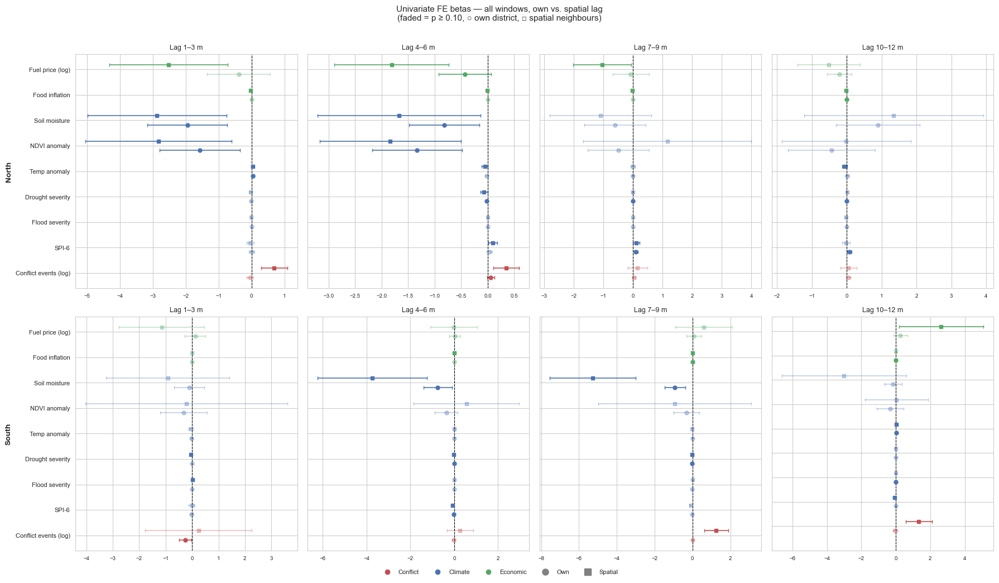

In [191]:
# -------------------------------------------------------------------
# DERIVE SE AND CIs (not stored in records)
# -------------------------------------------------------------------
uni_all["se"] = uni_all["beta"] / uni_all["tstat"].replace(0, np.nan)
uni_all["ci_low"]  = uni_all["beta"] - 1.96 * uni_all["se"]
uni_all["ci_high"] = uni_all["beta"] + 1.96 * uni_all["se"]
uni_all["sig"] = uni_all["pval"] < SIG_P

# -------------------------------------------------------------------
# PLOT
# -------------------------------------------------------------------
WINDOW_ORDER = ["L1_3", "L4_6", "L7_9", "L10_12"]
WINDOW_LABELS = {"L1_3": "Lag 1–3 m", "L4_6": "Lag 4–6 m",
                 "L7_9": "Lag 7–9 m", "L10_12": "Lag 10–12 m"}
VAR_ORDER = list(VAR_LABELS.keys())          # preserves theme grouping
SOURCE_OFFSET = {"Own": -0.18, "Spatial": 0.18}
SOURCE_MARKER = {"Own": "o", "Spatial": "s"}
REGIONS = ["north", "south"]
REGION_TITLES = {"north": "North", "south": "South"}

fig, axes = plt.subplots(
    nrows=2, ncols=4,
    figsize=(18, 10),
    sharey=True, sharex=False,
)

for r_idx, region in enumerate(REGIONS):
    for w_idx, win in enumerate(WINDOW_ORDER):
        ax = axes[r_idx, w_idx]
        sub = uni_all[(uni_all["region"] == region) & (uni_all["window"] == win)]

        for src, offset in SOURCE_OFFSET.items():
            s = sub[sub["source"] == src].copy()
            if s.empty:
                continue
            # y positions: map variable to integer, then offset by source
            y_pos = [VAR_ORDER.index(v) + offset for v in s["variable"]]
            colors = [THEME_COLORS[s.loc[i, "theme"]] for i in s.index]
            alphas = [1.0 if sig else 0.35 for sig in s["sig"]]

            for y, row, c, a in zip(y_pos, s.itertuples(), colors, alphas):
                ax.errorbar(
                    row.beta, y,
                    xerr=[[row.beta - row.ci_low], [row.ci_high - row.beta]],
                    fmt=SOURCE_MARKER[src],
                    color=c, alpha=a,
                    markersize=5, elinewidth=1.2, capsize=2,
                    label=src if (y_pos.index(y) == 0) else "",
                )

        ax.axvline(0, color="black", lw=0.8, ls="--")
        ax.set_title(WINDOW_LABELS[win], fontsize=9)
        ax.set_yticks(range(len(VAR_ORDER)))
        ax.set_yticklabels([VAR_LABELS[v] for v in VAR_ORDER], fontsize=8)
        ax.tick_params(axis="x", labelsize=7)

        if w_idx == 0:
            ax.set_ylabel(REGION_TITLES[region], fontsize=10, fontweight="bold")

# theme legend
from matplotlib.lines import Line2D
theme_handles = [
    Line2D([0], [0], marker="o", color="w", markerfacecolor=c, markersize=8, label=t)
    for t, c in THEME_COLORS.items()
]
src_handles = [
    Line2D([0], [0], marker=m, color="grey", markersize=8, linestyle="None", label=s)
    for s, m in SOURCE_MARKER.items()
]
fig.legend(
    handles=theme_handles + src_handles,
    loc="lower center", ncol=5, fontsize=8,
    frameon=False, bbox_to_anchor=(0.5, -0.02)
)

fig.suptitle("Univariate FE betas — all windows, own vs. spatial lag\n"
             "(faded = p ≥ 0.10, ○ own district, □ spatial neighbours)",
             fontsize=11, y=1.01)
plt.tight_layout()
plt.savefig("univariate_betas_all.png", dpi=150, bbox_inches="tight")
plt.show()


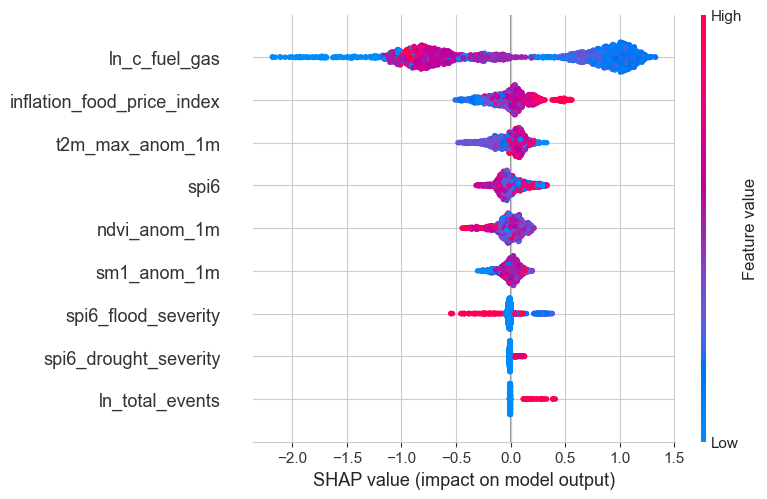

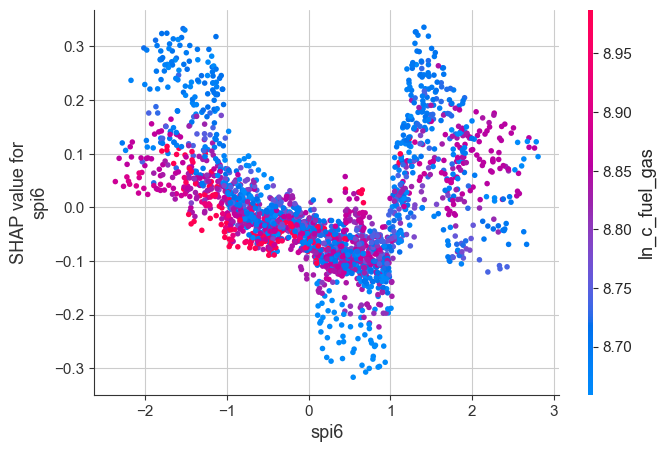

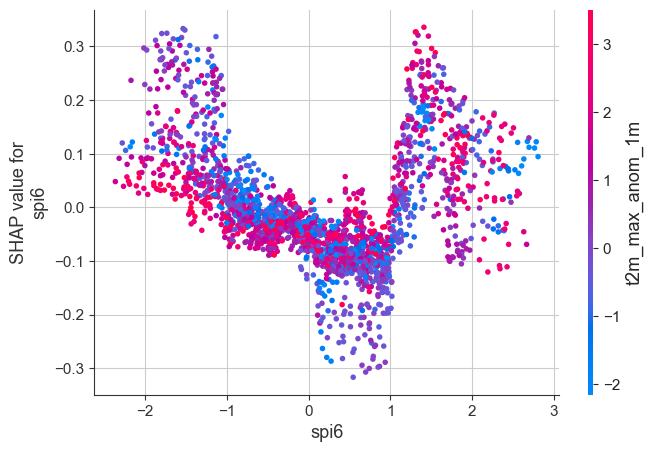

In [192]:
from sklearn.ensemble import RandomForestRegressor
import shap

# fit on your panel (drop entity/time FE or add dummies for districts)
# use the contemporaneous variables first, not lags
X = panel[ANALYSIS_VARS].dropna()
y = panel.loc[X.index, OUTCOME]

rf = RandomForestRegressor(n_estimators=500, max_features=0.4, 
                           min_samples_leaf=20, random_state=42)
rf.fit(X, y)

# SHAP
explainer = shap.TreeExplainer(rf)
shap_vals = explainer.shap_values(X)

# 1. variable importance — tells you which vars dominate
shap.summary_plot(shap_vals, X)

# 2. non-linearity check for one variable
shap.dependence_plot("spi6", shap_vals, X)          # color by auto-detected interaction
shap.dependence_plot("spi6", shap_vals, X, 
                     interaction_index="conflict_events")  # specific interaction


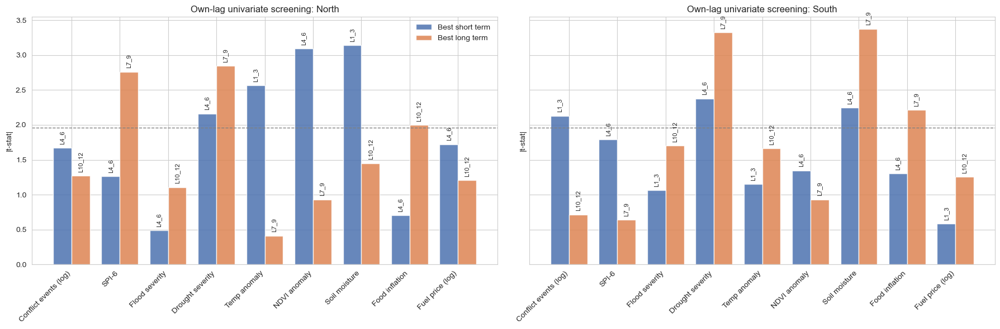

In [188]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

for ax, region_name in zip(axes, ["north", "south"]):
    dfp = region_outputs[region_name]["best_horizon"]
    dfp = dfp[dfp["source"] == "Own"].copy()

    short = dfp[dfp["horizon"] == "Short term"][["variable", "label", "window", "t_abs"]].rename(
        columns={"window": "short_window", "t_abs": "short_t"}
    )
    long = dfp[dfp["horizon"] == "Long term"][["variable", "window", "t_abs"]].rename(
        columns={"window": "long_window", "t_abs": "long_t"}
    )

    plot_df = short.merge(long, on="variable", how="left")
    plot_df["label"] = plot_df["variable"].map(VAR_LABELS)
    plot_df = plot_df.set_index("variable").loc[ANALYSIS_VARS].reset_index()

    x = np.arange(len(plot_df))
    w = 0.38

    ax.bar(x - w/2, plot_df["short_t"], width=w, color="#4c72b0", alpha=0.85, label="Best short term")
    ax.bar(x + w/2, plot_df["long_t"], width=w, color="#dd8452", alpha=0.85, label="Best long term")

    for i, r in plot_df.iterrows():
        ax.text(i - w/2, r["short_t"] + 0.05, r["short_window"], ha="center", va="bottom", fontsize=8, rotation=90)
        ax.text(i + w/2, r["long_t"] + 0.05, r["long_window"], ha="center", va="bottom", fontsize=8, rotation=90)

    ax.axhline(1.96, color="grey", linestyle="--", linewidth=1)
    ax.set_xticks(x)
    ax.set_xticklabels(plot_df["label"], rotation=45, ha="right")
    ax.set_ylabel("|t-stat|")
    ax.set_title(f"Own-lag univariate screening: {region_name.title()}")

axes[0].legend(frameon=False)
plt.tight_layout()
plt.show()

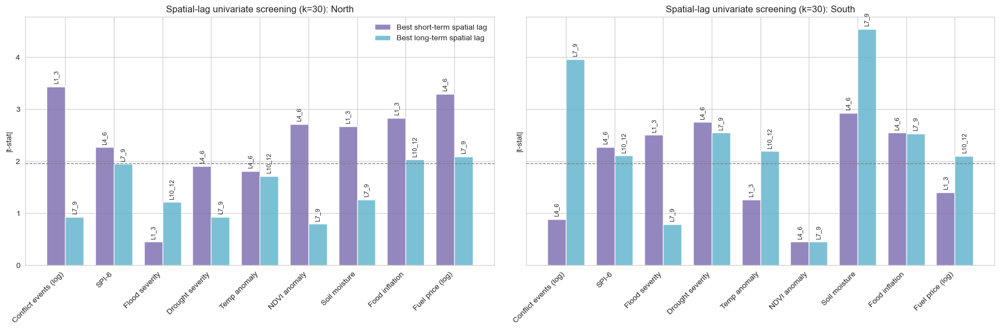

In [189]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

for ax, region_name in zip(axes, ["north", "south"]):
    dfp = region_outputs[region_name]["best_horizon"]
    dfp = dfp[dfp["source"] == "Spatial"].copy()

    short = dfp[dfp["horizon"] == "Short term"][["variable", "label", "window", "t_abs"]].rename(
        columns={"window": "short_window", "t_abs": "short_t"}
    )
    long = dfp[dfp["horizon"] == "Long term"][["variable", "window", "t_abs"]].rename(
        columns={"window": "long_window", "t_abs": "long_t"}
    )

    plot_df = short.merge(long, on="variable", how="left")
    plot_df["label"] = plot_df["variable"].map(VAR_LABELS)
    plot_df = plot_df.set_index("variable").loc[ANALYSIS_VARS].reset_index()

    x = np.arange(len(plot_df))
    w = 0.38

    ax.bar(x - w/2, plot_df["short_t"], width=w, color="#8172b2", alpha=0.85, label="Best short-term spatial lag")
    ax.bar(x + w/2, plot_df["long_t"], width=w, color="#64b5cd", alpha=0.85, label="Best long-term spatial lag")

    for i, r in plot_df.iterrows():
        ax.text(i - w/2, r["short_t"] + 0.05, r["short_window"], ha="center", va="bottom", fontsize=8, rotation=90)
        ax.text(i + w/2, r["long_t"] + 0.05, r["long_window"], ha="center", va="bottom", fontsize=8, rotation=90)

    ax.axhline(1.96, color="grey", linestyle="--", linewidth=1)
    ax.set_xticks(x)
    ax.set_xticklabels(plot_df["label"], rotation=45, ha="right")
    ax.set_ylabel("|t-stat|")
    ax.set_title(f"Spatial-lag univariate screening (k=30): {region_name.title()}")

axes[0].legend(frameon=False)
plt.tight_layout()
plt.show()

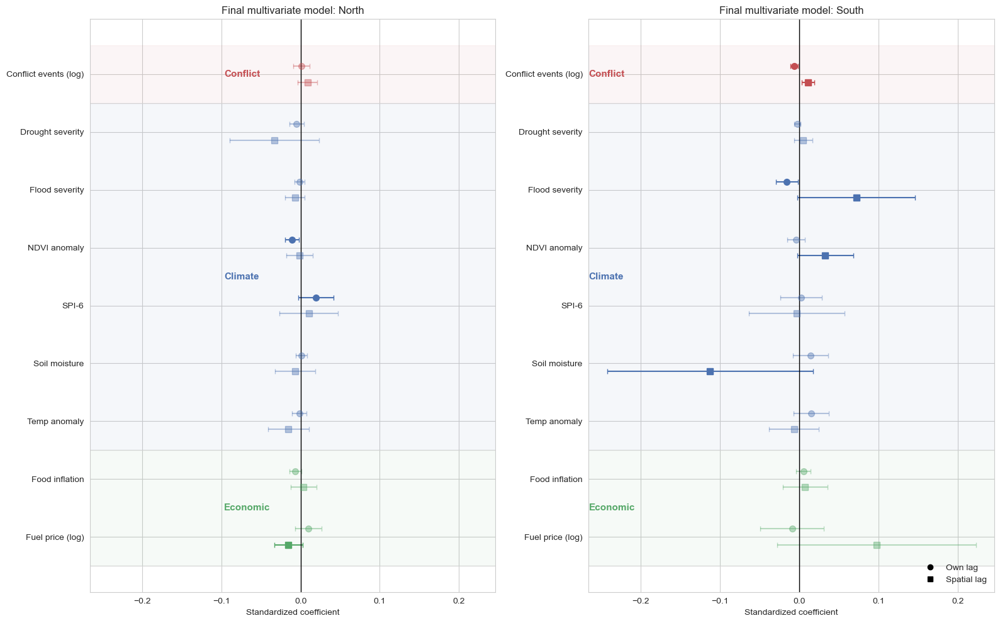

In [190]:
def build_standardized_coef_df(region_outputs, region_name, outcome="ln_idp"):
    panel = region_outputs[region_name]["panel"]
    res = region_outputs[region_name]["final_model"]
    coef_df = region_outputs[region_name]["coef_df"].copy()

    rhs = list(res.params.index)
    sample = panel[[outcome] + rhs].dropna().copy()

    y_sd = sample[outcome].std()
    x_sds = sample[rhs].std()

    scale_map = (x_sds / y_sd).to_dict()

    coef_df["scale"] = coef_df["term"].map(scale_map)
    coef_df["beta_std"] = coef_df["beta"] * coef_df["scale"]
    coef_df["ci_low_std"] = coef_df["ci_low"] * coef_df["scale"]
    coef_df["ci_high_std"] = coef_df["ci_high"] * coef_df["scale"]

    return coef_df

theme_order = ["Conflict", "Climate", "Economic"]

fig, axes = plt.subplots(1, 2, figsize=(16, 10), sharex=True)

for ax, region_name in zip(axes, ["north", "south"]):
    coef_df = build_standardized_coef_df(region_outputs, region_name)
    coef_df = coef_df[coef_df["term"] != W_CTRL].copy()

    # one row per variable; own/spatial shown as separate markers on same row
    plot_df = (
        coef_df.sort_values(["theme", "label", "source"])
               .copy()
    )

    # stable order by theme then variable
    var_order_df = (
        plot_df[["theme", "label"]]
        .drop_duplicates()
        .assign(theme_rank=lambda d: d["theme"].map({k: i for i, k in enumerate(theme_order)}))
        .sort_values(["theme_rank", "label"])
        .reset_index(drop=True)
    )

    y_map = {label: i for i, label in enumerate(var_order_df["label"])}
    plot_df["y_base"] = plot_df["label"].map(y_map)
    plot_df["y"] = plot_df["y_base"] + plot_df["source"].map({"Own": -0.14, "Spatial": 0.14})

    for _, row in plot_df.iterrows():
        color = THEME_COLORS[row["theme"]]
        marker = "o" if row["source"] == "Own" else "s"
        alpha = 1.0 if row["pval"] < 0.10 else 0.4

        ax.errorbar(
            row["beta_std"], row["y"],
            xerr=[[row["beta_std"] - row["ci_low_std"]],
                  [row["ci_high_std"] - row["beta_std"]]],
            fmt=marker,
            color=color,
            ecolor=color,
            capsize=3,
            markersize=7,
            alpha=alpha
        )

    # theme separators and labels
    for theme in theme_order:
        sub = var_order_df[var_order_df["theme"] == theme]
        if sub.empty:
            continue

        y_min = sub["label"].map(y_map).min() - 0.5
        y_max = sub["label"].map(y_map).max() + 0.5

        ax.axhspan(y_min, y_max, color=THEME_COLORS[theme], alpha=0.05)
        ax.text(
            ax.get_xlim()[0] if len(ax.get_xlim()) else -0.5,
            (y_min + y_max) / 2,
            theme,
            color=THEME_COLORS[theme],
            fontsize=11,
            fontweight="bold",
            va="center",
            ha="left"
        )
        ax.axhline(y_max, color="lightgray", linewidth=0.8)

    ax.axvline(0, color="black", linewidth=1)
    ax.set_yticks(range(len(var_order_df)))
    ax.set_yticklabels(var_order_df["label"])
    ax.invert_yaxis()
    ax.set_title(f"Final multivariate model: {region_name.title()}")
    ax.set_xlabel("Standardized coefficient")

# simple manual legend
from matplotlib.lines import Line2D
legend_items = [
    Line2D([0], [0], marker='o', color='black', linestyle='None', label='Own lag'),
    Line2D([0], [0], marker='s', color='black', linestyle='None', label='Spatial lag'),
]
axes[1].legend(handles=legend_items, frameon=False, loc="lower right")

plt.tight_layout()
plt.show()

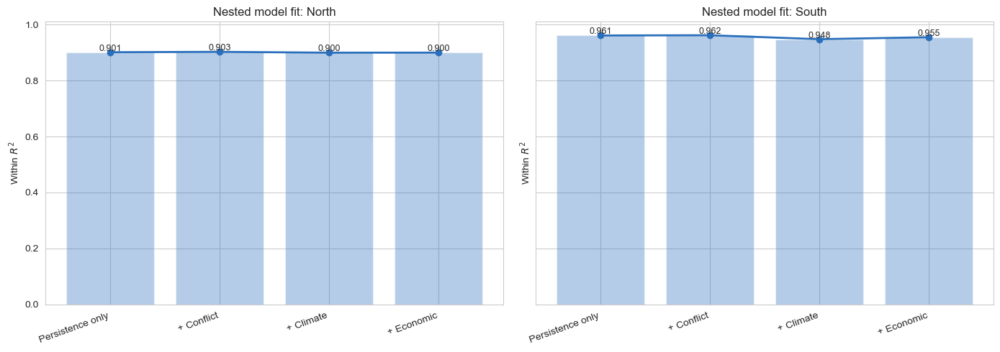

In [183]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

stage_order = ["Persistence only", "+ Conflict", "+ Climate", "+ Economic"]

for ax, region_name in zip(axes, ["north", "south"]):
    r2_df = region_outputs[region_name]["r2_df"].copy()
    r2_df["stage"] = pd.Categorical(r2_df["stage"], categories=stage_order, ordered=True)
    r2_df = r2_df.sort_values("stage")

    x = np.arange(len(r2_df))
    ax.plot(x, r2_df["r2_within"], marker="o", linewidth=2, color="#2a6fbb")
    ax.bar(x, r2_df["r2_within"], alpha=0.35, color="#2a6fbb")

    for i, r in r2_df.reset_index(drop=True).iterrows():
        ax.text(i, r["r2_within"] + 0.005, f'{r["r2_within"]:.3f}', ha="center", fontsize=9)

    ax.set_xticks(x)
    ax.set_xticklabels(r2_df["stage"], rotation=20, ha="right")
    ax.set_ylabel("Within $R^2$")
    ax.set_title(f"Nested model fit: {region_name.title()}")

plt.tight_layout()
plt.show()

In [122]:
import pandas as pd
import numpy as np
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings("ignore")

# ------------------------------------------------------------------
# CONFIG
# ------------------------------------------------------------------
OUTCOME_RAW = "final_idp_count"   # change to final_returnee_count if needed
OUTCOME = "ln_idp"
W_CTRL = "ln_idp_L1"
REGION_COL = "region_north"
REGIONS = {"north": 1, "south": 0}

BASE_VARS = [
    "total_best_deaths", "total_events", "spi6", "spi6_flood_severity",
    "spi6_drought_severity", "t2m_max_anom_1m", "ndvi_anom_1m",
    "sm1_anom_1m", "inflation_food_price_index", "c_fuel_gas",
]

LOG_MAP = {
    "total_best_deaths": "ln_total_best_deaths",
    "total_events": "ln_total_events",
    "c_fuel_gas": "ln_c_fuel_gas",
}

ANALYSIS_VARS = [LOG_MAP.get(v, v) for v in BASE_VARS]
WINDOWS = {
    "L1_3": [1, 2, 3],
    "L4_6": [4, 5, 6],
    "L7_9": [7, 8, 9],
    "L10_12": [10, 11, 12],
}
K_GRID = [10, 20, 30, 40]
REG_START = pd.Timestamp("2014-05-01")   # because of ln_idp_L1
REG_END = pd.Timestamp("2024-08-01")
MIN_OBS = 50
SIG_P = 0.10

# ------------------------------------------------------------------
# HELPERS
# ------------------------------------------------------------------
def prep_base(df):
    d = df.copy()
    d["yearmon_dt"] = pd.to_datetime(d["yearmon_str"], format="%Y-%m")
    d = d.sort_values(["adm2_standardized", "yearmon_dt"])

    d[OUTCOME] = np.log1p(d[OUTCOME_RAW].clip(lower=0))
    d[W_CTRL] = d.groupby("adm2_standardized")[OUTCOME].shift(1)

    for raw, logcol in LOG_MAP.items():
        d[logcol] = np.log1p(d[raw].clip(lower=0))

    return d

def add_window_means(df, var, prefix=""):
    g = df.groupby("adm2_standardized")[var]
    for tag, lags in WINDOWS.items():
        tmp = pd.concat([g.shift(L) for L in lags], axis=1)
        col = f"{prefix}{var}_{tag}"
        df[col] = tmp.mean(axis=1)
        df.loc[~tmp.notna().all(axis=1), col] = np.nan
    return df

def build_spatial_matrix(tt_matrix, districts, k):
    shared = sorted(set(districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt, np.inf)
    w_raw = 1.0 / tt
    w_raw[~np.isfinite(w_raw)] = 0.0

    W = np.zeros_like(w_raw)
    for i in range(len(shared)):
        top_k = np.argsort(w_raw[i])[-k:]
        W[i, top_k] = w_raw[i, top_k]

    row_sums = W.sum(axis=1, keepdims=True)
    W = np.where(row_sums > 0, W / row_sums, 0)
    return W, shared

def add_spatial_window_means(df, tt_matrix, vars_to_use, k):
    districts = sorted(df["adm2_standardized"].dropna().unique())
    W, shared = build_spatial_matrix(tt_matrix, districts, k)
    d = df[df["adm2_standardized"].isin(shared)].copy()

    for var in vars_to_use:
        pivot = (
            d.pivot_table(index="adm2_standardized", columns="yearmon_str", values=var, aggfunc="first")
             .reindex(shared)
        )
        X = pivot.values.astype(float)
        WX = W @ np.where(np.isnan(X), 0, X)

        base_col = f"W{k}_{var}"
        wx_long = (
            pd.DataFrame(WX, index=shared, columns=pivot.columns)
            .rename_axis("adm2_standardized")
            .reset_index()
            .melt(id_vars="adm2_standardized", var_name="yearmon_str", value_name=base_col)
        )

        d = d.merge(wx_long, on=["adm2_standardized", "yearmon_str"], how="left")
        d = add_window_means(d, base_col)

    return d

def make_panel(df):
    d = df[df["yearmon_dt"].between(REG_START, REG_END)].copy()
    return d.set_index(["adm2_standardized", "yearmon_dt"]).sort_index()

def fit_fe(panel, rhs_cols):
    cols = [OUTCOME] + rhs_cols
    sub = panel[cols].dropna()
    if len(sub) < MIN_OBS:
        return None
    try:
        return PanelOLS(
            sub[OUTCOME],
            sub[rhs_cols],
            entity_effects=True,
            time_effects=True
        ).fit(cov_type="clustered", cluster_entity=True)
    except Exception:
        return None

def pick_best_term(group):
    sig = group[group["pval"] < SIG_P]
    use = sig if not sig.empty else group
    return use.sort_values("t_abs", ascending=False).iloc[0]

def tidy_model(res):
    return pd.DataFrame({
        "term": res.params.index,
        "beta": res.params.values,
        "tstat": res.tstats.values,
        "pval": res.pvalues.values
    }).sort_values("pval")

# ------------------------------------------------------------------
# MAIN REGION WORKFLOW
# ------------------------------------------------------------------
tt = pd.read_csv(PROCESSED_DIR / "travel_time_matrix.csv", index_col=0)
outputs = {}

for region_name, region_flag in REGIONS.items():
    print(f"\n{'='*90}\nREGION: {region_name.upper()}\n{'='*90}")

    d = prep_base(master_reg[master_reg[REGION_COL] == region_flag].copy())

    for var in ANALYSIS_VARS:
        d = add_window_means(d, var)

    for k in K_GRID:
        d = add_spatial_window_means(d, tt, ANALYSIS_VARS, k)

    panel = make_panel(d)
    records = []

    for var in ANALYSIS_VARS:
        # own lag windows
        for win in WINDOWS:
            col = f"{var}_{win}"
            res = fit_fe(panel, [W_CTRL, col])
            if res is not None:
                records.append({
                    "region": region_name, "variable": var, "source": "own",
                    "k": np.nan, "window": win, "col": col,
                    "beta": res.params[col], "tstat": res.tstats[col],
                    "t_abs": abs(res.tstats[col]), "pval": res.pvalues[col],
                    "nobs": int(res.nobs)
                })

        # spatial lag windows across different K
        for k in K_GRID:
            for win in WINDOWS:
                col = f"W{k}_{var}_{win}"
                if col not in panel.columns:
                    continue
                res = fit_fe(panel, [W_CTRL, col])
                if res is not None:
                    records.append({
                        "region": region_name, "variable": var, "source": "spatial",
                        "k": k, "window": win, "col": col,
                        "beta": res.params[col], "tstat": res.tstats[col],
                        "t_abs": abs(res.tstats[col]), "pval": res.pvalues[col],
                        "nobs": int(res.nobs)
                    })

    results = pd.DataFrame(records)
    best_terms = results.groupby("variable", group_keys=False).apply(pick_best_term).reset_index(drop=True)

    final_rhs = [W_CTRL] + best_terms["col"].tolist()
    final_model = fit_fe(panel, final_rhs)

    outputs[region_name] = {
        "data": d,
        "panel": panel,
        "univariate": results,
        "best_terms": best_terms,
        "final_model": final_model,
        "final_table": tidy_model(final_model) if final_model is not None else None
    }

    print("\nBest term per variable:")
    print(best_terms[["variable", "source", "k", "window", "beta", "tstat", "pval"]].to_string(index=False))

    if final_model is not None:
        print(f"\nFinal model within R²: {final_model.rsquared_within:.3f}")
        print(outputs[region_name]["final_table"].to_string(index=False))
    else:
        print("\nFinal model could not be estimated.")


REGION: NORTH


KeyError: 'variable'

In [59]:
variable_dictionary = {
    "identifiers_time_geography": [
        "yearmon_str",
        "adm2_standardized",
        "adm1_name",
        "region_north",
    ],
    "conflict_exposure": [
        "total_events",
        "total_best_deaths",
        "conflict_incidence",
        "fatality_incidence",
        "total_events_r3",
        "total_events_r12",
        "total_best_deaths_r3",
        "total_best_deaths_r12",
    ],
    "conflict_engineered_features": [
        "log_events",
        "log_deaths",
        "deaths_per_event",
    ],
    "precipitation_rainfall": [
        "p_anom_1m",
        "p_anom_3m",
        "p_annual_change",
        "p_annual_spread",
    ],
    "drought_flood_indices": [
        "spi6",
        "spi6_drought_frequency_pct",
        "spi6_drought_duration",
        "spi6_drought_intensity",
        "spi6_drought_severity",
        "spi6_flood_frequency_pct",
        "spi6_flood_duration",
        "spi6_flood_intensity",
        "spi6_flood_severity",
    ],
    "vegetation": [
        "ndvi_anom_1m",
        "ndvi_annual_change",
        "ndvi_calendar_month_change",
    ],
    "temperature": [
        "t2m_anom_1m",
        "t2m_min_anom_1m",
        "t2m_max_anom_1m",
    ],
    "soil_moisture": [
        "sm1_anom_1m",
        "sm2_anom_1m",
        "sm3_anom_1m",
        "sm4_anom_1m",
        "sm1_anom_3m",
        "sm2_anom_3m",
        "sm3_anom_3m",
        "sm4_anom_3m",
    ],
    "hydrology": [
        "streamflow_anom_1m",
    ],
    "economic_market_conditions": [
        "c_wage_non_qualified_labour",
        "c_fuel_gas",
        "inflation_food_price_index",
    ],
    "displacement_outcomes": [
        "final_idp_count",
        "final_returnee_count",
    ],
}
rows = [
    (theme, var)
    for theme, vars_ in variable_dictionary.items()
    for var in vars_
]

df_dict = pd.DataFrame(rows, columns=["theme", "variable"])
df_dict

,theme,variable
0,identifiers_time_geography,yearmon_str
1,identifiers_time_geography,adm2_standardized
2,identifiers_time_geography,adm1_name
3,identifiers_time_geography,region_north
4,conflict_exposure,total_events
5,conflict_exposure,total_best_deaths
6,conflict_exposure,conflict_incidence
7,conflict_exposure,fatality_incidence
8,conflict_exposure,total_events_r3
9,conflict_exposure,total_events_r12


In [62]:
import pandas as pd
import numpy as np

# -----------------------------------------------------------------------------
# 1. BASIC SETUP
# -----------------------------------------------------------------------------
df = master_reg.copy()
df['yearmon_dt'] = pd.to_datetime(df['yearmon_str'], format='%Y-%m')

id_cols = ['adm2_standardized', 'adm1_name']
outcome_cols = ['final_idp_count', 'final_returnee_count']

covariate_cols = [
    c for c in df.columns
    if c not in id_cols + ['yearmon_str', 'yearmon_dt'] + outcome_cols
]

LAG_MAX = 12

cov_start = pd.Timestamp('2013-01-01')
cov_end   = pd.Timestamp('2024-12-01')

out_start = pd.Timestamp('2014-04-01')
out_end   = pd.Timestamp('2024-08-01')

# If you include ln_idp_L1 as a control, first usable month is one month later
reg_start_with_outcome_lag = out_start + pd.DateOffset(months=1)   # 2014-05-01
reg_end = out_end

print(f'Covariate support window: {cov_start:%Y-%m} to {cov_end:%Y-%m}')
print(f'Outcome support window:   {out_start:%Y-%m} to {out_end:%Y-%m}')
print(f'Regression window w/ L12 covariates and ln_idp_L1: {reg_start_with_outcome_lag:%Y-%m} to {reg_end:%Y-%m}')

Covariate support window: 2013-01 to 2024-12
Outcome support window:   2014-04 to 2024-08
Regression window w/ L12 covariates and ln_idp_L1: 2014-05 to 2024-08


In [63]:
# -----------------------------------------------------------------------------
# 2. REINDEX TO A COMPLETE DISTRICT x MONTH PANEL
# -----------------------------------------------------------------------------
all_districts = sorted(df['adm2_standardized'].dropna().unique())
full_months = pd.date_range(cov_start, cov_end, freq='MS')

full_index = pd.MultiIndex.from_product(
    [all_districts, full_months],
    names=['adm2_standardized', 'yearmon_dt']
)

panel_full = (
    df.sort_values(['adm2_standardized', 'yearmon_dt'])
      .set_index(['adm2_standardized', 'yearmon_dt'])
      .reindex(full_index)
      .reset_index()
)

panel_full['yearmon_str'] = panel_full['yearmon_dt'].dt.strftime('%Y-%m')

# fill static geography fields within district
panel_full['adm1_name'] = panel_full.groupby('adm2_standardized')['adm1_name'].transform(lambda s: s.ffill().bfill())
if 'region_north' in panel_full.columns:
    panel_full['region_north'] = panel_full.groupby('adm2_standardized')['region_north'].transform(lambda s: s.ffill().bfill())

In [64]:
# -----------------------------------------------------------------------------
# 3. ENGINEER OUTCOMES / CONTROLS
# -----------------------------------------------------------------------------
panel_full['ln_idp'] = np.log1p(panel_full['final_idp_count'])
panel_full['ln_returnee'] = np.log1p(panel_full['final_returnee_count'])

panel_full['ln_idp_L1'] = panel_full.groupby('adm2_standardized')['ln_idp'].shift(1)
panel_full['ln_returnee_L1'] = panel_full.groupby('adm2_standardized')['ln_returnee'].shift(1)

if 'c_fuel_gas' in panel_full.columns and 'ln_c_fuel_gas' not in panel_full.columns:
    panel_full['ln_c_fuel_gas'] = np.log1p(panel_full['c_fuel_gas'].clip(lower=0))

In [65]:
# -----------------------------------------------------------------------------
# 4. CREATE OWN LAGS FOR COVARIATES UP TO 12 MONTHS
# -----------------------------------------------------------------------------
for var in covariate_cols:
    if var not in panel_full.columns:
        continue
    for L in range(0, LAG_MAX + 1):
        lag_col = f'{var}_L{L}'
        if L == 0:
            panel_full[lag_col] = panel_full[var]
        else:
            panel_full[lag_col] = panel_full.groupby('adm2_standardized')[var].shift(L)

In [67]:
# -----------------------------------------------------------------------------
# 5. TRIM TO REGRESSION SAMPLE
# -----------------------------------------------------------------------------
reg_df = panel_full[
    panel_full['yearmon_dt'].between(reg_start_with_outcome_lag, reg_end)
].copy()

print(reg_df[['yearmon_str', 'adm2_standardized']].agg(['min', 'max']))
print(f'N districts: {reg_df["adm2_standardized"].nunique()}')
print(f'N rows: {len(reg_df):,}')

    yearmon_str adm2_standardized
min     2014-05      Ain Al-Tamur
max     2024-08             Zakho
N districts: 88
N rows: 10,912


In [ ]:
# -----------------------------------------------------------------------------
# 6. COMPLETENESS CHECKS
# -----------------------------------------------------------------------------
def panel_completeness_report(data, districts, months, vars_to_check, name='dataset'):
    expected_rows = len(districts) * len(months)
    actual_rows = len(data)

    print(f'\n{"="*90}')
    print(f'COMPLETENESS REPORT: {name}')
    print(f'{"="*90}')
    print(f'Expected rows: {expected_rows:,}')
    print(f'Actual rows:   {actual_rows:,}')
    print(f'Missing rows:  {expected_rows - actual_rows:,}')

    # missing district-month rows
    observed = set(zip(data['adm2_standardized'], data['yearmon_dt']))
    expected = set((d, m) for d in districts for m in months)
    missing_pairs = expected - observed
    print(f'Missing district-month pairs: {len(missing_pairs):,}')

    # variable-level missingness
    miss = (
        data[vars_to_check]
        .isna()
        .sum()
        .sort_values(ascending=False)
        .rename('n_missing')
        .to_frame()
    )
    miss['pct_missing'] = 100 * miss['n_missing'] / len(data)
    print('\nTop missing variables:')
    print(miss.head(20))

    # district-level missingness for outcomes
    out_cols = [c for c in ['final_idp_count', 'final_returnee_count', 'ln_idp_L1', 'ln_returnee_L1'] if c in data.columns]
    if out_cols:
        district_missing = (
            data.groupby('adm2_standardized')[out_cols]
                .apply(lambda x: x.isna().mean() * 100)
        )
        print('\nDistrict-level missing % for outcome-related vars:')
        print(district_missing.head(20))

    return miss

# full covariate panel completeness
cov_months = pd.date_range(cov_start, cov_end, freq='MS')
cov_panel = b[panel_full['yearmon_dt'].between(cov_start, cov_end)].copy()

cov_report = panel_completeness_report(
    cov_panel,
    districts=all_districts,
    months=cov_months,
    vars_to_check=covariate_cols,
    name='full covariate panel'
)

# regression sample completeness
reg_months = pd.date_range(reg_start_with_outcome_lag, reg_end, freq='MS')

vars_for_reg_check = [
    'ln_idp', 'ln_idp_L1', 'ln_returnee', 'ln_returnee_L1'
] + [f'{v}_L12' for v in covariate_cols if f'{v}_L12' in reg_df.columns]

reg_report = panel_completeness_report(
    reg_df,
    districts=all_districts,
    months=reg_months,
    vars_to_check=vars_for_reg_check,
    name='regression sample'
)


COMPLETENESS REPORT: full covariate panel
Expected rows: 12,672
Actual rows:   12,672
Missing rows:  0
Missing district-month pairs: 0

Top missing variables:
                            n_missing  pct_missing
streamflow_anom_1m                576     4.545455
region_north                      144     1.136364
deaths_per_event                    0     0.000000
spi6_drought_severity               0     0.000000
spi6_drought_intensity              0     0.000000
spi6_drought_duration               0     0.000000
spi6_drought_frequency_pct          0     0.000000
spi6                                0     0.000000
p_annual_change                     0     0.000000
p_anom_3m                           0     0.000000
p_anom_1m                           0     0.000000
total_best_deaths_r12               0     0.000000
spi6_flood_duration                 0     0.000000
total_best_deaths_r3                0     0.000000
total_events_r12                    0     0.000000
total_events_r3         

W shape: (87, 87) | shared districts: 87
Building lags...
  Computing W_total_best_deaths...
  Computing W_spi6...
  Computing W_spi6_flood_severity...
  Computing W_spi6_drought_severity...
  Computing W_t2m_max_anom_1m...
  Computing W_sm1_anom_1m...
  Computing W_inflation_food_price_index...
  Computing W_ln_c_fuel_gas...

════════════════════════════════════════════════════════════════════════════════
  LAG SELECTION RESULTS  |  outcome: ln_idp  |  W_ctrl: ln_idp_L1
════════════════════════════════════════════════════════════════════════════════

  ────────────────────────────────────────────────────────────────────────────
  CONFLICT DEATHS
  ────────────────────────────────────────────────────────────────────────────
  w_type       lag            β     t-stat        p  sig   n_obs
  ----------------------------------------------------------------------
  own            0      +0.0000     +0.045    0.964         6960
  own            3      +0.0000     +0.056    0.955         678

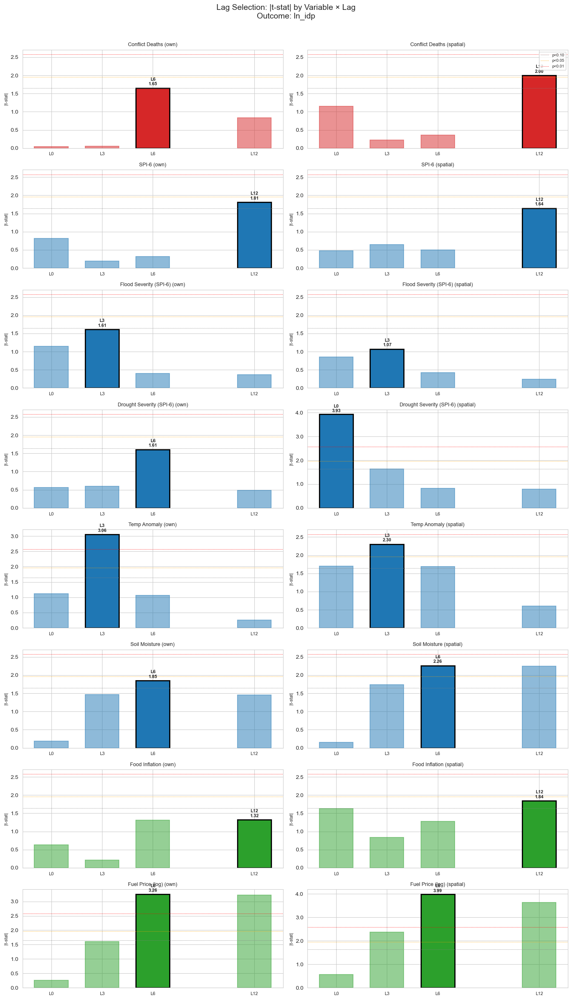

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings('ignore')

# ── CONFIG ────────────────────────────────────────────────────────────────────
K_NEIGHBORS = 30   # ← adjust here

OUTCOME     = 'ln_idp'
LAG_WINDOWS = [0, 3, 6, 12]
W_CTRL      = 'ln_idp_L1'     # own lag persistence control

VARS = [
    'total_best_deaths',
    'spi6',
    'spi6_flood_severity',
    'spi6_drought_severity',
    't2m_max_anom_1m',
    'sm1_anom_1m',
    'inflation_food_price_index',
    'ln_c_fuel_gas',
]

VAR_LABELS = {
    'total_best_deaths'          : 'Conflict Deaths',
    'spi6'                       : 'SPI-6',
    'spi6_flood_severity'        : 'Flood Severity (SPI-6)',
    'spi6_drought_severity'      : 'Drought Severity (SPI-6)',
    't2m_max_anom_1m'            : 'Temp Anomaly',
    'sm1_anom_1m'                : 'Soil Moisture',
    'inflation_food_price_index' : 'Food Inflation',
    'ln_c_fuel_gas'              : 'Fuel Price (log)',
}

VAR_GROUPS = {
    'total_best_deaths'          : 'conflict',
    'spi6'                       : 'climate',
    'spi6_flood_severity'        : 'climate',
    'spi6_drought_severity'      : 'climate',
    't2m_max_anom_1m'            : 'climate',
    'sm1_anom_1m'                : 'climate',
    'inflation_food_price_index' : 'economic',
    'ln_c_fuel_gas'              : 'economic',
}

GROUP_COLORS = {'conflict': '#d62728', 'climate': '#1f77b4', 'economic': '#2ca02c'}

# ── SPATIAL MATRIX ───────────────────────────────────────────────────────────
def build_spatial_matrix(tt_matrix, panel_df, k_neighbors=20):
    panel_districts = sorted(panel_df['adm2_standardized'].dropna().unique())
    shared = sorted(set(panel_districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt_aligned = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt_aligned, np.inf)
    W_raw = 1.0 / tt_aligned
    W_raw[~np.isfinite(W_raw)] = 0
    W = np.zeros_like(W_raw)
    for i in range(len(shared)):
        top_k = np.argsort(W_raw[i])[-k_neighbors:]
        W[i, top_k] = W_raw[i, top_k]
    row_sums = W.sum(axis=1, keepdims=True)
    W = np.where(row_sums > 0, W / row_sums, 0)
    return W, shared

def compute_W_col(data, var, W_mat, districts):
    pivot = (
        data.pivot_table(index='adm2_standardized', columns='yearmon_str',
                         values=var, aggfunc='first')
            .reindex(districts)
    )
    X  = pivot.values.astype(float)
    WX = W_mat @ np.where(np.isnan(X), 0, X)
    return (
        pd.DataFrame(WX, index=districts, columns=pivot.columns)
          .rename_axis('adm2_standardized').reset_index()
          .melt(id_vars='adm2_standardized', var_name='yearmon_str',
                value_name=f'W_{var}')
    )

tt = pd.read_csv(PROCESSED_DIR / 'travel_time_matrix.csv', index_col=0)
W, shared = build_spatial_matrix(tt, master_reg, k_neighbors=K_NEIGHBORS)
print(f'W shape: {W.shape} | shared districts: {len(shared)}')

# ── HELPERS ───────────────────────────────────────────────────────────────────
def make_panel(data):
    d = data.copy()
    d['yearmon_dt'] = pd.to_datetime(d['yearmon_str'])
    return d.set_index(['adm2_standardized', 'yearmon_dt']).sort_index()

def run_bivariate(panel, outcome, w_ctrl, var_col):
    cols = [outcome, w_ctrl, var_col]
    sub  = panel[cols].dropna()
    if len(sub) < 50:
        return None
    try:
        return PanelOLS(
            sub[outcome], sub[[w_ctrl, var_col]],
            entity_effects=True, time_effects=True
        ).fit(cov_type='clustered', cluster_entity=True)
    except Exception:
        return None

# ── STEP 1: BUILD OWN LAGS + SPATIAL LAGS ────────────────────────────────────
# ensure ln_c_fuel_gas exists
if 'ln_c_fuel_gas' not in master_reg.columns:
    master_reg['ln_c_fuel_gas'] = np.log1p(master_reg['c_fuel_gas'].clip(lower=0))

# ensure W_CTRL exists
if 'ln_idp_L1' not in master_reg.columns:
    master_reg['ln_idp'] = np.log1p(master_reg['final_idp_count'])
    master_reg['ln_idp_L1'] = master_reg.groupby('adm2_standardized')['ln_idp'].shift(1)

print('Building lags...')
for var in VARS:
    if var not in master_reg.columns:
        print(f'  SKIP {var}'); continue
    # own lags
    for L in LAG_WINDOWS:
        col = f'{var}_L{L}'
        if col not in master_reg.columns:
            master_reg[col] = master_reg.groupby('adm2_standardized')[var].shift(L)
    # spatial lags — compute W_col if not yet present
    w_base = f'W_{var}'
    if w_base not in master_reg.columns:
        print(f'  Computing {w_base}...')
        Wy = compute_W_col(master_reg, var, W, shared)
        master_reg = master_reg.merge(Wy, on=['yearmon_str', 'adm2_standardized'], how='left')
    for L in LAG_WINDOWS:
        wl = f'W_{var}_L{L}'
        if wl not in master_reg.columns:
            master_reg[wl] = master_reg.groupby('adm2_standardized')[w_base].shift(L)

# ── STEP 2: RUN BIVARIATE OLS FOR EVERY VAR × LAG × W_TYPE ──────────────────
panel = make_panel(master_reg)
records = []

for var in VARS:
    for w_type, prefix in [('own', ''), ('spatial', 'W_')]:
        for L in LAG_WINDOWS:
            col = f'{prefix}{var}_L{L}'
            if col not in panel.columns:
                continue
            res = run_bivariate(panel, OUTCOME, W_CTRL, col)
            if res is None:
                continue
            b = res.params.get(col, np.nan)
            t = res.tstats.get(col, np.nan)
            p = res.pvalues.get(col, np.nan)
            records.append(dict(
                variable=var,
                label=VAR_LABELS.get(var, var),
                group=VAR_GROUPS.get(var, 'other'),
                w_type=w_type,
                lag=L,
                col=col,
                beta=b,
                tstat=t,
                tstat_abs=abs(t),
                pval=p,
                sig=('***' if p < 0.01 else '**' if p < 0.05 else '*' if p < 0.1 else ''),
                n_obs=int(res.nobs),
            ))

results = pd.DataFrame(records)

# ── STEP 3: PRINT SUMMARY TABLE ───────────────────────────────────────────────
print(f'\n{"═"*80}')
print(f'  LAG SELECTION RESULTS  |  outcome: {OUTCOME}  |  W_ctrl: {W_CTRL}')
print(f'{"═"*80}')

for var in VARS:
    lbl = VAR_LABELS.get(var, var)
    print(f'\n  {"─"*76}')
    print(f'  {lbl.upper()}')
    print(f'  {"─"*76}')
    print(f'  {"w_type":<10} {"lag":>5} {"β":>12} {"t-stat":>10} {"p":>8}  sig   n_obs')
    print(f'  {"-"*70}')
    sub = results[results['variable'] == var].sort_values(['w_type', 'lag'])
    for _, r in sub.iterrows():
        marker = ' ◀ BEST' if (
            r['tstat_abs'] == results[
                (results['variable'] == var) &
                (results['w_type'] == r['w_type'])
            ]['tstat_abs'].max()
        ) else ''
        print(f'  {r["w_type"]:<10} {int(r["lag"]):>5} {r["beta"]:>+12.4f} '
              f'{r["tstat"]:>+10.3f} {r["pval"]:>8.3f}  {r["sig"]:<4} '
              f'{int(r["n_obs"]):>6}{marker}')

# ── STEP 4: WINNER TABLE ──────────────────────────────────────────────────────
winners = (
    results.sort_values('tstat_abs', ascending=False)
           .groupby(['variable', 'w_type'], as_index=False)
           .first()
    [['variable', 'label', 'group', 'w_type', 'lag', 'beta', 'tstat', 'sig', 'n_obs']]
    .sort_values(['group', 'variable', 'w_type'])
)

print(f'\n{"═"*80}')
print('  WINNER LAGS (highest |t-stat| per variable × w_type)')
print(f'{"═"*80}')
print(winners.to_string(index=False))

# ── STEP 5: VISUALIZATION ─────────────────────────────────────────────────────
n_vars = len(VARS)
fig, axes = plt.subplots(n_vars, 2, figsize=(14, 3 * n_vars), sharey=False)
fig.suptitle(
    f'Lag Selection: |t-stat| by Variable × Lag\nOutcome: {OUTCOME}',
    fontsize=14, y=1.01
)

for row_i, var in enumerate(VARS):
    lbl   = VAR_LABELS.get(var, var)
    color = GROUP_COLORS.get(VAR_GROUPS.get(var, 'other'), '#888')

    for col_i, w_type in enumerate(['own', 'spatial']):
        ax  = axes[row_i, col_i]
        sub = results[(results['variable'] == var) & (results['w_type'] == w_type)]

        if sub.empty:
            ax.set_visible(False)
            continue

        lags   = sub['lag'].values
        tstats = sub['tstat_abs'].values
        best_i = np.argmax(tstats)

        bars = ax.bar(lags, tstats, width=2, color=color, alpha=0.5,
                      edgecolor=color, linewidth=1.2)
        bars[best_i].set_alpha(1.0)
        bars[best_i].set_edgecolor('black')
        bars[best_i].set_linewidth(2)

        # significance thresholds
        ax.axhline(1.645, color='grey',  linestyle=':', linewidth=0.8, label='p<0.10')
        ax.axhline(1.960, color='orange',linestyle=':', linewidth=0.8, label='p<0.05')
        ax.axhline(2.576, color='red',   linestyle=':', linewidth=0.8, label='p<0.01')

        # annotate best bar
        best_lag = lags[best_i]
        best_t   = tstats[best_i]
        ax.text(best_lag, best_t + 0.05, f'L{best_lag}\n{best_t:.2f}',
                ha='center', va='bottom', fontsize=8, fontweight='bold')

        ax.set_title(f'{lbl} ({w_type})', fontsize=9)
        ax.set_xticks(lags)
        ax.set_xticklabels([f'L{l}' for l in lags], fontsize=8)
        ax.set_ylabel('|t-stat|', fontsize=8)
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))

        if row_i == 0 and col_i == 1:
            ax.legend(fontsize=7, loc='upper right')

plt.tight_layout()
out_path = FIGURES_DIR / f'lag_selection_{OUTCOME}.png'
#plt.savefig(out_path, dpi=150, bbox_inches='tight')
print(f'\n✓ Saved: {out_path}')
plt.show()

W shape: (100, 100) | shared districts: 100
Building lags...

════════════════════════════════════════════════════════════════════════════════
  LAG SELECTION RESULTS  |  outcome: ln_idp  |  no persistence control
════════════════════════════════════════════════════════════════════════════════

  ────────────────────────────────────────────────────────────────────────────
  CONFLICT DEATHS
  ────────────────────────────────────────────────────────────────────────────
  w_type       lag            β     t-stat        p  sig   n_obs
  ----------------------------------------------------------------------
  own            0      +0.0000     +0.097    0.923         8100
  own            3      -0.0007     -0.848    0.396         7800 ◀ BEST
  own            6      -0.0003     -0.414    0.679         7500
  own           12      +0.0001     +0.118    0.906         6900
  spatial        0      +0.0112     +2.162    0.031  **     8100 ◀ BEST
  spatial        3      +0.0060     +1.162    0.245

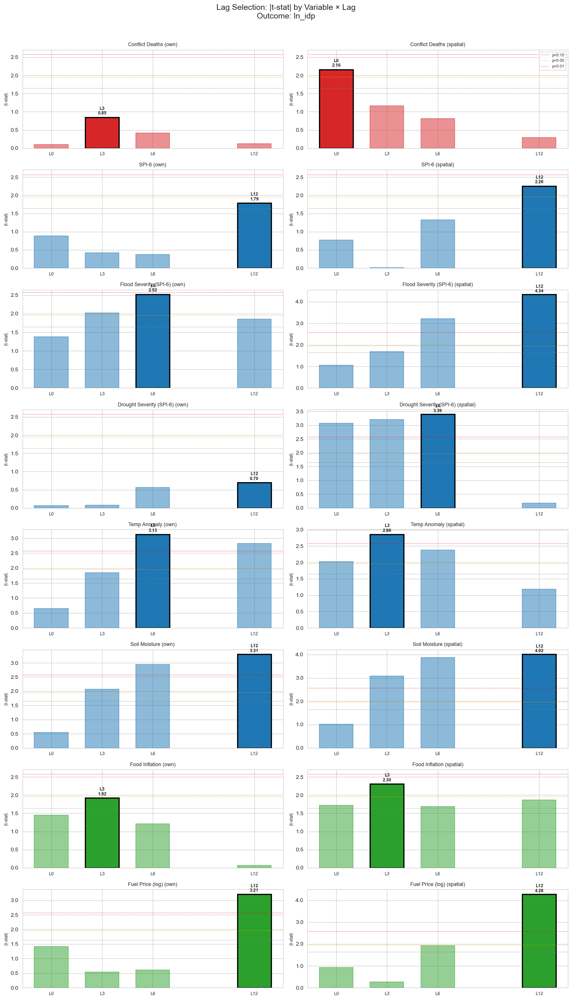

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings('ignore')

# ── CONFIG ────────────────────────────────────────────────────────────────────
K_NEIGHBORS = 30

OUTCOME     = 'ln_idp'
LAG_WINDOWS = [0, 3, 6, 12]

VARS = [
    'total_best_deaths',
    'spi6',
    'spi6_flood_severity',
    'spi6_drought_severity',
    't2m_max_anom_1m',
    'sm1_anom_1m',
    'inflation_food_price_index',
    'ln_c_fuel_gas',
]

VAR_LABELS = {
    'total_best_deaths'          : 'Conflict Deaths',
    'spi6'                       : 'SPI-6',
    'spi6_flood_severity'        : 'Flood Severity (SPI-6)',
    'spi6_drought_severity'      : 'Drought Severity (SPI-6)',
    't2m_max_anom_1m'            : 'Temp Anomaly',
    'sm1_anom_1m'                : 'Soil Moisture',
    'inflation_food_price_index' : 'Food Inflation',
    'ln_c_fuel_gas'              : 'Fuel Price (log)',
}

VAR_GROUPS = {
    'total_best_deaths'          : 'conflict',
    'spi6'                       : 'climate',
    'spi6_flood_severity'        : 'climate',
    'spi6_drought_severity'      : 'climate',
    't2m_max_anom_1m'            : 'climate',
    'sm1_anom_1m'                : 'climate',
    'inflation_food_price_index' : 'economic',
    'ln_c_fuel_gas'              : 'economic',
}

GROUP_COLORS = {'conflict': '#d62728', 'climate': '#1f77b4', 'economic': '#2ca02c'}

# ── SPATIAL MATRIX ────────────────────────────────────────────────────────────
def build_spatial_matrix(tt_matrix, panel_df, k_neighbors=20):
    panel_districts = sorted(panel_df['adm2_standardized'].dropna().unique())
    shared = sorted(set(panel_districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt_aligned = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt_aligned, np.inf)
    W_raw = 1.0 / tt_aligned
    W_raw[~np.isfinite(W_raw)] = 0
    W = np.zeros_like(W_raw)
    for i in range(len(shared)):
        top_k = np.argsort(W_raw[i])[-k_neighbors:]
        W[i, top_k] = W_raw[i, top_k]
    row_sums = W.sum(axis=1, keepdims=True)
    W = np.where(row_sums > 0, W / row_sums, 0)
    return W, shared

def compute_W_col(data, var, W_mat, districts):
    pivot = (
        data.pivot_table(index='adm2_standardized', columns='yearmon_str',
                         values=var, aggfunc='first')
            .reindex(districts)
    )
    X  = pivot.values.astype(float)
    WX = W_mat @ np.where(np.isnan(X), 0, X)
    return (
        pd.DataFrame(WX, index=districts, columns=pivot.columns)
          .rename_axis('adm2_standardized').reset_index()
          .melt(id_vars='adm2_standardized', var_name='yearmon_str',
                value_name=f'W_{var}')
    )

tt = pd.read_csv(PROCESSED_DIR / 'travel_time_matrix.csv', index_col=0)
W, shared = build_spatial_matrix(tt, master_reg, k_neighbors=K_NEIGHBORS)
print(f'W shape: {W.shape} | shared districts: {len(shared)}')

# ── HELPERS ───────────────────────────────────────────────────────────────────
def make_panel(data):
    d = data.copy()
    d['yearmon_dt'] = pd.to_datetime(d['yearmon_str'])
    return d.set_index(['adm2_standardized', 'yearmon_dt']).sort_index()

def run_bivariate(panel, outcome, var_col):          # ← w_ctrl removed
    sub = panel[[outcome, var_col]].dropna()
    if len(sub) < 50:
        return None
    try:
        return PanelOLS(
            sub[outcome], sub[[var_col]],
            entity_effects=True, time_effects=True
        ).fit(cov_type='clustered', cluster_entity=True)
    except Exception:
        return None

# ── STEP 1: BUILD OWN LAGS + SPATIAL LAGS ────────────────────────────────────
if 'ln_c_fuel_gas' not in master_reg.columns:
    master_reg['ln_c_fuel_gas'] = np.log1p(master_reg['c_fuel_gas'].clip(lower=0))

print('Building lags...')
for var in VARS:
    if var not in master_reg.columns:
        print(f'  SKIP {var}'); continue
    for L in LAG_WINDOWS:
        col = f'{var}_L{L}'
        if col not in master_reg.columns:
            master_reg[col] = master_reg.groupby('adm2_standardized')[var].shift(L)
    w_base = f'W_{var}'
    if w_base not in master_reg.columns:
        print(f'  Computing {w_base}...')
        Wy = compute_W_col(master_reg, var, W, shared)
        master_reg = master_reg.merge(Wy, on=['yearmon_str', 'adm2_standardized'], how='left')
    for L in LAG_WINDOWS:
        wl = f'W_{var}_L{L}'
        if wl not in master_reg.columns:
            master_reg[wl] = master_reg.groupby('adm2_standardized')[w_base].shift(L)

# ── STEP 2: RUN BIVARIATE OLS ─────────────────────────────────────────────────
panel = make_panel(master_reg)
records = []

for var in VARS:
    for w_type, prefix in [('own', ''), ('spatial', 'W_')]:
        for L in LAG_WINDOWS:
            col = f'{prefix}{var}_L{L}'
            if col not in panel.columns:
                continue
            res = run_bivariate(panel, OUTCOME, col)   # ← no W_CTRL
            if res is None:
                continue
            b = res.params.get(col, np.nan)
            t = res.tstats.get(col, np.nan)
            p = res.pvalues.get(col, np.nan)
            records.append(dict(
                variable=var,
                label=VAR_LABELS.get(var, var),
                group=VAR_GROUPS.get(var, 'other'),
                w_type=w_type,
                lag=L,
                col=col,
                beta=b,
                tstat=t,
                tstat_abs=abs(t),
                pval=p,
                sig=('***' if p < 0.01 else '**' if p < 0.05 else '*' if p < 0.1 else ''),
                n_obs=int(res.nobs),
            ))

results = pd.DataFrame(records)

# ── STEP 3: PRINT SUMMARY TABLE ───────────────────────────────────────────────
print(f'\n{"═"*80}')
print(f'  LAG SELECTION RESULTS  |  outcome: {OUTCOME}  |  no persistence control')
print(f'{"═"*80}')

for var in VARS:
    lbl = VAR_LABELS.get(var, var)
    print(f'\n  {"─"*76}')
    print(f'  {lbl.upper()}')
    print(f'  {"─"*76}')
    print(f'  {"w_type":<10} {"lag":>5} {"β":>12} {"t-stat":>10} {"p":>8}  sig   n_obs')
    print(f'  {"-"*70}')
    sub = results[results['variable'] == var].sort_values(['w_type', 'lag'])
    for _, r in sub.iterrows():
        marker = ' ◀ BEST' if (
            r['tstat_abs'] == results[
                (results['variable'] == var) &
                (results['w_type'] == r['w_type'])
            ]['tstat_abs'].max()
        ) else ''
        print(f'  {r["w_type"]:<10} {int(r["lag"]):>5} {r["beta"]:>+12.4f} '
              f'{r["tstat"]:>+10.3f} {r["pval"]:>8.3f}  {r["sig"]:<4} '
              f'{int(r["n_obs"]):>6}{marker}')

# ── STEP 4: WINNER TABLE ──────────────────────────────────────────────────────
winners = (
    results.sort_values('tstat_abs', ascending=False)
           .groupby(['variable', 'w_type'], as_index=False)
           .first()
    [['variable', 'label', 'group', 'w_type', 'lag', 'beta', 'tstat', 'sig', 'n_obs']]
    .sort_values(['group', 'variable', 'w_type'])
)

print(f'\n{"═"*80}')
print('  WINNER LAGS (highest |t-stat| per variable × w_type)')
print(f'{"═"*80}')
print(winners.to_string(index=False))

# ── STEP 5: VISUALIZATION ─────────────────────────────────────────────────────
n_vars = len(VARS)
fig, axes = plt.subplots(n_vars, 2, figsize=(14, 3 * n_vars), sharey=False)
fig.suptitle(
    f'Lag Selection: |t-stat| by Variable × Lag\nOutcome: {OUTCOME}',
    fontsize=14, y=1.01
)

for row_i, var in enumerate(VARS):
    lbl   = VAR_LABELS.get(var, var)
    color = GROUP_COLORS.get(VAR_GROUPS.get(var, 'other'), '#888')

    for col_i, w_type in enumerate(['own', 'spatial']):
        ax  = axes[row_i, col_i]
        sub = results[(results['variable'] == var) & (results['w_type'] == w_type)]

        if sub.empty:
            ax.set_visible(False)
            continue

        lags   = sub['lag'].values
        tstats = sub['tstat_abs'].values
        best_i = np.argmax(tstats)

        bars = ax.bar(lags, tstats, width=2, color=color, alpha=0.5,
                      edgecolor=color, linewidth=1.2)
        bars[best_i].set_alpha(1.0)
        bars[best_i].set_edgecolor('black')
        bars[best_i].set_linewidth(2)

        ax.axhline(1.645, color='grey',   linestyle=':', linewidth=0.8, label='p<0.10')
        ax.axhline(1.960, color='orange', linestyle=':', linewidth=0.8, label='p<0.05')
        ax.axhline(2.576, color='red',    linestyle=':', linewidth=0.8, label='p<0.01')

        best_lag = lags[best_i]
        best_t   = tstats[best_i]
        ax.text(best_lag, best_t + 0.05, f'L{best_lag}\n{best_t:.2f}',
                ha='center', va='bottom', fontsize=8, fontweight='bold')

        ax.set_title(f'{lbl} ({w_type})', fontsize=9)
        ax.set_xticks(lags)
        ax.set_xticklabels([f'L{l}' for l in lags], fontsize=8)
        ax.set_ylabel('|t-stat|', fontsize=8)
        ax.yaxis.set_major_formatter(mticker.FormatStrFormatter('%.1f'))

        if row_i == 0 and col_i == 1:
            ax.legend(fontsize=7, loc='upper right')

plt.tight_layout()
out_path = FIGURES_DIR / f'lag_selection_{OUTCOME}.png'
# plt.savefig(out_path, dpi=150, bbox_inches='tight')
print(f'\n✓ Saved: {out_path}')
plt.show()


In [44]:
from linearmodels import PanelOLS
import pandas as pd, numpy as np

_d = master_reg.copy()
if 'ln_idp' not in _d.columns:
    _d['ln_idp'] = np.log1p(_d['final_idp_count'])
if 'ln_idp_L1' not in _d.columns:
    _d['ln_idp_L1'] = _d.groupby('adm2_standardized')['ln_idp'].shift(1)

_d['yearmon_dt'] = pd.to_datetime(_d['yearmon_str'])
_panel = _d.set_index(['adm2_standardized', 'yearmon_dt'])[['ln_idp', 'ln_idp_L1']].dropna()

res = PanelOLS(
    _panel['ln_idp'], _panel[['ln_idp_L1']],
    entity_effects=True, time_effects=True
).fit(cov_type='clustered', cluster_entity=True)

print(f"ln_idp_L1  β = {res.params['ln_idp_L1']:+.4f}  "
      f"t = {res.tstats['ln_idp_L1']:+.3f}  "
      f"p = {res.pvalues['ln_idp_L1']:.4f}  "
      f"n = {int(res.nobs):,}")


ln_idp_L1  β = +0.8827  t = +43.813  p = 0.0000  n = 8,000


In [52]:
_d['region_north']

0       South
1       South
2       South
3       South
4       South
        ...  
8095    North
8096    North
8097    North
8098    North
8099    North
Name: region_north, Length: 8100, dtype: object

W shape: (100, 100) | shared districts: 100
Building covariate lags...

── North (4,860 obs) ──
  B0 own-lag            Within-R²: 0.8393  regressors: 1
  B1 +spatial           Within-R²: 0.8361  regressors: 2
  B2 +conflict          Within-R²: 0.8912  regressors: 6
  B3 +climate           Within-R²: 0.8860  regressors: 26
  B4 +economic          Within-R²: 0.8843  regressors: 34

── South (3,240 obs) ──
  B0 own-lag            Within-R²: 0.8966  regressors: 1
  B1 +spatial           Within-R²: 0.8814  regressors: 2
  B2 +conflict          Within-R²: 0.9548  regressors: 6
  B3 +climate           Within-R²: 0.9512  regressors: 26
  B4 +economic          Within-R²: 0.9511  regressors: 34

══════════════════════════════════════════════════════════════════════
  R² DECOMPOSITION BY BLOCK AND REGION
══════════════════════════════════════════════════════════════════════
  Block                     North R²       ΔR²    South R²       ΔR²
  ────────────────────────────────────────────────────

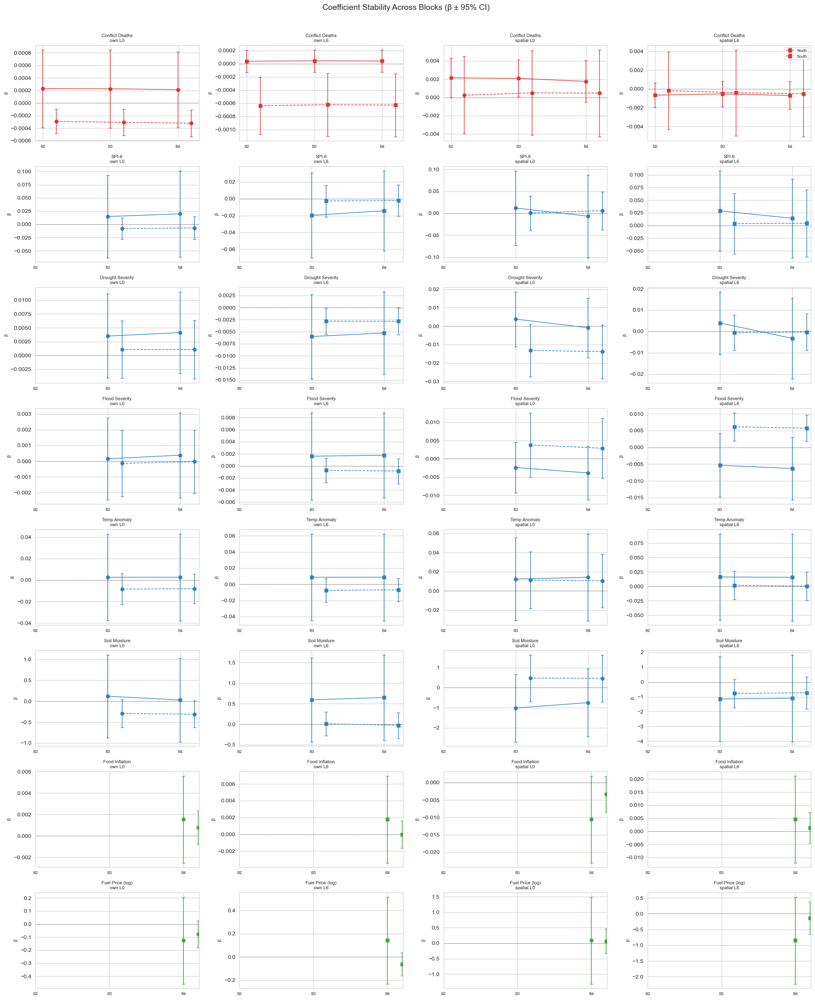

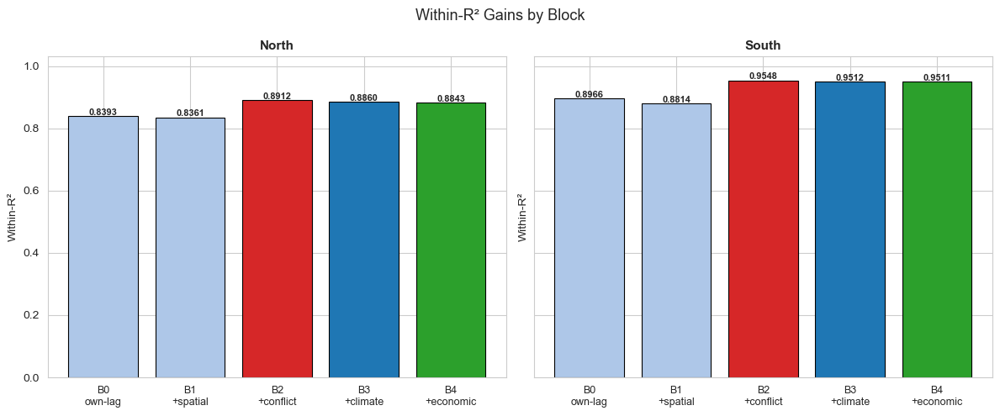

In [53]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from linearmodels import PanelOLS
import warnings
warnings.filterwarnings('ignore')

# ── CONFIG ────────────────────────────────────────────────────────────────────
K_NEIGHBORS = 30
OUTCOME     = 'ln_idp'
LAGS        = [0, 6]
REGIONS = {'North': 'North', 'South': 'South'}

CONFLICT_VARS = ['total_best_deaths']
CLIMATE_VARS  = ['spi6', 'spi6_drought_severity', 'spi6_flood_severity',
                 't2m_max_anom_1m', 'sm1_anom_1m']
ECONOMIC_VARS = ['inflation_food_price_index', 'ln_c_fuel_gas']
ALL_COVARS    = CONFLICT_VARS + CLIMATE_VARS + ECONOMIC_VARS

VAR_LABELS = {
    'total_best_deaths'          : 'Conflict Deaths',
    'spi6'                       : 'SPI-6',
    'spi6_drought_severity'      : 'Drought Severity',
    'spi6_flood_severity'        : 'Flood Severity',
    't2m_max_anom_1m'            : 'Temp Anomaly',
    'ndvi_anom_1m'               : 'NDVI Anomaly',
    'sm1_anom_1m'                : 'Soil Moisture',
    'inflation_food_price_index' : 'Food Inflation',
    'ln_c_fuel_gas'              : 'Fuel Price (log)',
}

GROUP_COLORS = {'conflict': '#d62728', 'climate': '#1f77b4', 'economic': '#2ca02c'}
VAR_GROUPS = {v: 'conflict' for v in CONFLICT_VARS}
VAR_GROUPS.update({v: 'climate'  for v in CLIMATE_VARS})
VAR_GROUPS.update({v: 'economic' for v in ECONOMIC_VARS})



# ── SPATIAL MATRIX ────────────────────────────────────────────────────────────
def build_spatial_matrix(tt_matrix, panel_df, k_neighbors=20):
    panel_districts = sorted(panel_df['adm2_standardized'].dropna().unique())
    shared = sorted(set(panel_districts) & set(tt_matrix.index) & set(tt_matrix.columns))
    tt_aligned = tt_matrix.loc[shared, shared].values.astype(float)
    np.fill_diagonal(tt_aligned, np.inf)
    W_raw = 1.0 / tt_aligned
    W_raw[~np.isfinite(W_raw)] = 0
    W = np.zeros_like(W_raw)
    for i in range(len(shared)):
        top_k = np.argsort(W_raw[i])[-k_neighbors:]
        W[i, top_k] = W_raw[i, top_k]
    row_sums = W.sum(axis=1, keepdims=True)
    W = np.where(row_sums > 0, W / row_sums, 0)
    return W, shared

def compute_W_col(data, var, W_mat, districts):
    pivot = (
        data.pivot_table(index='adm2_standardized', columns='yearmon_str',
                         values=var, aggfunc='first')
            .reindex(districts)
    )
    X  = pivot.values.astype(float)
    WX = W_mat @ np.where(np.isnan(X), 0, X)
    return (
        pd.DataFrame(WX, index=districts, columns=pivot.columns)
          .rename_axis('adm2_standardized').reset_index()
          .melt(id_vars='adm2_standardized', var_name='yearmon_str',
                value_name=f'W_{var}')
    )

tt = pd.read_csv(PROCESSED_DIR / 'travel_time_matrix.csv', index_col=0)
W, shared = build_spatial_matrix(tt, master_reg, k_neighbors=K_NEIGHBORS)
print(f'W shape: {W.shape} | shared districts: {len(shared)}')


# ── STEP 1: BUILD ALL REQUIRED COLUMNS ───────────────────────────────────────
_d = master_reg.copy()

if 'ln_idp' not in _d.columns:
    _d['ln_idp'] = np.log1p(_d['final_idp_count'])
if 'ln_c_fuel_gas' not in _d.columns:
    _d['ln_c_fuel_gas'] = np.log1p(_d['c_fuel_gas'].clip(lower=0))

# own lag persistence control
if 'ln_idp_L1' not in _d.columns:
    _d['ln_idp_L1'] = _d.groupby('adm2_standardized')['ln_idp'].shift(1)

# spatial lag of outcome at L0
if 'W_ln_idp' not in _d.columns:
    Wy = compute_W_col(_d, 'ln_idp', W, shared)
    _d = _d.merge(Wy, on=['yearmon_str', 'adm2_standardized'], how='left')
# W_ln_idp_L0 is just W_ln_idp itself (L0 = contemporaneous)
_d['W_ln_idp_L0'] = _d['W_ln_idp']

print('Building covariate lags...')
for var in ALL_COVARS:
    if var not in _d.columns:
        print(f'  SKIP {var}'); continue
    for L in LAGS:
        col = f'{var}_L{L}'
        if col not in _d.columns:
            _d[col] = _d.groupby('adm2_standardized')[var].shift(L)
    w_base = f'W_{var}'
    if w_base not in _d.columns:
        print(f'  Computing {w_base}...')
        Wy = compute_W_col(_d, var, W, shared)
        _d = _d.merge(Wy, on=['yearmon_str', 'adm2_standardized'], how='left')
    for L in LAGS:
        wl = f'W_{var}_L{L}'
        if wl not in _d.columns:
            _d[wl] = _d.groupby('adm2_standardized')[f'W_{var}'].shift(L)

_d['yearmon_dt'] = pd.to_datetime(_d['yearmon_str'])


# ── STEP 2: DEFINE CUMULATIVE BLOCKS ─────────────────────────────────────────
def lag_cols(vars_list):
    cols = []
    for v in vars_list:
        for L in LAGS:
            cols += [f'{v}_L{L}', f'W_{v}_L{L}']
    return cols

BLOCK_DEFS = {
    'B0 own-lag':      ['ln_idp_L1'],
    'B1 +spatial':     ['ln_idp_L1', 'W_ln_idp_L0'],
    'B2 +conflict':    ['ln_idp_L1', 'W_ln_idp_L0'] + lag_cols(CONFLICT_VARS),
    'B3 +climate':     ['ln_idp_L1', 'W_ln_idp_L0'] + lag_cols(CONFLICT_VARS) + lag_cols(CLIMATE_VARS),
    'B4 +economic':    ['ln_idp_L1', 'W_ln_idp_L0'] + lag_cols(CONFLICT_VARS) + lag_cols(CLIMATE_VARS) + lag_cols(ECONOMIC_VARS),
}


# ── STEP 3: RUN ALL BLOCKS × REGIONS ─────────────────────────────────────────
def run_block(df, outcome, regressors):
    cols = [outcome] + regressors
    sub  = df[cols].dropna()
    if len(sub) < 50:
        return None
    try:
        return PanelOLS(
            sub[outcome], sub[regressors],
            entity_effects=True, time_effects=True
        ).fit(cov_type='clustered', cluster_entity=True)
    except Exception:
        return None

block_results = {}   # key: (region, block_name)

for region_label, region_val in REGIONS.items():
    rdf = _d[_d['region_north'] == region_val].copy()
    panel = rdf.set_index(['adm2_standardized', 'yearmon_dt']).sort_index()
    print(f'\n── {region_label} ({len(rdf):,} obs) ──')

    for block_name, regressors in BLOCK_DEFS.items():
        regs_present = [r for r in regressors if r in panel.columns]
        res = run_block(panel, OUTCOME, regs_present)
        block_results[(region_label, block_name)] = res
        r2 = f'{res.rsquared_within:.4f}' if res else 'FAIL'
        print(f'  {block_name:<20}  Within-R²: {r2}  regressors: {len(regs_present)}')


# ── STEP 4: R² DECOMPOSITION TABLE ───────────────────────────────────────────
print(f'\n{"═"*70}')
print(f'  R² DECOMPOSITION BY BLOCK AND REGION')
print(f'{"═"*70}')
print(f'  {"Block":<22}  {"North R²":>10}  {"ΔR²":>8}  {"South R²":>10}  {"ΔR²":>8}')
print(f'  {"─"*66}')

prev = {'North': 0.0, 'South': 0.0}
for block_name in BLOCK_DEFS:
    row = f'  {block_name:<22}'
    for region_label in ['North', 'South']:
        res = block_results.get((region_label, block_name))
        r2  = res.rsquared_within if res else np.nan
        dr2 = r2 - prev[region_label] if not np.isnan(r2) else np.nan
        row += f'  {r2:>10.4f}  {dr2:>+8.4f}'
        if not np.isnan(r2):
            prev[region_label] = r2
    print(row)


# ── STEP 5: COEFFICIENT STABILITY TABLE ──────────────────────────────────────
COVAR_BLOCKS = ['B2 +conflict', 'B3 +climate', 'B4 +economic']

for region_label in ['North', 'South']:
    print(f'\n{"═"*90}')
    print(f'  COEFFICIENT STABILITY — {region_label}')
    print(f'{"═"*90}')

    all_covar_cols = lag_cols(ALL_COVARS)
    header = f'  {"Variable":<28}' + ''.join(f'  {b[-10:]:>18}' for b in COVAR_BLOCKS)
    print(header)
    print(f'  {"─"*86}')

    for col in all_covar_cols:
        row = f'  {col:<28}'
        prev_beta = None
        for block_name in COVAR_BLOCKS:
            res = block_results.get((region_label, block_name))
            if res is None or col not in res.params.index:
                row += f'  {"—":>18}'
                continue
            b = res.params[col]
            t = res.tstats[col]
            p = res.pvalues[col]
            sig = '***' if p < 0.01 else '**' if p < 0.05 else '*' if p < 0.1 else ''
            flag = ''
            if prev_beta is not None:
                if b * prev_beta < 0:
                    flag = '↕'           # sign flip
                elif abs(b) < 0.7 * abs(prev_beta):
                    flag = '↓'           # absorbed >30%
            cell = f'{b:+.3f}({t:+.2f}){sig}{flag}'
            row += f'  {cell:>18}'
            prev_beta = b
        print(row)


# ── STEP 6: FIGURES ───────────────────────────────────────────────────────────
# Fig A — Coefficient stability (β ± 95% CI across blocks, by region)
fig_a, axes = plt.subplots(len(ALL_COVARS), 4, figsize=(20, 3 * len(ALL_COVARS)),
                            sharey=False)
fig_a.suptitle('Coefficient Stability Across Blocks (β ± 95% CI)', fontsize=14, y=1.01)

block_x    = {b: i for i, b in enumerate(COVAR_BLOCKS)}
lag_styles = {0: 'o', 6: 's'}

for row_i, var in enumerate(ALL_COVARS):
    color = GROUP_COLORS[VAR_GROUPS[var]]
    for col_i, (w_type, prefix) in enumerate([('own L0',''), ('own L6',''),
                                               ('spatial L0','W_'), ('spatial L6','W_')]):
        L   = 0 if 'L0' in w_type else 6
        col = f'{prefix}{var}_L{L}'
        ax  = axes[row_i, col_i]

        for r_i, region_label in enumerate(['North', 'South']):
            xs, betas, cis = [], [], []
            for block_name in COVAR_BLOCKS:
                res = block_results.get((region_label, block_name))
                if res is None or col not in res.params.index:
                    continue
                xs.append(block_x[block_name] + r_i * 0.2)
                betas.append(res.params[col])
                cis.append(1.96 * res.std_errors[col])

            if xs:
                ls = '-' if region_label == 'North' else '--'
                ax.errorbar(xs, betas, yerr=cis, fmt=lag_styles[L],
                            color=color, alpha=0.85, linestyle=ls,
                            linewidth=1.2, capsize=3,
                            label=region_label if row_i == 0 else '')

        ax.axhline(0, color='black', linewidth=0.6, linestyle=':')
        ax.set_xticks(list(block_x.values()))
        ax.set_xticklabels([b.split()[0] for b in COVAR_BLOCKS], fontsize=7)
        ax.set_title(f'{VAR_LABELS[var]}\n{w_type}', fontsize=8)
        ax.set_ylabel('β', fontsize=8)
        if row_i == 0 and col_i == 3:
            ax.legend(fontsize=7)

plt.tight_layout()
plt.savefig(FIGURES_DIR / f'coef_stability_{OUTCOME}.png', dpi=150, bbox_inches='tight')
plt.show()

# Fig B — Within-R² waterfall
fig_b, axes_b = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
fig_b.suptitle('Within-R² Gains by Block', fontsize=13)

for ax, region_label in zip(axes_b, ['North', 'South']):
    blocks = list(BLOCK_DEFS.keys())
    r2s    = []
    for b in blocks:
        res = block_results.get((region_label, b))
        r2s.append(res.rsquared_within if res else np.nan)

    bar_colors = ['#aec7e8', '#aec7e8', '#d62728', '#1f77b4', '#2ca02c']
    ax.bar(range(len(blocks)), r2s, color=bar_colors, edgecolor='black', linewidth=0.8)
    for i, r2 in enumerate(r2s):
        if not np.isnan(r2):
            ax.text(i, r2 + 0.003, f'{r2:.4f}', ha='center', fontsize=8, fontweight='bold')

    ax.set_xticks(range(len(blocks)))
    ax.set_xticklabels([b.split()[0]+'\n'+b.split()[1] for b in blocks], fontsize=9)
    ax.set_ylabel('Within-R²')
    ax.set_title(region_label, fontsize=11, fontweight='bold')
    ax.set_ylim(0, max(r for r in r2s if not np.isnan(r)) * 1.08)

plt.tight_layout()
plt.savefig(FIGURES_DIR / f'r2_waterfall_{OUTCOME}.png', dpi=150, bbox_inches='tight')
plt.show()


In [46]:
from linearmodels import PanelOLS
import pandas as pd, numpy as np

_d = master_reg.copy()
if 'ln_idp' not in _d.columns:
    _d['ln_idp'] = np.log1p(_d['final_idp_count'])

_d['ln_idp_L1'] = _d.groupby('adm2_standardized')['ln_idp'].shift(1)

if 'W_ln_idp' not in _d.columns:
    Wy = compute_W_col(_d, 'ln_idp', W, shared)
    _d = _d.merge(Wy, on=['yearmon_str', 'adm2_standardized'], how='left')

_d['W_ln_idp_L1'] = _d.groupby('adm2_standardized')['W_ln_idp'].shift(1)

_d['yearmon_dt'] = pd.to_datetime(_d['yearmon_str'])
_panel = _d.set_index(['adm2_standardized', 'yearmon_dt'])[
    ['ln_idp', 'ln_idp_L1', 'W_ln_idp_L1']
].dropna()

res = PanelOLS(
    _panel['ln_idp'], _panel[['ln_idp_L1', 'W_ln_idp_L1']],
    entity_effects=True, time_effects=True
).fit(cov_type='clustered', cluster_entity=True)

print(f"{'Variable':<15} {'β':>10} {'t':>10} {'p':>10}")
print("─" * 48)
for var in ['ln_idp_L1', 'W_ln_idp_L1']:
    print(f"{var:<15} "
          f"{res.params[var]:>+10.4f} "
          f"{res.tstats[var]:>+10.3f} "
          f"{res.pvalues[var]:>10.4f}")
print(f"\nWithin-R²: {res.rsquared_within:.4f}   n = {int(res.nobs):,}")


Variable                 β          t          p
────────────────────────────────────────────────
ln_idp_L1          +0.8731    +41.947     0.0000
W_ln_idp_L1        +0.0892     +3.173     0.0015

Within-R²: 0.8510   n = 8,000


  GENERATING TEMPORAL & DISTRICT-LEVEL HEATMAPS


✓ Saving: heatmap_climate.png


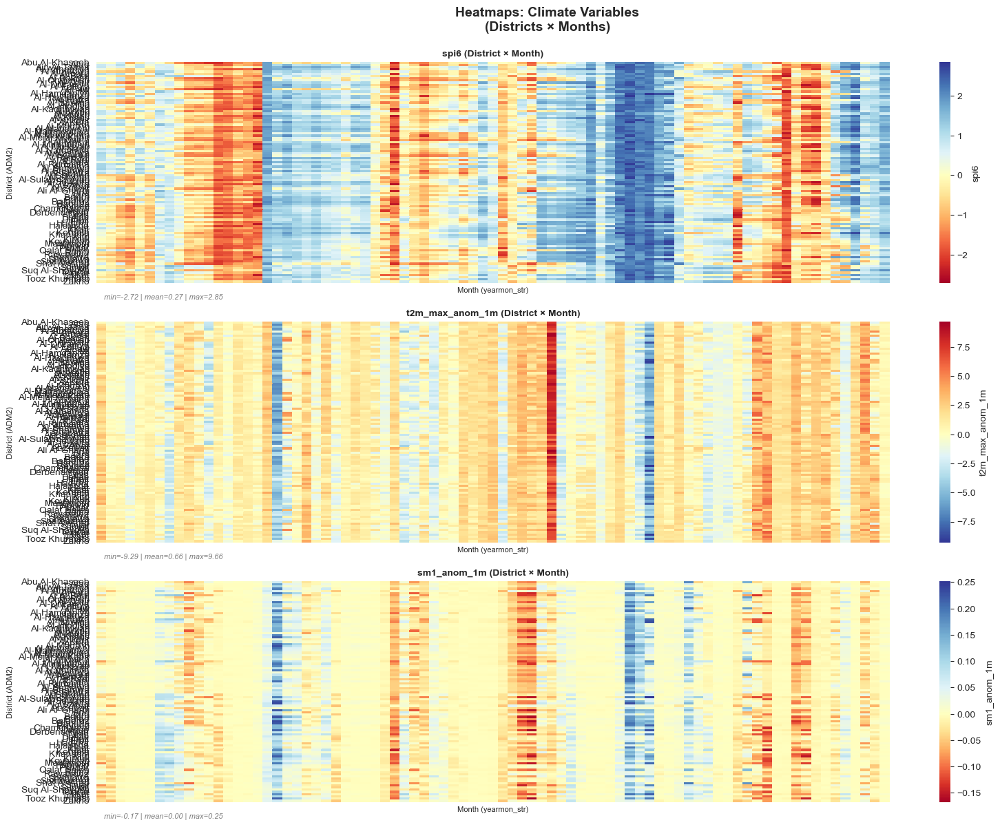

✓ Saving: heatmap_economic.png


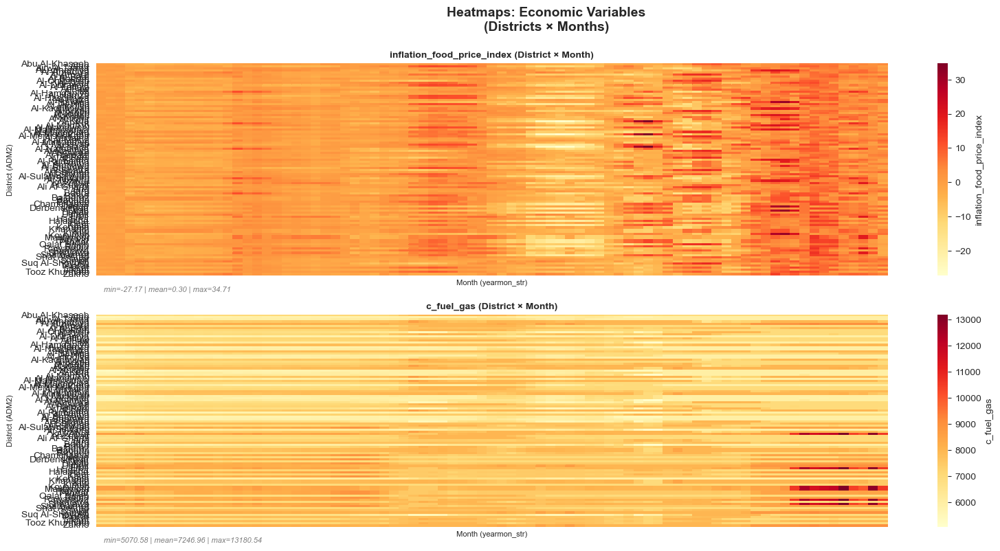

✓ Saving: heatmap_conflict.png


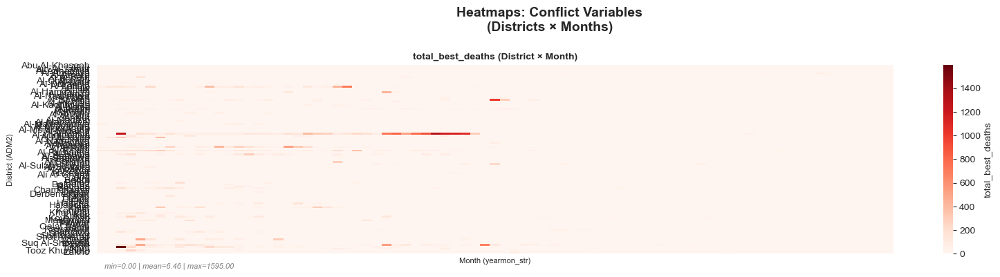

✓ Saving: heatmap_outcome.png


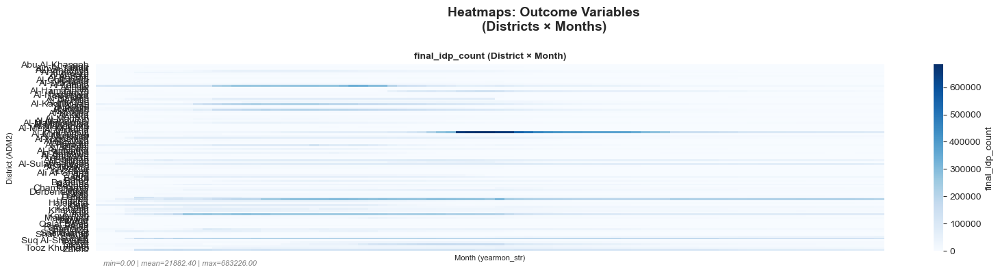


Generating combined overview heatmap...
✓ Saving: heatmap_combined_overview.png


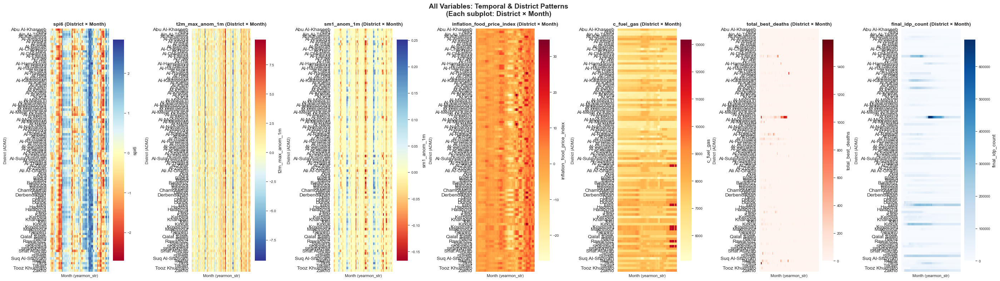


Generating region-stratified heatmaps...
⚠️  No data for region: North
⚠️  No data for region: South

  HEATMAP GENERATION COMPLETE


In [ ]:
# ============================================================================
# TEMPORAL & DISTRICT-LEVEL HEATMAPS
# ============================================================================
# Generates district × month heatmaps for outcome and covariates
# Each variable gets its own subplot with appropriate color scale
# ============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import TwoSlopeNorm
import warnings
warnings.filterwarnings('ignore')


# ─────────────────────────────────────────────────────────────────────────────
# 1.5 GENERATE SUMMARY FIGURES FOR DRAFT.MD
# ─────────────────────────────────────────────────────────────────────────────

print("Generating summary figures for draft.md...")

# Figure 1: Data Quality & Distribution Summary
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Data Quality & Distribution Summary', fontsize=16, fontweight='bold')

# Missingness heatmap
missing_data = master_reg[modeling_vars].isna()
sns.heatmap(missing_data, ax=ax1, cbar=False, cmap='Reds_r')
ax1.set_title('Missing Data Pattern (Red = Missing)')
ax1.set_xlabel('Variables')
ax1.set_ylabel('Observations')

# Distribution of IDP counts
sns.histplot(master_reg['final_idp_count'], ax=ax2, bins=50, kde=True)
ax2.set_title('Distribution of IDP Counts')
ax2.set_xlabel('IDP Count')
ax2.set_ylabel('Frequency')
ax2.axvline(master_reg['final_idp_count'].mean(), color='red', linestyle='--', label=f'Mean: {master_reg["final_idp_count"].mean():.0f}')
ax2.legend()

# Correlation heatmap
corr_vars = modeling_vars[:-1] + ['final_idp_count']  # exclude outcome from predictors but include
corr_matrix = master_reg[corr_vars].corr()
sns.heatmap(corr_matrix, ax=ax3, annot=True, cmap='coolwarm', center=0, fmt='.2f')
ax3.set_title('Correlation Matrix')

# Time series of total IDP
total_idp_over_time = master_reg.groupby('yearmon_str')['final_idp_count'].sum().reset_index()
total_idp_over_time['yearmon_str'] = pd.to_datetime(total_idp_over_time['yearmon_str'])
sns.lineplot(data=total_idp_over_time, x='yearmon_str', y='final_idp_count', ax=ax4)
ax4.set_title('Total IDP Over Time')
ax4.set_xlabel('Date')
ax4.set_ylabel('Total IDP Count')
ax4.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(FIGURES_DIR / 'data_quality_distribution_summary.png', dpi=150, bbox_inches='tight')
plt.show()

# Save text summary
summary_text = f"""
Data Quality & Distribution Summary

Dataset: master_reg (complete-case)
Total observations: {len(master_reg):,}
Districts: {master_reg['adm2_standardized'].nunique()}
Months: {master_reg['yearmon_str'].nunique()}

IDP Statistics:
- Mean: {master_reg['final_idp_count'].mean():.0f}
- Median: {master_reg['final_idp_count'].median():.0f}
- Min: {master_reg['final_idp_count'].min():.0f}
- Max: {master_reg['final_idp_count'].max():.0f}

Correlations with IDP:
"""
for var in modeling_vars[:-1]:
    corr = master_reg[var].corr(master_reg['final_idp_count'])
    summary_text += f"- {var}: {corr:.3f}\n"

with open(FIGURES_DIR / 'data_quality_distribution_summary.txt', 'w') as f:
    f.write(summary_text)

# Figure 2: Population Displacements (Linear vs. Logarithmic)
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Population Displacements (Linear vs. Logarithmic)', fontsize=16, fontweight='bold')

# Linear scale IDP
sns.histplot(master_reg['final_idp_count'], ax=ax1, bins=50, kde=True)
ax1.set_title('IDP Stock (Linear Scale)')
ax1.set_xlabel('IDP Count')
ax1.set_ylabel('Frequency')

# Log scale IDP
sns.histplot(master_reg['ln_idp'], ax=ax2, bins=50, kde=True)
ax2.set_title('IDP Stock (Log Scale)')
ax2.set_xlabel('Log IDP Count')
ax2.set_ylabel('Frequency')

# Linear scale Returnee
sns.histplot(master_reg['final_returnee_count'], ax=ax3, bins=50, kde=True)
ax3.set_title('Returnee Stock (Linear Scale)')
ax3.set_xlabel('Returnee Count')
ax3.set_ylabel('Frequency')

# Log scale Returnee
master_reg['ln_ret'] = np.log(master_reg['final_returnee_count'] + 1)
sns.histplot(master_reg['ln_ret'], ax=ax4, bins=50, kde=True)
ax4.set_title('Returnee Stock (Log Scale)')
ax4.set_xlabel('Log Returnee Count')
ax4.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig(FIGURES_DIR / 'population_distributions_linear_log.png', dpi=150, bbox_inches='tight')
plt.show()

# Figure 3: Environmental & Economic Shock Distributions
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Environmental & Economic Shock Distributions by Region', fontsize=16, fontweight='bold')

shock_vars = ['spi6', 't2m_max_anom_1m', 'sm1_anom_1m', 'inflation_food_price_index', 'c_fuel_gas']
axes = axes.flatten()

for i, var in enumerate(shock_vars):
    ax = axes[i]
    sns.boxplot(data=master_reg, x='region_north', y=var, ax=ax)
    ax.set_title(f'{var} by Region')
    ax.set_xlabel('Region (0=South, 1=North)')
    ax.set_ylabel(var)

# Remove empty subplot
fig.delaxes(axes[5])

plt.tight_layout()
plt.savefig(FIGURES_DIR / 'environmental_economic_distributions.png', dpi=150, bbox_inches='tight')
plt.show()

print("Summary figures generated and saved.")

# ─────────────────────────────────────────────────────────────────────────────
# 1. SETUP & CONFIG
# ─────────────────────────────────────────────────────────────────────────────

# Define variables and their properties
modeling_vars = [
    'spi6', 't2m_max_anom_1m',
    'sm1_anom_1m', 'inflation_food_price_index', 
    'c_fuel_gas', 'total_best_deaths', 
    'final_idp_count'
]

# Variable grouping and color schemes
VAR_GROUPS = {
    'Climate': ['spi6', 't2m_max_anom_1m', 'sm1_anom_1m'],
    'Economic': ['inflation_food_price_index', 'c_fuel_gas'],
    'Conflict': ['total_best_deaths'],
    'Outcome': ['final_idp_count']
}

# Color palettes per variable (choose appropriate scale)
VAR_CMAP = {
    'spi6'                      : 'RdYlBu',          # Red=drought, Blue=wet
    't2m_max_anom_1m'           : 'RdYlBu_r',        # Red=hot, Blue=cold
    'sm1_anom_1m'               : 'RdYlBu',          # Red=dry, Blue=wet
    'inflation_food_price_index': 'YlOrRd',          # Yellow→Orange→Red=rising prices
    'c_fuel_gas'                : 'YlOrRd',          # Yellow→Orange→Red=high price
    'total_best_deaths'         : 'Reds',            # Red intensity = death count
    'final_idp_count'           : 'Blues',           # Blue intensity = IDP count
}

# ─────────────────────────────────────────────────────────────────────────────
# 1.5 GENERATE SUMMARY FIGURES FOR DRAFT.MD
# ─────────────────────────────────────────────────────────────────────────────

print("Generating summary figures for draft.md...")

# Figure 1: Data Quality & Distribution Summary
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Data Quality & Distribution Summary', fontsize=16, fontweight='bold')

# Missingness heatmap
missing_data = master_reg[modeling_vars].isna()
sns.heatmap(missing_data, ax=ax1, cbar=False, cmap='Reds_r')
ax1.set_title('Missing Data Pattern (Red = Missing)')
ax1.set_xlabel('Variables')
ax1.set_ylabel('Observations')

# Distribution of IDP counts
sns.histplot(master_reg['final_idp_count'], ax=ax2, bins=50, kde=True)
ax2.set_title('Distribution of IDP Counts')
ax2.set_xlabel('IDP Count')
ax2.set_ylabel('Frequency')
ax2.axvline(master_reg['final_idp_count'].mean(), color='red', linestyle='--', label=f'Mean: {master_reg["final_idp_count"].mean():.0f}')
ax2.legend()

# Correlation heatmap
corr_vars = modeling_vars[:-1] + ['final_idp_count']  # exclude outcome from predictors but include
corr_matrix = master_reg[corr_vars].corr()
sns.heatmap(corr_matrix, ax=ax3, annot=True, cmap='coolwarm', center=0, fmt='.2f')
ax3.set_title('Correlation Matrix')

# Time series of total IDP
total_idp_over_time = master_reg.groupby('yearmon_str')['final_idp_count'].sum().reset_index()
total_idp_over_time['yearmon_str'] = pd.to_datetime(total_idp_over_time['yearmon_str'])
sns.lineplot(data=total_idp_over_time, x='yearmon_str', y='final_idp_count', ax=ax4)
ax4.set_title('Total IDP Over Time')
ax4.set_xlabel('Date')
ax4.set_ylabel('Total IDP Count')
ax4.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(FIGURES_DIR / 'data_quality_distribution_summary.png', dpi=150, bbox_inches='tight')
plt.show()

# Save text summary
summary_text = f"""
Data Quality & Distribution Summary

Dataset: master_reg (complete-case)
Total observations: {len(master_reg):,}
Districts: {master_reg['adm2_standardized'].nunique()}
Months: {master_reg['yearmon_str'].nunique()}

IDP Statistics:
- Mean: {master_reg['final_idp_count'].mean():.0f}
- Median: {master_reg['final_idp_count'].median():.0f}
- Min: {master_reg['final_idp_count'].min():.0f}
- Max: {master_reg['final_idp_count'].max():.0f}

Correlations with IDP:
"""
for var in modeling_vars[:-1]:
    corr = master_reg[var].corr(master_reg['final_idp_count'])
    summary_text += f"- {var}: {corr:.3f}\n"

with open(FIGURES_DIR / 'data_quality_distribution_summary.txt', 'w') as f:
    f.write(summary_text)

# Figure 2: Population Displacements (Linear vs. Logarithmic)
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Population Displacements (Linear vs. Logarithmic)', fontsize=16, fontweight='bold')

# Linear scale IDP
sns.histplot(master_reg['final_idp_count'], ax=ax1, bins=50, kde=True)
ax1.set_title('IDP Stock (Linear Scale)')
ax1.set_xlabel('IDP Count')
ax1.set_ylabel('Frequency')

# Log scale IDP
sns.histplot(master_reg['ln_idp'], ax=ax2, bins=50, kde=True)
ax2.set_title('IDP Stock (Log Scale)')
ax2.set_xlabel('Log IDP Count')
ax2.set_ylabel('Frequency')

# Linear scale Returnee
sns.histplot(master_reg['final_returnee_count'], ax=ax3, bins=50, kde=True)
ax3.set_title('Returnee Stock (Linear Scale)')
ax3.set_xlabel('Returnee Count')
ax3.set_ylabel('Frequency')

# Log scale Returnee
master_reg['ln_ret'] = np.log(master_reg['final_returnee_count'] + 1)
sns.histplot(master_reg['ln_ret'], ax=ax4, bins=50, kde=True)
ax4.set_title('Returnee Stock (Log Scale)')
ax4.set_xlabel('Log Returnee Count')
ax4.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig(FIGURES_DIR / 'population_distributions_linear_log.png', dpi=150, bbox_inches='tight')
plt.show()

# Figure 3: Environmental & Economic Shock Distributions
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Environmental & Economic Shock Distributions by Region', fontsize=16, fontweight='bold')

shock_vars = ['spi6', 't2m_max_anom_1m', 'sm1_anom_1m', 'inflation_food_price_index', 'c_fuel_gas']
axes = axes.flatten()

for i, var in enumerate(shock_vars):
    ax = axes[i]
    sns.boxplot(data=master_reg, x='region_north', y=var, ax=ax)
    ax.set_title(f'{var} by Region')
    ax.set_xlabel('Region (0=South, 1=North)')
    ax.set_ylabel(var)

# Remove empty subplot
fig.delaxes(axes[5])

plt.tight_layout()
plt.savefig(FIGURES_DIR / 'environmental_economic_distributions.png', dpi=150, bbox_inches='tight')
plt.show()

print("Summary figures generated and saved.")

# ─────────────────────────────────────────────────────────────────────────────
# 2. FUNCTION: CREATE HEATMAP FOR SINGLE VARIABLE
# ─────────────────────────────────────────────────────────────────────────────

def create_variable_heatmap(data, var, ax, cmap='viridis', vmin=None, vmax=None, 
                            use_diverging=False, center=None):
    """
    Create a district × month heatmap for a single variable
    
    Parameters:
    -----------
    data : DataFrame with 'adm2_standardized', 'yearmon_str', var columns
    var : variable name to plot
    ax : matplotlib axis to plot on
    cmap : colormap name
    vmin, vmax : colorbar limits
    use_diverging : if True, use TwoSlopeNorm centered at 0
    center : center value for diverging norm (typically 0 for anomalies)
    """
    
    # Pivot to matrix form: rows=districts, cols=months
    pivot = data.pivot_table(
        index='adm2_standardized',
        columns='yearmon_str',
        values=var,
        aggfunc='first'
    )
    
    # Sort districts and months chronologically
    pivot = pivot.sort_index(axis=0)  # districts A-Z
    pivot = pivot.reindex(sorted(pivot.columns), axis=1)  # months chronologically
    
    # Determine color scale
    if use_diverging and center is not None:
        vmin = pivot.min().min() if vmin is None else vmin
        vmax = pivot.max().max() if vmax is None else vmax
        norm = TwoSlopeNorm(vmin=vmin, vcenter=center, vmax=vmax)
        sns.heatmap(pivot, ax=ax, cmap=cmap, norm=norm, cbar_kws={'label': var},
                    xticklabels=False, yticklabels=True, linewidths=0.0)
    else:
        sns.heatmap(pivot, ax=ax, cmap=cmap, vmin=vmin, vmax=vmax,
                    cbar_kws={'label': var}, xticklabels=False, yticklabels=True,
                    linewidths=0.0)
    
    ax.set_title(f'{var} (District × Month)', fontsize=10, fontweight='bold')
    ax.set_xlabel('Month (yearmon_str)', fontsize=8)
    ax.set_ylabel('District (ADM2)', fontsize=8)
    
    return pivot

# ─────────────────────────────────────────────────────────────────────────────
# 3. GENERATE HEATMAPS BY THEMATIC GROUP
# ─────────────────────────────────────────────────────────────────────────────

# Assuming you have: master_reg (complete-case dataframe)
# If running in Jupyter, master_reg should already be in memory

print("=" * 80)
print("  GENERATING TEMPORAL & DISTRICT-LEVEL HEATMAPS")
print("=" * 80)

# Create one figure per thematic group
for group_name, group_vars in VAR_GROUPS.items():
    group_vars_present = [v for v in group_vars if v in master_reg.columns]
    
    if not group_vars_present:
        print(f"⚠️  Group '{group_name}' — no variables found in master_reg")
        continue
    
    n_vars = len(group_vars_present)
    fig, axes = plt.subplots(n_vars, 1, figsize=(16, n_vars * 4))
    
    # Handle single variable (no tuple unpacking)
    if n_vars == 1:
        axes = [axes]
    
    fig.suptitle(f'Heatmaps: {group_name} Variables\n(Districts × Months)', 
                 fontsize=14, fontweight='bold', y=0.995)
    
    for idx, var in enumerate(group_vars_present):
        ax = axes[idx]
        
        # Choose color scheme and diverging setting
        cmap = VAR_CMAP.get(var, 'viridis')
        
        # Climate anomalies: diverging centered at 0
        if var in ['spi6', 't2m_max_anom_1m', 'sm1_anom_1m']:
            use_diverging = True
            center = 0
        else:
            use_diverging = False
            center = None
        
        # Create heatmap
        pivot = create_variable_heatmap(
            master_reg, var, ax, 
            cmap=cmap, 
            use_diverging=use_diverging,
            center=center
        )
        
        # Summary stats on plot
        stats_text = (
            f"min={pivot.min().min():.2f} | "
            f"mean={pivot.values.flatten()[~np.isnan(pivot.values.flatten())].mean():.2f} | "
            f"max={pivot.max().max():.2f}"
        )
        ax.text(0.01, -0.05, stats_text, transform=ax.transAxes, 
               fontsize=8, va='top', color='gray', style='italic')
    
    plt.tight_layout()
    
    # Save figure
    out_path = f'heatmap_{group_name.lower()}.png'
    full_path = FIGURES_DIR / out_path
    print(f"✓ Saving: {full_path}")
    plt.savefig(full_path, dpi=150, bbox_inches='tight')
    plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 4. COMBINED OVERVIEW (All Variables, Single Row)
# ─────────────────────────────────────────────────────────────────────────────

print(f"\nGenerating combined overview heatmap...")

n_vars = len(modeling_vars)
fig, axes = plt.subplots(1, n_vars, figsize=(4 * n_vars, 8))

fig.suptitle('All Variables: Temporal & District Patterns\n(Each subplot: District × Month)', 
             fontsize=14, fontweight='bold')

for idx, var in enumerate(modeling_vars):
    if var not in master_reg.columns:
        axes[idx].text(0.5, 0.5, f'{var}\nNot found', 
                      ha='center', va='center', transform=axes[idx].transAxes)
        continue
    
    ax = axes[idx]
    cmap = VAR_CMAP.get(var, 'viridis')
    
    if var in ['spi6', 't2m_max_anom_1m', 'sm1_anom_1m']:
        use_diverging = True
        center = 0
    else:
        use_diverging = False
        center = None
    
    pivot = create_variable_heatmap(
        master_reg, var, ax,
        cmap=cmap,
        use_diverging=use_diverging,
        center=center
    )
    
    # Adjust colorbar size
    ax.collections[0].colorbar.ax.tick_params(labelsize=7)

plt.tight_layout()
out_path = 'heatmap_combined_overview.png'
full_path = FIGURES_DIR / out_path
print(f"✓ Saving: {full_path}")
plt.savefig(full_path, dpi=150, bbox_inches='tight')
plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 5. REGIONAL STRATIFICATION (North vs. South Heatmaps)
# ─────────────────────────────────────────────────────────────────────────────

# Assuming region column exists; adjust if needed
if 'region_north' in master_reg.columns:
    print(f"\nGenerating region-stratified heatmaps...")
    
    for region_name, region_val in [('North', 1), ('South', 0)]:
        region_data = master_reg[master_reg['region_north'] == region_val].copy()
        
        if region_data.empty:
            print(f"⚠️  No data for region: {region_name}")
            continue
        
        n_vars = len(modeling_vars)
        fig, axes = plt.subplots(n_vars, 1, figsize=(14, n_vars * 3))
        
        if n_vars == 1:
            axes = [axes]
        
        n_districts = region_data['adm2_standardized'].nunique()
        fig.suptitle(f'Region: {region_name} ({n_districts} districts) | All Variables', 
                     fontsize=13, fontweight='bold')
        
        for idx, var in enumerate(modeling_vars):
            if var not in region_data.columns:
                continue
            
            ax = axes[idx]
            cmap = VAR_CMAP.get(var, 'viridis')
            
            if var in ['spi6', 't2m_max_anom_1m', 'sm1_anom_1m']:
                use_diverging = True
                center = 0
            else:
                use_diverging = False
                center = None
            
            pivot = create_variable_heatmap(
                region_data, var, ax,
                cmap=cmap,
                use_diverging=use_diverging,
                center=center
            )
        
        plt.tight_layout()
        out_path = f'heatmap_region_{region_name.lower()}.png'
        full_path = FIGURES_DIR / out_path
        print(f"✓ Saving: {full_path}")
        plt.savefig(full_path, dpi=150, bbox_inches='tight')
        plt.show()

print("\n" + "=" * 80)
print("  HEATMAP GENERATION COMPLETE")
print("=" * 80)

# ============================================================================
# ADDITIONAL FIGURES FOR DRAFT_ACADEMIC.MD
# ============================================================================

# Figure: Absolute IDP Trend: North vs South Divide
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker
import copy

# 1. Preparation
plot_df = master_panel_df_sub[
    (master_panel_df_sub['yearmon_str'] >= '2014-04') & 
    (master_panel_df_sub['numPresentIdpInd_filled'].notna())
].copy()

def get_raw_panel(df, subset_districts, value_col):
    """Pivots absolute counts and blacks out entirely missing districts."""
    pivot = df.pivot_table(index="adm2_standardized", columns="yearmon_str", values=value_col, aggfunc="sum")
    
    # Reindex to enforce Geographic structural ordering (adds entirely missing districts as NaN)
    # Notice we removed the .dropna(how='all') so they stay in the grid!
    pivot = pivot.reindex(subset_districts)
    
    # Optional: also black out districts that mathematically equal 0 across the entire timeline
    zero_mask = (pivot == 0).all(axis=1)
    pivot.loc[zero_mask, :] = np.nan
    
    return pivot

def get_boundaries(labels):
    """Calculates position of dividing dotted lines for Governorates."""
    ticks, labels_out, bounds = [], [], []
    prev, start = None, 0
    for i, name in enumerate(labels):
        if name != prev:
            if prev is not None:
                ticks.append((start + i - 1) / 2)
                labels_out.append(prev)
                bounds.append(i - 0.5)
            start, prev = i, name
    ticks.append((start + len(labels) - 1) / 2)
    labels_out.append(prev)
    return ticks, labels_out, bounds

# Colormaps (Black for nulls / frozen data)
cmap_idp = copy.copy(plt.get_cmap("YlOrRd"))
cmap_idp.set_bad(color="black")
cmap_ret = copy.copy(plt.get_cmap("YlGnBu"))
cmap_ret.set_bad(color="black")

# 2. Main Visualization Grid Setup
fig = plt.figure(figsize=(30, 20))
gs = gridspec.GridSpec(2, 4, width_ratios=[20, 0.4, 20, 0.4], hspace=0.25, wspace=0.25)

# 3. Loop over the two Macro Regions
for col_idx, region_target in enumerate(['North', 'South']):
    
    # Slice the data
    reg_df = plot_df[plot_df['region_north'] == region_target].copy()
    
    # ── Simplified Sorting (Governorate -> District) ──
    adm_map = reg_df.groupby("adm2_standardized")["adm1_name"].first().reset_index()
    adm_map = adm_map.sort_values(["adm1_name", "adm2_standardized"])
    
    sorted_adm2 = adm_map["adm2_standardized"].tolist()
    adm1_labels = adm_map.set_index("adm2_standardized")["adm1_name"].tolist()
    
    # Calculate Raw Panels
    idp_pivot = get_raw_panel(reg_df, sorted_adm2, "final_idp_count")
    ret_pivot = get_raw_panel(reg_df, sorted_adm2, "final_returnee_count")
    
    # Get Tick Boundaries
    adm1_ticks, adm1_labs, adm1_bounds = get_boundaries(adm1_labels)
    
    plots = [
        (0, idp_pivot, cmap_idp, f"IDP Stock (Absolute) — {region_target.upper()} DIVIDE"),
        (1, ret_pivot, cmap_ret, f"Returnees (Absolute) — {region_target.upper()} DIVIDE")
    ]
    
    for row_idx, pivot_data, cmap, title in plots:
        
        # Route to exact Column in GridSpec
        ax_col = 0 if col_idx == 0 else 2
        cb_col = 1 if col_idx == 0 else 3
        
        ax = fig.add_subplot(gs[row_idx, ax_col])
        masked_data = np.ma.masked_invalid(pivot_data.values)
        
        # ── ABSOLUTE SCALING ──
        # Cap the color scale at the 98th percentile so massive districts don't wash out the color
        v_max = np.nanpercentile(masked_data.compressed(), 98) if len(masked_data.compressed()) > 0 else 1
        
        im = ax.imshow(masked_data, aspect="auto", cmap=cmap, vmin=0, vmax=v_max)
        
        # Primary Axis (Districts)
        ax.set_yticks(range(len(pivot_data)))
        ax.set_yticklabels(pivot_data.index, fontsize=8)
        
        # Secondary Axis (Governorates)
        ax_adm = ax.twinx()
        ax_adm.set_ylim(ax.get_ylim())
        ax_adm.set_yticks(adm1_ticks)
        ax_adm.set_yticklabels(adm1_labs, fontweight='bold', fontsize=11, color="#2c3e50") 
        ax_adm.tick_params(right=False)
        
        # Visual Divides
        for b in adm1_bounds: ax.axhline(y=b, color="gray", lw=1.2, ls="--", alpha=0.9)
        
        ax.set_title(title, fontsize=18, fontweight='black', pad=15)
        
        # Format X-axis to 5-month intervals (consistent with previous plots)
        step = 5
        ax.set_xticks(range(0, len(pivot_data.columns), step))
        ax.set_xticklabels([str(pivot_data.columns[i]) for i in range(0, len(pivot_data.columns), step)], 
                           rotation=45, ha='right', fontsize=9)
        
        # Colorbar (Added Comma formatting for raw counts)
        cb_ax = fig.add_subplot(gs[row_idx, cb_col])
        cb = plt.colorbar(im, cax=cb_ax, extend='max')
        cb.set_label("Absolute Individuals", fontweight='bold')
        cb.ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"{int(x):,}"))

fig.suptitle("Absolute IDP Trend: North vs South Divide", fontsize=28, fontweight='black', y=1.02)
plt.subplots_adjust(top=0.93, right=0.95)
plt.savefig(FIGURES_DIR / 'absolute_idp_trends_north_south.png', dpi=150, bbox_inches='tight')
plt.show()

# Figure: Aggregate Governorate Trends: Returnee Pulse (ADM1)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

# 1. Preparation & Filtering
selected_govs = [ 'Kirkuk', 'Ninewa', 'Salah Al-Din', 'Al-Anbar','Diyala',]

# Ensure we use the full panel for aggregation
plot_df = master_panel_df_sub[
    (master_panel_df_sub['yearmon_str'] >= '2014-04') & 
    (master_panel_df_sub['yearmon_str'] <= '2024-08') &
    (master_panel_df_sub['adm1_name'].isin(selected_govs))
].copy()

# 2. Aggregate to ADM1 Level (Summing all districts per month)
adm1_trends = (
    plot_df.groupby(['adm1_name', 'yearmon_str'])['final_returnee_count']
    .sum()
    .reset_index()
    .sort_values(['adm1_name', 'yearmon_str'])
)

# 3. Plotting (5 Vertical Subplots)
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(15, 20), sharex=True)
fig.suptitle("Aggregate Governorate Trends: Returnee Pulse (ADM1)", 
             fontsize=24, fontweight='black', y=1.02)

for i, gov in enumerate(selected_govs):
    ax = axes[i]
    # Filter aggregated data for this specific governorate
    gov_data = adm1_trends[adm1_trends['adm1_name'] == gov]
    
    # Plot Returnee Trend (Steel Blue)
    ax.plot(gov_data['yearmon_str'], gov_data['final_returnee_count'], 
            color='#1f77b4', lw=4, label='Total Returnees')
    
    # Formatting & Aesthetics
    ax.set_title(gov.upper(), loc='left', fontsize=18, fontweight='bold', pad=10)
    ax.yaxis.set_major_formatter(mticker.StrMethodFormatter('{x:,.0f}'))
    ax.grid(True, linestyle='--', alpha=0.4)
    
    # Hide top/right spines for a cleaner academic look
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Set X-Ticks to Every 5 Months
    step = 5
    ax.set_xticks(range(0, len(gov_data), step))
    ax.set_xticklabels(gov_data['yearmon_str'].iloc[::step], rotation=45, ha='right', fontsize=10)
    ax.tick_params(axis='x', labelbottom=True)

axes[-1].set_xlabel("Timeline (Month)", fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig(FIGURES_DIR / 'aggregate_governorate_returnee_trends.png', dpi=150, bbox_inches='tight')
plt.show()

print("Additional figures saved.")


## 3) Run Panel Regressions

In [ ]:
# ============================================================================
# STAGE 3 — BLOCK SEQUENTIAL REGRESSION WITH LAG SELECTION
# ----------------------------------------------------------------------------
# Project : Climate-Displacement Modelling — Iraq ADM2
# Author  : Chungmann Kim (Manny), JHU Center for Humanitarian Health
# PI      : Paul Spiegel
#
# Changes from prior version:
#   - dlog outcomes now use W_dlog_*_L1 as spatial persistence control
#     (level outcomes retain W_ln_*_L1 — unit consistency)
#   - Stage A: own / spatial selected separately (unchanged — avoids collinearity)
#   - Stage B: both own-winner AND spatial-winner entered simultaneously per var
#     → separates local effect from regional spillover channel
# ============================================================================

import pandas as pd
import numpy as np
from linearmodels import PanelOLS
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# ── 0. CONFIG ─────────────────────────────────────────────────────────────────
OUTCOME     = 'ln_idp'        # ← change here only
LAG_WINDOWS = [0, 3, 6, 9, 12]
REGIONS     = ['North', 'South']
REGION_COL  = 'region_north'
OUT_DIR     = PROCESSED_DIR / f'stage3_block_{OUTCOME}_v4'  # FLAG: hardcoded
OUT_DIR.mkdir(parents=True, exist_ok=True)

# ── 0a. OUTCOME → CONTROL MAPPING ─────────────────────────────────────────────
# W_ctrl unit rule:
#   level outcome  (ln_*)   → W · log(stock)   at L1  [level control]
#   change outcome (dlog_*) → W · dlog(stock)  at L1  [change control — unit consistent]
OUTCOME_META = {
    'ln_idp'  : {'raw': 'final_idp_count',
                 'W_raw': 'W_final_idp_count',
                 'W_ctrl': 'W_ln_idp_L1'},
    'dlog_idp': {'raw': 'final_idp_count',
                 'W_raw': 'W_final_idp_count',
                 'W_ctrl': 'W_dlog_idp_L1'},    # ← changed: dlog control
    'ln_ret'  : {'raw': 'final_returnee_count',
                 'W_raw': 'W_final_returnee_count',
                 'W_ctrl': 'W_ln_ret_L1'},
    'dlog_ret': {'raw': 'final_returnee_count',
                 'W_raw': 'W_final_returnee_count',
                 'W_ctrl': 'W_dlog_ret_L1'},     # ← changed: dlog control
}
assert OUTCOME in OUTCOME_META, \
    f"OUTCOME '{OUTCOME}' not recognised. Options: {list(OUTCOME_META)}"

META    = OUTCOME_META[OUTCOME]
W_CTRL  = META['W_ctrl']
RAW_COL = META['raw']
W_RAW   = META['W_raw']

# ── 0b. VARIABLE DEFINITIONS ──────────────────────────────────────────────────
VAR_GROUP = {
    'total_best_deaths'         : 'conflict',
    'spi6'                      : 'drought',
    't2m_max_anom_1m'           : 'temperature',
    'sm1_anom_1m'               : 'soil',
    'inflation_food_price_index': 'economic',
    'ln_c_fuel_gas'             : 'economic',
}
ALL_VARS = list(VAR_GROUP.keys())

# Stage B blocks — variable names only (own+spatial cols resolved inside loop)
BLOCKS = {
    'B1_conflict': ['total_best_deaths'],
    'B2_climate' : ['total_best_deaths', 'spi6', 't2m_max_anom_1m', 'sm1_anom_1m'],
    'B3_full'    : ['total_best_deaths', 'spi6', 't2m_max_anom_1m', 'sm1_anom_1m',
                    'inflation_food_price_index', 'ln_c_fuel_gas'],
}

# ── 0c. STARTUP HEADER ────────────────────────────────────────────────────────
print('=' * 70)
print('  STAGE 3 — RUN CONFIGURATION')
print('=' * 70)
print(f'  Outcome variable  : {OUTCOME}')
print(f'  Raw stock column  : {RAW_COL}')
print(f'  Spatial control   : {W_CTRL}')
print(f'  Regions           : {REGIONS}')
print(f'  Lag windows       : {LAG_WINDOWS}')
print(f'  Candidate vars    : {ALL_VARS}')
print(f'  Stage B design    : own-winner + spatial-winner per var (both entered)')
print('=' * 70)



# ── 1. PREP ───────────────────────────────────────────────────────────────────
df = master_reg[master_reg['yearmon_str'] < '2025-01'].copy()

df['ln_c_fuel_gas'] = np.log1p(df['c_fuel_gas'].clip(lower=0))
df['ln_idp']        = np.log1p(df['final_idp_count'])
df['dlog_idp']      = df.groupby('adm2_standardized')['ln_idp'].diff()
df['ln_ret']        = np.log1p(df['final_returnee_count'])
df['dlog_ret']      = df.groupby('adm2_standardized')['ln_ret'].diff()

assert REGION_COL in df.columns, f'{REGION_COL} missing'
print(f'\nRegion counts (districts):')
print(df.drop_duplicates('adm2_standardized')[REGION_COL].value_counts())
print(f'df shape: {df.shape}')

# ── REBUILD W ─────────────────────────────────────────────────────────────────
tt = pd.read_csv(PROCESSED_DIR / 'travel_time_matrix.csv', index_col=0)
W, shared = build_spatial_matrix(tt, df, k_neighbors=30)
print(f"  W shape : {W.shape} | shared districts: {len(shared)}")

# ── 2. SPATIAL LAG HELPER ─────────────────────────────────────────────────────
def compute_W_col(data, var, W_mat, districts):
    pivot = (
        data.pivot_table(index='adm2_standardized', columns='yearmon_str',
                         values=var, aggfunc='first')
            .reindex(districts)
    )
    X  = pivot.values.astype(float)
    WX = W_mat @ np.where(np.isnan(X), 0, X)
    return (
        pd.DataFrame(WX, index=districts, columns=pivot.columns)
          .rename_axis('adm2_standardized').reset_index()
          .melt(id_vars='adm2_standardized', var_name='yearmon_str',
                value_name=f'W_{var}')
    )

# ── 3. BUILD SPATIAL PERSISTENCE CONTROL ─────────────────────────────────────
# For dlog outcomes: need W_dlog_*_L1 (not W_ln_*_L1)
# Strategy: compute W on the log-level stock, then diff the spatial lag
print('\nBuilding spatial persistence control...')

if W_RAW not in df.columns:
    Wy = compute_W_col(df, RAW_COL, W, shared)
    Wy = Wy.rename(columns={f'W_{RAW_COL}': W_RAW})
    df = df.merge(Wy, on=['yearmon_str', 'adm2_standardized'], how='left')

ln_base = f'ln_{OUTCOME.split("_")[1]}'          # e.g. 'ln_idp'
dlog_base = f'dlog_{OUTCOME.split("_")[1]}'       # e.g. 'dlog_idp'

df[f'W_{ln_base}']   = np.log1p(df[W_RAW])
df[f'W_{dlog_base}'] = (df.groupby('adm2_standardized')[f'W_{ln_base}']
                           .diff())               # spatial lag of dlog

# L1 lag of both (used as W_ctrl candidates)
df[f'W_{ln_base}_L1']   = df.groupby('adm2_standardized')[f'W_{ln_base}'].shift(1)
df[f'W_{dlog_base}_L1'] = df.groupby('adm2_standardized')[f'W_{dlog_base}'].shift(1)

print(f'  W_ctrl column     : {W_CTRL}')
print(f'  W_ctrl non-null   : {df[W_CTRL].notna().sum()} / {len(df)}')
print(f'  W_ctrl sample     :\n{df[[W_CTRL]].describe().round(3)}')

# ── 4. OWN LAGS + SPATIAL LAGS FOR ALL VARS ──────────────────────────────────
print('\nConstructing own lags and spatial lags...')
for var in ALL_VARS:
    if var not in df.columns:
        print(f'  SKIP {var} — not in df'); continue
    for L in LAG_WINDOWS:
        col = f'{var}_L{L}'
        if col not in df.columns:
            df[col] = df.groupby('adm2_standardized')[var].shift(L)
    w_col = f'W_{var}'
    if w_col not in df.columns:
        print(f'  Computing {w_col}...')
        Wy = compute_W_col(df, var, W, shared)
        df = df.merge(Wy, on=['yearmon_str', 'adm2_standardized'], how='left')
    for L in LAG_WINDOWS:
        wl = f'W_{var}_L{L}'
        if wl not in df.columns:
            df[wl] = df.groupby('adm2_standardized')[w_col].shift(L)

print(f'df shape after lag construction: {df.shape}')

# ── 5. COMPLETE-CASE SAMPLE SUBSETTING ───────────────────────────────────────
print('\nSubsetting to complete cases...')

ID_COLS = ['adm2_standardized', 'yearmon_str']

all_lag_cols = []
for var in ALL_VARS:
    if var not in df.columns:
        continue
    for L in LAG_WINDOWS:
        for pfx in ['', 'W_']:
            c = f'{pfx}{var}_L{L}'
            if c in df.columns:
                all_lag_cols.append(c)

required_cols = ID_COLS + [OUTCOME, W_CTRL] + all_lag_cols
available     = [c for c in required_cols if c in df.columns]
missing_cols  = set(required_cols) - set(available)
if missing_cols:
    print(f'  WARNING — missing cols: {missing_cols}')

df_complete = df[available].copy()
before = len(df_complete)
df_complete = df_complete.dropna(subset=[OUTCOME, W_CTRL])
after  = len(df_complete)
print(f'  Rows before dropna : {before:,}')
print(f'  Rows after         : {after:,}  (dropped {before-after:,})')

df_complete = df_complete.merge(
    df[['adm2_standardized', 'yearmon_str', REGION_COL]].drop_duplicates(),
    on=['adm2_standardized', 'yearmon_str'], how='left'
)

print(f'\nComplete-case sample by region:')
print(df_complete.groupby(REGION_COL)['adm2_standardized']
                 .agg(['nunique', 'count'])
                 .rename(columns={'nunique': 'districts', 'count': 'obs'}))

# ── 6. PANEL HELPERS ──────────────────────────────────────────────────────────
def make_panel(data):
    d = data.copy()
    d['yearmon_dt'] = pd.to_datetime(d['yearmon_str'])
    return d.set_index(['adm2_standardized', 'yearmon_dt']).sort_index()

def run_ols(panel, y, regressors):
    cols = [y] + regressors
    sub  = panel[cols].dropna()
    n    = len(sub)
    if n < 50:
        return None, n
    try:
        res = PanelOLS(
            sub[y].squeeze(), sub[regressors],
            entity_effects=True, time_effects=True,
        ).fit(cov_type='clustered', cluster_entity=True)
        return res, n
    except Exception as e:
        print(f'    OLS error: {e}')
        return None, 0

def coef_row(res, n, var_col, var, lag, w_type, block, region, sample):
    row = dict(
        outcome_var=OUTCOME, w_ctrl=W_CTRL,
        region=region, block=block, sample=sample,
        variable=var, lag=lag, w_type=w_type,
        var_col=var_col, n_obs=n,
        beta=np.nan, se=np.nan, tstat=np.nan,
        pval=np.nan, sig='', within_r2=np.nan,
    )
    if res is None:
        return row
    b  = res.params.get(var_col, np.nan)
    t  = res.tstats.get(var_col, np.nan)
    p  = res.pvalues.get(var_col, np.nan)
    se = res.std_errors.get(var_col, np.nan)
    row.update(
        beta=b, se=se, tstat=t, pval=p,
        sig=('***' if p<0.01 else '**' if p<0.05 else '*' if p<0.1 else ''),
        within_r2=res.rsquared,
    )
    return row

# ── 7. STAGE A — BIVARIATE LAG SELECTION ─────────────────────────────────────
# own and spatial selected SEPARATELY — avoids collinearity in selection stage
# both winners then enter Stage B simultaneously
print('\n' + '='*70)
print(f'  STAGE A — BIVARIATE LAG SELECTION (own & spatial separate)')
print(f'  Outcome: {OUTCOME}  |  W_ctrl: {W_CTRL}')
print('='*70)

biv_records = []

for region in REGIONS:
    rdf    = df_complete[df_complete[REGION_COL] == region].copy()
    panel  = make_panel(rdf)
    n_dist = rdf['adm2_standardized'].nunique()
    print(f'\n  {region}: {n_dist} districts, {len(rdf):,} obs')

    for var in ALL_VARS:
        for w_type, prefix in [('own', ''), ('spatial', 'W_')]:
            for L in LAG_WINDOWS:
                col = f'{prefix}{var}_L{L}'
                if col not in panel.columns:
                    continue
                res, n = run_ols(panel, OUTCOME, [W_CTRL, col])
                row    = coef_row(res, n, col, var, L, w_type,
                                  block='bivariate', region=region,
                                  sample='full')
                biv_records.append(row)

biv_df = pd.DataFrame(biv_records)
biv_df['tstat_abs'] = biv_df['tstat'].abs()

# best lag per var × region × w_type (own and spatial kept separate)
lag_selection = (
    biv_df.sort_values('tstat_abs', ascending=False)
          .groupby(['region', 'variable', 'w_type'], as_index=False)
          .first()
    [['outcome_var', 'w_ctrl', 'region', 'variable', 'w_type',
      'lag', 'var_col', 'beta', 'tstat', 'tstat_abs', 'sig', 'n_obs']]
)

# lag_winner: one row per var × region × w_type (NOT collapsed across w_type)
# → both own-winner and spatial-winner retained for Stage B
lag_winner = lag_selection.rename(columns={
    'var_col'  : 'winner_col',
    'w_type'   : 'winner_wtype',
    'lag'      : 'winner_lag',
    'tstat'    : 'winner_tstat',
    'tstat_abs': 'winner_tstat_abs',
    'beta'     : 'winner_beta',
})

print('\nLag winners (own AND spatial per var × region):')
print(lag_winner[['region', 'variable', 'winner_wtype', 'winner_lag',
                  'winner_tstat_abs', 'winner_tstat', 'sig']]
      .sort_values(['region', 'variable', 'winner_wtype'])
      .to_string(index=False))

# ── 8. STAGE B — BLOCK SEQUENTIAL REGRESSIONS ────────────────────────────────
# Each variable enters with BOTH its own-winner and spatial-winner columns
# → local effect and spillover channel estimated simultaneously
print('\n' + '='*70)
print(f'  STAGE B — BLOCK SEQUENTIAL REGRESSIONS')
print(f'  Design : own-winner + spatial-winner per variable')
print(f'  Outcome: {OUTCOME}  |  W_ctrl: {W_CTRL}')
print('='*70)

block_records = []

for region in REGIONS:
    rdf = df_complete[df_complete[REGION_COL] == region].copy()

    # build two maps: own winner and spatial winner per variable
    own_map = (
        lag_winner[(lag_winner['region'] == region) &
                   (lag_winner['winner_wtype'] == 'own')]
        .set_index('variable')['winner_col'].to_dict()
    )
    spatial_map = (
        lag_winner[(lag_winner['region'] == region) &
                   (lag_winner['winner_wtype'] == 'spatial')]
        .set_index('variable')['winner_col'].to_dict()
    )

    panel = make_panel(rdf)

    print(f'\n{"─"*60}')
    print(f'  REGION : {region.upper()}')
    print(f'  Outcome: {OUTCOME}  |  W_ctrl: {W_CTRL}')
    print(f'  Own winners     : {own_map}')
    print(f'  Spatial winners : {spatial_map}')
    print(f'  obs: {panel.shape[0]:,}  ({rdf["adm2_standardized"].nunique()} districts)')

    for block_name, block_vars in BLOCKS.items():
        # collect own + spatial cols for all vars in this block
        block_cols = []
        for v in block_vars:
            if v in own_map and own_map[v] in rdf.columns:
                block_cols.append(own_map[v])
            if v in spatial_map and spatial_map[v] in rdf.columns:
                block_cols.append(spatial_map[v])

        if not block_cols:
            print(f'  {block_name}: no valid cols — skip'); continue

        regressors = [W_CTRL] + block_cols
        res, n     = run_ols(panel, OUTCOME, regressors)

        # record a row for each var × w_type combination
        for v in block_vars:
            for wtype, wmap in [('own', own_map), ('spatial', spatial_map)]:
                col = wmap.get(v)
                if col is None:
                    continue
                wm  = lag_winner[(lag_winner['region'] == region) &
                                 (lag_winner['variable'] == v) &
                                 (lag_winner['winner_wtype'] == wtype)]
                lag = int(wm['winner_lag'].values[0]) if len(wm) else np.nan
                row = coef_row(res, n, col, v, lag, wtype,
                               block=block_name, region=region, sample='full')
                block_records.append(row)

        # block-level R² row
        block_records.append(dict(
            outcome_var=OUTCOME, w_ctrl=W_CTRL,
            region=region, block=block_name, sample='full',
            variable='_BLOCK_R2_', lag=np.nan, w_type='',
            var_col='', n_obs=n, beta=np.nan, se=np.nan,
            tstat=np.nan, pval=np.nan, sig='',
            within_r2=res.rsquared if res else np.nan,
        ))

        if res:
            print(f'\n  {block_name} | R²={res.rsquared:.3f} | N={n}')
            print(f'  {"Variable":<30} {"w_type":<8} {"col":<35} {"β":>10} {"t":>8}  sig')
            print(f'  {"-"*95}')
            for v in block_vars:
                for wtype, wmap in [('own', own_map), ('spatial', spatial_map)]:
                    col = wmap.get(v)
                    if col and col in res.params.index:
                        b   = res.params[col]
                        t   = res.tstats[col]
                        p   = res.pvalues[col]
                        sig = '***' if p<0.01 else '**' if p<0.05 else '*' if p<0.1 else ''
                        print(f'  {v:<30} {wtype:<8} {col:<35} {b:>+10.4f} {t:>+8.2f}  {sig}')

block_df = pd.DataFrame(block_records)

# ── 9. β STABILITY TABLE ──────────────────────────────────────────────────────
var_rows = block_df[block_df['variable'] != '_BLOCK_R2_'].copy()

stability = var_rows.pivot_table(
    index=['outcome_var', 'w_ctrl', 'region', 'variable', 'w_type', 'lag', 'sample'],
    columns='block',
    values=['beta', 'tstat', 'sig'],
    aggfunc='first'
).round(4)
stability.columns = ['_'.join(c) for c in stability.columns]
stability = stability.reset_index()

b1_col = 'beta_B1_conflict'
b2_col = 'beta_B2_climate'
b3_col = 'beta_B3_full'

if all(c in stability.columns for c in [b1_col, b2_col]):
    both_notna = stability[b1_col].notna() & stability[b2_col].notna()

    # conflict_absorb: β 절댓값이 30% 이상 줄어든 경우 (방향 유지)
    # 이전 코드는 증가도 True로 잡았음 — 수정
    stability['conflict_absorb'] = (
        both_notna &
        (stability[b1_col] * stability[b2_col] > 0) &          # 부호 유지
        (stability[b2_col].abs() <
         stability[b1_col].abs() * 0.70)                        # 절댓값 30%+ 감소
    )

    # sign_flip: B1 → B2에서 부호가 완전히 뒤집힌 경우
    # 예: South 분쟁처럼 양수 → 음수
    stability['sign_flip'] = (
        both_notna &
        (stability[b1_col] * stability[b2_col] < 0)             # 곱이 음수 = 부호 반대
    )

    # conflict_strengthen: 기후 통제 후 오히려 β가 강해진 경우
    # 예: North spatial 분쟁처럼 기후를 통제하면 더 선명해지는 경우
    stability['conflict_strengthen'] = (
        both_notna &
        (stability[b1_col] * stability[b2_col] > 0) &           # 부호 유지
        (stability[b2_col].abs() >
         stability[b1_col].abs() * 1.30)                        # 절댓값 30%+ 증가
    )

# ── 10. CONSOLE SUMMARY ───────────────────────────────────────────────────────
print('\n' + '='*70)
print(f'  β STABILITY — outcome={OUTCOME}  W_ctrl={W_CTRL}')
print('='*70)
show_cols = ['outcome_var', 'w_ctrl', 'region', 'variable', 'w_type', 'lag', 'sample']
for c in [b1_col, b2_col, b3_col]:
    if c in stability.columns:
        show_cols.append(c)
for flag in ['conflict_absorb', 'sign_flip', 'conflict_strengthen']:
    if flag in stability.columns:
        show_cols.append(flag)

print(stability[stability['sample'] == 'full'][show_cols]
      .sort_values(['region', 'variable', 'w_type'])
      .to_string(index=False))

# ── 11. RESULTS SUMMARY ───────────────────────────────────────────────────────
print('\n' + '='*70)
print('  RESULTS IN MEMORY')
print('='*70)
print(f'  biv_df       : {biv_df.shape}   — all bivariate results')
print(f'  lag_selection: {lag_selection.shape}  — best lag per var×region×wtype')
print(f'  lag_winner   : {lag_winner.shape}  — own+spatial winner per var×region')
print(f'  block_df     : {block_df.shape}  — all block regression results')
print(f'  stability    : {stability.shape}  — β across B1→B2→B3')
print(f'\n  outcome_var = {OUTCOME}')
print(f'  w_ctrl      = {W_CTRL}')

  STAGE 3 — RUN CONFIGURATION
  Outcome variable  : dlog_idp
  Raw stock column  : final_idp_count
  Spatial control   : W_dlog_idp_L1
  Regions           : ['North', 'South']
  Lag windows       : [1, 3, 6, 9, 12]
  Candidate vars    : ['total_best_deaths', 'spi6', 't2m_max_anom_1m', 'sm1_anom_1m', 'inflation_food_price_index', 'ln_c_fuel_gas']
  Stage B design    : own-winner + spatial-winner per var (both entered)

Region counts (districts):
North    67
South    33
Name: region_north, dtype: int64
df shape: (8100, 52)
  W shape : (100, 100) | shared districts: 100

Building spatial persistence control...
  W_ctrl column     : W_dlog_idp_L1
  W_ctrl non-null   : 7900 / 8100
  W_ctrl sample     :
       W_dlog_idp_L1
count       7900.000
mean           0.017
std            0.165
min           -0.220
25%           -0.036
50%           -0.011
75%            0.011
max            1.556

Constructing own lags and spatial lags...
  Computing W_total_best_deaths...
  Computing W_spi6...
  Co

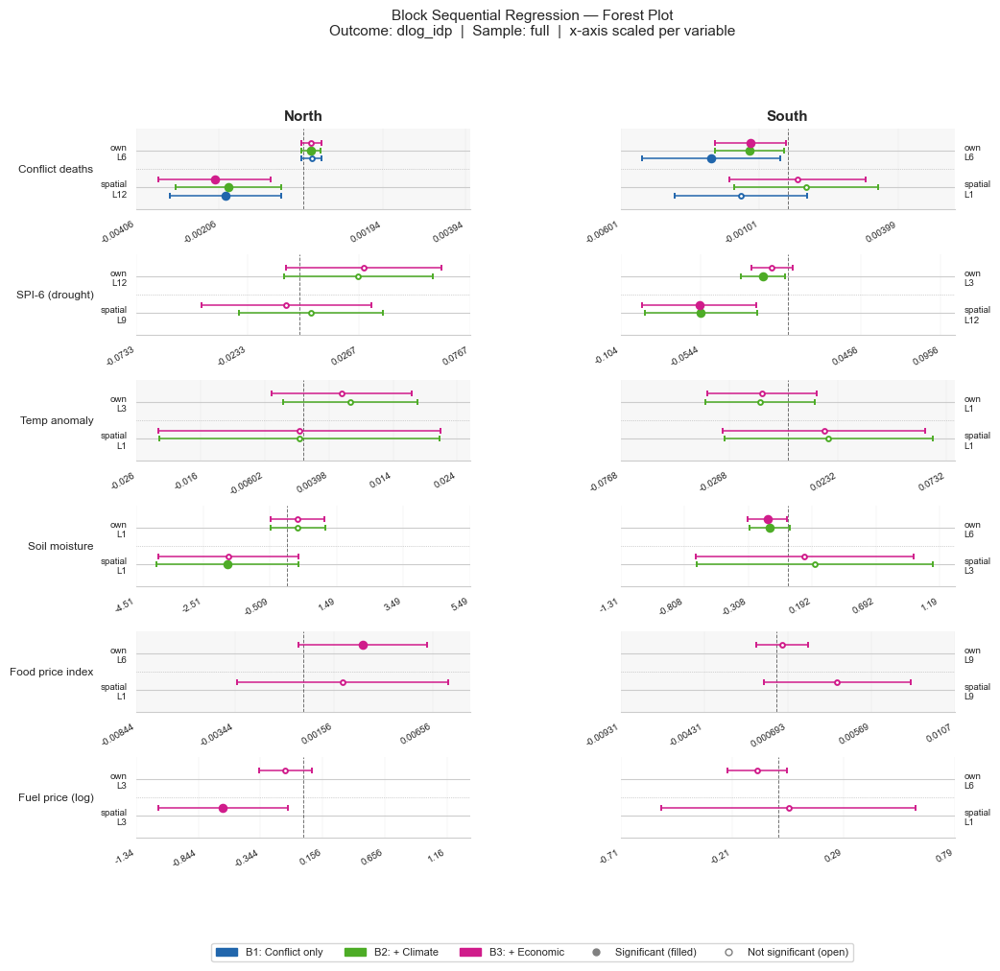

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# ── CONFIG ────────────────────────────────────────────────────────────────────
BLOCKS_ORDER = ['B1_conflict', 'B2_climate', 'B3_full']
BLOCK_LABELS = {'B1_conflict': 'B1: Conflict only',
                'B2_climate' : 'B2: + Climate',
                'B3_full'    : 'B3: + Economic'}
BLOCK_COLORS = {'B1_conflict': '#2166ac',
                'B2_climate' : '#4dac26',
                'B3_full'    : '#d01c8b'}
REGIONS      = ['North', 'South']
SAMPLE       = 'full'
WTYPES       = ['own', 'spatial']

VAR_ORDER = [
    'total_best_deaths',
    'spi6',
    't2m_max_anom_1m',
    'sm1_anom_1m',
    'inflation_food_price_index',
    'ln_c_fuel_gas',
]
VAR_LABELS = {
    'total_best_deaths'         : 'Conflict deaths',
    'spi6'                      : 'SPI-6 (drought)',
    't2m_max_anom_1m'           : 'Temp anomaly',
    'sm1_anom_1m'               : 'Soil moisture',
    'inflation_food_price_index': 'Food price index',
    'ln_c_fuel_gas'             : 'Fuel price (log)',
}

# ── PREP ──────────────────────────────────────────────────────────────────────
plot_df = block_df[
    (block_df['variable'] != '_BLOCK_R2_') &
    (block_df['sample']   == SAMPLE) &
    (block_df['beta'].notna()) &
    (block_df['se'].notna())
].copy()
plot_df['ci_lo'] = plot_df['beta'] - 1.96 * plot_df['se']
plot_df['ci_hi'] = plot_df['beta'] + 1.96 * plot_df['se']

# ── LAYOUT: rows=variables, cols=regions ─────────────────────────────────────
n_vars = len(VAR_ORDER)
n_reg  = len(REGIONS)

fig, axes = plt.subplots(
    n_vars, n_reg,
    figsize=(11, n_vars * 1.6),
    gridspec_kw={'hspace': 0.55, 'wspace': 0.45}
)

# y positions: own on top, spatial below; one row per wtype per block
# layout within each cell:
#   y=2 → own,     y=1 → spatial
#   within each, three blocks offset slightly
WTYPE_BASE = {'own': 2.0, 'spatial': 1.0}
offsets    = np.linspace(-0.22, 0.22, len(BLOCKS_ORDER))

for r_idx, var in enumerate(VAR_ORDER):
    for c_idx, region in enumerate(REGIONS):
        ax = axes[r_idx, c_idx]

        sub = plot_df[
            (plot_df['variable'] == var) &
            (plot_df['region']   == region)
        ]

        all_lo, all_hi = [], []

        for w_idx, wtype in enumerate(WTYPES):
            wsub = sub[sub['w_type'] == wtype]
            y_base = WTYPE_BASE[wtype]

            for b_idx, block in enumerate(BLOCKS_ORDER):
                brow = wsub[wsub['block'] == block]
                if brow.empty:
                    continue
                row   = brow.iloc[0]
                y_pos = y_base + offsets[b_idx]
                color = BLOCK_COLORS[block]
                sig   = bool(row['sig'])

                ax.errorbar(
                    x=row['beta'], y=y_pos,
                    xerr=[[row['beta'] - row['ci_lo']],
                          [row['ci_hi'] - row['beta']]],
                    fmt='o',
                    color=color,
                    markersize=5.5 if sig else 3.5,
                    markerfacecolor=color if sig else 'white',
                    markeredgecolor=color,
                    markeredgewidth=1.4,
                    capsize=2.5,
                    linewidth=1.1, elinewidth=1.1,
                    zorder=3,
                )
                all_lo.append(row['ci_lo'])
                all_hi.append(row['ci_hi'])

        # horizontal separator between own / spatial
        ax.axhline(1.5, color='#aaaaaa', linewidth=0.5, linestyle=':')

        # reference line
        ax.axvline(0, color='black', linewidth=0.7, linestyle='--', alpha=0.55)

        # x limits + ticks: scaled to this variable's CI range
        if all_lo and all_hi:
            xmax = max(abs(min(all_lo)), abs(max(all_hi))) * 1.15
            xmax = max(xmax, 1e-6)
            ax.set_xlim(-xmax, xmax)

            # pick a clean tick step based on xmax
            raw_step = xmax / 2
            magnitude = 10 ** np.floor(np.log10(raw_step))
            for step in [magnitude, 2*magnitude, 5*magnitude, 10*magnitude]:
                if xmax / step <= 3:
                    break
            ticks = [t for t in np.arange(-xmax, xmax + step/2, step)
                     if abs(t) > step * 0.1]   # drop near-zero clutter
            ticks = sorted(set([round(t, 10) for t in ticks]))
            ax.set_xticks(ticks)
            ax.xaxis.set_major_formatter(
                plt.FuncFormatter(lambda v, _: f'{v:.3g}')
            )

        # y axis: label own/spatial + lag info on BOTH cols
        ax.set_ylim(0.4, 2.6)
        ax.set_yticks([1.0, 2.0])

        def get_lag_label(wtype, sub):
            for blk in ['B3_full', 'B2_climate', 'B1_conflict']:
                row = sub[(sub['w_type'] == wtype) & (sub['block'] == blk)]
                if not row.empty and pd.notna(row.iloc[0]['var_col']):
                    col = row.iloc[0]['var_col']
                    parts = col.split('_L')
                    lag_str = f'L{parts[-1]}' if len(parts) > 1 else col
                    return f'{wtype}\n{lag_str}'
            return wtype

        # show lag labels on left side of each region column
        # for South (c_idx==1): show on right spine instead to avoid overlap
        if c_idx == 0:
            ax.set_yticklabels(
                [get_lag_label('spatial', sub), get_lag_label('own', sub)],
                fontsize=7
            )
            ax.yaxis.set_tick_params(labelleft=True, labelright=False)
        else:
            ax.set_yticklabels(
                [get_lag_label('spatial', sub), get_lag_label('own', sub)],
                fontsize=7
            )
            ax.yaxis.set_tick_params(labelleft=False, labelright=True)
            ax.yaxis.set_label_position('right')

        # row label (variable name) — leftmost col only
        if c_idx == 0:
            ax.set_ylabel(VAR_LABELS[var], fontsize=8.5,
                          rotation=0, ha='right', va='center',
                          labelpad=5)

        # column header — top row only
        if r_idx == 0:
            ax.set_title(region, fontsize=11, fontweight='bold', pad=6)

        # x tick labels — every row, small font
        ax.tick_params(axis='x', labelsize=7)
        plt.setp(ax.get_xticklabels(), rotation=30, ha='right')

        # light shading alternating rows
        if r_idx % 2 == 0:
            ax.set_facecolor('#f7f7f7')
        else:
            ax.set_facecolor('white')

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.tick_params(left=False)
        ax.grid(axis='x', linewidth=0.3, alpha=0.4)

# ── LEGEND ────────────────────────────────────────────────────────────────────
legend_elements = [
    mpatches.Patch(color=BLOCK_COLORS[b], label=BLOCK_LABELS[b])
    for b in BLOCKS_ORDER
] + [
    plt.Line2D([0], [0], marker='o', color='grey',
               markerfacecolor='grey', markersize=5,
               label='Significant (filled)', linewidth=0),
    plt.Line2D([0], [0], marker='o', color='grey',
               markerfacecolor='white', markeredgecolor='grey',
               markersize=5, label='Not significant (open)', linewidth=0),
]
fig.legend(
    handles=legend_elements,
    loc='lower center', ncol=5,
    fontsize=8, frameon=True,
    bbox_to_anchor=(0.5, -0.03),
)

outcome_label = plot_df['outcome_var'].iloc[0] if len(plot_df) else ''
fig.suptitle(
    f'Block Sequential Regression — Forest Plot\n'
    f'Outcome: {outcome_label}  |  Sample: {SAMPLE}  |  '
    f'x-axis scaled per variable',
    fontsize=11, y=1.01
)

plt.show()


Loaded 75 survivor rows
Groups (6): ['conflict', 'drought', 'economic', 'soil', 'temperature', 'vegetation']


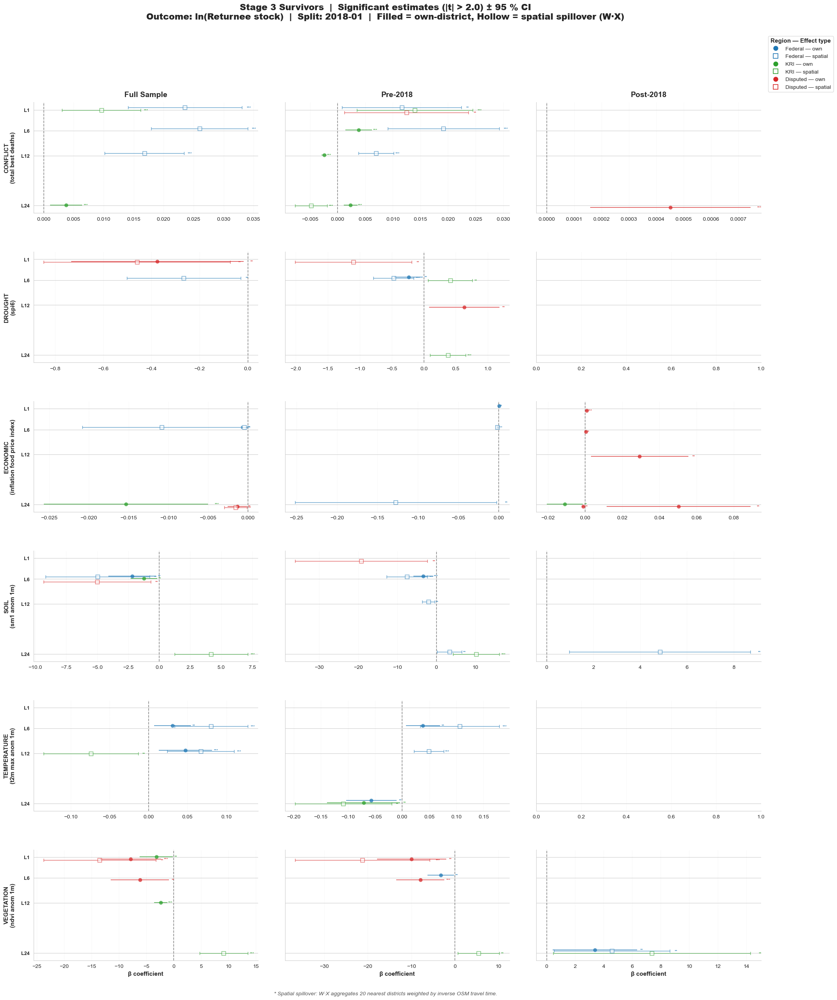

Saved: C:\Users\ck24\OneDrive - Johns Hopkins\climate-displacement-health\projects\01_displacement_modelling_iraq\data\processed\coef_plots_stage3\coef_all_groups_unified.png


In [ ]:
# ============================================================================
# UNIFIED SURVIVOR COEFFICIENT PLOT — All groups in one figure
# Layout: rows = variable group, cols = sample (full / pre2018 / post2018)
# Within each cell: y = lag, color = region, marker = own vs spatial
# ============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import seaborn as sns
from pathlib import Path

# ── 0. CONFIG ─────────────────────────────────────────────────────────────────
FILE_PATH = (PROCESSED_DIR /
             'stage3_by_region_ln_ret' /
             'stage3_region_survivors.csv')
OUT_DIR   = PROCESSED_DIR / 'coef_plots_stage3'
OUT_DIR.mkdir(parents=True, exist_ok=True)

SAMPLE_ORDER = ['full', 'pre2018', 'post2018']
COL_TITLES   = ['Full Sample', 'Pre-2018', 'Post-2018']
REGION_ORDER = ['Federal', 'KRI', 'Disputed']
REGION_COLOR = {'Federal': '#1f77b4', 'KRI': '#2ca02c', 'Disputed': '#d62728'}

# Jitter: region offsets on y, w_type offsets nested within region
REGION_JITTER = {'Federal': -0.6, 'KRI': 0.0, 'Disputed': +0.6}
W_JITTER      = {'own': -0.12, 'spatial': +0.12}
SHOCK_MARKER  = {'own': 'o', 'spatial': 's'}

# ── 1. LOAD & PREP ────────────────────────────────────────────────────────────
df = pd.read_csv(FILE_PATH)
df['se'] = np.where(df['tstat'].abs() > 0,
                    df['beta'].abs() / df['tstat'].abs(), np.nan)
df['ci'] = 1.96 * df['se']

GROUP_ORDER = sorted(df['group'].unique())
n_groups    = len(GROUP_ORDER)

print(f'Loaded {len(df)} survivor rows')
print(f'Groups ({n_groups}): {GROUP_ORDER}')

# ── 2. BUILD FIGURE ──────────────────────────────────────────────────────────
sns.set_style('whitegrid')

fig, axes = plt.subplots(
    n_groups, 3,
    figsize=(24, 4.2 * n_groups),
    sharey=True, sharex=False,
)
if n_groups == 1:
    axes = axes[np.newaxis, :]  # ensure 2-D

all_lags = sorted(df['lag'].unique())

for row_idx, group in enumerate(GROUP_ORDER):
    gdf      = df[df['group'] == group]
    var_name = gdf['variable'].iloc[0]

    for col_idx, sample in enumerate(SAMPLE_ORDER):
        ax  = axes[row_idx][col_idx]
        sub = gdf[gdf['sample'] == sample]

        ax.axvline(0, color='black', lw=1.2, ls='--', alpha=0.45, zorder=1)

        for region in REGION_ORDER:
            for w_type in ['own', 'spatial']:
                ws = sub[(sub['region'] == region) &
                         (sub['w_type'] == w_type)].copy()
                if ws.empty:
                    continue

                y_pos = ws['lag'] + REGION_JITTER[region] + W_JITTER[w_type]

                ax.errorbar(
                    ws['beta'], y_pos,
                    xerr=ws['ci'],
                    fmt=SHOCK_MARKER[w_type],
                    color=REGION_COLOR[region],
                    capsize=3, elinewidth=1.3,
                    markersize=7,
                    alpha=0.75 if w_type == 'own' else 0.55,
                    markeredgewidth=0 if w_type == 'own' else 1.2,
                    markerfacecolor=(REGION_COLOR[region]
                                    if w_type == 'own' else 'white'),
                    markeredgecolor=REGION_COLOR[region],
                    linestyle='', zorder=3,
                )
                # Significance stars
                for _, r in ws.iterrows():
                    if r['sig']:
                        ax.text(
                            r['beta'] + r['ci'] * 1.08,
                            r['lag'] + REGION_JITTER[region] + W_JITTER[w_type],
                            r['sig'], fontsize=7,
                            color=REGION_COLOR[region],
                            va='center', ha='left',
                        )

        # ── titles / labels ──
        if row_idx == 0:
            ax.set_title(COL_TITLES[col_idx], fontsize=14,
                         fontweight='bold', pad=10)
        if col_idx == 0:
            ax.set_ylabel(f'{group.upper()}\n({var_name.replace("_"," ")})',
                          fontsize=11, fontweight='bold', labelpad=10)
        if row_idx == n_groups - 1:
            ax.set_xlabel('β coefficient', fontsize=11, fontweight='bold')

        # Y ticks
        ax.set_yticks(all_lags)
        ax.set_yticklabels([f'L{l}' for l in all_lags],
                           fontweight='bold', fontsize=9)
        ax.grid(axis='x', ls=':', alpha=0.35)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

# Invert y so short lags at top
axes[0][0].set_ylim(max(all_lags) + 1.8, min(all_lags) - 1.8)

# ── 3. LEGEND ─────────────────────────────────────────────────────────────────
legend_els = []
for region in REGION_ORDER:
    legend_els.append(
        mlines.Line2D([0],[0], color=REGION_COLOR[region], marker='o',
                      linestyle='', markersize=8,
                      label=f'{region} — own')
    )
    legend_els.append(
        mlines.Line2D([0],[0], color=REGION_COLOR[region], marker='s',
                      markerfacecolor='white', markeredgecolor=REGION_COLOR[region],
                      markeredgewidth=1.2, linestyle='', markersize=8,
                      label=f'{region} — spatial')
    )

leg = fig.legend(
    handles=legend_els, loc='upper right',
    bbox_to_anchor=(0.98, 0.98), ncol=1, fontsize=10,
    frameon=True, edgecolor='lightgray',
    title='Region — Effect type',
)
leg.get_title().set_fontweight('bold')
leg.get_title().set_fontsize(11)

fig.suptitle(
    'Stage 3 Survivors  |  Significant estimates (|t| > 2.0) ± 95 % CI\n'
    'Outcome: ln(Returnee stock)  |  Split: 2018-01  |  '
    'Filled = own-district, Hollow = spatial spillover (W·X)',
    fontsize=16, fontweight='black', y=1.01,
)
fig.text(
    0.5, 0.005,
    '* Spatial spillover: W·X aggregates 20 nearest districts '
    'weighted by inverse OSM travel time.',
    ha='center', fontsize=10, style='italic', color='#555555',
)

plt.subplots_adjust(top=0.91, bottom=0.04, hspace=0.35, wspace=0.12)

fname = OUT_DIR / 'coef_all_groups_unified.png'
plt.savefig(fname, dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved: {fname}')